# Measuring emission line fluxes

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import corner
import lmfit
from lmfit import minimize, Parameters
from astropy.io import fits

import uncertainties.umath as uum
from uncertainties import ufloat
from uncertainties import unumpy as upy

import os
import sys
magePath = '/home/benjamin/Documents/analogs/'
os.sys.path.append(magePath)

from magE.directMethod import directT, run_all
from magE.functions import mergeSpec, gaussian, to_vel, FWHM, dV, save_catalog
from magE.plotutils import * 
from magE.constutils import *

PATH = '/home/benjamin/Documents/analogs/specs/final_spec/'
os.chdir(PATH)
os.getcwd()

'/home/benjamin/Documents/analogs/specs/final_spec'

In [2]:
# For intrinsic broadening
# J0021 merged specs in 4976

wcal_red = fits.open('/home/benjamin/Documents/pypeit18/redux_J0021/red/magellan_mage_A/Calibrations/WaveCalib_A_0_DET01.fits')
wcal_blue = fits.open('/home/benjamin/Documents/pypeit18/redux_J0021/blue/magellan_mage_A/Calibrations/WaveCalib_A_0_DET01.fits')

In [3]:
# read the data
import pandas as pd
galname = 'J0021'
j0021 = pd.read_csv(galname + '.csv')

wave = j0021['wave'].to_numpy()
flux = j0021['flux'].to_numpy()
err = j0021['noise'].to_numpy()
igal = np.argmax(np.array(galnames) == 'J0021')

class SpecPiece(object):
    
    def __init__(self, name, wavelength, flux, noise):
        self.name = name
        self.wavelength = wavelength
        self.flux = flux
        self.noise = noise

# Main lines
        
# [NII]6548 + Ha + [NII]6584
select = (wave > 7160) * (wave < 7265)
ha_nii = SpecPiece('ha+nii', wave[select], flux[select], err[select])

# [OIII]5007
select = (wave > 5470) * (wave < 5535)
oiii_hei = SpecPiece('oiii+hei', wave[select], flux[select], err[select])


# Low ionization lines

# [OII]7319 + [OII]7330
select = (wave > 8020) * (wave < 8080)
#select = (wave > 7920) * (wave < 8180)
oii_7320 = SpecPiece('oii7330', wave[select], flux[select], err[select])

# HeI7065
select = (wave > 7710) * (wave < 7810)
hei_7065 = SpecPiece('hei7065', wave[select], flux[select], err[select])

# HeI6678
select = (wave > 7305) * (wave < 7365)
hei_6678 = SpecPiece('hei6678', wave[select], flux[select], err[select])

# [SII]6716 + [SII]6731
select = (wave > 7345) * (wave < 7435)
sii = SpecPiece('sii', wave[select], flux[select], err[select])

# HeI5875
select = (wave > 6410) * (wave < 6500)
hei_5875 = SpecPiece('hei5875', wave[select], flux[select], err[select])

# [NII]5755
select = (wave > 6310) * (wave < 6340)
nii_5755 = SpecPiece('nii5755', wave[select], flux[select], err[select])

# Hb
select = (wave > 5315) * (wave < 5365)
hbeta = SpecPiece('hb', wave[select], flux[select], err[select])

# HeI4471
select = (wave > 4900) * (wave < 4925)
hei_4471 = SpecPiece('hei4471', wave[select], flux[select], err[select])

# Hg
select = (wave > 4755) * (wave < 4785)
hgamma = SpecPiece('hg', wave[select], flux[select], err[select])

# Hd
select = (wave > 4490) * (wave < 4525)
hdelta = SpecPiece('hd', wave[select], flux[select], err[select])

# [SII]4068 + [SII]4076
select = (wave > 4455) * (wave < 4495)
sii2 = SpecPiece('sii2', wave[select], flux[select], err[select])

# [OII]3726 + [OII]3729
select = (wave > 4080) * (wave < 4110)
oii_3727 = SpecPiece('oii3727', wave[select], flux[select], err[select])

# [OII]
select = ((wave > 4080) * (wave < 4110)) + ((wave > 8020) * (wave < 8080))
oii = SpecPiece('oii', wave[select], flux[select], err[select])

# High Ionization lines

# [SIII]9532
select = (wave > 10425) * (wave < 10520)
siii_9532 = SpecPiece('siiia', wave[select], flux[select], err[select])

# [SIII]9069
select = (wave > 9920) * (wave < 10000)
siii_9069 = SpecPiece('siiib', wave[select], flux[select], err[select])

# [Ar III]7135
select = (wave > 7800) * (wave < 7880)
ariii_7135 = SpecPiece('ariii_7135', wave[select], flux[select], err[select])

# [OI]6300 + [SIII]6312
select = (wave > 6895) * (wave < 6965)
oi_siii = SpecPiece('oi+siiic', wave[select], flux[select], err[select])

# [OIII]4959
select = (wave > 5425) * (wave < 5475)
oiii_4959 = SpecPiece('oiiib', wave[select], flux[select], err[select])

# [Ar IV]4740
select = (wave > 5190) * (wave < 5230)
ariv_7135 = SpecPiece('ariv_4740', wave[select], flux[select], err[select])

# HeII4686
select = (wave > 5130) * (wave < 5170)
heii_4686 = SpecPiece('heii4686', wave[select], flux[select], err[select])

# [Fe III]4658
select = (wave > 5090) * (wave < 5140)
feiii_4658 = SpecPiece('feiii_4658', wave[select], flux[select], err[select])

# [OIII]4363
select = (wave > 4780) * (wave < 4805)
#select = (wave > 4580) * (wave < 5005)
oiii_4363 = SpecPiece('oiiic', wave[select], flux[select], err[select])

# [NeIII]3868
select = (wave > 4235) * (wave < 4265)
neiii_3868 = SpecPiece('neiiia', wave[select], flux[select], err[select])

In [4]:
wave_cat

{'[SIII]9532': 9531.1,
 '[SIII]9069': 9068.6,
 'P11': 8862.89,
 'P12': 8750.46,
 'P13': 8665.02,
 'P14': 8598.39,
 'P15': 8545.38,
 'P16': 8502.49,
 'P17': 8467.26,
 '[OI]8446': 8446.36,
 'P18': 8437.95,
 'P19': 8413.32,
 '[ArIII]7751': 7751.06,
 '[OII]7330': 7330.19,
 '[OII]7319': 7319.92,
 'HeI7281': 7281.349,
 '[ArIII]7135': 7135.8,
 'HeI7065': 7065.19,
 '[SII]6730': 6730.815,
 '[SII]6716': 6716.44,
 'HeI6678': 6678.151,
 '[NII]6584': 6583.45,
 'Ha': 6562.79,
 '[NII]6548': 6548.05,
 '[OI]6363': 6363.776,
 '[SIII]6312': 6312.06,
 '[OI]6300': 6300.304,
 'HeI5875': 5875.621,
 '[NII]5755': 5754.59,
 'HeI5015': 5015.6783,
 '[OIII]5007': 5006.843,
 '[FeIII]4985': 4985.86,
 '[OIII]4959': 4958.911,
 '4921': 4921.8,
 'Hb': 4861.35,
 '[ArIV]4740': 4740.2,
 '[ArIV]4711': 4711.35,
 'HeII4685': 4685.71,
 '[FeIII]4658': 4658.05,
 'HeI4471': 4471.4802,
 'HeI4388': 4387.9296,
 '[OIII]4363': 4363.209,
 '[FeII]4360': 4359.332,
 'Hg': 4340.472,
 'Hd': 4101.710277,
 '[SII]4076': 4076.349,
 '[SII]4068':

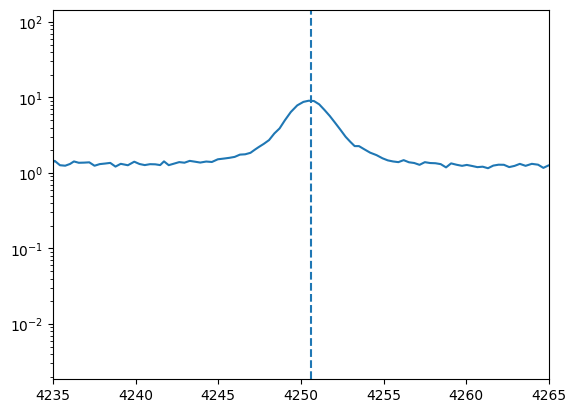

In [5]:
plt.plot(wave, flux / (4.65*1e-16))
plt.xlim(4235, 4265)
plt.axvline((1 + z_BN[igal])*wave_cat['[NeIII]3868'], ls='--')
#plt.axvline((1 + z_BN[igal])*wave_cat['[ArIII]7135'], ls='--')
#plt.axvline((1 + z_BN[igal])*wave_cat['[ArIV]4740'], ls='--')
#plt.axvline((1 + z_BN[igal])*wave_cat['[FeIII]4658'], ls='--')
plt.yscale('log')
#plt.ylim(0.3, 3)

In [6]:
#plt.figure(figsize=(10, 4))
#
## Spectra
#plt.step(wave / (1 + z_nar_oiii_4959), flux / 1e-17, where='mid', color=c[0])
#plt.fill_between(wave / (1 + z_nar_oiii_4959), (flux - err) / 1e-17,
#                                               (flux + err) / 1e-17,
#                 alpha=0.4, color=c[0])
#
#plt.xlim(3650, 5100)
#plt.ylim(0, 200)
#
## Relevant lines
#plt.axvline(wave_cat['[OII]3726'], ls='--', color='gray', lw=1, alpha=0.5)
#plt.axvline(wave_cat['[OII]3729'], ls='--', color='gray', lw=1, alpha=0.5)
#plt.axvline(wave_cat['[NeIII]3868'], ls='--', color='gray', lw=1, alpha=0.5)
#plt.axvline(wave_cat['H8'], ls='--', color='gray', lw=1, alpha=0.5)
#plt.axvline(wave_cat['H7'], ls='--', color='gray', lw=1, alpha=0.5)
#plt.axvline(wave_cat['Hd'], ls='--', color='gray', lw=1, alpha=0.5)
#plt.axvline(wave_cat['Hg'], ls='--', color='gray', lw=1, alpha=0.5)
#plt.axvline(wave_cat['[OIII]4363'], ls='--', color='gray', lw=1, alpha=0.5)
#plt.axvline(wave_cat['Hb'], ls='--', color='gray', lw=1, alpha=0.5)
#plt.axvline(wave_cat['[OIII]4959'], ls='--', color='gray', lw=1, alpha=0.5)
#plt.axvline(wave_cat['[OIII]5007'], ls='--', color='gray', lw=1, alpha=0.5)
#
## Text
#plt.text(wave_cat['[OII]3726'], 210, s='[OII]', rotation=90)
#plt.text(wave_cat['[NeIII]3868'] - 15, 210, s='[NeIII]', rotation=90)
#plt.text(wave_cat['H8'], 210, s=r'H8', rotation=90)
#plt.text(wave_cat['H7'], 210, s=r'H7', rotation=90)
#plt.text(wave_cat['Hd'], 210, s=r'H$\delta$', rotation=90)
#plt.text(wave_cat['Hg'] - 10, 210, s=r'H$\gamma$', rotation=90)
#plt.text(wave_cat['[OIII]4363'], 210, s='[OIII]', rotation=90)
#plt.text(wave_cat['Hb'], 210, s=r'H$\beta$', rotation=90)
#plt.text(wave_cat['[OIII]4959'], 210, s='[OIII]', rotation=90)
#plt.text(wave_cat['[OIII]5007'], 210, s='[OIII]', rotation=90)
#
## Plot rotulation
#plt.xlabel('Rest wavelength (\AA)', fontsize=15)
#plt.ylabel(r'Flux ($10^{-17}$ ergs  cm$^{-2}$ s$^{-1}$ \AA$^{-1}$)', fontsize=15)
#
#plt.tick_params(direction='in', axis='both');
#plt.savefig('/home/benjamin/Documents/analogs/imges/blue_J0021.jpg',
#            bbox_inches='tight', dpi=500)

In [7]:
#plt.figure(figsize=(10, 4))
#
## Spectra
#plt.step(wave / (1 + z_nar_oiii_4959), flux / 1e-17, where='mid', color=c[0])
#plt.fill_between(wave / (1 + z_nar_oiii_4959), (flux - err) / 1e-17,
#                                               (flux + err) / 1e-17,
#                 alpha=0.4, color=c[0])
#
#plt.xlim(6200, 7500)
#plt.ylim(0, 200)
#
## Relevant lines
#plt.axvline(wave_cat['[OI]6300'], ls='--', color='gray', lw=1, alpha=0.5)
#plt.axvline(wave_cat['[SIII]6312'], ls='--', color='gray', lw=1, alpha=0.5)
#plt.axvline(wave_cat['[OI]6363'], ls='--', color='gray', lw=1, alpha=0.5)
#plt.axvline(wave_cat['[NII]6548'], ls='--', color='gray', lw=1, alpha=0.5)
#plt.axvline(wave_cat['Ha'], ls='--', color='gray', lw=1, alpha=0.5)
#plt.axvline(wave_cat['[NII]6584'], ls='--', color='gray', lw=1, alpha=0.5)
#plt.axvline(wave_cat['HeI6678'], ls='--', color='gray', lw=1, alpha=0.5)
#plt.axvline(wave_cat['[SII]6716'], ls='--', color='gray', lw=1, alpha=0.5)
#plt.axvline(wave_cat['[SII]6730'], ls='--', color='gray', lw=1, alpha=0.5)
#plt.axvline(wave_cat['HeI7065'], ls='--', color='gray', lw=1, alpha=0.5)
#plt.axvline(wave_cat['[ArIII]7135'], ls='--', color='gray', lw=1, alpha=0.5)
#plt.axvline(wave_cat['[OII]7319'], ls='--', color='gray', lw=1, alpha=0.5)
#plt.axvline(wave_cat['[OII]7330'], ls='--', color='gray', lw=1, alpha=0.5)
#
#
#
## Text
#plt.text(wave_cat['[OI]6300']-20, 210, s='[OI]', rotation=90)
#plt.text(wave_cat['[SIII]6312'], 210, s='[SIII]', rotation=90)
#plt.text(wave_cat['[OI]6363'], 210, s='[OI]', rotation=90)
#plt.text(wave_cat['[NII]6548']-20, 210, s='[NII]', rotation=90)
#plt.text(wave_cat['Ha']-5, 210, s=r'H$\alpha$', rotation=90)
#plt.text(wave_cat['[NII]6584'], 210, s='[NII]', rotation=90)
#plt.text(wave_cat['HeI6678'], 210, s='HeI', rotation=90)
#plt.text(wave_cat['[SII]6716'], 210, s='[SII]', rotation=90)
#plt.text(wave_cat['HeI7065'], 210, s='HeI', rotation=90)
#plt.text(wave_cat['[ArIII]7135'], 210, s='[ArIII]', rotation=90)
#plt.text(wave_cat['[OII]7319'], 210, s='[OII]', rotation=90)
#
## Plot rotulation
#plt.xlabel('Rest wavelength (\AA)', fontsize=15)
#plt.tick_params(direction='in', axis='both')
#plt.ylabel(r'Flux ($10^{-17}$ ergs  cm$^{-2}$ s$^{-1}$ \AA$^{-1}$)', fontsize=15);
#plt.savefig('/home/benjamin/Documents/analogs/imges/red_J0021.jpg',
#            bbox_inches='tight', dpi=500)

---------

# Two component model fit for [OIII] 4959

In [8]:
wcal_red.info()

Filename: /home/benjamin/Documents/pypeit18/redux_J0021/red/magellan_mage_A/Calibrations/WaveCalib_A_0_DET01.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      13   ()      
  1  SPAT_IDS      1 ImageHDU        26   (9,)   int64   
  2  SPAT_ID-558_WAVEFIT    1 BinTableHDU     40   1R x 6C   [104D, 104D, 104J, 2048D, 2048D, 121D]   
  3  SPAT_ID-558_PYPEITFIT    1 BinTableHDU     36   1R x 6C   [104D, 104D, 1K, 104D, 5D, 104K]   
  4  SPAT_ID-624_WAVEFIT    1 BinTableHDU     40   1R x 6C   [101D, 101D, 101J, 2048D, 2048D, 124D]   
  5  SPAT_ID-624_PYPEITFIT    1 BinTableHDU     36   1R x 6C   [101D, 101D, 1K, 101D, 5D, 101K]   
  6  SPAT_ID-685_WAVEFIT    1 BinTableHDU     40   1R x 6C   [102D, 102D, 102J, 2048D, 2048D, 133D]   
  7  SPAT_ID-685_PYPEITFIT    1 BinTableHDU     36   1R x 6C   [102D, 102D, 1K, 102D, 5D, 102K]   
  8  SPAT_ID-741_WAVEFIT    1 BinTableHDU     40   1R x 6C   [103D, 103D, 103J, 2048D, 2048D, 132D]   
  9  S

(0.0, 2000.0)

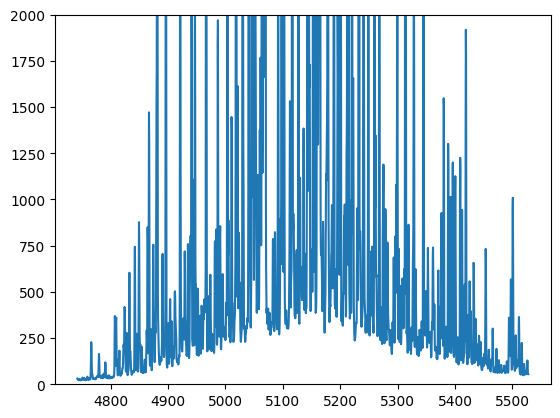

In [9]:
plt.plot(wcal_red[6].data['wave_soln'][0], wcal_red[21].data[:, 2])
#plt.xlim(4786, 4806)
plt.ylim(0, 2000)

# [OIII]4959

### Arc lines

In [10]:
# Select a region of the arc spectra to have a few arc lines around the wavelength of the fitted lines
wlims_4959 = [wave_cat['[OIII]4959']*(1 + z_BN[igal]) - 10, wave_cat['[OIII]4959']*(1 + z_BN[igal]) + 10]
mask_arc_4959 = (wcal_red[8].data['wave_soln'][0] >= wlims_4959[0]) & (wcal_red[8].data['wave_soln'][0] < wlims_4959[1])

# Arc spectra around the fitted line
x_arc_4959 = wcal_red[8].data['wave_soln'][0][mask_arc_4959]
y_arc_4959 = wcal_red[21].data[:, 3][mask_arc_4959]

100%|███████████████████████████████████████| 2500/2500 [00:31<00:00, 78.48it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 6 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [ 87.69633754  40.85882209  80.94711054 116.26560408  60.67675518
  44.22286837  70.37254163  68.28266931]


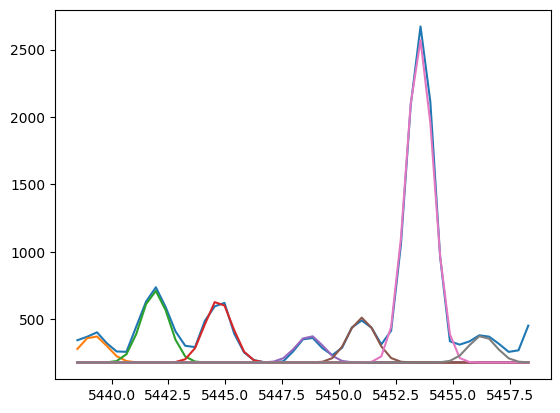

In [11]:
plt.plot(x_arc_4959, y_arc_4959)
plt.plot(x_arc_4959, 180 + gaussian(x_arc_4959, 300, 5439.2, 0, 0.6))
plt.plot(x_arc_4959, 180 + gaussian(x_arc_4959, 800, 5441.9, 0, 0.6))
plt.plot(x_arc_4959, 180 + gaussian(x_arc_4959, 700, 5444.7, 0, 0.6))
plt.plot(x_arc_4959, 180 + gaussian(x_arc_4959, 300, 5448.7, 0, 0.6))
plt.plot(x_arc_4959, 180 + gaussian(x_arc_4959, 500, 5451, 0, 0.6))
plt.plot(x_arc_4959, 180 + gaussian(x_arc_4959, 3600, 5453.55, 0, 0.6))
plt.plot(x_arc_4959, 180 + gaussian(x_arc_4959, 300, 5456.3, 0, 0.6))

params_arc_4959 = Parameters()
params_arc_4959.add('z', value=0.0, vary=False)
params_arc_4959.add('mu1', value=5439.2, vary=False)
params_arc_4959.add('mu2', value=5441.9, vary=False)
params_arc_4959.add('mu3', value=5444.7, vary=False)
params_arc_4959.add('mu4', value=5448.7, vary=False)
params_arc_4959.add('mu5', value=5451, vary=False)
params_arc_4959.add('mu6', value=5453.55, vary=False)
params_arc_4959.add('mu7', value=5456.3, vary=False)
params_arc_4959.add('arc1', value=300, min=0.)
params_arc_4959.add('arc2', value=800, min=0.)
params_arc_4959.add('arc3', value=700, min=0.)
params_arc_4959.add('arc4', value=300, min=0.)
params_arc_4959.add('arc5', value=500, min=0.)
params_arc_4959.add('arc6', value=3600, min=0.)
params_arc_4959.add('arc7', value=300, min=0.)
params_arc_4959.add('sigma', value=0.7, min=0.)
params_arc_4959.add('bkg', value=180, vary=False)

def residual_arc_4959(params_arc_4959, x, data, uncertainty):
    
    z = params_arc_4959['z']
    mu1 = params_arc_4959['mu1']
    mu2 = params_arc_4959['mu2']
    mu3 = params_arc_4959['mu3']
    mu4 = params_arc_4959['mu4']
    mu5 = params_arc_4959['mu5']
    mu6 = params_arc_4959['mu6']
    mu7 = params_arc_4959['mu7']
    flux1 = params_arc_4959['arc1']
    flux2 = params_arc_4959['arc2']
    flux3 = params_arc_4959['arc3']
    flux4 = params_arc_4959['arc4']
    flux5 = params_arc_4959['arc5']
    flux6 = params_arc_4959['arc6']
    flux7 = params_arc_4959['arc7']
    sigma = params_arc_4959['sigma']
    bkg = params_arc_4959['bkg']
    
    x = x_arc_4959
    model1 = gaussian(x, flux1, mu1, z, sigma)
    model2 = gaussian(x, flux2, mu2, z, sigma)
    model3 = gaussian(x, flux3, mu3, z, sigma)
    model4 = gaussian(x, flux4, mu4, z, sigma)
    model5 = gaussian(x, flux5, mu5, z, sigma)
    model6 = gaussian(x, flux6, mu6, z, sigma)
    model7 = gaussian(x, flux7, mu7, z, sigma)
    model = bkg + model1 + model2 + model3 + model4 + model5 + model6 + model7
    return (model - y_arc_4959) / 10

np.random.seed(21)
out_arc_4959 = minimize(residual_arc_4959, params_arc_4959, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10)

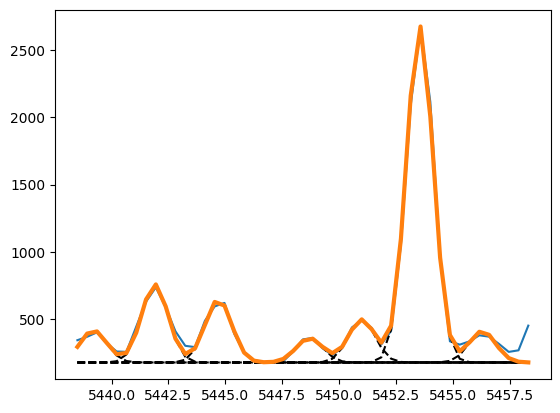

In [12]:
arc1_4959 = out_arc_4959.flatchain.arc1.mean()
arc2_4959 = out_arc_4959.flatchain.arc2.mean()
arc3_4959 = out_arc_4959.flatchain.arc3.mean()
arc4_4959 = out_arc_4959.flatchain.arc4.mean()
arc5_4959 = out_arc_4959.flatchain.arc5.mean()
arc6_4959 = out_arc_4959.flatchain.arc6.mean()
arc7_4959 = out_arc_4959.flatchain.arc7.mean()
sigma_arc_4959 = out_arc_4959.flatchain.sigma.mean()

plt.plot(x_arc_4959, y_arc_4959)

plt.plot(x_arc_4959, 180 + gaussian(x_arc_4959, arc1_4959, 5439.2, 0, sigma_arc_4959), ls='--', color='black')
plt.plot(x_arc_4959, 180 + gaussian(x_arc_4959, arc2_4959, 5441.9, 0, sigma_arc_4959), ls='--', color='black')
plt.plot(x_arc_4959, 180 + gaussian(x_arc_4959, arc3_4959, 5444.7, 0, sigma_arc_4959), ls='--', color='black')
plt.plot(x_arc_4959, 180 + gaussian(x_arc_4959, arc4_4959, 5448.7, 0, sigma_arc_4959), ls='--', color='black')
plt.plot(x_arc_4959, 180 + gaussian(x_arc_4959, arc5_4959, 5451, 0, sigma_arc_4959), ls='--', color='black')
plt.plot(x_arc_4959, 180 + gaussian(x_arc_4959, arc6_4959, 5453.55, 0, sigma_arc_4959), ls='--', color='black')
plt.plot(x_arc_4959, 180 + gaussian(x_arc_4959, arc7_4959, 5456.3, 0, sigma_arc_4959), ls='--', color='black')

plt.plot(x_arc_4959, 180 + gaussian(x_arc_4959, arc1_4959, 5439.2, 0, sigma_arc_4959) \
         + gaussian(x_arc_4959, arc2_4959, 5441.9, 0, sigma_arc_4959) \
         + gaussian(x_arc_4959, arc3_4959, 5444.7, 0, sigma_arc_4959) \
         + gaussian(x_arc_4959, arc4_4959, 5448.7, 0, sigma_arc_4959) \
         + gaussian(x_arc_4959, arc5_4959, 5451, 0, sigma_arc_4959) \
         + gaussian(x_arc_4959, arc6_4959, 5453.55, 0, sigma_arc_4959) \
         + gaussian(x_arc_4959, arc7_4959, 5456.3, 0, sigma_arc_4959), lw=3
)

### Line fitting

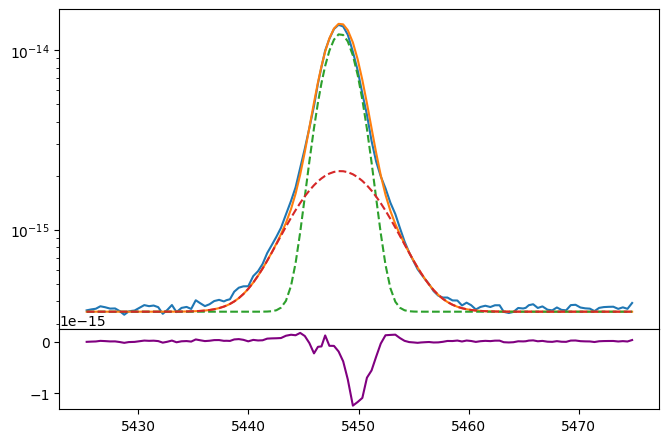

In [13]:
# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.plot(oiii_4959.wavelength, oiii_4959.flux)
bkg = 35e-17

oiiib_nar = gaussian(oiii_4959.wavelength, 4500e-17, wave_cat['[OIII]4959'], z=z_BN[igal], sigma=1.5)
oiiib_brd = gaussian(oiii_4959.wavelength, 1600e-17, wave_cat['[OIII]4959'], z=z_BN[igal], sigma=3.6)

ax.plot(oiii_4959.wavelength, bkg + oiiib_nar + oiiib_brd)
ax.plot(oiii_4959.wavelength, bkg + oiiib_nar, ls='--')
ax.plot(oiii_4959.wavelength, bkg + oiiib_brd, ls='--')
ax1.plot(oiii_4959.wavelength, oiii_4959.flux - bkg - oiiib_nar - oiiib_brd, color='purple')
ax.set_yscale('log')

In [14]:
params_oiii_4959 = Parameters()
params_oiii_4959.add('z_nar', value=z_BN[igal])
params_oiii_4959.add('z_brd', value=z_BN[igal])
params_oiii_4959.add('sigma_nar', value=1.5, min=0.)
params_oiii_4959.add('sigma_brd', value=3.6, min=0.)
params_oiii_4959.add('Oiiib_nar', value=4500e-17, min=0.)
params_oiii_4959.add('Oiiib_brd', value=1600e-17, min=0.)
params_oiii_4959.add('bkg', value=35e-17, min=0.)


def residual_oiii_4959(params_oiii_4959, x, data, uncertainty):
    
    z_nar = params_oiii_4959['z_nar']
    z_brd = params_oiii_4959['z_brd']
    sigma_nar = params_oiii_4959['sigma_nar']
    sigma_brd = params_oiii_4959['sigma_brd']
    oiiib_nar = params_oiii_4959['Oiiib_nar']
    oiiib_brd = params_oiii_4959['Oiiib_brd']
    bkg = params_oiii_4959['bkg']
    
    x = oiii_4959.wavelength
    model = gaussian(x, oiiib_nar, wave_cat['[OIII]4959'], z_nar, sigma_nar) \
          + gaussian(x, oiiib_brd, wave_cat['[OIII]4959'], z_brd, sigma_brd)
    
    return (model + bkg - oiii_4959.flux) / oiii_4959.noise

In [15]:
np.random.seed(21)
out_oiii_4959 = minimize(residual_oiii_4959, params_oiii_4959, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|██████████████████████████████████████| 2500/2500 [00:17<00:00, 139.61it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 6 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [ 33.26731302  57.43484089 146.07777983 169.69835989 159.96171546
 165.16319463 145.43672894]


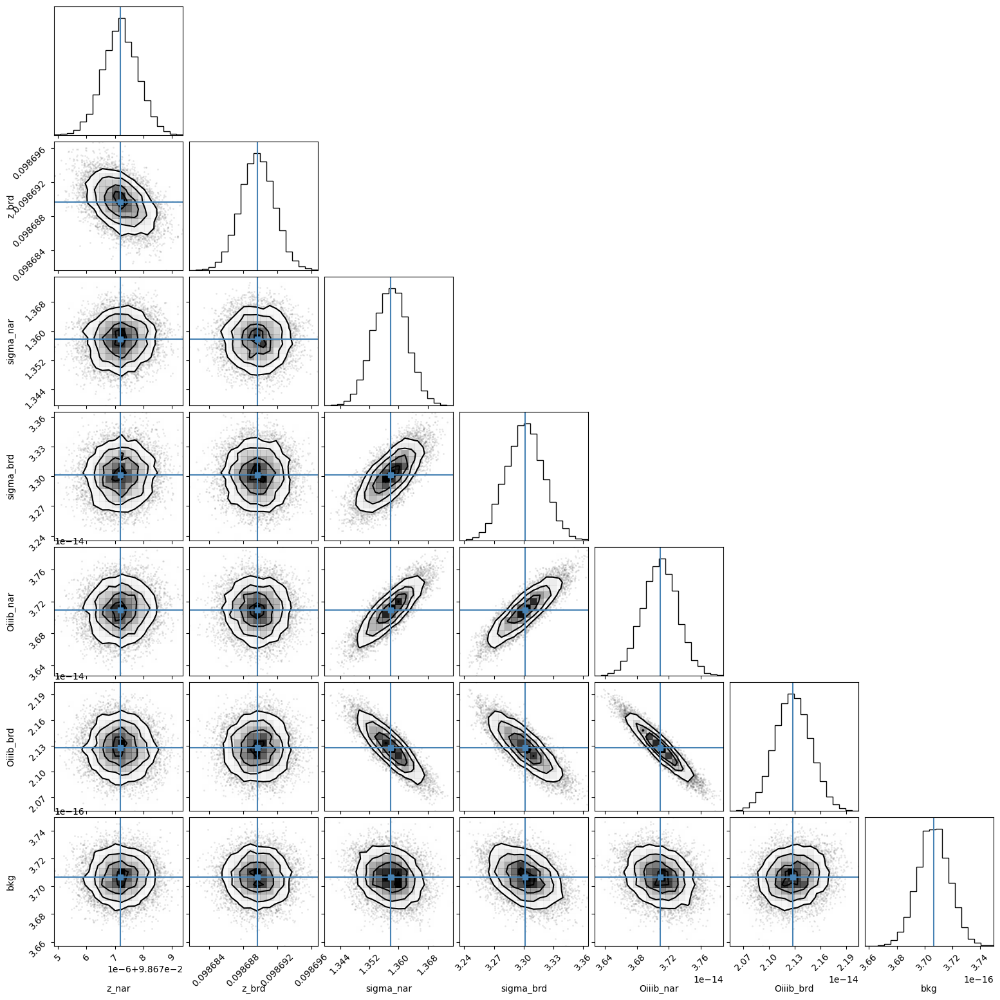

In [16]:
corner.corner(out_oiii_4959.flatchain, labels=out_oiii_4959.var_names,
             truths=list(out_oiii_4959.params.valuesdict().values()));
#plt.savefig(fname='corner_ha.jpg', bbox_inches='tight')

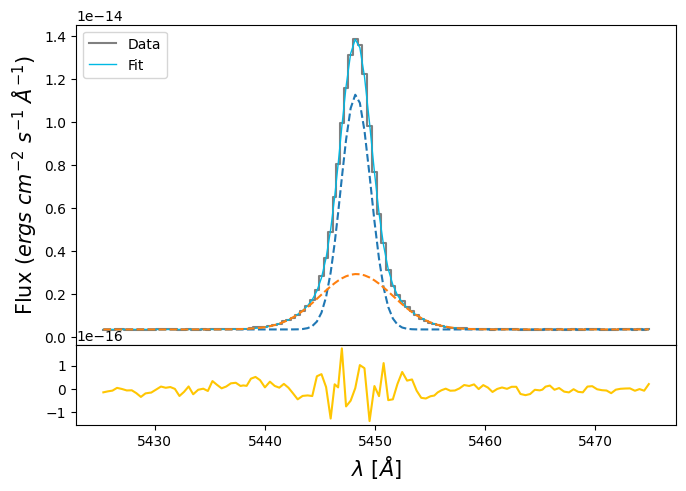

In [17]:
oiiib_nar_flux = out_oiii_4959.flatchain.Oiiib_nar.mean()
oiiib_nar_std = out_oiii_4959.flatchain.Oiiib_nar.std()

oiiib_brd_flux = out_oiii_4959.flatchain.Oiiib_brd.mean()
oiiib_brd_std = out_oiii_4959.flatchain.Oiiib_brd.std()

bkg_oiii_4959 = out_oiii_4959.flatchain.bkg.mean()
bkg_oiii_4959_std = out_oiii_4959.flatchain.bkg.std()

z_nar_oiii_4959 = out_oiii_4959.flatchain.z_nar.mean()
z_nar_oiii_4959_std = out_oiii_4959.flatchain.z_nar.std()

z_brd_oiii_4959 = out_oiii_4959.flatchain.z_brd.mean()
z_brd_oiii_4959_std = out_oiii_4959.flatchain.z_brd.std()

sigma_nar_oiii_4959 = out_oiii_4959.flatchain.sigma_nar.mean()
sigma_nar_oiii_4959_std = out_oiii_4959.flatchain.sigma_nar.std()

sigma_brd_oiii_4959 = out_oiii_4959.flatchain.sigma_brd.mean()
sigma_brd_oiii_4959_std = out_oiii_4959.flatchain.sigma_brd.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(oiii_4959.wavelength, oiii_4959.flux,
            color='gray', label='Data', where='mid')

oiiib_nar = gaussian(oiii_4959.wavelength, oiiib_nar_flux, wave_cat['[OIII]4959'], z_nar_oiii_4959, sigma_nar_oiii_4959)
oiiib_brd = gaussian(oiii_4959.wavelength, oiiib_brd_flux, wave_cat['[OIII]4959'], z_brd_oiii_4959, sigma_brd_oiii_4959)
oiiib = oiiib_nar + oiiib_brd

ax.plot(oiii_4959.wavelength, bkg_oiii_4959 + oiiib,
        lw=1, color=c[0], label='Fit')
ax.plot(oiii_4959.wavelength, bkg_oiii_4959 + oiiib_nar, ls='--')
ax.plot(oiii_4959.wavelength, bkg_oiii_4959 + oiiib_brd, ls='--')
ax1.plot(oiii_4959.wavelength, oiii_4959.flux - bkg_oiii_4959 - oiiib,
         color=c[3])
ax.set_ylabel(r'Flux ($ergs\ cm^{-2}\  s^{-1}\ \AA^{-1}$)', fontsize=15)
ax1.set_xlabel(r'$\lambda$ [$\AA$]', fontsize=15)
ax.legend(loc='upper left')

Text(0.5, 1.0, '[OIII]$\\lambda$4959')

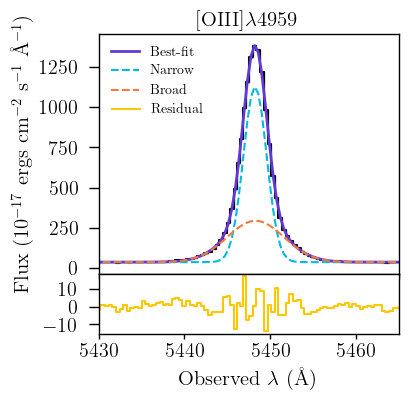

In [18]:
texPlot('on')
fig = plt.figure(1)
fig.set_size_inches(3, 3)
ax = fig.add_axes((0, .2, 1, .8), sharex=ax1)
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(oiii_4959.wavelength, oiii_4959.flux / 1e-17,
            color='black', where='mid')

ax.fill_between(oiii_4959.wavelength, (oiii_4959.flux - oiii_4959.noise) / 1e-17,
                                      (oiii_4959.flux + oiii_4959.noise) / 1e-17,
               step='mid', color='gray', alpha=0.4)

oiiib_nar = gaussian(oiii_4959.wavelength, oiiib_nar_flux, wave_cat['[OIII]4959'], z_nar_oiii_4959, sigma_nar_oiii_4959)
oiiib_brd = gaussian(oiii_4959.wavelength, oiiib_brd_flux, wave_cat['[OIII]4959'], z_brd_oiii_4959, sigma_brd_oiii_4959)
oiiib = oiiib_nar + oiiib_brd

ax.plot(oiii_4959.wavelength, (bkg_oiii_4959 + oiiib) / 1e-17,
        lw=2, color=c[2], label='Best-fit')
ax.plot(oiii_4959.wavelength, (bkg_oiii_4959 + oiiib_nar) / 1e-17, ls='--', label='Narrow', color=c[0])
ax.plot(oiii_4959.wavelength, (bkg_oiii_4959 + oiiib_brd) / 1e-17, ls='--', label='Broad', color=cz[0])
ax1.step(oiii_4959.wavelength, (oiii_4959.flux - bkg_oiii_4959 - oiiib) / 1e-17,
         color=c[3], where='mid', label='Residual')
ax.set_ylabel(r'Flux ($10^{-17}$ ergs  cm$^{-2}$ s$^{-1}$ \AA$^{-1}$)', fontsize=15)
ax1.set_xlabel(r'Observed $\lambda$ (\AA)', fontsize=15)
ax.legend(loc='upper left', fontsize=10)
ax1.legend(loc=(0.025, 3.53), fontsize=10)
ax.set_xticklabels([])
ax.set_xlim(5430, 5465)
ax1.set_xlim(5430, 5465)
ax.set_title(r'[OIII]$\lambda$4959', fontsize=15)
#fig.savefig('/home/benjamin/Documents/analogs/OIII4959_J0021.pdf', bbox_inches='tight')

In [19]:
# Correcting sigma by instrumental broadening

# Intrinsic from the galaxy
sigma_nar_intrinsic = upy.sqrt((ufloat(sigma_nar_oiii_4959, sigma_nar_oiii_4959_std)**2) - (sigma_arc_4959**2))
sigma_brd_intrinsic = upy.sqrt((ufloat(sigma_brd_oiii_4959, sigma_brd_oiii_4959_std)**2) - (sigma_arc_4959**2)) 

In [20]:
# EW
EW_OIII_4959_nar = ufloat(oiiib_nar_flux, oiiib_nar_std) / ufloat(bkg_oiii_4959, bkg_oiii_4959_std)
EW_OIII_4959_brd = ufloat(oiiib_brd_flux, oiiib_brd_std) / ufloat(bkg_oiii_4959, bkg_oiii_4959_std)
EW_OIII_4959 = (ufloat(oiiib_nar_flux, oiiib_nar_std) + ufloat(oiiib_brd_flux, oiiib_brd_std)) / ufloat(bkg_oiii_4959, bkg_oiii_4959_std)

# FWHM
FWHM_4959_nar = FWHM(sigma_nar_intrinsic, wave_cat['[OIII]4959']*(1 + ufloat(z_nar_oiii_4959, z_nar_oiii_4959_std)))
FWHM_4959_brd = FWHM(sigma_brd_intrinsic, wave_cat['[OIII]4959']*(1 + ufloat(z_brd_oiii_4959, z_brd_oiii_4959_std)))

# velocity shift
dV_4959 = dV(ufloat(z_brd_oiii_4959, z_brd_oiii_4959_std),
             ufloat(z_nar_oiii_4959, z_nar_oiii_4959_std))

# Ratio to fix velocity shifts between components
z_ratio = z_brd_oiii_4959 / z_nar_oiii_4959

# Ratio to distribute the flux between components in no detection
brd_to_nar = oiiib_brd_flux / oiiib_nar_flux

# Dispersion for the whole spectra
dLam = (np.max(wave) - np.min(wave)) / len(wave)

In [21]:
print('Redshift of the narrow component: {:.4f}'.format(ufloat(z_nar_oiii_4959, z_nar_oiii_4959_std)))

Redshift of the narrow component: 0.0987+/-0.0000


In [22]:
# Velocities
vel = {'galname': galname,
       'z_nar': z_nar_oiii_4959,
       'dV': dV_4959.nominal_value,
       'dV_err': dV_4959.std_dev,
       'FWHM_nar': FWHM_4959_nar.nominal_value,
       'FWHM_nar_err': FWHM_4959_nar.std_dev,
       'FWHM_brd': FWHM_4959_brd.nominal_value,
       'FWHM_brd_err': FWHM_4959_brd.std_dev
}

vel_catalog_pd = pd.DataFrame(data=vel, index=[0])
save_catalog(galname, vel_catalog_pd, magePath + '/results/vel_catalog.csv')

Existent catalog (.csv) file.
Existent data for J0021, overwriting...
Done.


---------

# [NII]6548 + H$\alpha$ + [NII]6584

### Arc lines

In [23]:
# Select a region of the arc spectra to have a few arc lines around the wavelength of the fitted lines
wlims_ha = [wave_cat['Ha']*(1 + z_BN[igal]) - 10, wave_cat['Ha']*(1 + z_BN[igal]) + 10]
mask_arc_ha = (wcal_red[12].data['wave_soln'][0] >= wlims_ha[0]) & (wcal_red[12].data['wave_soln'][0] < wlims_ha[1])

# Arc spectra around the fitted line
x_arc_ha = wcal_red[12].data['wave_soln'][0][mask_arc_ha]
y_arc_ha = wcal_red[21].data[:, 5][mask_arc_ha]

100%|███████████████████████████████████████| 2500/2500 [00:26<00:00, 93.28it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 5 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [91.41069451 50.79096291 75.65013989 86.51923111 19.68615736 66.6185604 ]


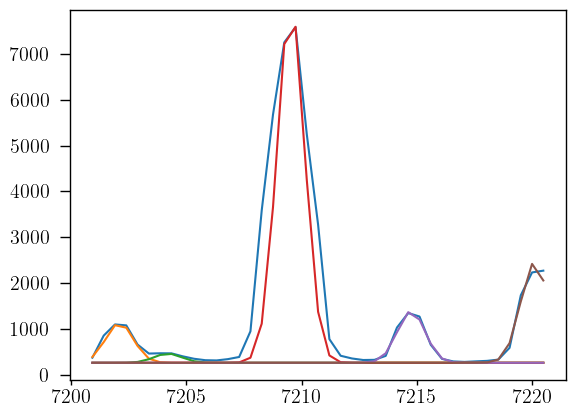

In [24]:
plt.plot(x_arc_ha, y_arc_ha)
plt.plot(x_arc_ha, 260 + gaussian(x_arc_ha, 1300, 7202.1, 0, 0.6))
plt.plot(x_arc_ha, 260 + gaussian(x_arc_ha, 300, 7204.2, 0, 0.6))
plt.plot(x_arc_ha, 260 + gaussian(x_arc_ha, 11700, 7209.53, 0, 0.6))
plt.plot(x_arc_ha, 260 + gaussian(x_arc_ha, 1700, 7214.75, 0, 0.6))
plt.plot(x_arc_ha, 260 + gaussian(x_arc_ha, 3300, 7220.1, 0, 0.6))

params_arc_ha = Parameters()
params_arc_ha.add('z', value=0.0, vary=False)
params_arc_ha.add('mu1', value=7202.1, vary=False)
params_arc_ha.add('mu2', value=7204.2, vary=False)
params_arc_ha.add('mu3', value=7209.53, vary=False)
params_arc_ha.add('mu4', value=7214.75, vary=False)
params_arc_ha.add('mu5', value=7220.1, vary=False)
params_arc_ha.add('arc1', value=1300, min=0.)
params_arc_ha.add('arc2', value=300, min=0.)
params_arc_ha.add('arc3', value=11700, min=0.)
params_arc_ha.add('arc4', value=1700, min=0.)
params_arc_ha.add('arc5', value=3300, min=0.)
params_arc_ha.add('sigma', value=0.6, min=0.)
params_arc_ha.add('bkg', value=260, vary=False)

def residual_arc_ha(params_arc_ha, x, data, uncertainty):
    
    z = params_arc_ha['z']
    mu1 = params_arc_ha['mu1']
    mu2 = params_arc_ha['mu2']
    mu3 = params_arc_ha['mu3']
    mu4 = params_arc_ha['mu4']
    mu5 = params_arc_ha['mu5']
    flux1 = params_arc_ha['arc1']
    flux2 = params_arc_ha['arc2']
    flux3 = params_arc_ha['arc3']
    flux4 = params_arc_ha['arc4']
    flux5 = params_arc_ha['arc5']
    sigma = params_arc_ha['sigma']
    bkg = params_arc_ha['bkg']
    
    x = x_arc_ha
    model1 = gaussian(x, flux1, mu1, z, sigma)
    model2 = gaussian(x, flux2, mu2, z, sigma)
    model3 = gaussian(x, flux3, mu3, z, sigma)
    model4 = gaussian(x, flux4, mu4, z, sigma)
    model5 = gaussian(x, flux5, mu5, z, sigma)
    model = bkg + model1 + model2 + model3 + model4 + model5
    return (model - y_arc_ha) / 10

np.random.seed(21)
out_arc_ha = minimize(residual_arc_ha, params_arc_ha, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10)

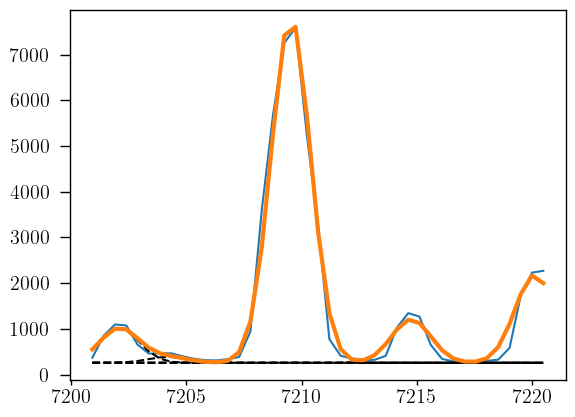

In [25]:
arc1_ha = out_arc_ha.flatchain.arc1.mean()
arc2_ha = out_arc_ha.flatchain.arc2.mean()
arc3_ha = out_arc_ha.flatchain.arc3.mean()
arc4_ha = out_arc_ha.flatchain.arc4.mean()
arc5_ha = out_arc_ha.flatchain.arc5.mean()
sigma_arc_ha = out_arc_ha.flatchain.sigma.mean()

plt.plot(x_arc_ha, y_arc_ha)

plt.plot(x_arc_ha, 260 + gaussian(x_arc_ha, arc1_ha, 7202.1, 0, sigma_arc_ha), ls='--', color='black')
plt.plot(x_arc_ha, 260 + gaussian(x_arc_ha, arc2_ha, 7204.2, 0, sigma_arc_ha), ls='--', color='black')
plt.plot(x_arc_ha, 260 + gaussian(x_arc_ha, arc3_ha, 7209.53, 0, sigma_arc_ha), ls='--', color='black')
plt.plot(x_arc_ha, 260 + gaussian(x_arc_ha, arc4_ha, 7214.75, 0, sigma_arc_ha), ls='--', color='black')
plt.plot(x_arc_ha, 260 + gaussian(x_arc_ha, arc5_ha, 7220.1, 0, sigma_arc_ha), ls='--', color='black')

plt.plot(x_arc_ha, 260 + gaussian(x_arc_ha, arc1_ha, 7202.1, 0, sigma_arc_ha) \
         + gaussian(x_arc_ha, arc2_ha, 7204.2, 0, sigma_arc_ha) \
         + gaussian(x_arc_ha, arc3_ha, 7209.53, 0, sigma_arc_ha) \
         + gaussian(x_arc_ha, arc4_ha, 7214.75, 0, sigma_arc_ha) \
         + gaussian(x_arc_ha, arc5_ha, 7220.1, 0, sigma_arc_ha), lw=3
)

### Line fitting

In [26]:
sigma_nar_ha = upy.sqrt((sigma_nar_intrinsic**2) + (sigma_arc_ha**2))
sigma_brd_ha = upy.sqrt((sigma_brd_intrinsic**2) + (sigma_arc_ha**2))

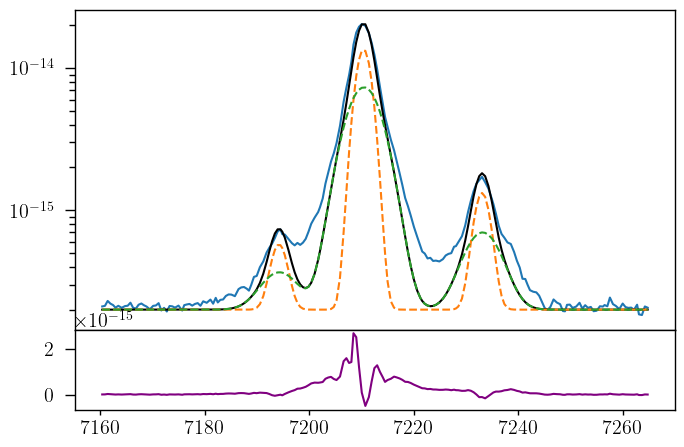

In [27]:
# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.plot(ha_nii.wavelength, ha_nii.flux)
bkg = 2e-16

ha_nar = gaussian(ha_nii.wavelength, 5e-14, wave_cat['Ha'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_ha))
ha_brd = gaussian(ha_nii.wavelength, 6e-14, wave_cat['Ha'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_ha))

niib_nar = gaussian(ha_nii.wavelength, 1.4e-15, wave_cat['[NII]6548'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_ha))
niib_brd = gaussian(ha_nii.wavelength, 1.4e-15, wave_cat['[NII]6548'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_ha))

niia_nar = gaussian(ha_nii.wavelength, 4.2e-15, wave_cat['[NII]6584'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_ha))
niia_brd = gaussian(ha_nii.wavelength, 4.2e-15, wave_cat['[NII]6584'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_ha))

ha = ha_nar + ha_brd
niib = niib_nar + niib_brd
niia = niia_nar + niia_brd

ax.plot(ha_nii.wavelength, bkg + niib + ha + niia, color='black')
ax.plot(ha_nii.wavelength, bkg + niib_nar + ha_nar + niia_nar, ls='--')
ax.plot(ha_nii.wavelength, bkg + niib_brd + ha_brd + niia_brd, ls='--')
ax1.plot(ha_nii.wavelength, ha_nii.flux - bkg - niib - ha - niia, color='purple')

#ax.axvline(7175)
#ax.axvline(7247)
ax.set_yscale('log')

In [28]:
params_ha_nii = Parameters()
params_ha_nii.add('z_nar', value=z_nar_oiii_4959, vary=True)
params_ha_nii.add('z_ratio', value=z_ratio, vary=False)
params_ha_nii.add('sigma_6584_nar', value=upy.nominal_values(sigma_nar_ha), vary=False)
params_ha_nii.add('sigma_6584_brd', value=upy.nominal_values(sigma_brd_ha), vary=False)
params_ha_nii.add('sigma_ha_nar', value=upy.nominal_values(sigma_nar_ha), vary=False)
params_ha_nii.add('sigma_ha_brd', value=upy.nominal_values(sigma_brd_ha), vary=False)
params_ha_nii.add('sigma_6548_nar', value=upy.nominal_values(sigma_nar_ha), vary=False)
params_ha_nii.add('sigma_6548_brd', value=upy.nominal_values(sigma_brd_ha), vary=False)
params_ha_nii.add('Ha_nar', value=5e-14, min=0.)
params_ha_nii.add('Ha_brd', value=6e-14, min=0.)
params_ha_nii.add('Niia_nar', value=4.2e-15, min=0.)
params_ha_nii.add('Niia_brd', value=4.2e-15, min=0.)
params_ha_nii.add('Niib_to_niia', value=1/3, min=0., max=1.)
params_ha_nii.add('bkg', value=2e-16, vary=True)


def residual_ha_nii(params_ha_nii, x, data, uncertainty):
    
    z_nar = params_ha_nii['z_nar']
    z_brd = params_ha_nii['z_nar'] * params_ha_nii['z_ratio']
    sigma_6584_nar = params_ha_nii['sigma_6584_nar']
    sigma_6584_brd = params_ha_nii['sigma_6584_brd']
    sigma_ha_nar = params_ha_nii['sigma_ha_nar']
    sigma_ha_brd = params_ha_nii['sigma_ha_brd']
    sigma_6548_nar = params_ha_nii['sigma_6548_nar']
    sigma_6548_brd = params_ha_nii['sigma_6548_brd']
    ha_nar = params_ha_nii['Ha_nar']
    ha_brd = params_ha_nii['Ha_brd']
    niia_nar = params_ha_nii['Niia_nar']
    niia_brd = params_ha_nii['Niia_brd']
    niib_nar = params_ha_nii['Niia_nar']*params_ha_nii['Niib_to_niia']
    niib_brd = params_ha_nii['Niia_brd']*params_ha_nii['Niib_to_niia']
    bkg = params_ha_nii['bkg']
    
    x = ha_nii.wavelength
    
    model_ha = gaussian(x, ha_nar, wave_cat['Ha'], z_nar, sigma_ha_nar) \
             + gaussian(x, ha_brd, wave_cat['Ha'], z_brd, sigma_ha_brd)
    
    model_niia = gaussian(x, niia_nar, wave_cat['[NII]6584'], z_nar, sigma_6584_nar) \
               + gaussian(x, niia_brd, wave_cat['[NII]6584'], z_brd, sigma_6584_brd)
    
    model_niib = gaussian(x, niib_nar, wave_cat['[NII]6548'], z_nar, sigma_6548_nar) \
               + gaussian(x, niib_brd, wave_cat['[NII]6548'], z_brd, sigma_6548_brd)
    model = model_niib + model_ha + model_niia
    
    return (model + bkg - ha_nii.flux) / ha_nii.noise

In [29]:
np.random.seed(21)
out_ha_nii = minimize(residual_ha_nii, params_ha_nii, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|███████████████████████████████████████| 2500/2500 [00:34<00:00, 71.89it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 6 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [ 39.73963161 165.07141816 136.32806243 180.63808321 161.6162105
 173.4402976   65.08084221]


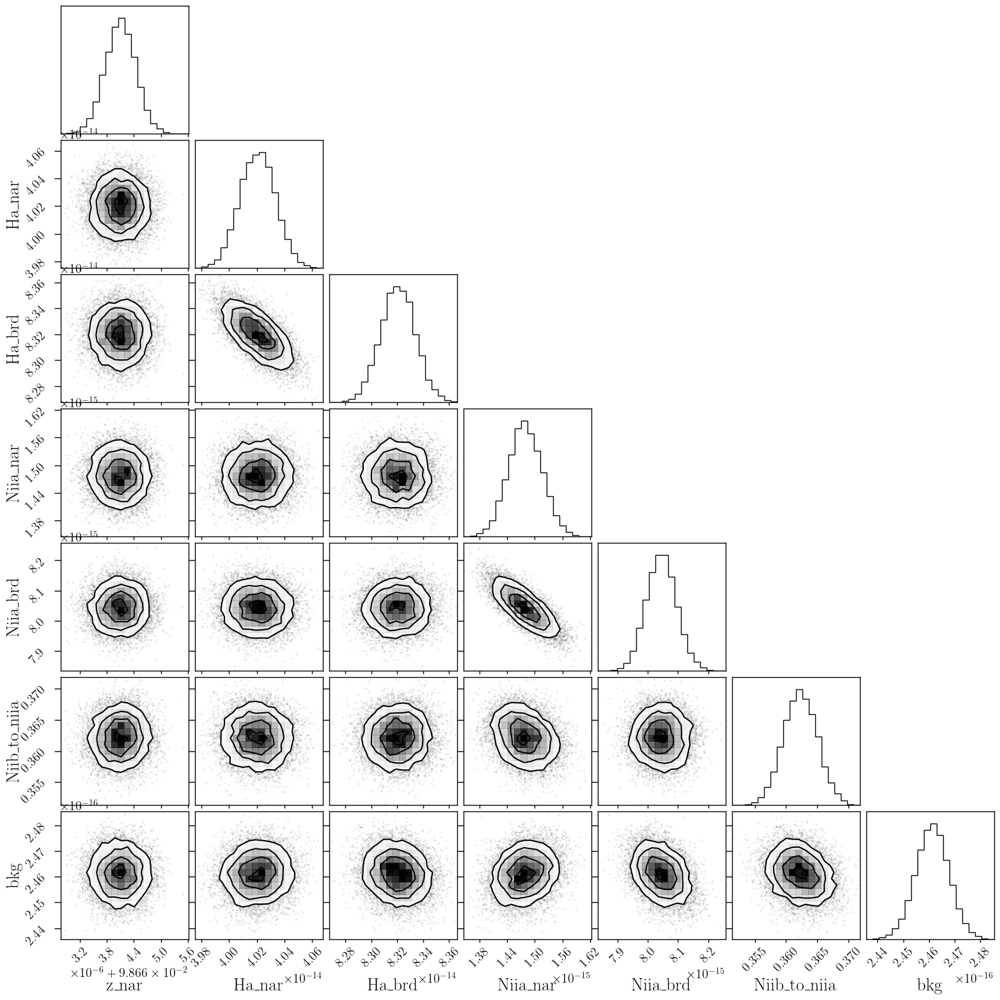

In [30]:
corner.corner(out_ha_nii.flatchain, labels=out_ha_nii.var_names);
#plt.savefig(fname='corner_ha.jpg', bbox_inches='tight')

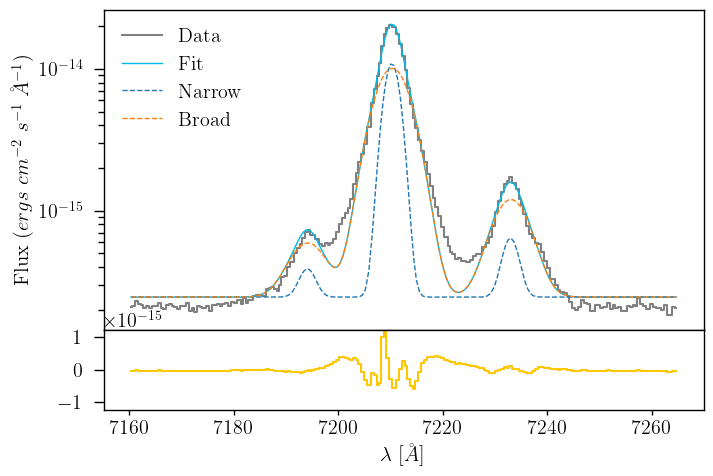

In [31]:
ha_nar_flux = out_ha_nii.flatchain.Ha_nar.mean()
ha_nar_std = out_ha_nii.flatchain.Ha_nar.std()

ha_brd_flux = out_ha_nii.flatchain.Ha_brd.mean()
ha_brd_std = out_ha_nii.flatchain.Ha_brd.std()

niia_nar_flux = out_ha_nii.flatchain.Niia_nar.mean()
niia_nar_std = out_ha_nii.flatchain.Niia_nar.std()

niia_brd_flux = out_ha_nii.flatchain.Niia_brd.mean()
niia_brd_std = out_ha_nii.flatchain.Niia_brd.std()

niib_nar_flux = (niia_nar_flux * out_ha_nii.flatchain.Niib_to_niia).mean()
niib_nar_std = (niia_nar_flux * out_ha_nii.flatchain.Niib_to_niia).std()

niib_brd_flux = (niia_brd_flux * out_ha_nii.flatchain.Niib_to_niia).mean()
niib_brd_std = (niia_brd_flux * out_ha_nii.flatchain.Niib_to_niia).std()

z_ha_nii = out_ha_nii.flatchain.z_nar.mean()
z_ha_nii_std = out_ha_nii.flatchain.z_nar.std()

bkg_ha_nii = out_ha_nii.flatchain.bkg.mean()
bkg_ha_nii_std = out_ha_nii.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(ha_nii.wavelength, ha_nii.flux,
            color='gray', label='Data', where='mid')

ha_nar = gaussian(ha_nii.wavelength, ha_nar_flux, wave_cat['Ha'], z_ha_nii, upy.nominal_values(sigma_nar_ha))
ha_brd = gaussian(ha_nii.wavelength, ha_brd_flux, wave_cat['Ha'], z_ha_nii * z_ratio, upy.nominal_values(sigma_brd_ha))

niia_nar = gaussian(ha_nii.wavelength, niia_nar_flux, wave_cat['[NII]6584'], z_ha_nii, upy.nominal_values(sigma_nar_ha))
niia_brd = gaussian(ha_nii.wavelength, niia_brd_flux, wave_cat['[NII]6584'], z_ha_nii * z_ratio, upy.nominal_values(sigma_brd_ha))

niib_nar = gaussian(ha_nii.wavelength, niib_nar_flux, wave_cat['[NII]6548'], z_ha_nii, upy.nominal_values(sigma_nar_ha))
niib_brd = gaussian(ha_nii.wavelength, niib_brd_flux, wave_cat['[NII]6548'], z_ha_nii * z_ratio, upy.nominal_values(sigma_brd_ha))

niia = niia_nar + niia_brd
ha = ha_nar + ha_brd
niib = niib_nar + niib_brd

ax.plot(ha_nii.wavelength, bkg_ha_nii + niia + ha + niib,
        lw=1, color=c[0], label='Fit')

ax.plot(ha_nii.wavelength, bkg_ha_nii + niia_nar + ha_nar + niib_nar,
        ls='--', lw=1, label='Narrow')
ax.plot(ha_nii.wavelength, bkg_ha_nii + niia_brd + ha_brd + niib_brd,
        ls='--', lw=1, label='Broad')

ax1.step(ha_nii.wavelength, ha_nii.flux - bkg_ha_nii - niia - ha - niib,
         color=c[3], where='mid')
ax1.set_ylim(-5*bkg_ha_nii, 5*bkg_ha_nii)
ax.set_ylabel(r'Flux ($ergs\ cm^{-2}\  s^{-1}\ \AA^{-1}$)', fontsize=15)
ax1.set_xlabel(r'$\lambda$ [$\AA$]', fontsize=15)
ax.set_yscale('log')
ax.legend(loc='upper left')

In [32]:
# EW
EW_Ha_nar = ufloat(ha_nar_flux, ha_nar_std) / ufloat(bkg_ha_nii, bkg_ha_nii_std)
EW_Ha_brd = ufloat(ha_brd_flux, ha_brd_std) / ufloat(bkg_ha_nii, bkg_ha_nii_std)
EW_Ha = (ufloat(ha_nar_flux, ha_nar_std) + ufloat(ha_brd_flux, ha_brd_std)) / ufloat(bkg_ha_nii, bkg_ha_nii_std)

EW_NII_6584_nar = ufloat(niia_nar_flux, niia_nar_std) / ufloat(bkg_ha_nii, bkg_ha_nii_std)
EW_NII_6584_brd = ufloat(niia_brd_flux, niia_brd_std) / ufloat(bkg_ha_nii, bkg_ha_nii_std)
EW_NII_6584 = (ufloat(niia_nar_flux, niia_nar_std) + ufloat(niia_brd_flux, niia_brd_std)) / ufloat(bkg_ha_nii, bkg_ha_nii_std)

EW_NII_6548_nar = ufloat(niib_nar_flux, niib_nar_std) / ufloat(bkg_ha_nii, bkg_ha_nii_std)
EW_NII_6548_brd = ufloat(niib_brd_flux, niib_brd_std) / ufloat(bkg_ha_nii, bkg_ha_nii_std)
EW_NII_6548 = (ufloat(niib_nar_flux, niib_nar_std) + ufloat(niib_brd_flux, niib_brd_std)) / ufloat(bkg_ha_nii, bkg_ha_nii_std)

# [OII]7319 + [OII]7330

### Arc lines

In [33]:
# Select a region of the arc spectra to have a few arc lines around the wavelength of the fitted lines
wlims_7330 = [wave_cat['[OII]7330']*(1 + z_BN[igal]) - 10, wave_cat['[OII]7330']*(1 + z_BN[igal]) + 10]
mask_arc_7330 = (wcal_red[14].data['wave_soln'][0] >= wlims_7330[0]) & (wcal_red[14].data['wave_soln'][0] < wlims_7330[1])

# Arc spectra around the fitted line
x_arc_7330 = wcal_red[14].data['wave_soln'][0][mask_arc_7330]
y_arc_7330 = wcal_red[21].data[:, 6][mask_arc_7330]

100%|██████████████████████████████████████| 2500/2500 [00:20<00:00, 123.48it/s]


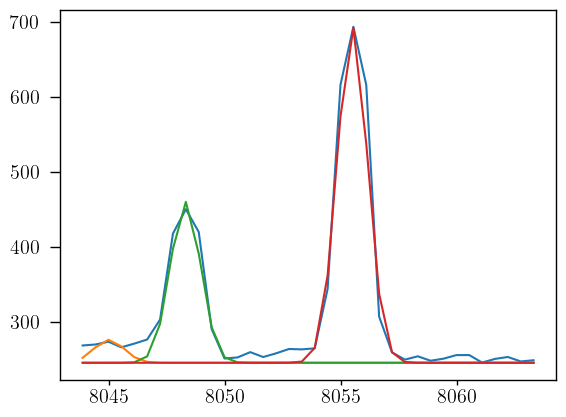

In [34]:
plt.plot(x_arc_7330, y_arc_7330)
plt.plot(x_arc_7330, 245 + gaussian(x_arc_7330, 50, 8045, 0, 0.65))
plt.plot(x_arc_7330, 245 + gaussian(x_arc_7330, 350, 8048.3, 0, 0.65))
plt.plot(x_arc_7330, 245 + gaussian(x_arc_7330, 730, 8055.5, 0, 0.65))

params_arc_7330 = Parameters()
params_arc_7330.add('z', value=0.0, vary=False)
params_arc_7330.add('mu1', value=8045, vary=False)
params_arc_7330.add('mu2', value=8048.3, vary=False)
params_arc_7330.add('mu3', value=8055.5, vary=False)
params_arc_7330.add('arc1', value=50, min=0.)
params_arc_7330.add('arc2', value=350, min=0.)
params_arc_7330.add('arc3', value=730, min=0.)
params_arc_7330.add('sigma', value=0.65, min=0.)
params_arc_7330.add('bkg', value=245, vary=False)

def residual_arc_7330(params_arc_7330, x, data, uncertainty):
    
    z = params_arc_7330['z']
    mu1 = params_arc_7330['mu1']
    mu2 = params_arc_7330['mu2']
    mu3 = params_arc_7330['mu3']
    flux1 = params_arc_7330['arc1']
    flux2 = params_arc_7330['arc2']
    flux3 = params_arc_7330['arc3']
    sigma = params_arc_7330['sigma']
    bkg = params_arc_7330['bkg']
    
    x = x_arc_7330
    model1 = gaussian(x, flux1, mu1, z, sigma)
    model2 = gaussian(x, flux2, mu2, z, sigma)
    model3 = gaussian(x, flux3, mu3, z, sigma)
    model = bkg + model1 + model2 + model3
    return (model - y_arc_7330) / 10

np.random.seed(21)
out_arc_7330 = minimize(residual_arc_7330, params_arc_7330, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10)

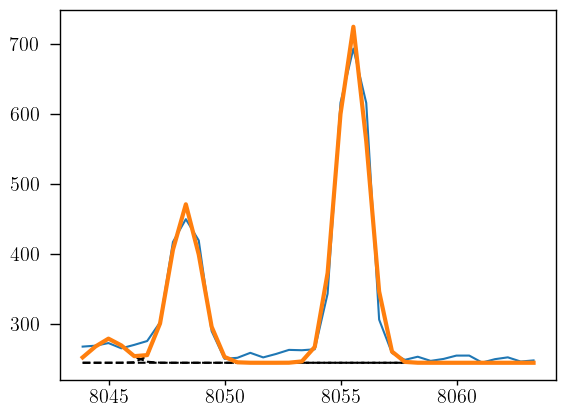

In [35]:
arc1_7330 = out_arc_7330.flatchain.arc1.mean()
arc2_7330 = out_arc_7330.flatchain.arc2.mean()
arc3_7330 = out_arc_7330.flatchain.arc3.mean()
sigma_arc_7330 = out_arc_7330.flatchain.sigma.mean()

plt.plot(x_arc_7330, y_arc_7330)

plt.plot(x_arc_7330, 245 + gaussian(x_arc_7330, arc1_7330, 8045, 0, sigma_arc_7330), ls='--', color='black')
plt.plot(x_arc_7330, 245 + gaussian(x_arc_7330, arc2_7330, 8048.3, 0, sigma_arc_7330), ls='--', color='black')
plt.plot(x_arc_7330, 245 + gaussian(x_arc_7330, arc3_7330, 8055.5, 0, sigma_arc_7330), ls='--', color='black')

plt.plot(x_arc_7330, 245 + gaussian(x_arc_7330, arc1_7330, 8045, 0, sigma_arc_7330) \
         + gaussian(x_arc_7330, arc2_7330, 8048.3, 0, sigma_arc_7330) \
         + gaussian(x_arc_7330, arc3_7330, 8055.5, 0, sigma_arc_7330), lw=3
)

### Line fitting

In [36]:
sigma_nar_7330 = upy.sqrt((sigma_nar_intrinsic**2) + (sigma_arc_7330**2))
sigma_brd_7330 = upy.sqrt((sigma_brd_intrinsic**2) + (sigma_arc_7330**2))

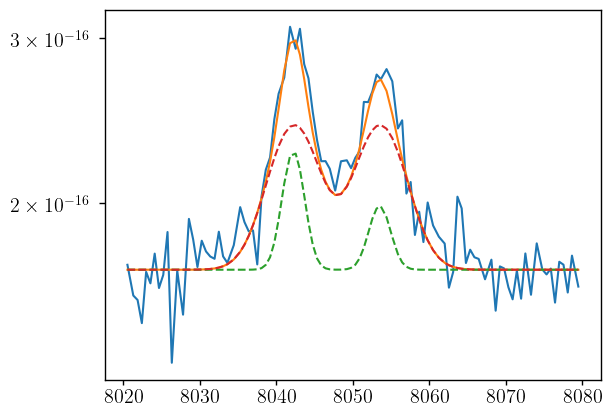

In [37]:
# Search for good initial guess

plt.plot(oii_7320.wavelength, oii_7320.flux)

oiia_nar = gaussian(oii_7320.wavelength, 1e-16, wave_cat['[OII]7330'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_7330))
oiia_brd = gaussian(oii_7320.wavelength, 6e-16, wave_cat['[OII]7330'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_7330))

oiib_nar = gaussian(oii_7320.wavelength, 2e-16, wave_cat['[OII]7319'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_7330))
oiib_brd = gaussian(oii_7320.wavelength, 6e-16, wave_cat['[OII]7319'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_7330))

oiia = oiia_nar + oiia_brd
oiib = oiib_nar + oiib_brd
bkg = 1.7e-16

plt.plot(oii_7320.wavelength, bkg + oiib + oiia)
plt.plot(oii_7320.wavelength, bkg + oiib_nar + oiia_nar, ls='--')
plt.plot(oii_7320.wavelength, bkg + oiib_brd + oiia_brd, ls='--')

plt.yscale('log')

In [38]:
params_oii_7320 = Parameters()

params_oii_7320.add('z_nar', value=z_nar_oiii_4959, vary=True)
params_oii_7320.add('z_ratio', value=z_ratio, vary=False)
params_oii_7320.add('sigma_7330_nar', value=upy.nominal_values(sigma_nar_7330), vary=False)
params_oii_7320.add('sigma_7330_brd', value=upy.nominal_values(sigma_brd_7330), vary=False)
params_oii_7320.add('sigma_7319_nar', value=upy.nominal_values(sigma_nar_7330), vary=False)
params_oii_7320.add('sigma_7319_brd', value=upy.nominal_values(sigma_brd_7330), vary=False)
params_oii_7320.add('Oiia_nar', value=1.0e-16, min=0.)
params_oii_7320.add('Oiia_brd', value=6.0e-16, min=0.)
params_oii_7320.add('Oiib_nar', value=2.0e-16, min=0.)
params_oii_7320.add('Oiib_brd', value=6.0e-16, min=0.)
params_oii_7320.add('bkg', value=1.7e-16, min=0.)

def residual_oii_7320(params_oii_7320, x, data, uncertainty):
    
    z_nar = params_oii_7320['z_nar']
    z_brd = params_oii_7320['z_nar'] * params_oii_7320['z_ratio']
    sigma_7330_nar = params_oii_7320['sigma_7330_nar']
    sigma_7330_brd = params_oii_7320['sigma_7330_brd']
    sigma_7319_nar = params_oii_7320['sigma_7319_nar']
    sigma_7319_brd = params_oii_7320['sigma_7319_brd']
    oiia_nar_flux = params_oii_7320['Oiia_nar']
    oiia_brd_flux = params_oii_7320['Oiia_brd']
    oiib_nar_flux = params_oii_7320['Oiib_nar']
    oiib_brd_flux = params_oii_7320['Oiib_brd']
    bkg = params_oii_7320['bkg']
    
    x = oii_7320.wavelength
    model_oiia = gaussian(x, oiia_nar_flux, wave_cat['[OII]7330'], z_nar, sigma_7330_nar) + \
                 gaussian(x, oiia_brd_flux, wave_cat['[OII]7330'], z_brd, sigma_7330_brd)
    model_oiib = gaussian(x, oiib_nar_flux, wave_cat['[OII]7319'], z_nar, sigma_7319_nar) + \
                 gaussian(x, oiib_brd_flux, wave_cat['[OII]7319'], z_brd, sigma_7319_brd)
    model = model_oiia + model_oiib
    return (model + bkg - oii_7320.flux) / oii_7320.noise

In [39]:
np.random.seed(21)
out_oii_7320 = minimize(residual_oii_7320, params_oii_7320, args=(1, 1, 1),
                         method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|██████████████████████████████████████| 2500/2500 [00:24<00:00, 103.62it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 6 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [52.7635874  51.49779972 58.17950908 58.0262402  61.07355473 54.91196424]


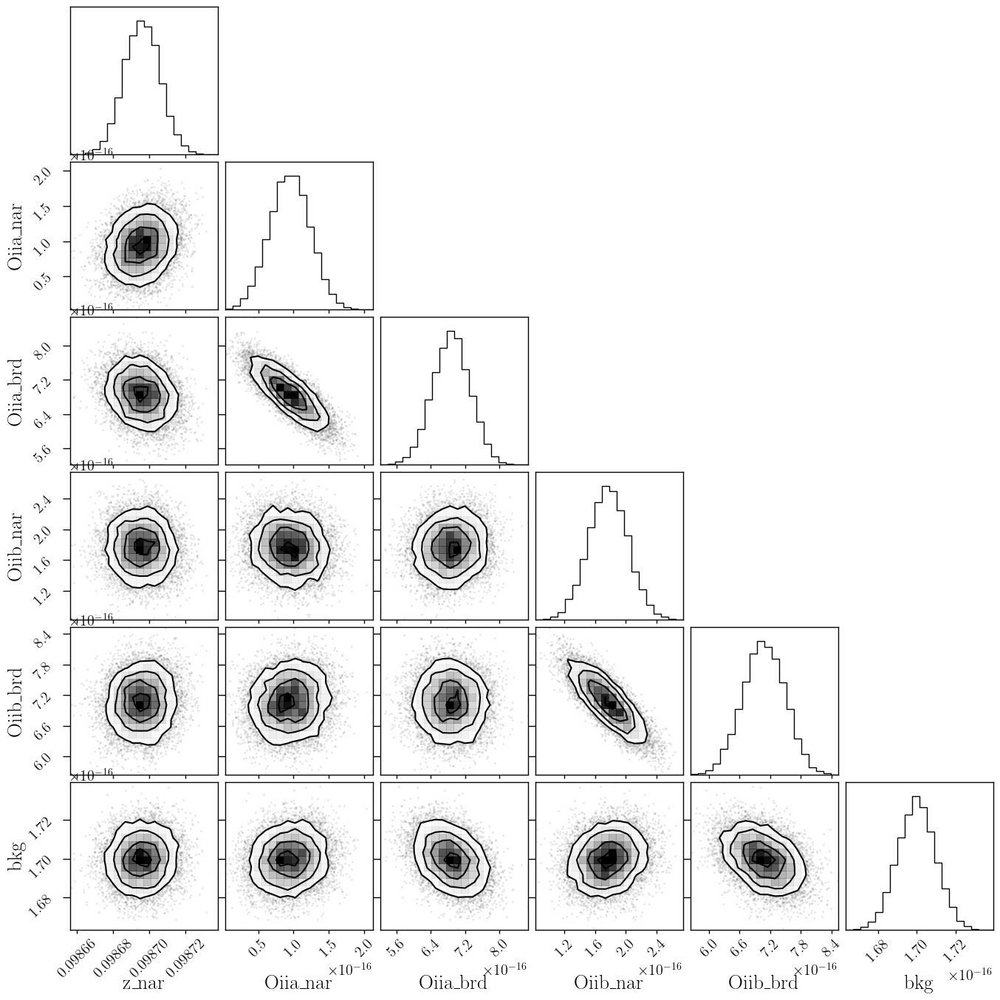

In [40]:
corner.corner(out_oii_7320.flatchain, labels=out_oii_7320.var_names);

In [41]:
out_oii_7320.params

name,value,standard error,relative error,initial value,min,max,vary
z_nar,0.09869593,9.9184e-06,(0.01%),0.09867719705615696,-inf,inf,True
z_ratio,1.00012632,,,1.0001263225003523,-inf,inf,False
sigma_7330_nar,1.38985677,,,1.3898567715937287,-inf,inf,False
sigma_7330_brd,3.31463067,,,3.314630671909286,-inf,inf,False
sigma_7319_nar,1.38985677,,,1.3898567715937287,-inf,inf,False
sigma_7319_brd,3.31463067,,,3.314630671909286,-inf,inf,False
Oiia_nar,9.4382e-17,2.8742e-17,(30.45%),1e-16,0.00000000,inf,True
Oiia_brd,6.8718e-16,4.3845e-17,(6.38%),6e-16,0.00000000,inf,True
Oiib_nar,1.7662e-16,2.5614e-17,(14.50%),2e-16,0.00000000,inf,True
Oiib_brd,7.0687e-16,4.1487e-17,(5.87%),6e-16,0.00000000,inf,True


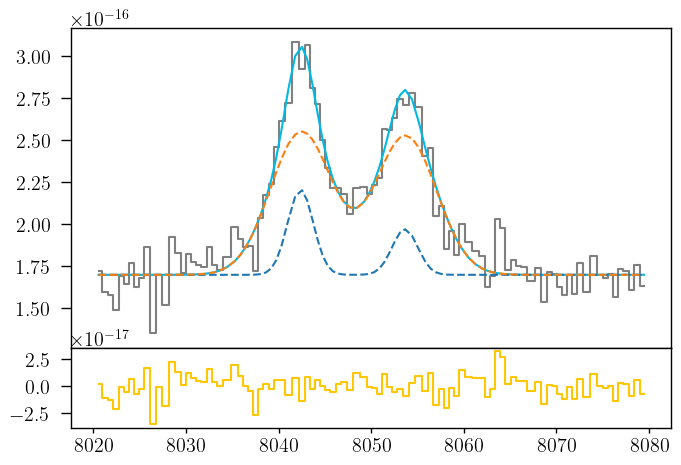

In [42]:
oiia_nar_flux = out_oii_7320.flatchain.Oiia_nar.mean()
oiia_nar_std = out_oii_7320.flatchain.Oiia_nar.std()

oiia_brd_flux = out_oii_7320.flatchain.Oiia_brd.mean()
oiia_brd_std = out_oii_7320.flatchain.Oiia_brd.std()

oiib_nar_flux = out_oii_7320.flatchain.Oiib_nar.mean()
oiib_nar_std = out_oii_7320.flatchain.Oiib_nar.std()

oiib_brd_flux = out_oii_7320.flatchain.Oiib_brd.mean()
oiib_brd_std = out_oii_7320.flatchain.Oiib_brd.std()

z_oii_7320 = out_oii_7320.flatchain.z_nar.mean()
z_oii_7320_std = out_oii_7320.flatchain.z_nar.std()

bkg_oii_7320 = out_oii_7320.flatchain.bkg.mean()
bkg_oii_7320_std = out_oii_7320.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(oii_7320.wavelength, oii_7320.flux, color='gray', label='Data', where='mid')

oiia_nar = gaussian(oii_7320.wavelength, oiia_nar_flux, wave_cat['[OII]7330'], z_oii_7320, upy.nominal_values(sigma_nar_7330))
oiib_nar = gaussian(oii_7320.wavelength, oiib_nar_flux, wave_cat['[OII]7319'], z_oii_7320, upy.nominal_values(sigma_nar_7330))

oiia_brd = gaussian(oii_7320.wavelength, oiia_brd_flux, wave_cat['[OII]7330'], z_oii_7320 * z_ratio, upy.nominal_values(sigma_brd_7330))
oiib_brd = gaussian(oii_7320.wavelength, oiib_brd_flux, wave_cat['[OII]7319'], z_oii_7320 * z_ratio, upy.nominal_values(sigma_brd_7330))

oiia = oiia_nar + oiia_brd
oiib = oiib_nar + oiib_brd

ax.plot(oii_7320.wavelength, bkg_oii_7320 + oiia + oiib, color=c[0])
ax.plot(oii_7320.wavelength, bkg_oii_7320 + oiia_nar + oiib_nar, ls='--')
ax.plot(oii_7320.wavelength, bkg_oii_7320 + oiia_brd + oiib_brd, ls='--')
#plt.yscale('log')
ax1.step(oii_7320.wavelength, oii_7320.flux - bkg_oii_7320 - oiia - oiib, color=c[3], where='mid')

(8020.0, 8080.0)

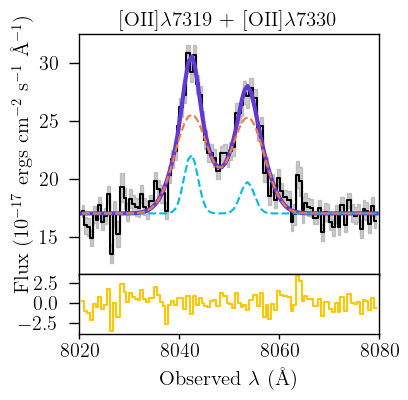

In [43]:
fig = plt.figure(1)
fig.set_size_inches(3, 3)
ax = fig.add_axes((0, .2, 1, .8), sharex=ax1)
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(oii_7320.wavelength, oii_7320.flux / 1e-17, color='black', label='Data', where='mid')
ax.fill_between(oii_7320.wavelength, (oii_7320.flux - oii_7320.noise) / 1e-17,
                                     (oii_7320.flux + oii_7320.noise) / 1e-17,
                                   color='gray', alpha=0.4, step='mid')

oiia_nar = gaussian(oii_7320.wavelength, oiia_nar_flux, wave_cat['[OII]7330'], z_oii_7320, upy.nominal_values(sigma_nar_7330))
oiib_nar = gaussian(oii_7320.wavelength, oiib_nar_flux, wave_cat['[OII]7319'], z_oii_7320, upy.nominal_values(sigma_nar_7330))

oiia_brd = gaussian(oii_7320.wavelength, oiia_brd_flux, wave_cat['[OII]7330'], z_oii_7320 * z_ratio, upy.nominal_values(sigma_brd_7330))
oiib_brd = gaussian(oii_7320.wavelength, oiib_brd_flux, wave_cat['[OII]7319'], z_oii_7320 * z_ratio, upy.nominal_values(sigma_brd_7330))

oiia = oiia_nar + oiia_brd
oiib = oiib_nar + oiib_brd

ax.plot(oii_7320.wavelength, (bkg_oii_7320 + oiia + oiib) / 1e-17, color=c[2], lw=3)
ax.plot(oii_7320.wavelength, (bkg_oii_7320 + oiia_nar + oiib_nar) / 1e-17, ls='--', color=c[0])
ax.plot(oii_7320.wavelength, (bkg_oii_7320 + oiia_brd + oiib_brd) / 1e-17, ls='--', color=cz[0])
#plt.yscale('log')
ax1.step(oii_7320.wavelength, (oii_7320.flux - bkg_oii_7320 - oiia - oiib) / 1e-17, color=c[3],
         where='mid')
ax.set_ylabel(r'Flux ($10^{-17}$ ergs  cm$^{-2}$ s$^{-1}$ \AA$^{-1}$)', fontsize=15)
ax1.set_xlabel(r'Observed $\lambda$ (\AA)', fontsize=15)
ax.set_title(r'[OII]$\lambda$7319 + [OII]$\lambda$7330', fontsize=15)
ax.set_xticklabels([])
ax.set_xlim(8020, 8080)
ax1.set_xlim(8020, 8080)
#fig.savefig('/home/benjamin/Documents/analogs/OII7330_J0021.pdf', bbox_inches='tight')

In [44]:
# EW
EW_OII_7330_nar = ufloat(oiia_nar_flux, oiia_nar_std) / ufloat(bkg_oii_7320, bkg_oii_7320_std)
EW_OII_7330_brd = ufloat(oiia_brd_flux, oiia_brd_std) / ufloat(bkg_oii_7320, bkg_oii_7320_std)
EW_OII_7330 = (ufloat(oiia_nar_flux, oiia_nar_std) + ufloat(oiia_brd_flux, oiia_brd_std)) / ufloat(bkg_oii_7320, bkg_oii_7320_std)

EW_OII_7319_nar = ufloat(oiib_nar_flux, oiib_nar_std) / ufloat(bkg_oii_7320, bkg_oii_7320_std)
EW_OII_7319_brd = ufloat(oiib_brd_flux, oiib_brd_std) / ufloat(bkg_oii_7320, bkg_oii_7320_std)
EW_OII_7319 = (ufloat(oiib_nar_flux, oiib_nar_std) + ufloat(oiib_brd_flux, oiib_brd_std)) / ufloat(bkg_oii_7320, bkg_oii_7320_std)

# HeI 7065

### Arc lines

In [45]:
# Select a region of the arc spectra to have a few arc lines around the wavelength of the fitted lines
wlims_7065 = [wave_cat['HeI7065']*(1 + z_BN[igal]) + 5, wave_cat['HeI7065']*(1 + z_BN[igal]) + 20]
mask_arc_7065 = (wcal_red[14].data['wave_soln'][0] >= wlims_7065[0]) & (wcal_red[14].data['wave_soln'][0] < wlims_7065[1])

# Arc spectra around the fitted line
x_arc_7065 = wcal_red[14].data['wave_soln'][0][mask_arc_7065]
y_arc_7065 = wcal_red[21].data[:, 6][mask_arc_7065]

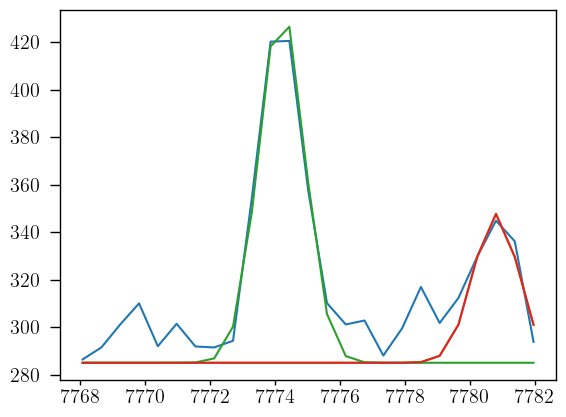

In [46]:
plt.plot(x_arc_7065, y_arc_7065)
plt.plot(x_arc_7065, 285 + gaussian(x_arc_7065, 110, 7780.8, 0, 0.7))
plt.plot(x_arc_7065, 285 + gaussian(x_arc_7065, 263, 7774.2, 0, 0.7))
plt.plot(x_arc_7065, 285 + gaussian(x_arc_7065, 110, 7780.8, 0, 0.7))

100%|██████████████████████████████████████| 2500/2500 [00:17<00:00, 146.68it/s]


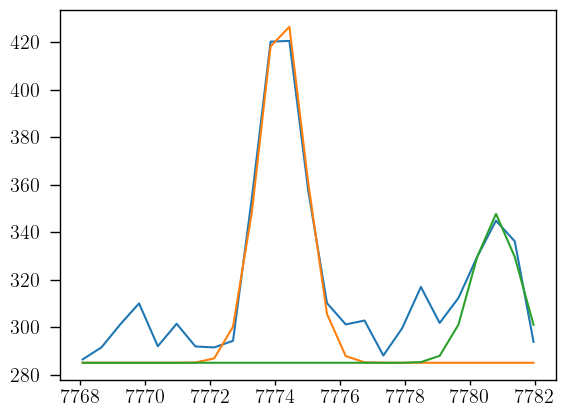

In [47]:
plt.plot(x_arc_7065, y_arc_7065)
plt.plot(x_arc_7065, 285 + gaussian(x_arc_7065, 263, 7774.2, 0, 0.7))
plt.plot(x_arc_7065, 285 + gaussian(x_arc_7065, 110, 7780.8, 0, 0.7))

params_arc_7065 = Parameters()
params_arc_7065.add('z', value=0.0, vary=False)
params_arc_7065.add('mu1', value=7774.2, vary=False)
params_arc_7065.add('mu2', value=7780.8, vary=False)
params_arc_7065.add('arc1', value=263, min=0.)
params_arc_7065.add('arc2', value=110, min=0.)
params_arc_7065.add('sigma', value=0.7, min=0.)
params_arc_7065.add('bkg', value=285, vary=False)

def residual_arc_7065(params_arc_7065, x, data, uncertainty):
    
    z = params_arc_7065['z']
    mu1 = params_arc_7065['mu1']
    mu2 = params_arc_7065['mu2']
    flux1 = params_arc_7065['arc1']
    flux2 = params_arc_7065['arc2']
    sigma = params_arc_7065['sigma']
    bkg = params_arc_7065['bkg']
    
    x = x_arc_7065
    model1 = gaussian(x, flux1, mu1, z, sigma)
    model2 = gaussian(x, flux2, mu2, z, sigma)
    model = bkg + model1 + model2
    return (model - y_arc_7065) / 10

np.random.seed(21)
out_arc_7065 = minimize(residual_arc_7065, params_arc_7065, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10)

In [48]:
out_arc_7065.params

name,value,standard error,relative error,initial value,min,max,vary
z,0.00000000,,,0.0,-inf,inf,False
mu1,7774.20000,,,7774.2,-inf,inf,False
mu2,7780.80000,,,7780.8,-inf,inf,False
arc1,269.701597,14.9868475,(5.56%),263,0.00000000,inf,True
arc2,117.784152,13.3457162,(11.33%),110,0.00000000,inf,True
sigma,0.75319901,0.04923047,(6.54%),0.7,0.00000000,inf,True
bkg,285.000000,,,285,-inf,inf,False


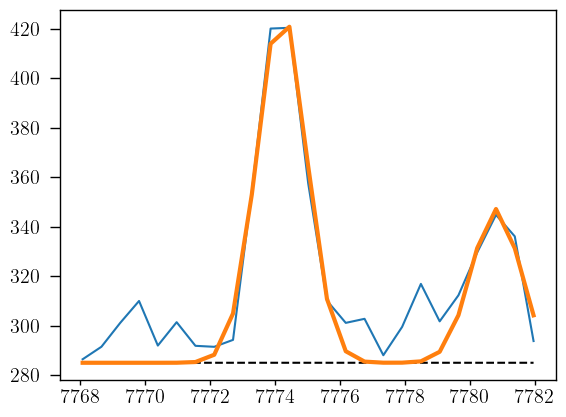

In [49]:
arc1_7065 = out_arc_7065.flatchain.arc1.mean()
arc2_7065 = out_arc_7065.flatchain.arc2.mean()
sigma_arc_7065 = out_arc_7065.flatchain.sigma.mean()

plt.plot(x_arc_7065, y_arc_7065)

plt.plot(x_arc_7065, 285 + gaussian(x_arc_7065, arc1_7065, 7774.2, 0, sigma_arc_7065), ls='--', color='black')
plt.plot(x_arc_7065, 285 + gaussian(x_arc_7065, arc2_7065, 7780.8, 0, sigma_arc_7065), ls='--', color='black')

plt.plot(x_arc_7065, 285 + gaussian(x_arc_7065, arc1_7065, 7774.2, 0, sigma_arc_7065) \
         + gaussian(x_arc_7065, arc2_7065, 7780.8, 0, sigma_arc_7065), lw=3
)

### Line fitting

In [50]:
sigma_nar_7065 = upy.sqrt((sigma_nar_intrinsic**2) + (sigma_arc_7065**2))
sigma_brd_7065 = upy.sqrt((sigma_brd_intrinsic**2) + (sigma_arc_7065**2))

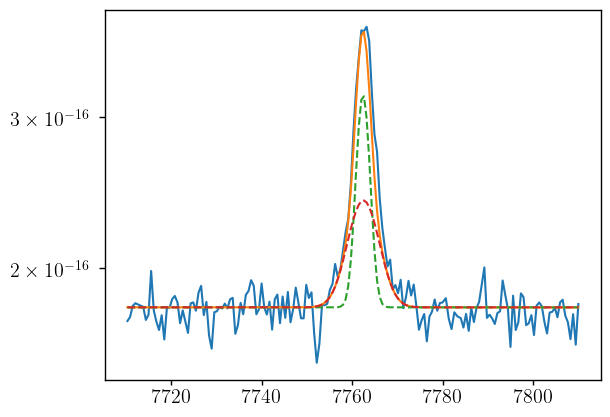

In [51]:
plt.plot(hei_7065.wavelength, hei_7065.flux)
bkg = 1.8e-16

hei7065_nar = gaussian(hei_7065.wavelength, 5e-16, wave_cat['HeI7065'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_7065))
hei7065_brd = gaussian(hei_7065.wavelength, 5e-16, wave_cat['HeI7065'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_7065))

hei7065 = hei7065_nar + hei7065_brd

plt.plot(hei_7065.wavelength, hei7065 + bkg)
plt.plot(hei_7065.wavelength, hei7065_nar + bkg, ls='--')
plt.plot(hei_7065.wavelength, hei7065_brd + bkg, ls='--')
plt.yscale('log')

In [52]:
params_7065 = Parameters()
params_7065.add('z_nar', value=z_nar_oiii_4959, vary=True)
params_7065.add('z_ratio', value=z_ratio, vary=False)
params_7065.add('sigma_hei7065_nar', value=upy.nominal_values(sigma_nar_7065), vary=False)
params_7065.add('sigma_hei7065_brd', value=upy.nominal_values(sigma_brd_7065), vary=False)
params_7065.add('Hei7065_nar', value=5e-16, min=0.)
params_7065.add('Hei7065_brd', value=5e-16, min=0.)
params_7065.add('bkg', value=1.8e-16, min=0.)

def residual_hei7065(params_7065, x, data, uncertainty):
    
    z_nar = params_7065['z_nar']
    z_brd = params_7065['z_nar'] * params_7065['z_ratio']
    sigma_hei7065_nar = params_7065['sigma_hei7065_nar']
    sigma_hei7065_brd = params_7065['sigma_hei7065_brd']
    hei7065_nar_flux = params_7065['Hei7065_nar']
    hei7065_brd_flux = params_7065['Hei7065_brd']
    bkg = params_7065['bkg']
    
    x = hei_7065.wavelength
    model = gaussian(x, hei7065_nar_flux, wave_cat['HeI7065'], z_nar, sigma_hei7065_nar) + \
            gaussian(x, hei7065_brd_flux, wave_cat['HeI7065'], z_brd, sigma_hei7065_brd)
    return (model + bkg - hei_7065.flux) / hei_7065.noise

In [53]:
np.random.seed(21)
out_hei7065 = minimize(residual_hei7065, params_7065, args=(1, 1, 1),
                   method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|██████████████████████████████████████| 2500/2500 [00:19<00:00, 131.02it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 3 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [37.83606497 59.3627363  91.68199822 54.89275114]


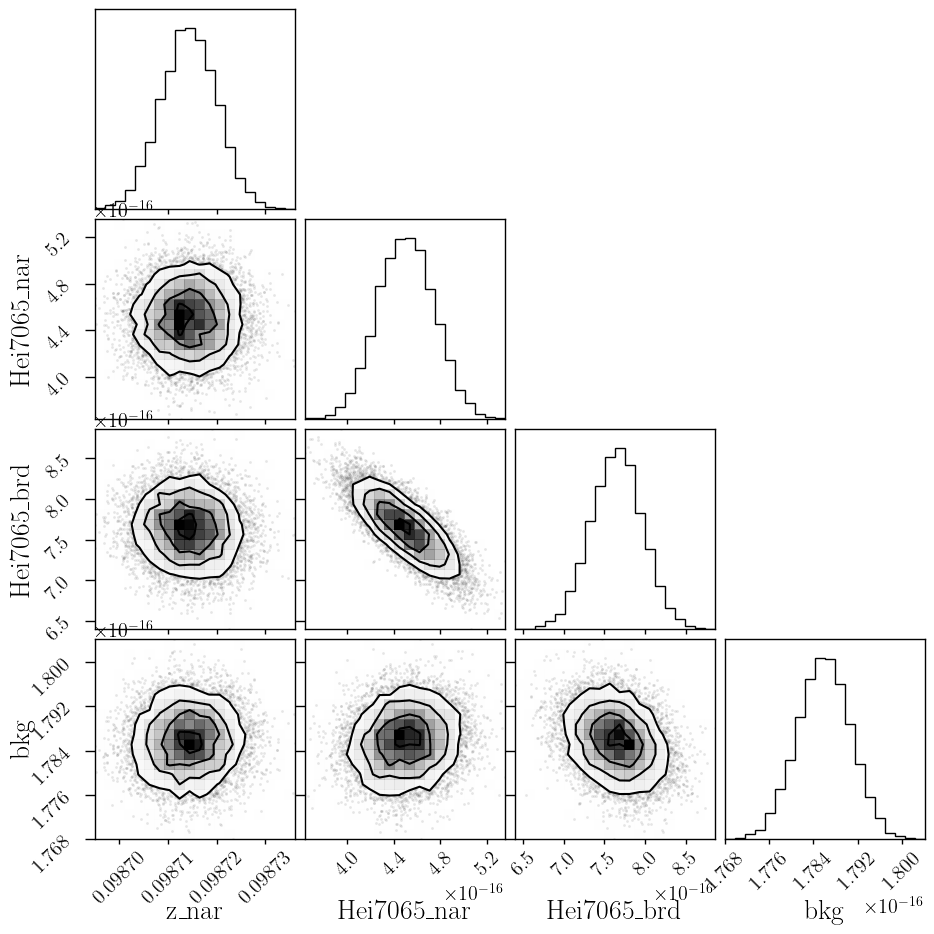

In [54]:
corner.corner(out_hei7065.flatchain, labels=out_hei7065.var_names);

In [55]:
out_hei7065.params

name,value,standard error,relative error,initial value,min,max,vary
z_nar,0.09871427,5.7200e-06,(0.01%),0.09867719705615696,-inf,inf,True
z_ratio,1.00012632,,,1.0001263225003523,-inf,inf,False
sigma_hei7065_nar,1.43897067,,,1.438970673787359,-inf,inf,False
sigma_hei7065_brd,3.33552263,,,3.3355226345562268,-inf,inf,False
Hei7065_nar,4.5008e-16,2.4262e-17,(5.39%),5e-16,0.00000000,inf,True
Hei7065_brd,7.6492e-16,3.2152e-17,(4.20%),5e-16,0.00000000,inf,True
bkg,1.7858e-16,4.8417e-19,(0.27%),1.8e-16,0.00000000,inf,True


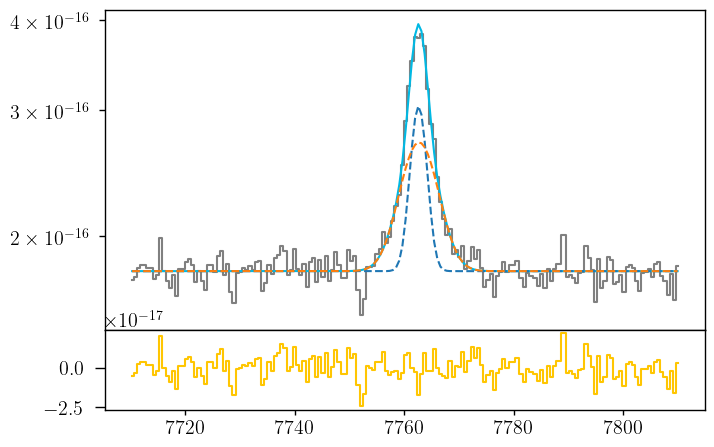

In [56]:
hei7065_nar_flux = out_hei7065.flatchain.Hei7065_nar.mean()
hei7065_nar_std = out_hei7065.flatchain.Hei7065_nar.std()

hei7065_brd_flux = out_hei7065.flatchain.Hei7065_brd.mean()
hei7065_brd_std = out_hei7065.flatchain.Hei7065_brd.std()

z_hei7065 = out_hei7065.flatchain.z_nar.mean()
z_hei7065_std = out_hei7065.flatchain.z_nar.std()

bkg_hei7065 = out_hei7065.flatchain.bkg.mean()
bkg_hei7065_std = out_hei7065.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(hei_7065.wavelength, hei_7065.flux, color='gray', label='Data', where='mid')

hei7065_nar = gaussian(hei_7065.wavelength, hei7065_nar_flux, wave_cat['HeI7065'], z_hei7065, upy.nominal_values(sigma_nar_7065))
hei7065_brd = gaussian(hei_7065.wavelength, hei7065_brd_flux, wave_cat['HeI7065'], z_hei7065 * z_ratio, upy.nominal_values(sigma_brd_7065))

hei7065 = hei7065_nar + hei7065_brd

ax.plot(hei_7065.wavelength, bkg_hei7065 + hei7065, color=c[0])
ax.plot(hei_7065.wavelength, bkg_hei7065 + hei7065_nar, ls='--')
ax.plot(hei_7065.wavelength, bkg_hei7065 + hei7065_brd, ls='--')
ax.set_yscale('log')
ax1.step(hei_7065.wavelength, hei_7065.flux - bkg_hei7065 - hei7065, color=c[3], where='mid')

In [57]:
# EW
EW_hei7065_nar = ufloat(hei7065_nar_flux, hei7065_nar_std) / ufloat(bkg_hei7065, bkg_hei7065_std)
EW_hei7065_brd = ufloat(hei7065_brd_flux, hei7065_brd_std) / ufloat(bkg_hei7065, bkg_hei7065_std)
EW_hei7065 = (ufloat(hei7065_nar_flux, hei7065_nar_std) + ufloat(hei7065_brd_flux, hei7065_brd_std)) / ufloat(bkg_hei7065, bkg_hei7065_std)

# HeI 6678

### Arc lines

In [58]:
wave_cat['HeI6678']*(1 + z_BN[igal])

7337.2845037

In [59]:
# Select a region of the arc spectra to have a few arc lines around the wavelength of the fitted lines
wlims_6678 = [wave_cat['HeI6678']*(1 + z_BN[igal]) - 10, wave_cat['HeI6678']*(1 + z_BN[igal]) + 10]
mask_arc_6678 = (wcal_red[14].data['wave_soln'][0] >= wlims_6678[0]) & (wcal_red[14].data['wave_soln'][0] < wlims_6678[1])

# Arc spectra around the fitted line
x_arc_6678 = wcal_red[14].data['wave_soln'][0][mask_arc_6678]
y_arc_6678 = wcal_red[21].data[:, 6][mask_arc_6678]

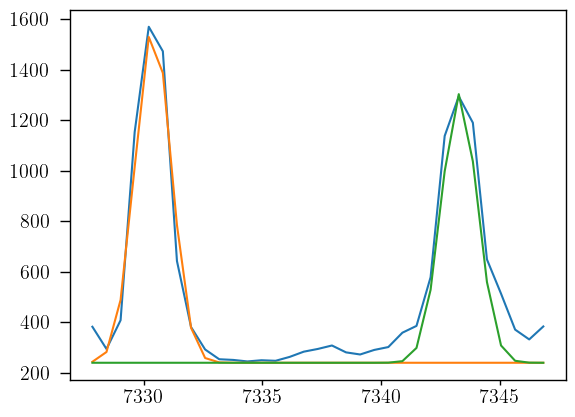

In [60]:
plt.plot(x_arc_6678, y_arc_6678)
plt.plot(x_arc_6678, 240 + gaussian(x_arc_6678, 2500, 7330.4, 0, 0.75))
plt.plot(x_arc_6678, 240 + gaussian(x_arc_6678, 2000, 7343.3, 0, 0.75))

100%|██████████████████████████████████████| 2500/2500 [00:17<00:00, 144.48it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [49.34964714 58.67753217 55.29819442]


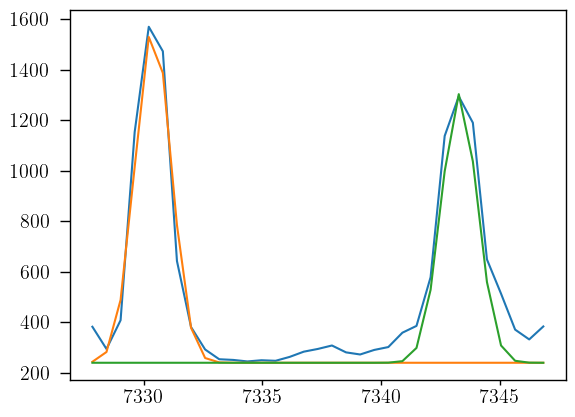

In [61]:
plt.plot(x_arc_6678, y_arc_6678)
plt.plot(x_arc_6678, 240 + gaussian(x_arc_6678, 2500, 7330.4, 0, 0.75))
plt.plot(x_arc_6678, 240 + gaussian(x_arc_6678, 2000, 7343.3, 0, 0.75))

params_arc_6678 = Parameters()
params_arc_6678.add('z', value=0.0, vary=False)
params_arc_6678.add('mu1', value=7330.4, vary=False)
params_arc_6678.add('mu2', value=7343.3, vary=False)
params_arc_6678.add('arc1', value=2500, min=0.)
params_arc_6678.add('arc2', value=2000, min=0.)
params_arc_6678.add('sigma', value=0.75, min=0.)
params_arc_6678.add('bkg', value=240, vary=False)

def residual_arc_6678(params_arc_6678, x, data, uncertainty):
    
    z = params_arc_6678['z']
    mu1 = params_arc_6678['mu1']
    mu2 = params_arc_6678['mu2']
    flux1 = params_arc_6678['arc1']
    flux2 = params_arc_6678['arc2']
    sigma = params_arc_6678['sigma']
    bkg = params_arc_6678['bkg']
    
    x = x_arc_6678
    model1 = gaussian(x, flux1, mu1, z, sigma)
    model2 = gaussian(x, flux2, mu2, z, sigma)
    model = bkg + model1 + model2
    return (model - y_arc_6678) / 10

np.random.seed(21)
out_arc_6678 = minimize(residual_arc_6678, params_arc_6678, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10)

In [62]:
out_arc_6678.params

name,value,standard error,relative error,initial value,min,max,vary
z,0.00000000,,,0.0,-inf,inf,False
mu1,7330.40000,,,7330.4,-inf,inf,False
mu2,7343.30000,,,7343.3,-inf,inf,False
arc1,2650.35297,14.3420168,(0.54%),2500,0.00000000,inf,True
arc2,2274.05719,14.9529088,(0.66%),2000,0.00000000,inf,True
sigma,0.78030492,0.00435709,(0.56%),0.75,0.00000000,inf,True
bkg,240.000000,,,240,-inf,inf,False


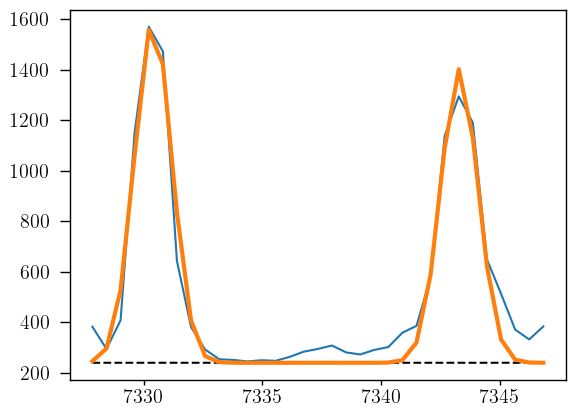

In [63]:
arc1_6678 = out_arc_6678.flatchain.arc1.mean()
arc2_6678 = out_arc_6678.flatchain.arc2.mean()
sigma_arc_6678 = out_arc_6678.flatchain.sigma.mean()

plt.plot(x_arc_6678, y_arc_6678)

plt.plot(x_arc_6678, 240 + gaussian(x_arc_6678, arc1_6678, 7330.4, 0, sigma_arc_6678), ls='--', color='black')
plt.plot(x_arc_6678, 240 + gaussian(x_arc_6678, arc2_6678, 7343.3, 0, sigma_arc_6678), ls='--', color='black')

plt.plot(x_arc_6678, 240 + gaussian(x_arc_6678, arc1_6678, 7330.4, 0, sigma_arc_6678) \
                         + gaussian(x_arc_6678, arc2_6678, 7343.3, 0, sigma_arc_6678), lw=3
)

### Line fitting

In [64]:
sigma_nar_6678 = upy.sqrt((sigma_nar_intrinsic**2) + (sigma_arc_6678**2))
sigma_brd_6678 = upy.sqrt((sigma_brd_intrinsic**2) + (sigma_arc_6678**2))

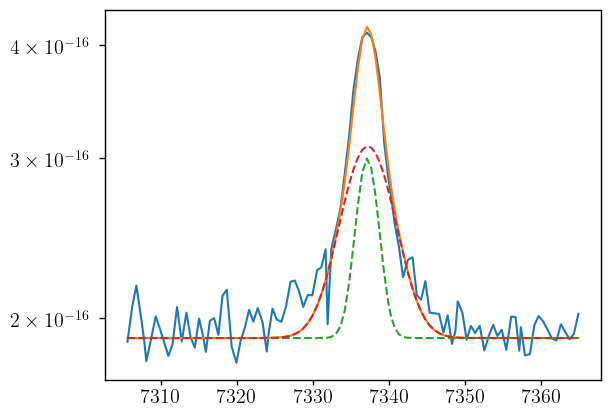

In [65]:
plt.plot(hei_6678.wavelength, hei_6678.flux)
bkg = 1.9e-16

hei6678_nar = gaussian(hei_6678.wavelength, 4e-16, wave_cat['HeI6678'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_6678))
hei6678_brd = gaussian(hei_6678.wavelength, 1e-15, wave_cat['HeI6678'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_6678))

hei6678 = hei6678_nar + hei6678_brd

plt.plot(hei_6678.wavelength, hei6678 + bkg)
plt.plot(hei_6678.wavelength, hei6678_nar + bkg, ls='--')
plt.plot(hei_6678.wavelength, hei6678_brd + bkg, ls='--')
plt.yscale('log')

In [66]:
params_6678 = Parameters()
params_6678.add('z_nar', value=z_nar_oiii_4959, vary=True)
params_6678.add('z_ratio', value=z_ratio, vary=False)
params_6678.add('sigma_hei6678_nar', value=upy.nominal_values(sigma_nar_6678), vary=False)
params_6678.add('sigma_hei6678_brd', value=upy.nominal_values(sigma_brd_6678), vary=False)
params_6678.add('Hei6678_nar', value=4e-16, min=0.)
params_6678.add('Hei6678_brd', value=1e-15, min=0.)
params_6678.add('bkg', value=1.9e-16, min=0.)

def residual_hei6678(params_6678, x, data, uncertainty):
    
    z_nar = params_6678['z_nar']
    z_brd = params_6678['z_nar'] * params_6678['z_ratio']
    sigma_hei6678_nar = params_6678['sigma_hei6678_nar']
    sigma_hei6678_brd = params_6678['sigma_hei6678_brd']
    hei6678_nar_flux = params_6678['Hei6678_nar']
    hei6678_brd_flux = params_6678['Hei6678_brd']
    bkg = params_6678['bkg']
    
    x = hei_6678.wavelength
    model = gaussian(x, hei6678_nar_flux, wave_cat['HeI6678'], z_nar, sigma_hei6678_nar) + \
            gaussian(x, hei6678_brd_flux, wave_cat['HeI6678'], z_brd, sigma_hei6678_brd)
    return (model + bkg - hei_6678.flux) / hei_6678.noise

In [67]:
np.random.seed(21)
out_hei6678 = minimize(residual_hei6678, params_6678, args=(1, 1, 1),
                   method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|██████████████████████████████████████| 2500/2500 [00:18<00:00, 136.61it/s]


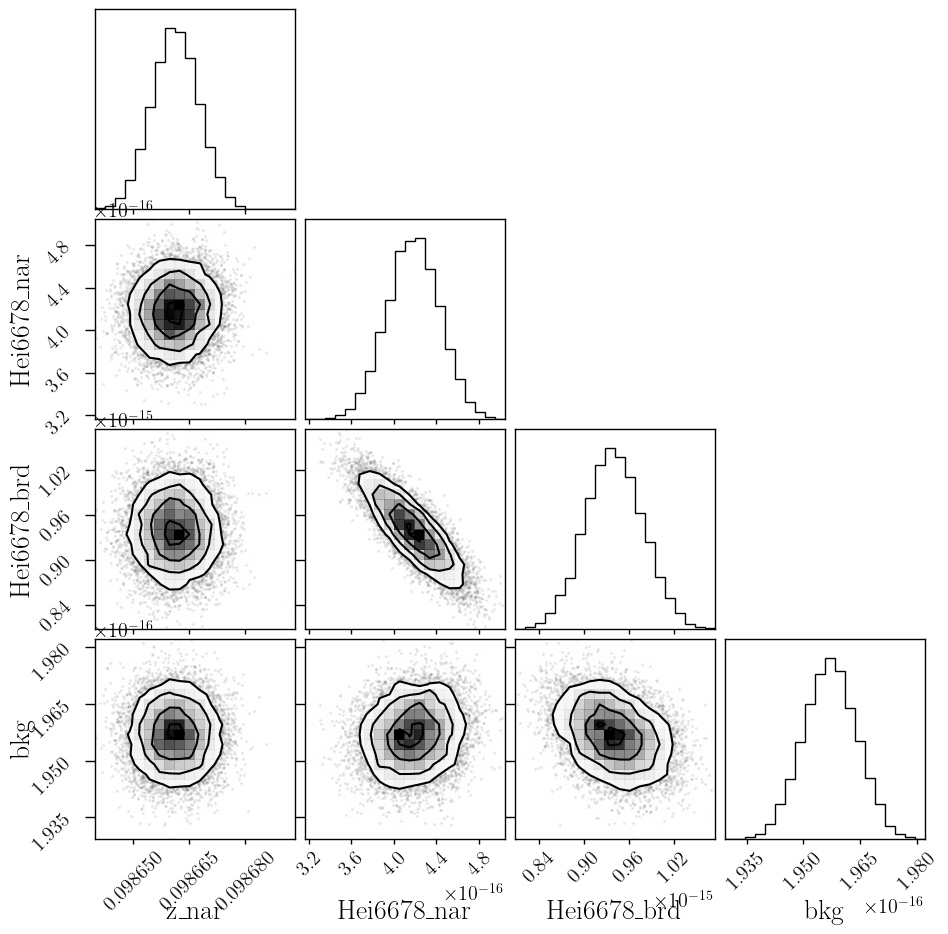

In [68]:
corner.corner(out_hei6678.flatchain, labels=out_hei6678.var_names);

In [69]:
out_hei6678.params

name,value,standard error,relative error,initial value,min,max,vary
z_nar,0.09866113,6.2713e-06,(0.01%),0.09867719705615696,-inf,inf,True
z_ratio,1.00012632,,,1.0001263225003523,-inf,inf,False
sigma_hei6678_nar,1.45264843,,,1.452648426039974,-inf,inf,False
sigma_hei6678_brd,3.34144611,,,3.3414461083927836,-inf,inf,False
Hei6678_nar,4.1817e-16,2.5089e-17,(6.00%),4e-16,0.00000000,inf,True
Hei6678_brd,9.3921e-16,3.9047e-17,(4.16%),1e-15,0.00000000,inf,True
bkg,1.9569e-16,7.1519e-19,(0.37%),1.9e-16,0.00000000,inf,True


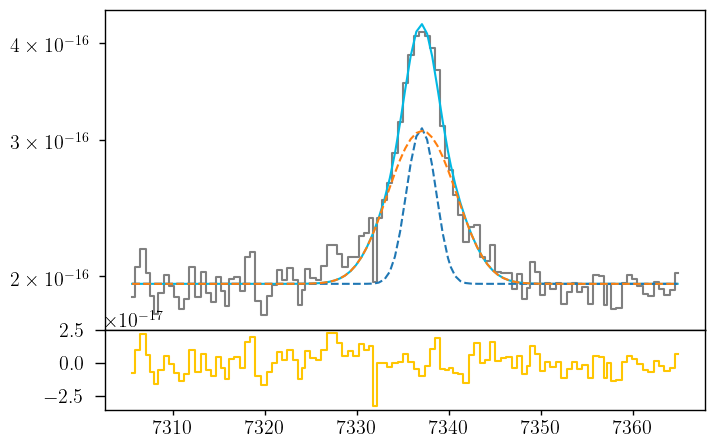

In [70]:
hei6678_nar_flux = out_hei6678.flatchain.Hei6678_nar.mean()
hei6678_nar_std = out_hei6678.flatchain.Hei6678_nar.std()

hei6678_brd_flux = out_hei6678.flatchain.Hei6678_brd.mean()
hei6678_brd_std = out_hei6678.flatchain.Hei6678_brd.std()

z_hei6678 = out_hei6678.flatchain.z_nar.mean()
z_hei6678_std = out_hei6678.flatchain.z_nar.std()

bkg_hei6678 = out_hei6678.flatchain.bkg.mean()
bkg_hei6678_std = out_hei6678.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(hei_6678.wavelength, hei_6678.flux, color='gray', label='Data', where='mid')

hei6678_nar = gaussian(hei_6678.wavelength, hei6678_nar_flux, wave_cat['HeI6678'], z_hei6678, upy.nominal_values(sigma_nar_6678))
hei6678_brd = gaussian(hei_6678.wavelength, hei6678_brd_flux, wave_cat['HeI6678'], z_hei6678 * z_ratio, upy.nominal_values(sigma_brd_6678))

hei6678 = hei6678_nar + hei6678_brd

ax.plot(hei_6678.wavelength, bkg_hei6678 + hei6678, color=c[0])
ax.plot(hei_6678.wavelength, bkg_hei6678 + hei6678_nar, ls='--')
ax.plot(hei_6678.wavelength, bkg_hei6678 + hei6678_brd, ls='--')
ax.set_yscale('log')
ax1.step(hei_6678.wavelength, hei_6678.flux - bkg_hei6678 - hei6678, color=c[3], where='mid')

In [71]:
# EW
EW_hei6678_nar = ufloat(hei6678_nar_flux, hei6678_nar_std) / ufloat(bkg_hei6678, bkg_hei6678_std)
EW_hei6678_brd = ufloat(hei6678_brd_flux, hei6678_brd_std) / ufloat(bkg_hei6678, bkg_hei6678_std)
EW_hei6678 = (ufloat(hei6678_nar_flux, hei6678_nar_std) + ufloat(hei6678_brd_flux, hei6678_brd_std)) / ufloat(bkg_hei6678, bkg_hei6678_std)

# HeI 5875

### Arc lines

In [72]:
wave_cat['HeI5875']*(1 + z_BN[igal])

6455.5447927000005

In [73]:
# Select a region of the arc spectra to have a few arc lines around the wavelength of the fitted lines
wlims_5875 = [wave_cat['HeI5875']*(1 + z_BN[igal]), wave_cat['HeI5875']*(1 + z_BN[igal]) + 10]
mask_arc_5875 = (wcal_red[10].data['wave_soln'][0] >= wlims_5875[0]) & (wcal_red[10].data['wave_soln'][0] < wlims_5875[1])

# Arc spectra around the fitted line
x_arc_5875 = wcal_red[10].data['wave_soln'][0][mask_arc_5875]
y_arc_5875 = wcal_red[21].data[:, 4][mask_arc_5875]

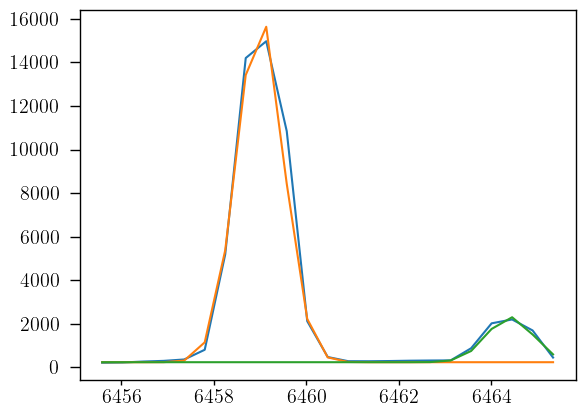

In [74]:
plt.plot(x_arc_5875, y_arc_5875)
plt.plot(x_arc_5875, 240 + gaussian(x_arc_5875, 20000, 6459, 0, 0.5))
plt.plot(x_arc_5875, 240 + gaussian(x_arc_5875, 2600, 6464.4, 0, 0.5))

100%|██████████████████████████████████████| 2500/2500 [00:17<00:00, 145.96it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 1 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [52.11496345 44.05267922 49.77679019]


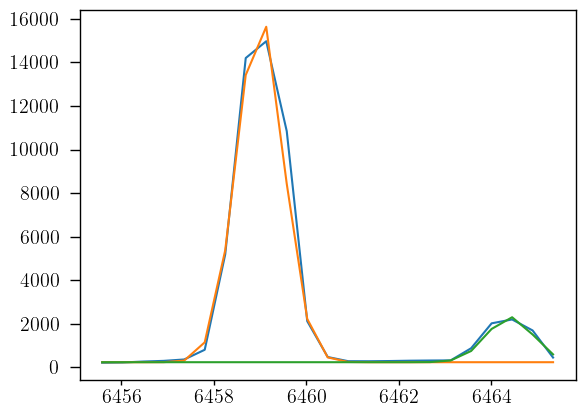

In [75]:
plt.plot(x_arc_5875, y_arc_5875)
plt.plot(x_arc_5875, 240 + gaussian(x_arc_5875, 20000, 6459, 0, 0.5))
plt.plot(x_arc_5875, 240 + gaussian(x_arc_5875, 2600, 6464.4, 0, 0.5))

params_arc_5875 = Parameters()
params_arc_5875.add('z', value=0.0, vary=False)
params_arc_5875.add('mu1', value=6459, vary=False)
params_arc_5875.add('mu2', value=6464.4, vary=False)
params_arc_5875.add('arc1', value=20000, min=0.)
params_arc_5875.add('arc2', value=2600, min=0.)
params_arc_5875.add('sigma', value=0.5, min=0.)
params_arc_5875.add('bkg', value=240, vary=False)

def residual_arc_5875(params_arc_5875, x, data, uncertainty):
    
    z = params_arc_5875['z']
    mu1 = params_arc_5875['mu1']
    mu2 = params_arc_5875['mu2']
    flux1 = params_arc_5875['arc1']
    flux2 = params_arc_5875['arc2']
    sigma = params_arc_5875['sigma']
    bkg = params_arc_5875['bkg']
    
    x = x_arc_5875
    model1 = gaussian(x, flux1, mu1, z, sigma)
    model2 = gaussian(x, flux2, mu2, z, sigma)
    model = bkg + model1 + model2
    return (model - y_arc_5875) / 10


np.random.seed(21)
out_arc_5875 = minimize(residual_arc_5875, params_arc_5875, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10)

In [76]:
out_arc_5875.params

name,value,standard error,relative error,initial value,min,max,vary
z,0.00000000,,,0.0,-inf,inf,False
mu1,6459.00000,,,6459,-inf,inf,False
mu2,6464.40000,,,6464.4,-inf,inf,False
arc1,21277.3961,10.7778693,(0.05%),20000,0.00000000,inf,True
arc2,2803.93897,9.34081603,(0.33%),2600,0.00000000,inf,True
sigma,0.52643341,2.9268e-04,(0.06%),0.5,0.00000000,inf,True
bkg,240.000000,,,240,-inf,inf,False


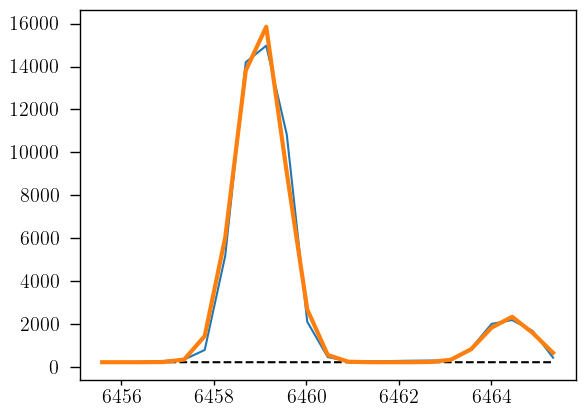

In [77]:
arc1_5875 = out_arc_5875.flatchain.arc1.mean()
arc2_5875 = out_arc_5875.flatchain.arc2.mean()
sigma_arc_5875 = out_arc_5875.flatchain.sigma.mean()

plt.plot(x_arc_5875, y_arc_5875)

plt.plot(x_arc_5875, 240 + gaussian(x_arc_5875, arc1_5875, 6459, 0, sigma_arc_5875), ls='--', color='black')
plt.plot(x_arc_5875, 240 + gaussian(x_arc_5875, arc2_5875, 6464.4, 0, sigma_arc_5875), ls='--', color='black')

plt.plot(x_arc_5875, 240 + gaussian(x_arc_5875, arc1_5875, 6459, 0, sigma_arc_5875) \
                         + gaussian(x_arc_5875, arc2_5875, 6464.4, 0, sigma_arc_5875), lw=3
)

### Line fitting

In [78]:
sigma_nar_5875 = upy.sqrt((sigma_nar_intrinsic**2) + (sigma_arc_5875**2))
sigma_brd_5875 = upy.sqrt((sigma_brd_intrinsic**2) + (sigma_arc_5875**2))

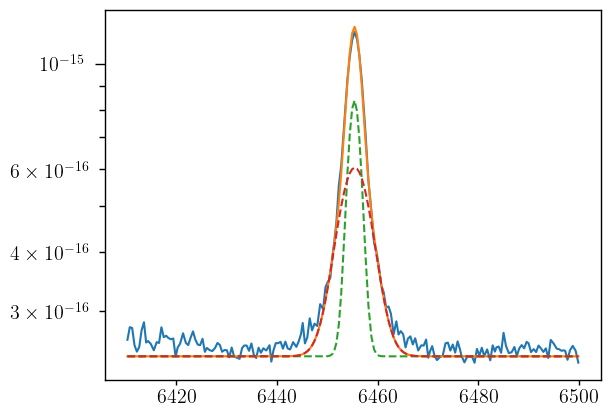

In [79]:
plt.plot(hei_5875.wavelength, hei_5875.flux)
bkg = 2.4e-16

hei5875_nar = gaussian(hei_5875.wavelength, 2e-15, wave_cat['HeI5875'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_5875))
hei5875_brd = gaussian(hei_5875.wavelength, 3e-15, wave_cat['HeI5875'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_5875))

hei5875 = hei5875_nar + hei5875_brd

plt.plot(hei_5875.wavelength, hei5875 + bkg)
plt.plot(hei_5875.wavelength, hei5875_nar + bkg, ls='--')
plt.plot(hei_5875.wavelength, hei5875_brd + bkg, ls='--')
plt.yscale('log')

In [80]:
params_5875 = Parameters()
params_5875.add('z_nar', value=z_nar_oiii_4959, vary=True)
params_5875.add('z_ratio', value=z_ratio, vary=False)
params_5875.add('sigma_hei5875_nar', value=upy.nominal_values(sigma_nar_5875), vary=False)
params_5875.add('sigma_hei5875_brd', value=upy.nominal_values(sigma_brd_5875), vary=False)
params_5875.add('Hei5875_nar', value=2e-15, min=0.)
params_5875.add('Hei5875_brd', value=3e-15, min=0.)
params_5875.add('bkg', value=2.4e-16, min=0.)

def residual_hei5875(params_5875, x, data, uncertainty):
    
    z_nar = params_5875['z_nar']
    z_brd = params_5875['z_nar'] * params_5875['z_ratio']
    sigma_hei5875_nar = params_5875['sigma_hei5875_nar']
    sigma_hei5875_brd = params_5875['sigma_hei5875_brd']
    hei5875_nar_flux = params_5875['Hei5875_nar']
    hei5875_brd_flux = params_5875['Hei5875_brd']
    bkg = params_5875['bkg']
    
    x = hei_5875.wavelength
    model = gaussian(x, hei5875_nar_flux, wave_cat['HeI5875'], z_nar, sigma_hei5875_nar) + \
            gaussian(x, hei5875_brd_flux, wave_cat['HeI5875'], z_brd, sigma_hei5875_brd)
    return (model + bkg - hei_5875.flux) / hei_5875.noise

In [81]:
np.random.seed(21)
out_hei5875 = minimize(residual_hei5875, params_5875, args=(1, 1, 1),
                   method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|██████████████████████████████████████| 2500/2500 [00:18<00:00, 132.17it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [37.17081505 56.28759017 43.7922352  60.43229531]


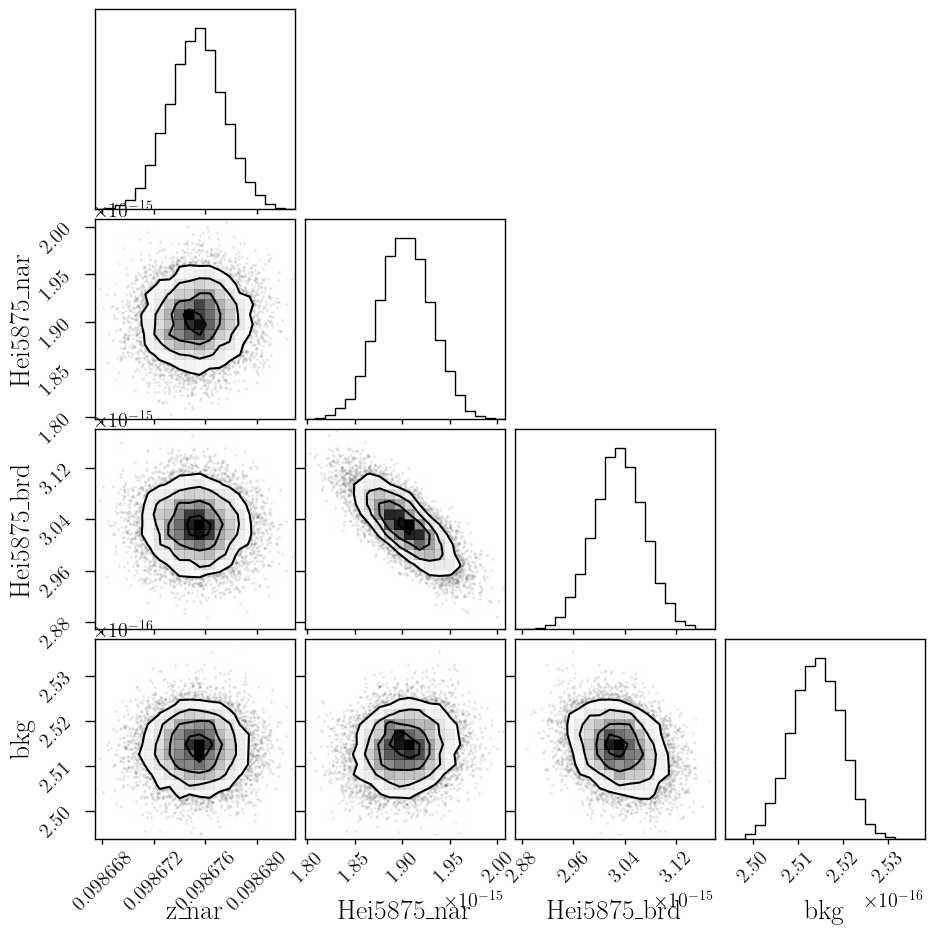

In [82]:
corner.corner(out_hei5875.flatchain, labels=out_hei5875.var_names);

In [83]:
out_hei5875.params

name,value,standard error,relative error,initial value,min,max,vary
z_nar,0.09867530,2.1265e-06,(0.00%),0.09867719705615696,-inf,inf,True
z_ratio,1.00012632,,,1.0001263225003523,-inf,inf,False
sigma_hei5875_nar,1.33356743,,,1.3335674321476343,-inf,inf,False
sigma_hei5875_brd,3.29142473,,,3.2914247282448525,-inf,inf,False
Hei5875_nar,1.9025e-15,2.7932e-17,(1.47%),2e-15,0.00000000,inf,True
Hei5875_brd,3.0305e-15,3.9439e-17,(1.30%),3e-15,0.00000000,inf,True
bkg,2.5141e-16,5.5565e-19,(0.22%),2.4e-16,0.00000000,inf,True


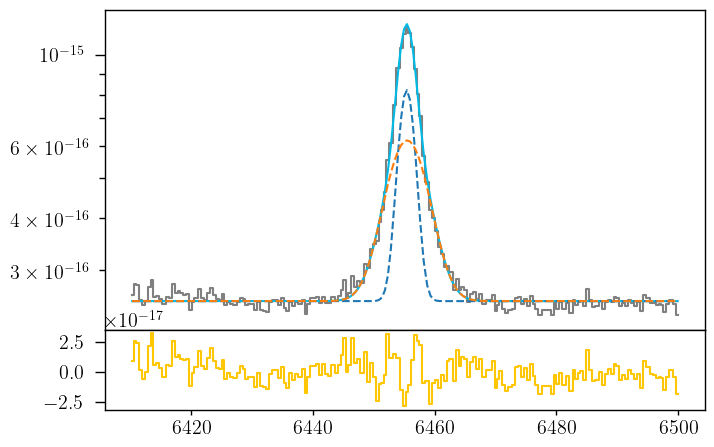

In [84]:
hei5875_nar_flux = out_hei5875.flatchain.Hei5875_nar.mean()
hei5875_nar_std = out_hei5875.flatchain.Hei5875_nar.std()

hei5875_brd_flux = out_hei5875.flatchain.Hei5875_brd.mean()
hei5875_brd_std = out_hei5875.flatchain.Hei5875_brd.std()

z_hei5875 = out_hei5875.flatchain.z_nar.mean()
z_hei5875_std = out_hei5875.flatchain.z_nar.std()

bkg_hei5875 = out_hei5875.flatchain.bkg.mean()
bkg_hei5875_std = out_hei5875.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(hei_5875.wavelength, hei_5875.flux, color='gray', label='Data', where='mid')

hei5875_nar = gaussian(hei_5875.wavelength, hei5875_nar_flux, wave_cat['HeI5875'], z_hei5875, upy.nominal_values(sigma_nar_5875))
hei5875_brd = gaussian(hei_5875.wavelength, hei5875_brd_flux, wave_cat['HeI5875'], z_hei5875 * z_ratio, upy.nominal_values(sigma_brd_5875))

hei5875 = hei5875_nar + hei5875_brd

ax.plot(hei_5875.wavelength, bkg_hei5875 + hei5875, color=c[0])
ax.plot(hei_5875.wavelength, bkg_hei5875 + hei5875_nar, ls='--')
ax.plot(hei_5875.wavelength, bkg_hei5875 + hei5875_brd, ls='--')
ax.set_yscale('log')
ax1.step(hei_5875.wavelength, hei_5875.flux - bkg_hei5875 - hei5875, color=c[3], where='mid')

In [85]:
# EW
EW_hei5875_nar = ufloat(hei5875_nar_flux, hei5875_nar_std) / ufloat(bkg_hei5875, bkg_hei5875_std)
EW_hei5875_brd = ufloat(hei5875_brd_flux, hei5875_brd_std) / ufloat(bkg_hei5875, bkg_hei5875_std)
EW_hei5875 = (ufloat(hei5875_nar_flux, hei5875_nar_std) + ufloat(hei5875_brd_flux, hei5875_brd_std)) / ufloat(bkg_hei5875, bkg_hei5875_std)

# HeI 4471

### Arc lines

In [86]:
wave_cat['HeI4471']*(1 + z_BN[igal])

4912.81529574

In [87]:
# Select a region of the arc spectra to have a few arc lines around the wavelength of the fitted lines
wlims_4471 = [wave_cat['HeI4471']*(1 + z_BN[igal]), wave_cat['HeI4471']*(1 + z_BN[igal]) + 10]
mask_arc_4471 = (wcal_blue[10].data['wave_soln'][0] >= wlims_4471[0]) & (wcal_blue[10].data['wave_soln'][0] < wlims_4471[1])

# Arc spectra around the fitted line
x_arc_4471 = wcal_blue[10].data['wave_soln'][0][mask_arc_4471]
y_arc_4471 = wcal_blue[27].data[:, 4][mask_arc_4471]

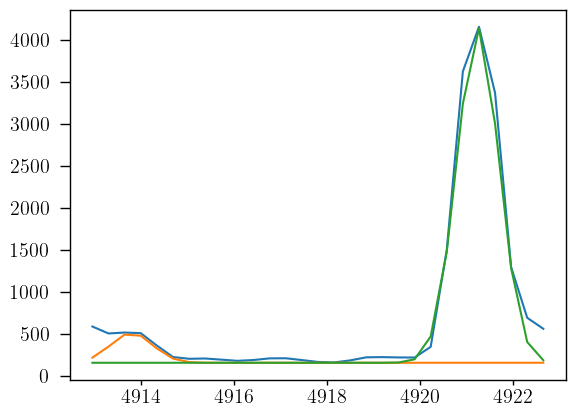

In [88]:
plt.plot(x_arc_4471, y_arc_4471)
plt.plot(x_arc_4471, 160 + gaussian(x_arc_4471, 400, 4913.8, 0, 0.45))
plt.plot(x_arc_4471, 160 + gaussian(x_arc_4471, 4500, 4921.25, 0, 0.45))

100%|██████████████████████████████████████| 2500/2500 [00:17<00:00, 146.30it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 3 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [67.92804023 55.34345578 61.32998859]


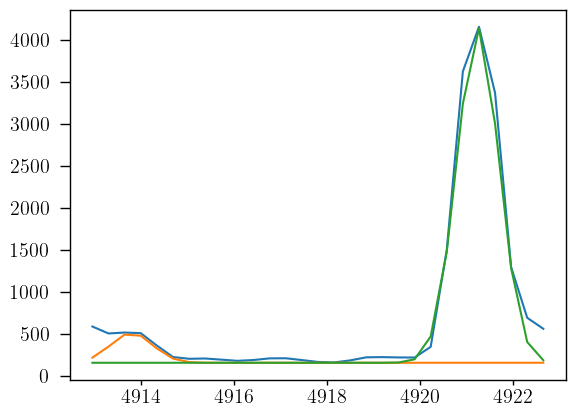

In [89]:
plt.plot(x_arc_4471, y_arc_4471)
plt.plot(x_arc_4471, 160 + gaussian(x_arc_4471, 400, 4913.8, 0, 0.45))
plt.plot(x_arc_4471, 160 + gaussian(x_arc_4471, 4500, 4921.25, 0, 0.45))

params_arc_4471 = Parameters()
params_arc_4471.add('z', value=0.0, vary=False)
params_arc_4471.add('mu1', value=4913.8, vary=False)
params_arc_4471.add('mu2', value=4921.25, vary=False)
params_arc_4471.add('arc1', value=400, min=0.)
params_arc_4471.add('arc2', value=4500, min=0.)
params_arc_4471.add('sigma', value=0.45, min=0.)
params_arc_4471.add('bkg', value=160, vary=False)

def residual_arc_4471(params_arc_4471, x, data, uncertainty):
    
    z = params_arc_4471['z']
    mu1 = params_arc_4471['mu1']
    mu2 = params_arc_4471['mu2']
    flux1 = params_arc_4471['arc1']
    flux2 = params_arc_4471['arc2']
    sigma = params_arc_4471['sigma']
    bkg = params_arc_4471['bkg']
    
    x = x_arc_4471
    model1 = gaussian(x, flux1, mu1, z, sigma)
    model2 = gaussian(x, flux2, mu2, z, sigma)
    model = bkg + model1 + model2
    return (model - y_arc_4471) / 10


np.random.seed(21)
out_arc_4471 = minimize(residual_arc_4471, params_arc_4471, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10)

In [90]:
out_arc_4471.params

name,value,standard error,relative error,initial value,min,max,vary
z,0.00000000,,,0.0,-inf,inf,False
mu1,4913.80000,,,4913.8,-inf,inf,False
mu2,4921.25000,,,4921.25,-inf,inf,False
arc1,520.734073,7.66516679,(1.47%),400,0.00000000,inf,True
arc2,4875.04113,9.32564816,(0.19%),4500,0.00000000,inf,True
sigma,0.46537987,0.00101821,(0.22%),0.45,0.00000000,inf,True
bkg,160.000000,,,160,-inf,inf,False


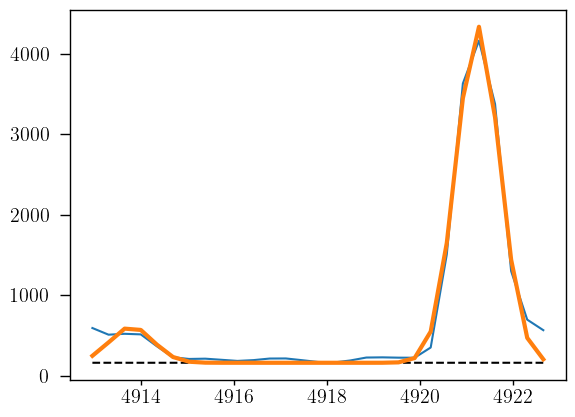

In [91]:
arc1_4471 = out_arc_4471.flatchain.arc1.mean()
arc2_4471 = out_arc_4471.flatchain.arc2.mean()
sigma_arc_4471 = out_arc_4471.flatchain.sigma.mean()

plt.plot(x_arc_4471, y_arc_4471)

plt.plot(x_arc_4471, 160 + gaussian(x_arc_4471, arc1_4471, 4913.8, 0, sigma_arc_4471), ls='--', color='black')
plt.plot(x_arc_4471, 160 + gaussian(x_arc_4471, arc2_4471, 4921.25, 0, sigma_arc_4471), ls='--', color='black')

plt.plot(x_arc_4471, 160 + gaussian(x_arc_4471, arc1_4471, 4913.8, 0, sigma_arc_4471) \
                         + gaussian(x_arc_4471, arc2_4471, 4921.25, 0, sigma_arc_4471), lw=3
)

### Line fitting

In [92]:
sigma_nar_4471 = upy.sqrt((sigma_nar_intrinsic**2) + (sigma_arc_4471**2))
sigma_brd_4471 = upy.sqrt((sigma_brd_intrinsic**2) + (sigma_arc_4471**2))

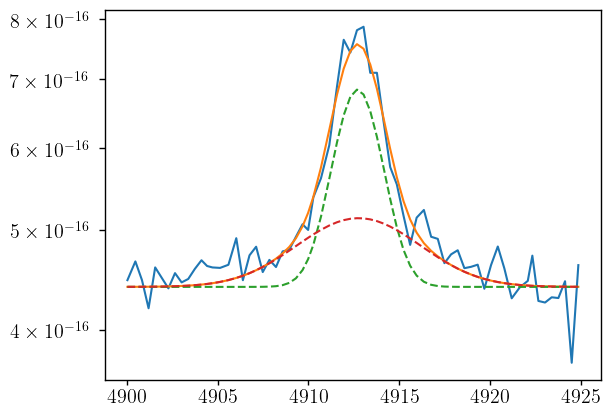

In [93]:
plt.plot(hei_4471.wavelength, hei_4471.flux)
bkg = 4.4e-16

hei4471_nar = gaussian(hei_4471.wavelength, 8e-16, wave_cat['HeI4471'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_4471))
hei4471_brd = gaussian(hei_4471.wavelength, 6e-16, wave_cat['HeI4471'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_4471))

hei4471 = hei4471_nar + hei4471_brd

plt.plot(hei_4471.wavelength, hei4471 + bkg)
plt.plot(hei_4471.wavelength, hei4471_nar + bkg, ls='--')
plt.plot(hei_4471.wavelength, hei4471_brd + bkg, ls='--')
plt.yscale('log')

In [94]:
params_4471 = Parameters()
params_4471.add('z_nar', value=z_nar_oiii_4959, vary=True)
params_4471.add('z_ratio', value=z_ratio, vary=False)
params_4471.add('sigma_hei4471_nar', value=upy.nominal_values(sigma_nar_4471), vary=False)
params_4471.add('sigma_hei4471_brd', value=upy.nominal_values(sigma_brd_4471), vary=False)
params_4471.add('Hei4471_nar', value=8e-16, min=0.)
params_4471.add('Hei4471_brd', value=6e-16, min=0.)
params_4471.add('bkg', value=4.4e-16, min=0.)

def residual_hei4471(params_4471, x, data, uncertainty):
    
    z_nar = params_4471['z_nar']
    z_brd = params_4471['z_nar'] * params_4471['z_ratio']
    sigma_hei4471_nar = params_4471['sigma_hei4471_nar']
    sigma_hei4471_brd = params_4471['sigma_hei4471_brd']
    hei4471_nar_flux = params_4471['Hei4471_nar']
    hei4471_brd_flux = params_4471['Hei4471_brd']
    bkg = params_4471['bkg']
    
    x = hei_4471.wavelength
    model = gaussian(x, hei4471_nar_flux, wave_cat['HeI4471'], z_nar, sigma_hei4471_nar) + \
            gaussian(x, hei4471_brd_flux, wave_cat['HeI4471'], z_brd, sigma_hei4471_brd)
    return (model + bkg - hei_4471.flux) / hei_4471.noise

In [95]:
np.random.seed(21)
out_hei4471 = minimize(residual_hei4471, params_4471, args=(1, 1, 1),
                   method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|██████████████████████████████████████| 2500/2500 [00:18<00:00, 138.30it/s]


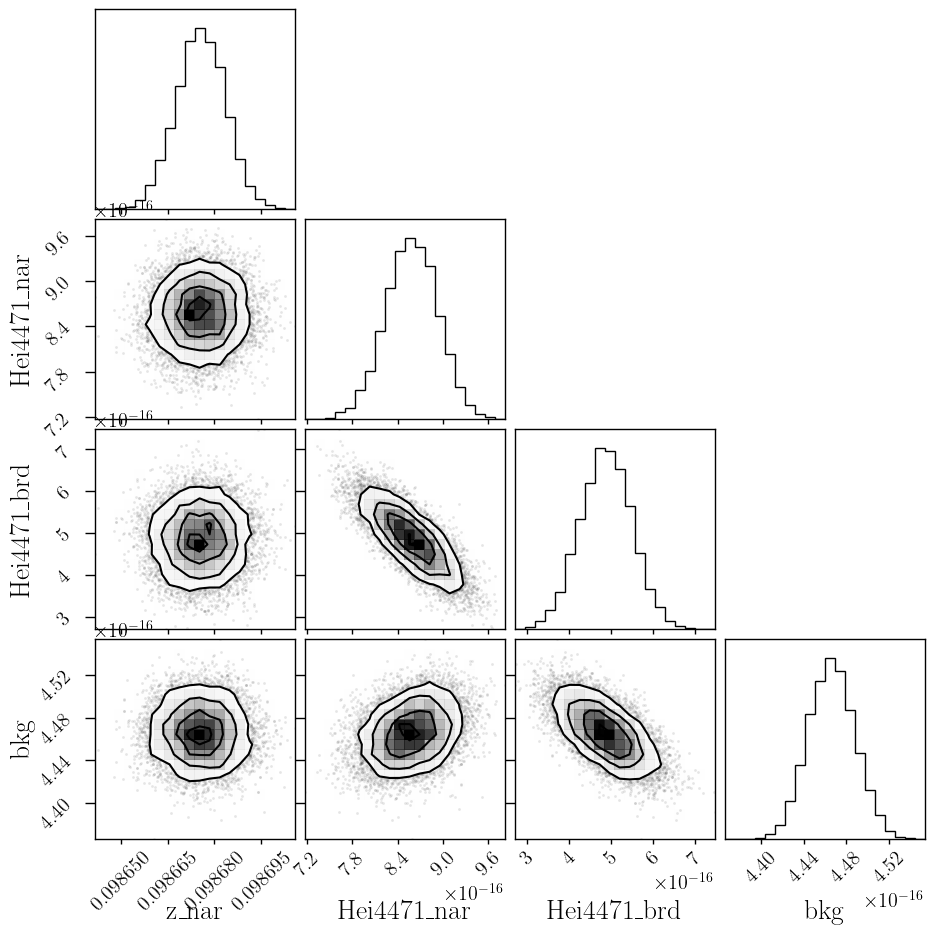

In [96]:
corner.corner(out_hei4471.flatchain, labels=out_hei4471.var_names);

In [97]:
out_hei4471.params

name,value,standard error,relative error,initial value,min,max,vary
z_nar,0.09867555,7.8839e-06,(0.01%),0.09867719705615696,-inf,inf,True
z_ratio,1.00012632,,,1.0001263225003523,-inf,inf,False
sigma_hei4471_nar,1.31066967,,,1.3106696672028095,-inf,inf,False
sigma_hei4471_brd,3.28221413,,,3.2822141341086186,-inf,inf,False
Hei4471_nar,8.5800e-16,3.4555e-17,(4.03%),8e-16,0.00000000,inf,True
Hei4471_brd,4.8667e-16,6.1874e-17,(12.71%),6e-16,0.00000000,inf,True
bkg,4.4662e-16,2.2079e-18,(0.49%),4.4e-16,0.00000000,inf,True


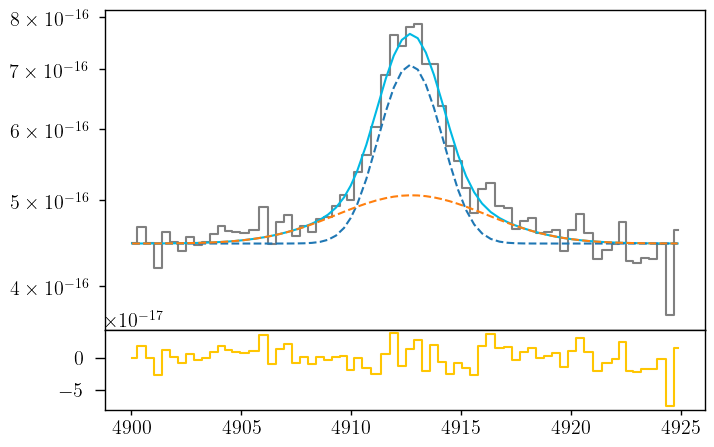

In [98]:
hei4471_nar_flux = out_hei4471.flatchain.Hei4471_nar.mean()
hei4471_nar_std = out_hei4471.flatchain.Hei4471_nar.std()

hei4471_brd_flux = out_hei4471.flatchain.Hei4471_brd.mean()
hei4471_brd_std = out_hei4471.flatchain.Hei4471_brd.std()

z_hei4471 = out_hei4471.flatchain.z_nar.mean()
z_hei4471_std = out_hei4471.flatchain.z_nar.std()

bkg_hei4471 = out_hei4471.flatchain.bkg.mean()
bkg_hei4471_std = out_hei4471.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(hei_4471.wavelength, hei_4471.flux, color='gray', label='Data', where='mid')

hei4471_nar = gaussian(hei_4471.wavelength, hei4471_nar_flux, wave_cat['HeI4471'], z_hei4471, upy.nominal_values(sigma_nar_4471))
hei4471_brd = gaussian(hei_4471.wavelength, hei4471_brd_flux, wave_cat['HeI4471'], z_hei4471 * z_ratio, upy.nominal_values(sigma_brd_4471))

hei4471 = hei4471_nar + hei4471_brd

ax.plot(hei_4471.wavelength, bkg_hei4471 + hei4471, color=c[0])
ax.plot(hei_4471.wavelength, bkg_hei4471 + hei4471_nar, ls='--')
ax.plot(hei_4471.wavelength, bkg_hei4471 + hei4471_brd, ls='--')
ax.set_yscale('log')
ax1.step(hei_4471.wavelength, hei_4471.flux - bkg_hei4471 - hei4471, color=c[3], where='mid')

In [99]:
# EW
EW_hei4471_nar = ufloat(hei4471_nar_flux, hei4471_nar_std) / ufloat(bkg_hei4471, bkg_hei4471_std)
EW_hei4471_brd = ufloat(hei4471_brd_flux, hei4471_brd_std) / ufloat(bkg_hei4471, bkg_hei4471_std)
EW_hei4471 = (ufloat(hei4471_nar_flux, hei4471_nar_std) + ufloat(hei4471_brd_flux, hei4471_brd_std)) / ufloat(bkg_hei4471, bkg_hei4471_std)

# [SII]6716 + [SII]6730

### Arc lines

In [100]:
# Select a region of the arc spectra to have a few arc lines around the wavelength of the fitted lines
wlims_6730 = [wave_cat['[SII]6730']*(1 + z_BN[igal]) - 5, wave_cat['[SII]6730']*(1 + z_BN[igal]) + 20]
mask_arc_6730 = (wcal_red[14].data['wave_soln'][0] >= wlims_6730[0]) & (wcal_red[14].data['wave_soln'][0] < wlims_6730[1])

# Arc spectra around the fitted line
x_arc_6730 = wcal_red[14].data['wave_soln'][0][mask_arc_6730]
y_arc_6730 = wcal_red[21].data[:, 6][mask_arc_6730]

100%|██████████████████████████████████████| 2500/2500 [00:20<00:00, 122.04it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 4 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [56.19851786 70.01279174 70.58865673 59.99323256]


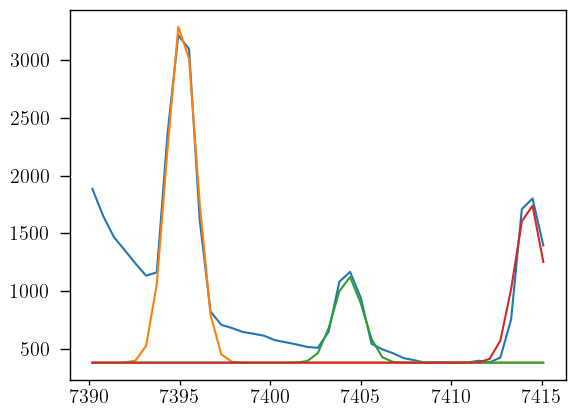

In [101]:
plt.plot(x_arc_6730, y_arc_6730)
plt.plot(x_arc_6730, 380 + gaussian(x_arc_6730, 6000, 7395.1, 0, 0.8))
plt.plot(x_arc_6730, 380 + gaussian(x_arc_6730, 1500, 7404.3, 0, 0.8))
plt.plot(x_arc_6730, 380 + gaussian(x_arc_6730, 2800, 7414.3, 0, 0.8))

params_arc_6730 = Parameters()
params_arc_6730.add('z', value=0.0, vary=False)
params_arc_6730.add('mu1', value=7395.1, vary=False)
params_arc_6730.add('mu2', value=7404.3, vary=False)
params_arc_6730.add('mu3', value=7414.3, vary=False)
params_arc_6730.add('arc1', value=6000, min=0.)
params_arc_6730.add('arc2', value=1500, min=0.)
params_arc_6730.add('arc3', value=2800, min=0.)
params_arc_6730.add('sigma', value=0.8, min=0.)
params_arc_6730.add('bkg', value=380, vary=False)

def residual_arc_6730(params_arc_6730, x, data, uncertainty):
    
    z = params_arc_6730['z']
    mu1 = params_arc_6730['mu1']
    mu2 = params_arc_6730['mu2']
    mu3 = params_arc_6730['mu3']
    flux1 = params_arc_6730['arc1']
    flux2 = params_arc_6730['arc2']
    flux3 = params_arc_6730['arc3']
    sigma = params_arc_6730['sigma']
    bkg = params_arc_6730['bkg']
    
    x = x_arc_6730
    model1 = gaussian(x, flux1, mu1, z, sigma)
    model2 = gaussian(x, flux2, mu2, z, sigma)
    model3 = gaussian(x, flux3, mu3, z, sigma)
    model = bkg + model1 + model2 + model3
    return (model - y_arc_6730) / 10

np.random.seed(21)
out_arc_6730 = minimize(residual_arc_6730, params_arc_6730, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10)

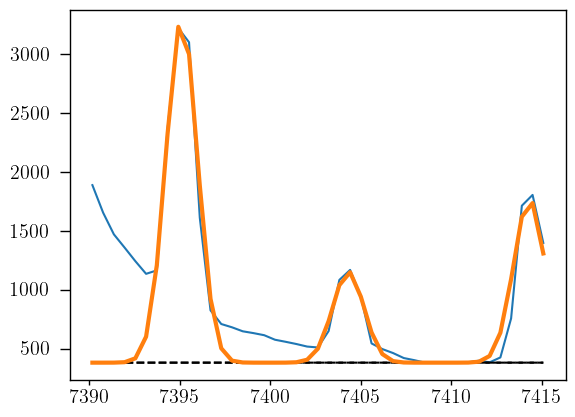

In [102]:
arc1_6730 = out_arc_6730.flatchain.arc1.mean()
arc2_6730 = out_arc_6730.flatchain.arc2.mean()
arc3_6730 = out_arc_6730.flatchain.arc3.mean()
sigma_arc_6730 = out_arc_6730.flatchain.sigma.mean()

plt.plot(x_arc_6730, y_arc_6730)

plt.plot(x_arc_6730, 380 + gaussian(x_arc_6730, arc1_6730, 7395.1, 0, sigma_arc_6730), ls='--', color='black')
plt.plot(x_arc_6730, 380 + gaussian(x_arc_6730, arc2_6730, 7404.3, 0, sigma_arc_6730), ls='--', color='black')
plt.plot(x_arc_6730, 380 + gaussian(x_arc_6730, arc3_6730, 7414.3, 0, sigma_arc_6730), ls='--', color='black')

plt.plot(x_arc_6730, 380 + gaussian(x_arc_6730, arc1_6730, 7395.1, 0, sigma_arc_6730) \
         + gaussian(x_arc_6730, arc2_6730, 7404.3, 0, sigma_arc_6730) \
         + gaussian(x_arc_6730, arc3_6730, 7414.3, 0, sigma_arc_6730), lw=3
)

### Line fitting

In [103]:
sigma_nar_6730 = upy.sqrt((sigma_nar_intrinsic**2) + (sigma_arc_6730**2))
sigma_brd_6730 = upy.sqrt((sigma_brd_intrinsic**2) + (sigma_arc_6730**2))

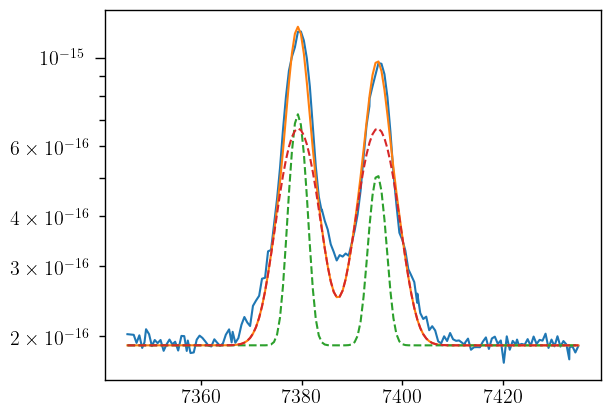

In [104]:
plt.plot(sii.wavelength, sii.flux)
bkg = 1.9e-16

siia_nar = gaussian(sii.wavelength, 1.2e-15, wave_cat['[SII]6730'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_6730))
siia_brd = gaussian(sii.wavelength, 4e-15, wave_cat['[SII]6730'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_6730))

siib_nar = gaussian(sii.wavelength, 2.0e-15, wave_cat['[SII]6716'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_6730))
siib_brd = gaussian(sii.wavelength, 4.0e-15, wave_cat['[SII]6716'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_6730))

siia = siia_nar + siia_brd
siib = siib_nar + siib_brd

plt.plot(sii.wavelength, siia + siib + bkg)
plt.plot(sii.wavelength, siia_nar + siib_nar + bkg, ls='--')
plt.plot(sii.wavelength, siia_brd + siib_brd + bkg, ls='--')
plt.yscale('log')

In [105]:
params_sii = Parameters()
params_sii.add('z_nar', value=z_nar_oiii_4959, vary=True)
params_sii.add('z_ratio', value=z_ratio, vary=False)
params_sii.add('sigma_6730_nar', value=upy.nominal_values(sigma_nar_6730), vary=False)
params_sii.add('sigma_6730_brd', value=upy.nominal_values(sigma_brd_6730), vary=False)
params_sii.add('sigma_6716_nar', value=upy.nominal_values(sigma_nar_6730), vary=False)
params_sii.add('sigma_6716_brd', value=upy.nominal_values(sigma_brd_6730), vary=False)
params_sii.add('Siia_nar', value=1.2e-15, min=0.)
params_sii.add('Siia_brd', value=4.0e-15, min=0.)
params_sii.add('Siib_nar', value=2.0e-15, min=0.)
params_sii.add('Siib_brd', value=4.0e-15, min=0.)
params_sii.add('bkg', value=1.9e-16, min=0.)


def residual_sii(params_sii, x, data, uncertainty):
    
    z_nar = params_sii['z_nar']
    z_brd = params_sii['z_nar'] * params_sii['z_ratio']
    sigma_6730_nar = params_sii['sigma_6730_nar']
    sigma_6730_brd = params_sii['sigma_6730_brd']
    sigma_6716_nar = params_sii['sigma_6716_nar']
    sigma_6716_brd = params_sii['sigma_6716_brd']
    siia_nar_flux = params_sii['Siia_nar']
    siia_brd_flux = params_sii['Siia_brd']
    siib_nar_flux = params_sii['Siib_nar']
    siib_brd_flux = params_sii['Siib_brd']
    bkg = params_sii['bkg']
    
    x = sii.wavelength
    model_siia = gaussian(x, siia_nar_flux, wave_cat['[SII]6730'], z_nar, sigma_6730_nar) + \
                 gaussian(x, siia_brd_flux, wave_cat['[SII]6730'], z_brd, sigma_6730_brd)
    model_siib = gaussian(x, siib_nar_flux, wave_cat['[SII]6716'], z_nar, sigma_6716_nar) + \
                 gaussian(x, siib_brd_flux, wave_cat['[SII]6716'], z_brd, sigma_6716_brd)
    model = model_siia + model_siib
    return (model + bkg - sii.flux) / sii.noise

In [106]:
np.random.seed(21)
out_sii = minimize(residual_sii, params_sii, args=(1, 1, 1),
                    method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|███████████████████████████████████████| 2500/2500 [00:26<00:00, 95.22it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 4 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [ 39.03722039  47.30284812  50.26398456 127.59819626 121.61645104
  54.79538649]


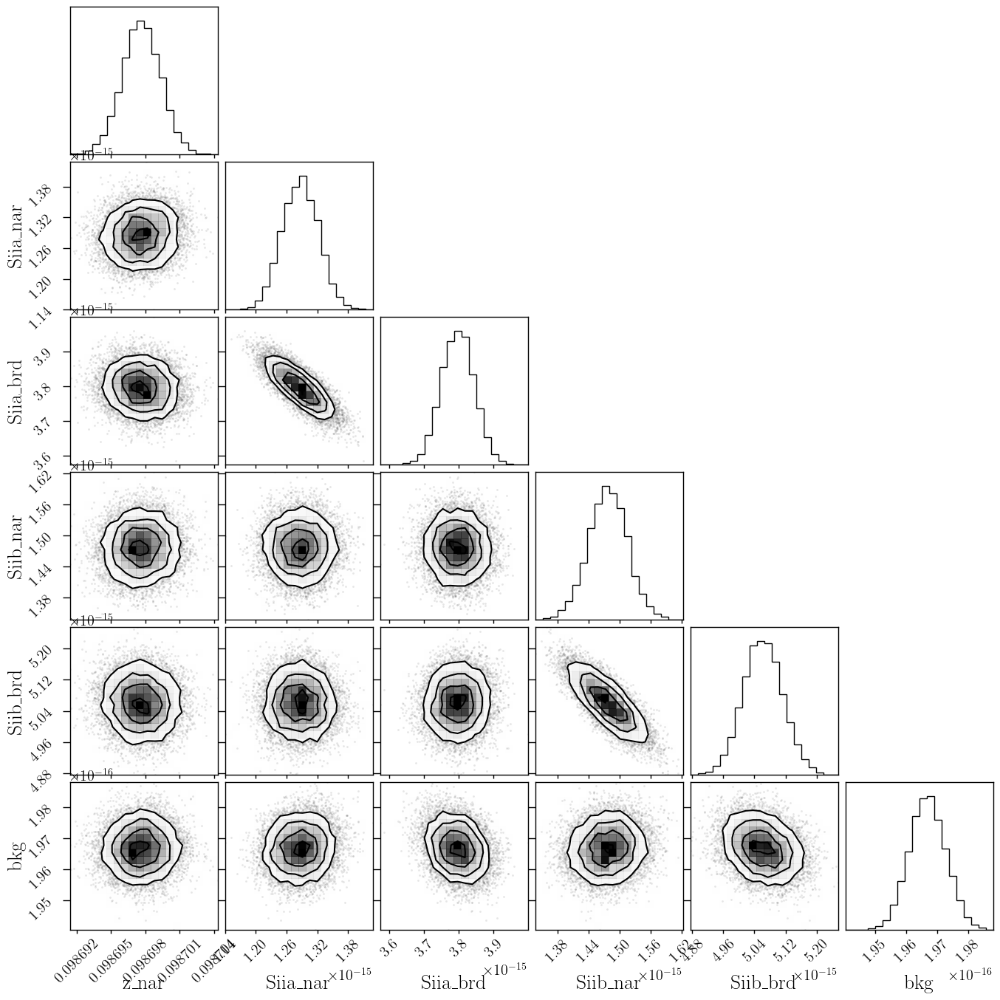

In [107]:
corner.corner(out_sii.flatchain, labels=out_sii.var_names);

In [108]:
out_sii.params

name,value,standard error,relative error,initial value,min,max,vary
z_nar,0.09869761,1.6869e-06,(0.00%),0.09867719705615696,-inf,inf,True
z_ratio,1.00012632,,,1.0001263225003523,-inf,inf,False
sigma_6730_nar,1.50057894,,,1.500578939314725,-inf,inf,False
sigma_6730_brd,3.36256030,,,3.3625603041033734,-inf,inf,False
sigma_6716_nar,1.50057894,,,1.500578939314725,-inf,inf,False
sigma_6716_brd,3.36256030,,,3.3625603041033734,-inf,inf,False
Siia_nar,1.2862e-15,3.5509e-17,(2.76%),1.2e-15,0.00000000,inf,True
Siia_brd,3.7950e-15,4.7729e-17,(1.26%),4e-15,0.00000000,inf,True
Siib_nar,1.4771e-15,3.7261e-17,(2.52%),2e-15,0.00000000,inf,True
Siib_brd,5.0602e-15,5.1102e-17,(1.01%),4e-15,0.00000000,inf,True


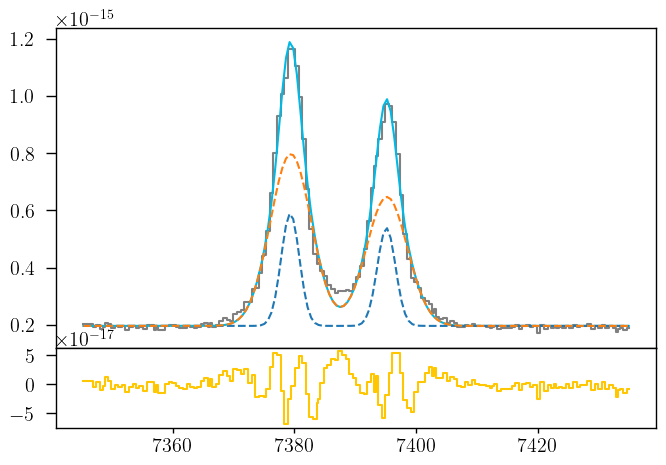

In [109]:
siia_nar_flux = out_sii.flatchain.Siia_nar.mean()
siia_nar_std = out_sii.flatchain.Siia_nar.std()

siia_brd_flux = out_sii.flatchain.Siia_brd.mean()
siia_brd_std = out_sii.flatchain.Siia_brd.std()

siib_nar_flux = out_sii.flatchain.Siib_nar.mean()
siib_nar_std = out_sii.flatchain.Siib_nar.std()

siib_brd_flux = out_sii.flatchain.Siib_brd.mean()
siib_brd_std = out_sii.flatchain.Siib_brd.std()

z_sii = out_sii.flatchain.z_nar.mean()
z_sii_std = out_sii.flatchain.z_nar.std()

bkg_sii = out_sii.flatchain.bkg.mean()
bkg_sii_std = out_sii.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(sii.wavelength, sii.flux, color='gray', label='Data', where='mid')

siia_nar = gaussian(sii.wavelength, siia_nar_flux, wave_cat['[SII]6730'], z_sii, upy.nominal_values(sigma_nar_6730))
siib_nar = gaussian(sii.wavelength, siib_nar_flux, wave_cat['[SII]6716'], z_sii, upy.nominal_values(sigma_nar_6730))

siia_brd = gaussian(sii.wavelength, siia_brd_flux, wave_cat['[SII]6730'], z_sii * z_ratio, upy.nominal_values(sigma_brd_6730))
siib_brd = gaussian(sii.wavelength, siib_brd_flux, wave_cat['[SII]6716'], z_sii * z_ratio, upy.nominal_values(sigma_brd_6730))

siia = siia_nar + siia_brd
siib = siib_nar + siib_brd

ax.plot(sii.wavelength, bkg_sii + siia + siib, color=c[0])
ax.plot(sii.wavelength, bkg_sii + siia_nar + siib_nar, ls='--')
ax.plot(sii.wavelength, bkg_sii + siia_brd + siib_brd, ls='--')
#plt.yscale('log')
ax1.step(sii.wavelength, sii.flux - bkg_sii - siia - siib, color=c[3], where='mid')

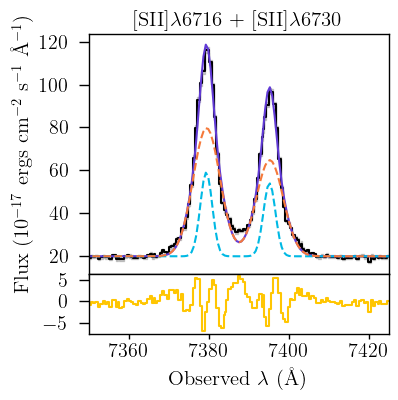

In [110]:
fig = plt.figure(1)
fig.set_size_inches(3, 3)
ax = fig.add_axes((0, .2, 1, .8), sharex=ax1)
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(sii.wavelength, sii.flux /1e-17, color='black', where='mid')
ax.fill_between(sii.wavelength, (sii.flux - sii.noise) /1e-17,
                                (sii.flux + sii.noise) /1e-17,
                                color='gray', alpha=0.4, step='mid')

siia_nar = gaussian(sii.wavelength, siia_nar_flux, wave_cat['[SII]6730'], z_sii, upy.nominal_values(sigma_nar_6730))
siib_nar = gaussian(sii.wavelength, siib_nar_flux, wave_cat['[SII]6716'], z_sii, upy.nominal_values(sigma_nar_6730))

siia_brd = gaussian(sii.wavelength, siia_brd_flux, wave_cat['[SII]6730'], z_sii * z_ratio, upy.nominal_values(sigma_brd_6730))
siib_brd = gaussian(sii.wavelength, siib_brd_flux, wave_cat['[SII]6716'], z_sii * z_ratio, upy.nominal_values(sigma_brd_6730))

siia = siia_nar + siia_brd
siib = siib_nar + siib_brd

ax.plot(sii.wavelength, (bkg_sii + siia + siib) / 1e-17, color=c[2])
ax.plot(sii.wavelength, (bkg_sii + siia_nar + siib_nar) / 1e-17, ls='--', color=c[0])
ax.plot(sii.wavelength, (bkg_sii + siia_brd + siib_brd) / 1e-17, ls='--', color=cz[0])
#plt.yscale('log')
ax1.step(sii.wavelength, (sii.flux - bkg_sii - siia - siib) / 1e-17, color=c[3], where='mid')
ax.set_ylabel(r'Flux ($10^{-17}$ ergs  cm$^{-2}$ s$^{-1}$ \AA$^{-1}$)', fontsize=15)
ax1.set_xlabel(r'Observed $\lambda$ (\AA)', fontsize=15)
ax.set_xlim(7350, 7425)
ax1.set_xlim(7350, 7425)
ax.set_title('[SII]$\lambda$6716 + [SII]$\lambda$6730', fontsize=15)
ax.set_xticklabels([]);
#fig.savefig('/home/benjamin/Documents/analogs/SII6730_J0021.pdf', bbox_inches='tight')

In [111]:
# EW
EW_SII_6730_nar = ufloat(siia_nar_flux, siia_nar_std) / ufloat(bkg_sii, bkg_sii_std)
EW_SII_6730_brd = ufloat(siia_brd_flux, siia_brd_std) / ufloat(bkg_sii, bkg_sii_std)
EW_SII_6730 = (ufloat(siia_nar_flux, siia_nar_std) + ufloat(siia_brd_flux, siia_brd_std)) / ufloat(bkg_sii, bkg_sii_std)

EW_SII_6716_nar = ufloat(siib_nar_flux, siib_nar_std) / ufloat(bkg_sii, bkg_sii_std)
EW_SII_6716_brd = ufloat(siib_brd_flux, siib_brd_std) / ufloat(bkg_sii, bkg_sii_std)
EW_SII_6716 = (ufloat(siib_nar_flux, siib_nar_std) + ufloat(siib_brd_flux, siib_brd_std)) / ufloat(bkg_sii, bkg_sii_std)

# H$\beta$

### Arc lines

In [112]:
# Select a region of the arc spectra to have a few arc lines around the wavelength of the fitted lines
wlims_hb = [wave_cat['Hb']*(1 + z_BN[igal]) - 20, wave_cat['Hb']*(1 + z_BN[igal]) + 20]
mask_arc_hb = (wcal_red[8].data['wave_soln'][0] >= wlims_hb[0]) & (wcal_red[8].data['wave_soln'][0] < wlims_hb[1])

# Arc spectra around the fitted line
x_arc_hb = wcal_red[8].data['wave_soln'][0][mask_arc_hb]
y_arc_hb = wcal_red[21].data[:, 3][mask_arc_hb]

100%|██████████████████████████████████████| 2500/2500 [00:21<00:00, 118.13it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 4 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [68.78052945 52.03564052 62.43344232 69.60317048]


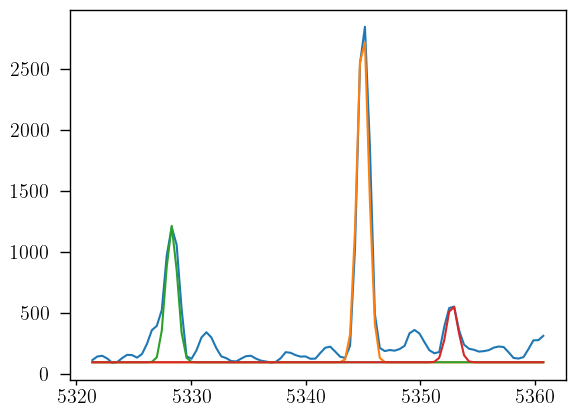

In [113]:
plt.plot(x_arc_hb, y_arc_hb)
plt.plot(x_arc_hb, 100 + gaussian(x_arc_hb, 3500, 5345, 0, 0.5))
plt.plot(x_arc_hb, 100 + gaussian(x_arc_hb, 1400, 5328.3, 0, 0.5))
plt.plot(x_arc_hb, 100 + gaussian(x_arc_hb, 600, 5352.8, 0, 0.5))

params_arc_hb = Parameters()
params_arc_hb.add('z', value=0.0, vary=False)
params_arc_hb.add('mu1', value=5345, vary=False)
params_arc_hb.add('mu2', value=5328.3, vary=False)
params_arc_hb.add('mu3', value=5352.8, vary=False)
params_arc_hb.add('arc1', value=3500, min=0.)
params_arc_hb.add('arc2', value=1400, min=0.)
params_arc_hb.add('arc3', value=600, min=0.)
params_arc_hb.add('sigma', value=0.5, min=0.)
params_arc_hb.add('bkg', value=100, vary=False)

def residual_arc_hb(params_arc_hb, x, data, uncertainty):
    
    z = params_arc_hb['z']
    mu1 = params_arc_hb['mu1']
    mu2 = params_arc_hb['mu2']
    mu3 = params_arc_hb['mu3']
    flux1 = params_arc_hb['arc1']
    flux2 = params_arc_hb['arc2']
    flux3 = params_arc_hb['arc3']
    sigma = params_arc_hb['sigma']
    bkg = params_arc_hb['bkg']
    
    x = x_arc_hb
    model1 = gaussian(x, flux1, mu1, z, sigma)
    model2 = gaussian(x, flux2, mu2, z, sigma)
    model3 = gaussian(x, flux3, mu3, z, sigma)
    model = bkg + model1 + model2 + model3
    return (model - y_arc_hb) / 10

np.random.seed(21)
out_arc_hb = minimize(residual_arc_hb, params_arc_hb, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10)

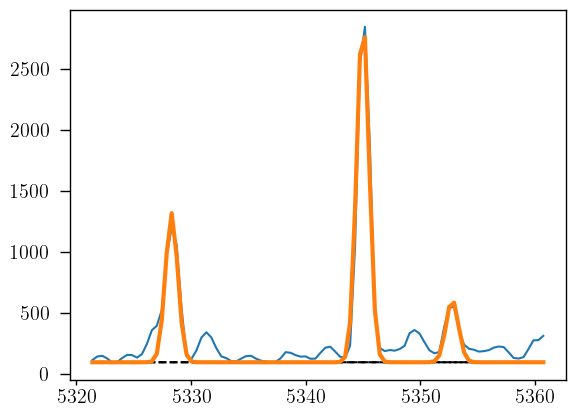

In [114]:
arc1_hb = out_arc_hb.flatchain.arc1.mean()
arc2_hb = out_arc_hb.flatchain.arc2.mean()
arc3_hb = out_arc_hb.flatchain.arc3.mean()
sigma_arc_hb = out_arc_hb.flatchain.sigma.mean()

plt.plot(x_arc_hb, y_arc_hb)

plt.plot(x_arc_hb, 100 + gaussian(x_arc_hb, arc1_hb, 5345, 0, sigma_arc_hb), ls='--', color='black')
plt.plot(x_arc_hb, 100 + gaussian(x_arc_hb, arc2_hb, 5328.3, 0, sigma_arc_hb), ls='--', color='black')
plt.plot(x_arc_hb, 100 + gaussian(x_arc_hb, arc3_hb, 5352.8, 0, sigma_arc_hb), ls='--', color='black')

plt.plot(x_arc_hb, 100 + gaussian(x_arc_hb, arc1_hb, 5345, 0, sigma_arc_hb) \
         + gaussian(x_arc_hb, arc2_hb, 5328.3, 0, sigma_arc_hb) \
         + gaussian(x_arc_hb, arc3_hb, 5352.8, 0, sigma_arc_hb), lw=3
)

### Line fitting

In [115]:
sigma_nar_hb = upy.sqrt((sigma_nar_intrinsic**2) + (sigma_arc_hb**2))
sigma_brd_hb = upy.sqrt((sigma_brd_intrinsic**2) + (sigma_arc_hb**2))

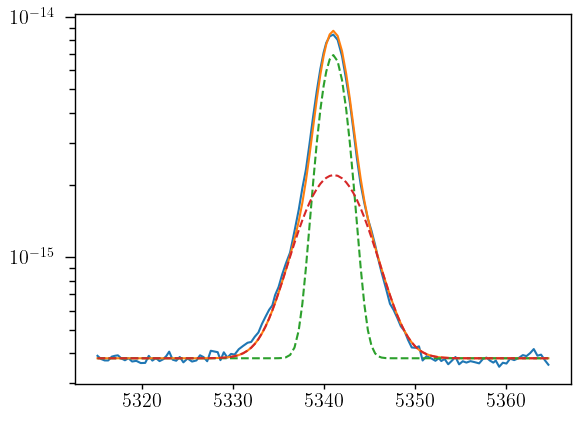

In [116]:
plt.plot(hbeta.wavelength, hbeta.flux)
bkg = 3.8e-16

hb_nar = gaussian(hbeta.wavelength, 2.2e-14, wave_cat['Hb'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_hb))
hb_brd = gaussian(hbeta.wavelength, 1.5e-14, wave_cat['Hb'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_hb))

hb = hb_nar + hb_brd

plt.plot(hbeta.wavelength, hb + bkg)
plt.plot(hbeta.wavelength, hb_nar + bkg, ls='--')
plt.plot(hbeta.wavelength, hb_brd + bkg, ls='--')
plt.yscale('log')

In [117]:
params_hb = Parameters()
params_hb.add('z_nar', value=z_nar_oiii_4959, vary=True)
params_hb.add('z_ratio', value=z_ratio, vary=False)
params_hb.add('sigma_hb_nar', value=upy.nominal_values(sigma_nar_hb), vary=False)
params_hb.add('sigma_hb_brd', value=upy.nominal_values(sigma_brd_hb), vary=False)
params_hb.add('Hb_nar', value=2.2e-14, min=0.)
params_hb.add('Hb_brd', value=1.5e-14, min=0.)
params_hb.add('bkg', value=3.8e-16, min=0.)

def residual_hb(params_hb, x, data, uncertainty):
    
    z_nar = params_hb['z_nar']
    z_brd = params_hb['z_nar'] * params_hb['z_ratio']
    sigma_hb_nar = params_hb['sigma_hb_nar']
    sigma_hb_brd = params_hb['sigma_hb_brd']
    hb_nar_flux = params_hb['Hb_nar']
    hb_brd_flux = params_hb['Hb_brd']
    bkg = params_hb['bkg']
    
    x = hbeta.wavelength
    model = gaussian(x, hb_nar_flux, wave_cat['Hb'], z_nar, sigma_hb_nar) + \
            gaussian(x, hb_brd_flux, wave_cat['Hb'], z_brd, sigma_hb_brd)
    return (model + bkg - hbeta.flux) / hbeta.noise

In [118]:
np.random.seed(21)
out_hb = minimize(residual_hb, params_hb, args=(1, 1, 1),
                   method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|██████████████████████████████████████| 2500/2500 [00:18<00:00, 136.37it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 3 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [28.06189772 79.98418291 79.29314712 60.91691192]


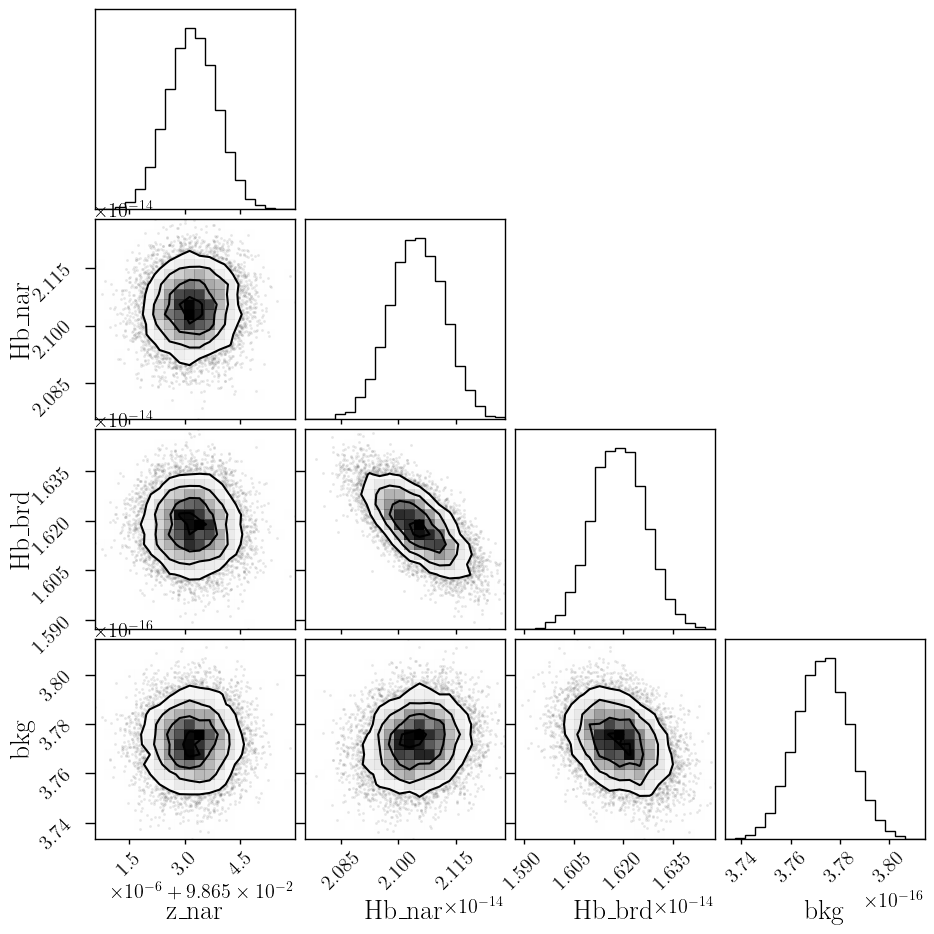

In [119]:
corner.corner(out_hb.flatchain, labels=out_hb.var_names);

In [120]:
out_hb.params

name,value,standard error,relative error,initial value,min,max,vary
z_nar,0.09865319,6.7074e-07,(0.00%),0.09867719705615696,-inf,inf,True
z_ratio,1.00012632,,,1.0001263225003523,-inf,inf,False
sigma_hb_nar,1.33823562,,,1.3382356185634643,-inf,inf,False
sigma_hb_brd,3.29331888,,,3.29331887560388,-inf,inf,False
Hb_nar,2.1048e-14,7.1303e-17,(0.34%),2.2e-14,0.00000000,inf,True
Hb_brd,1.6186e-14,8.0079e-17,(0.49%),1.5e-14,0.00000000,inf,True
bkg,3.7730e-16,1.0824e-18,(0.29%),3.8e-16,0.00000000,inf,True


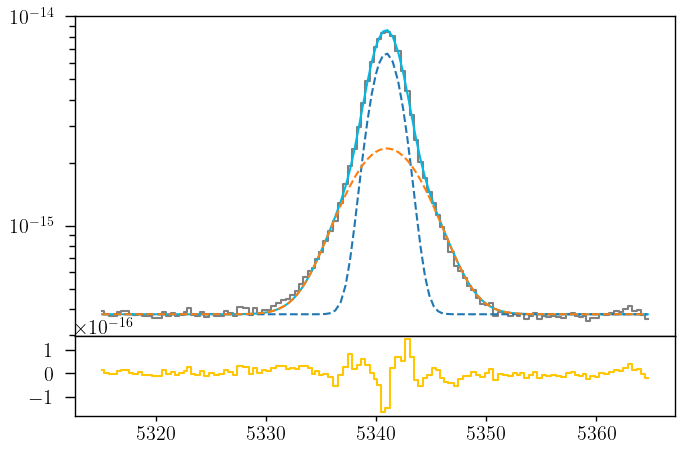

In [121]:
hb_nar_flux = out_hb.flatchain.Hb_nar.mean()
hb_nar_std = out_hb.flatchain.Hb_nar.std()

hb_brd_flux = out_hb.flatchain.Hb_brd.mean()
hb_brd_std = out_hb.flatchain.Hb_brd.std()

z_hb = out_hb.flatchain.z_nar.mean()
z_hb_std = out_hb.flatchain.z_nar.std()

bkg_hb = out_hb.flatchain.bkg.mean()
bkg_hb_std = out_hb.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(hbeta.wavelength, hbeta.flux, color='gray', label='Data', where='mid')

hb_nar = gaussian(hbeta.wavelength, hb_nar_flux, wave_cat['Hb'], z_hb, upy.nominal_values(sigma_nar_hb))
hb_brd = gaussian(hbeta.wavelength, hb_brd_flux, wave_cat['Hb'], z_hb * z_ratio, upy.nominal_values(sigma_brd_hb))

hb = hb_nar + hb_brd

ax.plot(hbeta.wavelength, bkg_hb + hb, color=c[0])
ax.plot(hbeta.wavelength, bkg_hb + hb_nar, ls='--')
ax.plot(hbeta.wavelength, bkg_hb + hb_brd, ls='--')
ax.set_yscale('log')
ax1.step(hbeta.wavelength, hbeta.flux - bkg_hb - hb, color=c[3], where='mid')

In [122]:
# EW
EW_Hb_nar = ufloat(hb_nar_flux, hb_nar_std) / ufloat(bkg_hb, bkg_hb_std)
EW_Hb_brd = ufloat(hb_brd_flux, hb_brd_std) / ufloat(bkg_hb, bkg_hb_std)
EW_Hb = (ufloat(hb_nar_flux, hb_nar_std) + ufloat(hb_brd_flux, hb_brd_std)) / ufloat(bkg_hb, bkg_hb_std)

# H$\gamma$

### Arc lines

In [123]:
wave_cat['Hg']*(1 + z_BN[igal])

4768.8765864

In [124]:
# Select a region of the arc spectra to have a few arc lines around the wavelength of the fitted lines
wlims_hg = [wave_cat['Hg']*(1 + z_BN[igal]) - 10, wave_cat['Hg']*(1 + z_BN[igal])]
mask_arc_hg = (wcal_blue[10].data['wave_soln'][0] >= wlims_hg[0]) & (wcal_blue[10].data['wave_soln'][0] < wlims_hg[1])

# Arc spectra around the fitted line
x_arc_hg = wcal_blue[10].data['wave_soln'][0][mask_arc_hg]
y_arc_hg = wcal_blue[27].data[:, 4][mask_arc_hg]

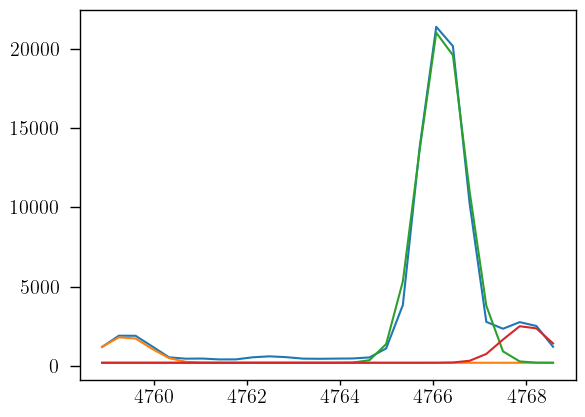

In [125]:
plt.plot(x_arc_hg, y_arc_hg)
plt.plot(x_arc_hg, 200 + gaussian(x_arc_hg,  2100, 4759.4, 0, 0.5))
plt.plot(x_arc_hg, 200 + gaussian(x_arc_hg, 27000, 4766.2, 0, 0.5))
plt.plot(x_arc_hg, 200 + gaussian(x_arc_hg,  3000,   4768, 0, 0.5))

In [126]:
params_arc_hg = Parameters()
params_arc_hg.add('z', value=0.0, vary=False)
params_arc_hg.add('mu1', value=4759.4, vary=False)
params_arc_hg.add('mu2', value=4766.2, vary=False)
params_arc_hg.add('mu3', value=  4768, vary=False)
params_arc_hg.add('arc1', value= 2100, min=0.)
params_arc_hg.add('arc2', value=27000, min=0.)
params_arc_hg.add('arc3', value= 3000, min=0.)
params_arc_hg.add('sigma', value=0.5, min=0.)
params_arc_hg.add('bkg', value=200, vary=False)

def residual_arc_hg(params_arc_hg, x, data, uncertainty):
    
    z = params_arc_hg['z']
    mu1 = params_arc_hg['mu1']
    mu2 = params_arc_hg['mu2']
    mu3 = params_arc_hg['mu3']
    flux1 = params_arc_hg['arc1']
    flux2 = params_arc_hg['arc2']
    flux3 = params_arc_hg['arc3']
    sigma = params_arc_hg['sigma']
    bkg = params_arc_hg['bkg']
    
    x = x_arc_hg
    model1 = gaussian(x, flux1, mu1, z, sigma)
    model2 = gaussian(x, flux2, mu2, z, sigma)
    model3 = gaussian(x, flux3, mu3, z, sigma)
    model = bkg + model1 + model2 + model3
    return (model - y_arc_hg) / 10

np.random.seed(21)
out_arc_hg = minimize(residual_arc_hg, params_arc_hg, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10)

100%|██████████████████████████████████████| 2500/2500 [00:20<00:00, 122.73it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 3 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [61.4316202  61.99416992 34.93355727 54.13155388]


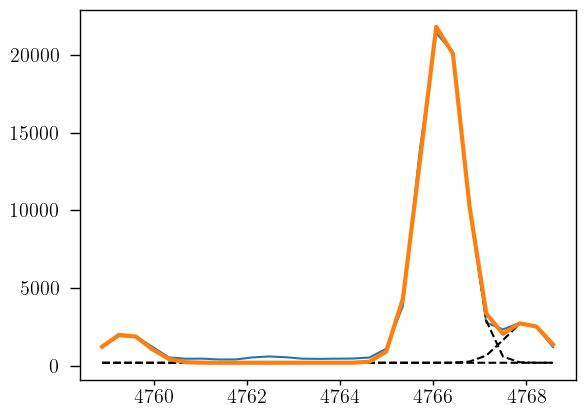

In [127]:
arc1_hg = out_arc_hg.flatchain.arc1.mean()
arc2_hg = out_arc_hg.flatchain.arc2.mean()
arc3_hg = out_arc_hg.flatchain.arc3.mean()
sigma_arc_hg = out_arc_hg.flatchain.sigma.mean()

plt.plot(x_arc_hg, y_arc_hg)

plt.plot(x_arc_hg, 200 + gaussian(x_arc_hg, arc1_hg, 4759.4, 0, sigma_arc_hg), ls='--', color='black')
plt.plot(x_arc_hg, 200 + gaussian(x_arc_hg, arc2_hg, 4766.2, 0, sigma_arc_hg), ls='--', color='black')
plt.plot(x_arc_hg, 200 + gaussian(x_arc_hg, arc3_hg,   4768, 0, sigma_arc_hg), ls='--', color='black')

plt.plot(x_arc_hg, 200 + gaussian(x_arc_hg, arc1_hg, 4759.4, 0, sigma_arc_hg) \
                       + gaussian(x_arc_hg, arc2_hg, 4766.2, 0, sigma_arc_hg) \
                       + gaussian(x_arc_hg, arc3_hg,   4768, 0, sigma_arc_hg), lw=3
)

### Line fitting

In [128]:
sigma_nar_hg = upy.sqrt((sigma_nar_intrinsic**2) + (sigma_arc_hg**2))
sigma_brd_hg = upy.sqrt((sigma_brd_intrinsic**2) + (sigma_arc_hg**2))

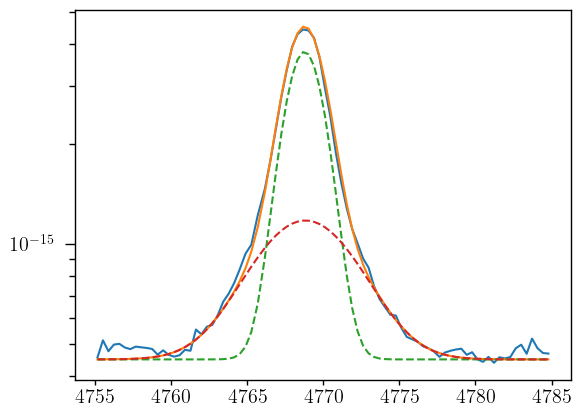

In [129]:
plt.plot(hgamma.wavelength, hgamma.flux)
bkg = 4.5e-16

hg_nar = gaussian(hgamma.wavelength, 1.1e-14, wave_cat['Hg'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_hg))
hg_brd = gaussian(hgamma.wavelength, 6e-15, wave_cat['Hg'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_hg))

hg = hg_nar + hg_brd

plt.plot(hgamma.wavelength, hg + bkg)
plt.plot(hgamma.wavelength, hg_nar + bkg, ls='--')
plt.plot(hgamma.wavelength, hg_brd + bkg, ls='--')
plt.yscale('log')

In [130]:
params_hg = Parameters()
params_hg.add('z_nar', value=z_nar_oiii_4959, vary=True)
params_hg.add('z_ratio', value=z_ratio, vary=False)
params_hg.add('sigma_nar', value=upy.nominal_values(sigma_nar_hg), vary=False)
params_hg.add('sigma_brd', value=upy.nominal_values(sigma_brd_hg), vary=False)
params_hg.add('Hg_nar', value=1.1e-14, min=0.)
params_hg.add('Hg_brd', value=0.6e-14, min=0.)
params_hg.add('bkg', value=4.5e-16, min=0.)

def residual_hg(params_hg, x, data, uncertainty):
    
    z_nar = params_hg['z_nar']
    z_brd = params_hg['z_nar'] * params_hg['z_ratio']
    sigma_nar = params_hg['sigma_nar']
    sigma_brd = params_hg['sigma_brd']
    hg_nar_flux = params_hg['Hg_nar']
    hg_brd_flux = params_hg['Hg_brd']
    bkg = params_hg['bkg']
    
    x = hgamma.wavelength
    model = gaussian(x, hg_nar_flux, wave_cat['Hg'], z_nar, sigma_nar) + \
            gaussian(x, hg_brd_flux, wave_cat['Hg'], z_brd, sigma_brd)
    return (model + bkg - hgamma.flux) / hgamma.noise

In [131]:
np.random.seed(21)
out_hg = minimize(residual_hg, params_hg, args=(1, 1, 1),
                   method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|██████████████████████████████████████| 2500/2500 [00:18<00:00, 137.38it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [35.49044265 55.97792416 41.91360994 57.51047474]


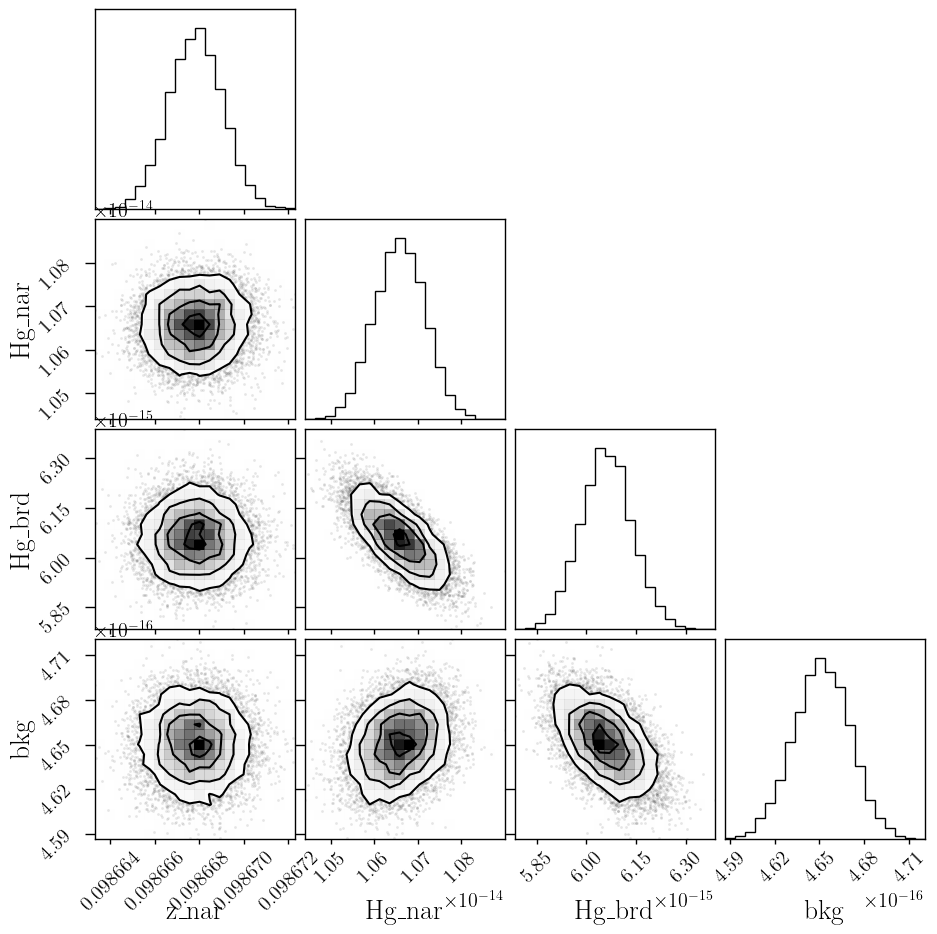

In [132]:
corner.corner(out_hg.flatchain, labels=out_hg.var_names);

In [133]:
out_hg.params

name,value,standard error,relative error,initial value,min,max,vary
z_nar,0.09866783,1.2152e-06,(0.00%),0.09867719705615696,-inf,inf,True
z_ratio,1.00012632,,,1.0001263225003523,-inf,inf,False
sigma_nar,1.30846030,,,1.3084603022119377,-inf,inf,False
sigma_brd,3.28133250,,,3.281332504956092,-inf,inf,False
Hg_nar,1.0658e-14,5.8654e-17,(0.55%),1.1e-14,0.00000000,inf,True
Hg_brd,6.0580e-15,7.6570e-17,(1.26%),6e-15,0.00000000,inf,True
bkg,4.6514e-16,1.9139e-18,(0.41%),4.5e-16,0.00000000,inf,True


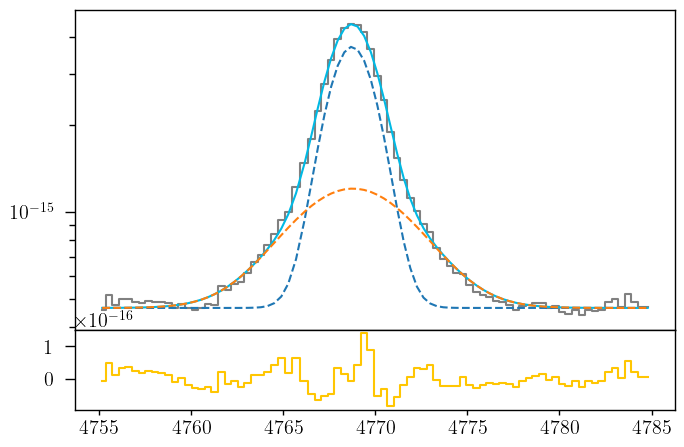

In [134]:
hg_nar_flux = out_hg.flatchain.Hg_nar.mean()
hg_nar_std = out_hg.flatchain.Hg_nar.std()

hg_brd_flux = out_hg.flatchain.Hg_brd.mean()
hg_brd_std = out_hg.flatchain.Hg_brd.std()

z_hg = out_hg.flatchain.z_nar.mean()
z_hg_std = out_hg.flatchain.z_nar.std()

bkg_hg = out_hg.flatchain.bkg.mean()
bkg_hg_std = out_hg.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(hgamma.wavelength, hgamma.flux, color='gray', label='Data', where='mid')

hg_nar = gaussian(hgamma.wavelength, hg_nar_flux, wave_cat['Hg'],           z_hg, upy.nominal_values(sigma_nar_hg))
hg_brd = gaussian(hgamma.wavelength, hg_brd_flux, wave_cat['Hg'], z_hg * z_ratio, upy.nominal_values(sigma_brd_hg))

hg = hg_nar + hg_brd

ax.plot(hgamma.wavelength, bkg_hg + hg, color=c[0])
ax.plot(hgamma.wavelength, bkg_hg + hg_nar, ls='--')
ax.plot(hgamma.wavelength, bkg_hg + hg_brd, ls='--')
ax.set_yscale('log')
ax1.step(hgamma.wavelength, hgamma.flux - bkg_hg - hg, color=c[3], where='mid')

In [135]:
# EW
EW_Hg_nar = ufloat(hg_nar_flux, hg_nar_std) / ufloat(bkg_hg, bkg_hg_std)
EW_Hg_brd = ufloat(hg_brd_flux, hg_brd_std) / ufloat(bkg_hg, bkg_hg_std)
EW_Hg = (ufloat(hg_nar_flux, hg_nar_std) + ufloat(hg_brd_flux, hg_brd_std)) / ufloat(bkg_hg, bkg_hg_std)

# H$\delta$

### Arc lines

In [136]:
wave_cat['Hd']*(1 + z_BN[igal])

4506.5490813399

In [137]:
# Select a region of the arc spectra to have a few arc lines around the wavelength of the fitted lines
wlims_hd = [wave_cat['Hd']*(1 + z_BN[igal]) + 2, wave_cat['Hd']*(1 + z_BN[igal]) + 10]
mask_arc_hd = (wcal_blue[10].data['wave_soln'][0] >= wlims_hd[0]) & (wcal_blue[10].data['wave_soln'][0] < wlims_hd[1])

# Arc spectra around the fitted line
x_arc_hd = wcal_blue[10].data['wave_soln'][0][mask_arc_hd]
y_arc_hd = wcal_blue[27].data[:, 4][mask_arc_hd]

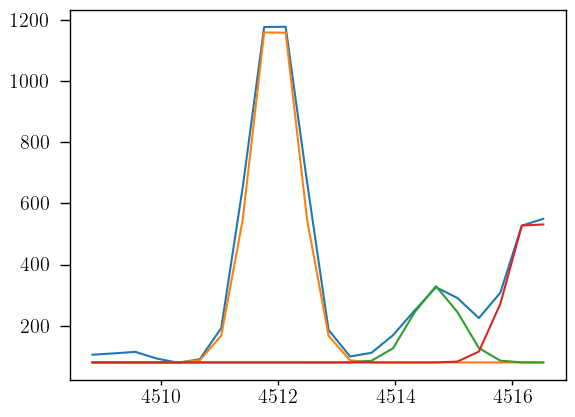

In [138]:
plt.plot(x_arc_hd, y_arc_hd)
plt.plot(x_arc_hd, 80 + gaussian(x_arc_hd,  1200, 4511.95, 0, 0.4))
plt.plot(x_arc_hd, 80 + gaussian(x_arc_hd,   250,  4514.7, 0, 0.4))
plt.plot(x_arc_hd, 80 + gaussian(x_arc_hd,   500, 4516.35, 0, 0.4))

In [139]:
params_arc_hd = Parameters()
params_arc_hd.add('z', value=0.0, vary=False)
params_arc_hd.add('mu1', value=4511.95, vary=False)
params_arc_hd.add('mu2', value= 4514.7, vary=False)
params_arc_hd.add('mu3', value=4516.35, vary=False)
params_arc_hd.add('arc1', value=1200, min=0.)
params_arc_hd.add('arc2', value= 250, min=0.)
params_arc_hd.add('arc3', value= 500, min=0.)
params_arc_hd.add('sigma', value=0.4, min=0.)
params_arc_hd.add('bkg', value=80, vary=False)

def residual_arc_hd(params_arc_hd, x, data, uncertainty):
    
    z = params_arc_hd['z']
    mu1 = params_arc_hd['mu1']
    mu2 = params_arc_hd['mu2']
    mu3 = params_arc_hd['mu3']
    flux1 = params_arc_hd['arc1']
    flux2 = params_arc_hd['arc2']
    flux3 = params_arc_hd['arc3']
    sigma = params_arc_hd['sigma']
    bkg = params_arc_hd['bkg']
    
    x = x_arc_hd
    model1 = gaussian(x, flux1, mu1, z, sigma)
    model2 = gaussian(x, flux2, mu2, z, sigma)
    model3 = gaussian(x, flux3, mu3, z, sigma)
    model = bkg + model1 + model2 + model3
    return (model - y_arc_hd) / 10

np.random.seed(21)
out_arc_hd = minimize(residual_arc_hd, params_arc_hd, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10)

100%|██████████████████████████████████████| 2500/2500 [00:20<00:00, 124.49it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 3 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [52.5886789  39.97555445 50.77659927 56.43680363]


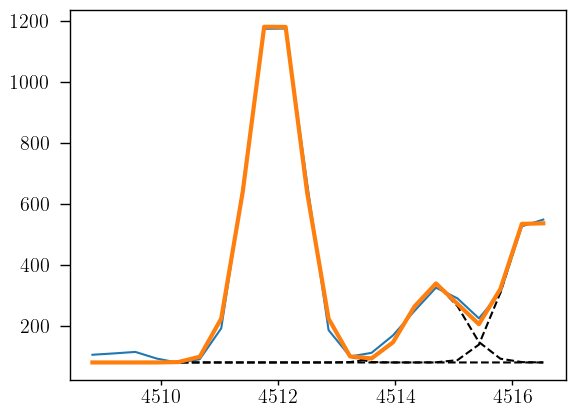

In [140]:
arc1_hd = out_arc_hd.flatchain.arc1.mean()
arc2_hd = out_arc_hd.flatchain.arc2.mean()
arc3_hd = out_arc_hd.flatchain.arc3.mean()
sigma_arc_hd = out_arc_hd.flatchain.sigma.mean()

plt.plot(x_arc_hd, y_arc_hd)

plt.plot(x_arc_hd, 80 + gaussian(x_arc_hd, arc1_hd, 4511.95, 0, sigma_arc_hd), ls='--', color='black')
plt.plot(x_arc_hd, 80 + gaussian(x_arc_hd, arc2_hd,  4514.7, 0, sigma_arc_hd), ls='--', color='black')
plt.plot(x_arc_hd, 80 + gaussian(x_arc_hd, arc3_hd, 4516.35, 0, sigma_arc_hd), ls='--', color='black')

plt.plot(x_arc_hd, 80 + gaussian(x_arc_hd, arc1_hd, 4511.95, 0, sigma_arc_hd) \
                      + gaussian(x_arc_hd, arc2_hd,  4514.7, 0, sigma_arc_hd) \
                      + gaussian(x_arc_hd, arc3_hd, 4516.35, 0, sigma_arc_hd), lw=3
)

### Line fitting

In [141]:
sigma_nar_hd = upy.sqrt((sigma_nar_intrinsic**2) + (sigma_arc_hd**2))
sigma_brd_hd = upy.sqrt((sigma_brd_intrinsic**2) + (sigma_arc_hd**2))

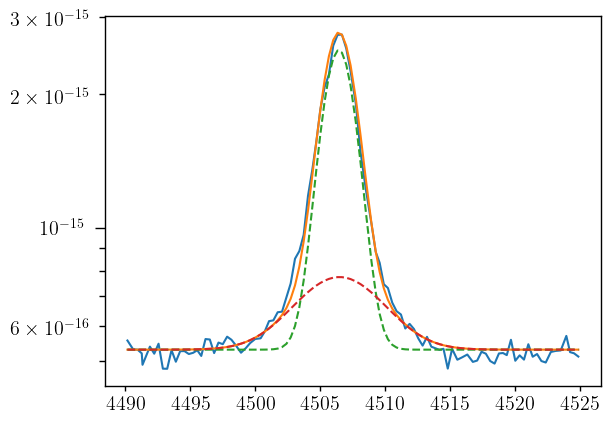

In [142]:
plt.plot(hdelta.wavelength, hdelta.flux)
bkg = 5.3e-16

hd_nar = gaussian(hdelta.wavelength, 6.5e-15, wave_cat['Hd'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_hd))
hd_brd = gaussian(hdelta.wavelength, 2e-15, wave_cat['Hd'], z=z_brd_oiii_4959,   sigma=upy.nominal_values(sigma_brd_hd))

hd = hd_nar + hd_brd

plt.plot(hdelta.wavelength, hd + bkg)
plt.plot(hdelta.wavelength, hd_nar + bkg, ls='--')
plt.plot(hdelta.wavelength, hd_brd + bkg, ls='--')
plt.yscale('log')

In [143]:
params_hd = Parameters()
params_hd.add('z_nar', value=z_nar_oiii_4959, vary=True)
params_hd.add('z_ratio', value=z_ratio, vary=False)
params_hd.add('sigma_nar', value=upy.nominal_values(sigma_nar_hd), vary=False)
params_hd.add('sigma_brd', value=upy.nominal_values(sigma_brd_hd), vary=False)
params_hd.add('Hd_nar', value=6.5e-15, min=0.)
params_hd.add('Hd_brd', value=2.0e-15, min=0.)
params_hd.add('bkg', value=5.3e-16, min=0.)

def residual_hd(params_hd, x, data, uncertainty):
    
    z_nar = params_hd['z_nar']
    z_brd = params_hd['z_nar'] * params_hd['z_ratio']
    sigma_nar = params_hd['sigma_nar']
    sigma_brd = params_hd['sigma_brd']
    hd_nar_flux = params_hd['Hd_nar']
    hd_brd_flux = params_hd['Hd_brd']
    bkg = params_hd['bkg']
    
    x = hdelta.wavelength
    model = gaussian(x, hd_nar_flux, wave_cat['Hd'], z_nar, sigma_nar) + \
            gaussian(x, hd_brd_flux, wave_cat['Hd'], z_brd, sigma_brd)
    return (model + bkg - hdelta.flux) / hdelta.noise

In [144]:
np.random.seed(21)
out_hd = minimize(residual_hd, params_hd, args=(1, 1, 1),
                   method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|██████████████████████████████████████| 2500/2500 [00:18<00:00, 137.84it/s]

The chain is shorter than 50 times the integrated autocorrelation time for 3 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [40.96110024 78.41545757 80.57942771 60.5508302 ]


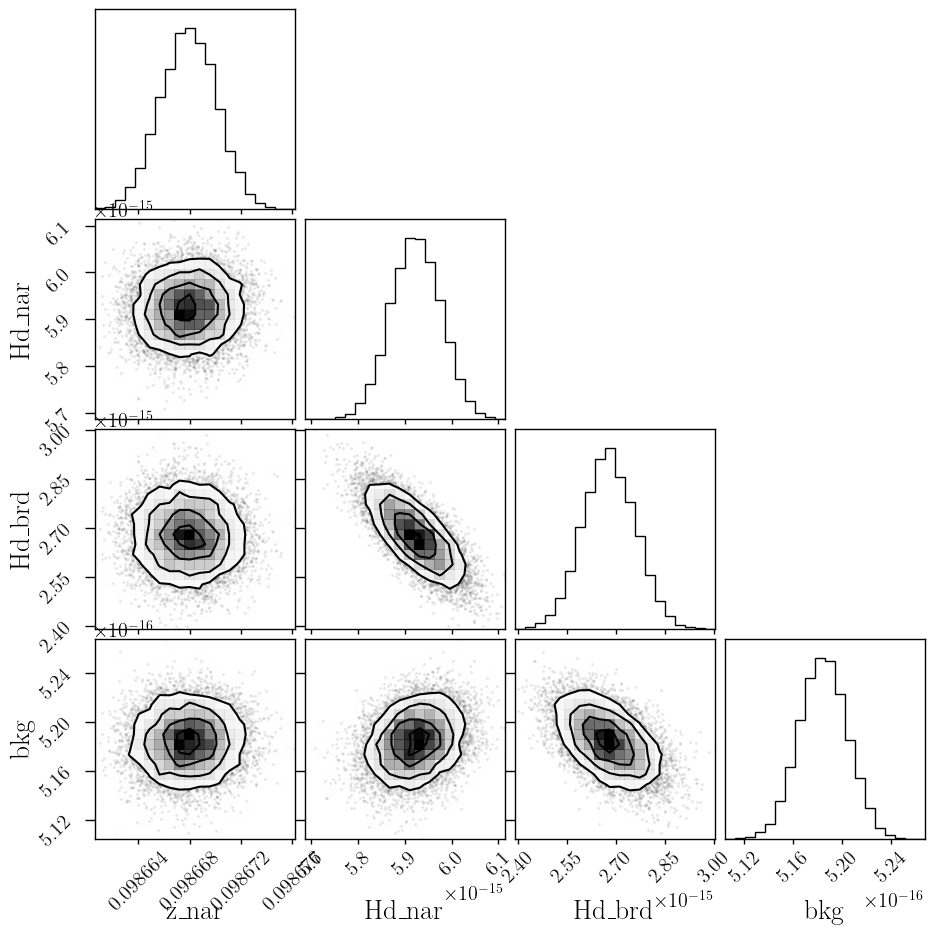

In [145]:
corner.corner(out_hd.flatchain, labels=out_hd.var_names);

In [146]:
out_hd.params

name,value,standard error,relative error,initial value,min,max,vary
z_nar,0.09866790,2.1836e-06,(0.00%),0.09867719705615696,-inf,inf,True
z_ratio,1.00012632,,,1.0001263225003523,-inf,inf,False
sigma_nar,1.30348260,,,1.3034825970219073,-inf,inf,False
sigma_brd,3.27935078,,,3.2793507781809255,-inf,inf,False
Hd_nar,5.9226e-15,5.3977e-17,(0.91%),6.5e-15,0.00000000,inf,True
Hd_brd,2.6772e-15,8.1275e-17,(3.04%),2e-15,0.00000000,inf,True
bkg,5.1843e-16,1.9844e-18,(0.38%),5.3e-16,0.00000000,inf,True


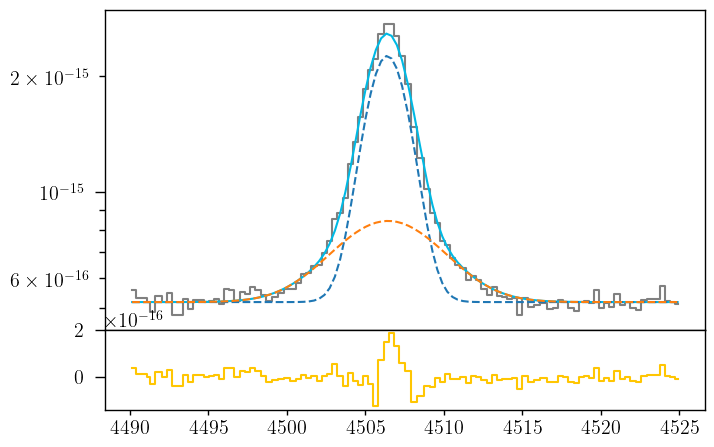

In [147]:
hd_nar_flux = out_hd.flatchain.Hd_nar.mean()
hd_nar_std = out_hd.flatchain.Hd_nar.std()

hd_brd_flux = out_hd.flatchain.Hd_brd.mean()
hd_brd_std = out_hd.flatchain.Hd_brd.std()

z_hd = out_hd.flatchain.z_nar.mean()
z_hd_std = out_hd.flatchain.z_nar.std()

bkg_hd = out_hd.flatchain.bkg.mean()
bkg_hd_std = out_hd.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(hdelta.wavelength, hdelta.flux, color='gray', label='Data', where='mid')

hd_nar = gaussian(hdelta.wavelength, hd_nar_flux, wave_cat['Hd'], z_hd, sigma_nar_oiii_4959)
hd_brd = gaussian(hdelta.wavelength, hd_brd_flux, wave_cat['Hd'], z_hd * z_ratio, sigma_brd_oiii_4959)

hd = hd_nar + hd_brd

ax.plot(hdelta.wavelength, bkg_hd + hd, color=c[0])
ax.plot(hdelta.wavelength, bkg_hd + hd_nar, ls='--')
ax.plot(hdelta.wavelength, bkg_hd + hd_brd, ls='--')
ax.set_yscale('log')
ax1.step(hdelta.wavelength, hdelta.flux - bkg_hd - hd, color=c[3], where='mid')

In [148]:
# EW
EW_Hd_nar = ufloat(hd_nar_flux, hd_nar_std) / ufloat(bkg_hd, bkg_hd_std)
EW_Hd_brd = ufloat(hd_brd_flux, hd_brd_std) / ufloat(bkg_hd, bkg_hd_std)
EW_Hd = (ufloat(hd_nar_flux, hd_nar_std) + ufloat(hd_brd_flux, hd_brd_std)) / ufloat(bkg_hd, bkg_hd_std)

# HeII 4686

### Arc lines

In [149]:
# Select a region of the arc spectra to have a few arc lines around the wavelength of the fitted lines
wlims_4685 = [wave_cat['HeII4685']*(1 + z_BN[igal]), wave_cat['HeII4685']*(1 + z_BN[igal]) + 10]
mask_arc_4685 = (wcal_red[6].data['wave_soln'][0] >= wlims_4685[0]) & (wcal_red[6].data['wave_soln'][0] < wlims_4685[1])

# Arc spectra around the fitted line
x_arc_4685 = wcal_red[6].data['wave_soln'][0][mask_arc_4685]
y_arc_4685 = wcal_red[21].data[:, 2][mask_arc_4685]

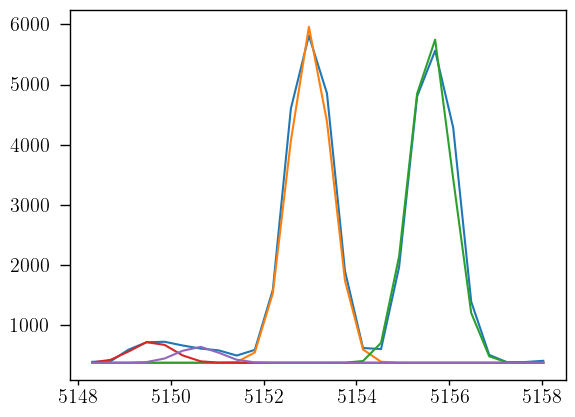

In [150]:
plt.plot(x_arc_4685, y_arc_4685)
plt.plot(x_arc_4685, 380 + gaussian(x_arc_4685, 6300, 5153, 0, 0.45))
plt.plot(x_arc_4685, 380 + gaussian(x_arc_4685, 6200, 5155.6, 0, 0.45))
plt.plot(x_arc_4685, 380 + gaussian(x_arc_4685, 400, 5149.6, 0, 0.45))
plt.plot(x_arc_4685, 380 + gaussian(x_arc_4685, 300, 5150.6, 0, 0.45))

100%|██████████████████████████████████████| 2500/2500 [00:23<00:00, 108.35it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 5 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [68.84193294 92.25386415 70.28272662 80.98746228 82.08835639]


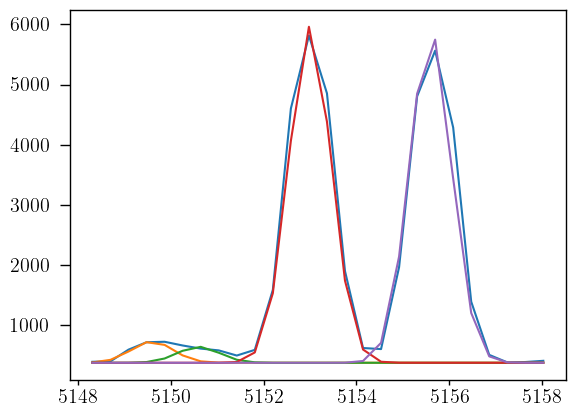

In [151]:
plt.plot(x_arc_4685, y_arc_4685)
plt.plot(x_arc_4685, 380 + gaussian(x_arc_4685, 400, 5149.6, 0, 0.45))
plt.plot(x_arc_4685, 380 + gaussian(x_arc_4685, 300, 5150.6, 0, 0.45))
plt.plot(x_arc_4685, 380 + gaussian(x_arc_4685, 6300, 5153, 0, 0.45))
plt.plot(x_arc_4685, 380 + gaussian(x_arc_4685, 6200, 5155.6, 0, 0.45))

params_arc_4685 = Parameters()
params_arc_4685.add('z', value=0.0, vary=False)
params_arc_4685.add('mu1', value=5149.6, vary=False)
params_arc_4685.add('mu2', value=5150.6, vary=False)
params_arc_4685.add('mu3', value=5153, vary=False)
params_arc_4685.add('mu4', value=5155.6, vary=False)
params_arc_4685.add('arc1', value=400, min=0.)
params_arc_4685.add('arc2', value=300, min=0.)
params_arc_4685.add('arc3', value=6300, min=0.)
params_arc_4685.add('arc4', value=6200, min=0.)
params_arc_4685.add('sigma', value=0.45, min=0.)
params_arc_4685.add('bkg', value=380, vary=False)

def residual_arc_4685(params_arc_4685, x, data, uncertainty):
    
    z = params_arc_4685['z']
    mu1 = params_arc_4685['mu1']
    mu2 = params_arc_4685['mu2']
    mu3 = params_arc_4685['mu3']
    mu4 = params_arc_4685['mu4']
    flux1 = params_arc_4685['arc1']
    flux2 = params_arc_4685['arc2']
    flux3 = params_arc_4685['arc3']
    flux4 = params_arc_4685['arc4']
    sigma = params_arc_4685['sigma']
    bkg = params_arc_4685['bkg']
    
    x = x_arc_4685
    model1 = gaussian(x, flux1, mu1, z, sigma)
    model2 = gaussian(x, flux2, mu2, z, sigma)
    model3 = gaussian(x, flux3, mu3, z, sigma)
    model4 = gaussian(x, flux4, mu4, z, sigma)
    model = bkg + model1 + model2 + model3 + model4
    return (model - y_arc_4685) / 10

np.random.seed(21)
out_arc_4685 = minimize(residual_arc_4685, params_arc_4685, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10)

In [152]:
out_arc_4685.params

name,value,standard error,relative error,initial value,min,max,vary
z,0.00000000,,,0.0,-inf,inf,False
mu1,5149.60000,,,5149.6,-inf,inf,False
mu2,5150.60000,,,5150.6,-inf,inf,False
mu3,5153.00000,,,5153,-inf,inf,False
mu4,5155.60000,,,5155.6,-inf,inf,False
arc1,397.233111,8.51244745,(2.14%),400,0.00000000,inf,True
arc2,275.058381,8.58663214,(3.12%),300,0.00000000,inf,True
arc3,6809.96976,9.05309589,(0.13%),6300,0.00000000,inf,True
arc4,6496.75360,8.99072415,(0.14%),6200,0.00000000,inf,True
sigma,0.47460011,5.2961e-04,(0.11%),0.45,0.00000000,inf,True


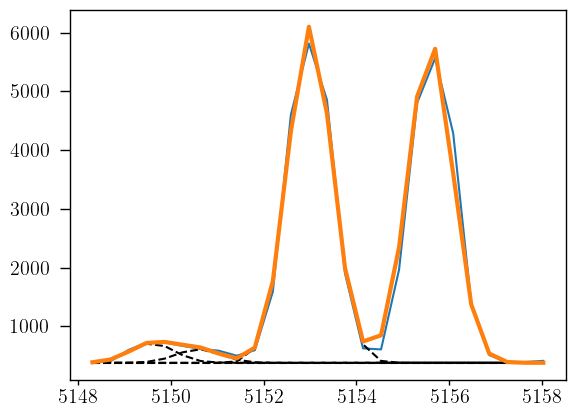

In [153]:
arc1_4685 = out_arc_4685.flatchain.arc1.mean()
arc2_4685 = out_arc_4685.flatchain.arc2.mean()
arc3_4685 = out_arc_4685.flatchain.arc3.mean()
arc4_4685 = out_arc_4685.flatchain.arc4.mean()
sigma_arc_4685 = out_arc_4685.flatchain.sigma.mean()

plt.plot(x_arc_4685, y_arc_4685)

plt.plot(x_arc_4685, 380 + gaussian(x_arc_4685, arc1_4685, 5149.6, 0, sigma_arc_4685), ls='--', color='black')
plt.plot(x_arc_4685, 380 + gaussian(x_arc_4685, arc2_4685, 5150.6, 0, sigma_arc_4685), ls='--', color='black')
plt.plot(x_arc_4685, 380 + gaussian(x_arc_4685, arc3_4685,  5153, 0, sigma_arc_4685), ls='--', color='black')
plt.plot(x_arc_4685, 380 + gaussian(x_arc_4685, arc4_4685, 4095.9, 0, sigma_arc_4685), ls='--', color='black')

plt.plot(x_arc_4685, 380 + gaussian(x_arc_4685, arc1_4685, 5149.6, 0, sigma_arc_4685) \
         + gaussian(x_arc_4685, arc2_4685, 5150.6, 0, sigma_arc_4685) \
         + gaussian(x_arc_4685, arc3_4685,   5153, 0, sigma_arc_4685) \
         + gaussian(x_arc_4685, arc4_4685, 5155.6, 0, sigma_arc_4685), lw=3
)

### Line fitting

In [154]:
sigma_nar_4685 = upy.sqrt((sigma_nar_intrinsic**2) + (sigma_arc_4685**2))
sigma_brd_4685 = upy.sqrt((sigma_brd_intrinsic**2) + (sigma_arc_4685**2))

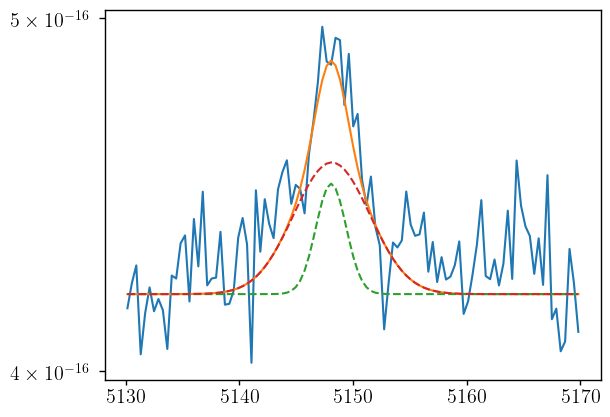

In [155]:
plt.plot(heii_4686.wavelength, heii_4686.flux)
bkg = 4.2e-16

heii4685_nar = gaussian(heii_4686.wavelength, 1e-16, wave_cat['HeII4685'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_4685))
heii4685_brd = gaussian(heii_4686.wavelength, 3e-16, wave_cat['HeII4685'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_4685))

heii4685 = heii4685_nar + heii4685_brd

plt.plot(heii_4686.wavelength, heii4685 + bkg)
plt.plot(heii_4686.wavelength, heii4685_nar + bkg, ls='--')
plt.plot(heii_4686.wavelength, heii4685_brd + bkg, ls='--')
plt.yscale('log')

In [156]:
params_4685 = Parameters()
params_4685.add('z_nar', value=z_nar_oiii_4959, vary=True)
params_4685.add('z_ratio', value=z_ratio, vary=False)
params_4685.add('sigma_heii4685_nar', value=upy.nominal_values(sigma_nar_4685), vary=False)
params_4685.add('sigma_heii4685_brd', value=upy.nominal_values(sigma_brd_4685), vary=False)
params_4685.add('Heii4685_nar', value=1e-16, min=0.)
params_4685.add('Heii4685_brd', value=3e-16, min=0.)
params_4685.add('bkg', value=4.2e-16, min=0.)

def residual_heii4685(params_4685, x, data, uncertainty):
    
    z_nar = params_4685['z_nar']
    z_brd = params_4685['z_nar'] * params_4685['z_ratio']
    sigma_heii4685_nar = params_4685['sigma_heii4685_nar']
    sigma_heii4685_brd = params_4685['sigma_heii4685_brd']
    heii4685_nar_flux = params_4685['Heii4685_nar']
    heii4685_brd_flux = params_4685['Heii4685_brd']
    bkg = params_4685['bkg']
    
    x = heii_4686.wavelength
    model = gaussian(x, heii4685_nar_flux, wave_cat['HeII4685'], z_nar, sigma_heii4685_nar) + \
            gaussian(x, heii4685_brd_flux, wave_cat['HeII4685'], z_brd, sigma_heii4685_brd)
    return (model + bkg - heii_4686.flux) / heii_4686.noise

In [157]:
np.random.seed(21)
out_heii4685 = minimize(residual_heii4685, params_4685, args=(1, 1, 1),
                   method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|██████████████████████████████████████| 2500/2500 [00:18<00:00, 135.45it/s]


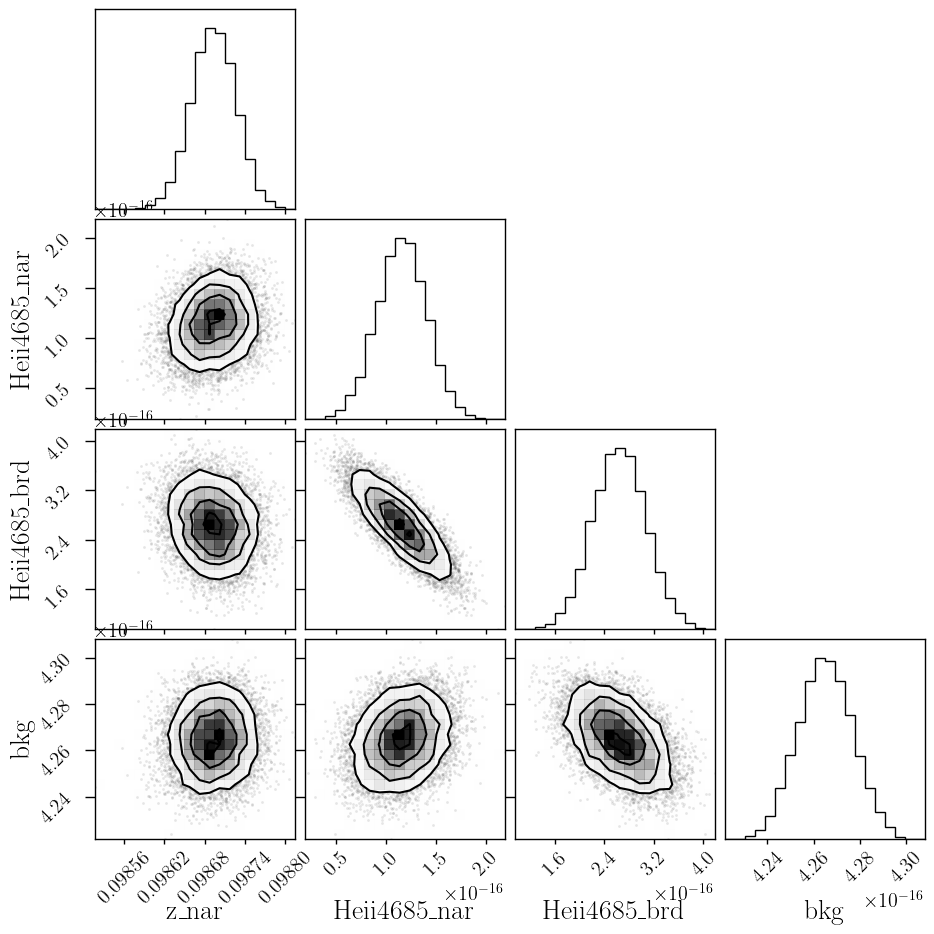

In [158]:
corner.corner(out_heii4685.flatchain, labels=out_heii4685.var_names);

In [159]:
out_heii4685.params

name,value,standard error,relative error,initial value,min,max,vary
z_nar,0.09869306,3.3074e-05,(0.03%),0.09867719705615696,-inf,inf,True
z_ratio,1.00012632,,,1.0001263225003523,-inf,inf,False
sigma_heii4685_nar,1.31396965,,,1.3139696493529838,-inf,inf,False
sigma_heii4685_brd,3.28353329,,,3.283533292817003,-inf,inf,False
Heii4685_nar,1.1566e-16,2.5158e-17,(21.75%),1e-16,0.00000000,inf,True
Heii4685_brd,2.6384e-16,4.3165e-17,(16.36%),3e-16,0.00000000,inf,True
bkg,4.2649e-16,1.1916e-18,(0.28%),4.2e-16,0.00000000,inf,True


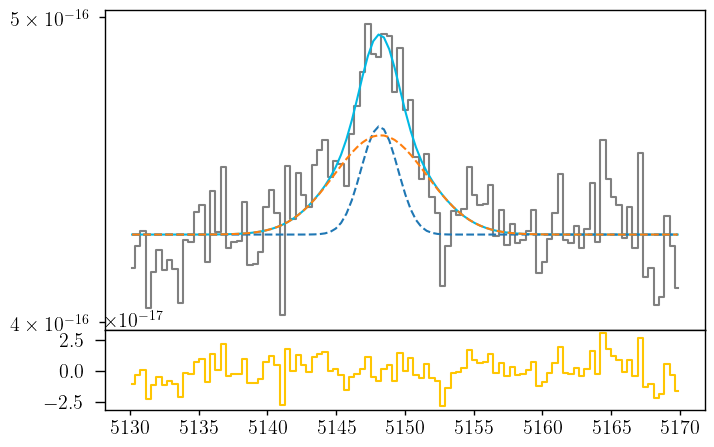

In [160]:
heii4685_nar_flux = out_heii4685.flatchain.Heii4685_nar.mean()
heii4685_nar_std = out_heii4685.flatchain.Heii4685_nar.std()

heii4685_brd_flux = out_heii4685.flatchain.Heii4685_brd.mean()
heii4685_brd_std = out_heii4685.flatchain.Heii4685_brd.std()

z_heii4685 = out_heii4685.flatchain.z_nar.mean()
z_heii4685_std = out_heii4685.flatchain.z_nar.std()

bkg_heii4685 = out_heii4685.flatchain.bkg.mean()
bkg_heii4685_std = out_heii4685.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(heii_4686.wavelength, heii_4686.flux, color='gray', label='Data', where='mid')

heii4685_nar = gaussian(heii_4686.wavelength, heii4685_nar_flux, wave_cat['HeII4685'], z_heii4685, upy.nominal_values(sigma_nar_4685))
heii4685_brd = gaussian(heii_4686.wavelength, heii4685_brd_flux, wave_cat['HeII4685'], z_heii4685 * z_ratio, upy.nominal_values(sigma_brd_4685))

heii4685 = heii4685_nar + heii4685_brd

ax.plot(heii_4686.wavelength, bkg_heii4685 + heii4685, color=c[0])
ax.plot(heii_4686.wavelength, bkg_heii4685 + heii4685_nar, ls='--')
ax.plot(heii_4686.wavelength, bkg_heii4685 + heii4685_brd, ls='--')
ax.set_yscale('log')
ax1.step(heii_4686.wavelength, heii_4686.flux - bkg_heii4685 - heii4685, color=c[3], where='mid')

In [161]:
# EW
EW_heii4685_nar = ufloat(heii4685_nar_flux, heii4685_nar_std) / ufloat(bkg_heii4685, bkg_heii4685_std)
EW_heii4685_brd = ufloat(heii4685_brd_flux, heii4685_brd_std) / ufloat(bkg_heii4685, bkg_heii4685_std)
EW_heii4685 = (ufloat(heii4685_nar_flux, heii4685_nar_std) + ufloat(heii4685_brd_flux, heii4685_brd_std)) / ufloat(bkg_heii4685, bkg_heii4685_std)

In [162]:
heii4685_tot_flux = (ufloat(heii4685_nar_flux, heii4685_nar_std) + ufloat(heii4685_brd_flux, heii4685_brd_std))

Text(0.5, 1.0, 'J0021')

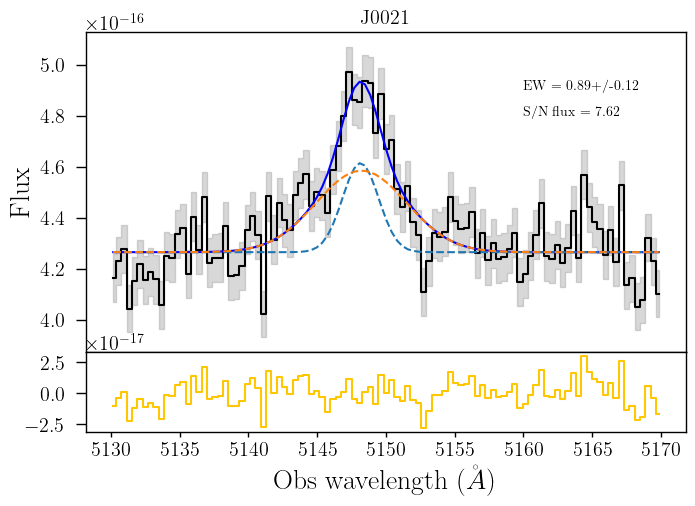

In [163]:
fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(heii_4686.wavelength, heii_4686.flux, color='black', label='Data', where='mid')

heii4685_nar = gaussian(heii_4686.wavelength, heii4685_nar_flux, wave_cat['HeII4685'], z_heii4685, upy.nominal_values(sigma_nar_4685))
heii4685_brd = gaussian(heii_4686.wavelength, heii4685_brd_flux, wave_cat['HeII4685'], z_heii4685 * z_ratio, upy.nominal_values(sigma_brd_4685))

heii4685 = heii4685_nar + heii4685_brd

ax.plot(heii_4686.wavelength, bkg_heii4685 + heii4685, color='blue')
ax.plot(heii_4686.wavelength, bkg_heii4685 + heii4685_nar, ls='--')
ax.plot(heii_4686.wavelength, bkg_heii4685 + heii4685_brd, ls='--')
#ax.set_yscale('log')
ax1.step(heii_4686.wavelength, heii_4686.flux - bkg_heii4685 - heii4685, color=c[3], where='mid')
ax.fill_between(heii_4686.wavelength, heii_4686.flux - heii_4686.noise,
                                      heii_4686.flux + heii_4686.noise,
                                      step='mid', color='gray', alpha=0.3)
ax1.set_xlabel('Obs wavelength ($\AA$)')
ax.set_ylabel('Flux')
ax.text(x=5160, y=4.9e-16, s='EW = '+str(EW_heii4685))
ax.text(x=5160, y=4.8e-16, s='S/N flux = '+str(round(heii4685_tot_flux.nominal_value/heii4685_tot_flux.std_dev, 2)))
ax.set_title('J0021')
#fig.savefig('/home/benjamin/Documents/analogs/HeIIJ0021.pdf', bbox_inches='tight')

# [OII]3726 + [OII]3729

### Arc lines

In [164]:
# Select a region of the arc spectra to have a few arc lines around the wavelength of the fitted lines
wlims_3729 = [wave_cat['[OII]3729']*(1 + z_BN[igal]) - 10, wave_cat['[OII]3729']*(1 + z_BN[igal]) + 10]
mask_arc_3729 = (wcal_blue[6].data['wave_soln'][0] >= wlims_3729[0]) & (wcal_blue[6].data['wave_soln'][0] < wlims_3729[1])

# Arc spectra around the fitted line
x_arc_3729 = wcal_blue[6].data['wave_soln'][0][mask_arc_3729]
y_arc_3729 = wcal_blue[27].data[:, 2][mask_arc_3729]

100%|███████████████████████████████████████| 2500/2500 [00:33<00:00, 75.46it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 8 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [ 56.96894038  88.81713093 145.99239809  63.64365113 121.81365773
  59.14712544  60.66126412  76.95906489]


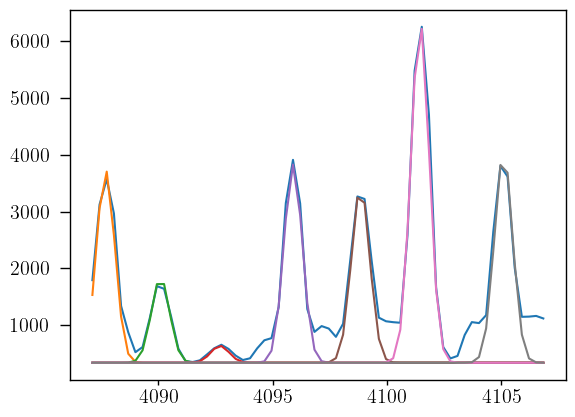

In [165]:
plt.plot(x_arc_3729, y_arc_3729)
plt.plot(x_arc_3729, 340 + gaussian(x_arc_3729, 3400, 4087.7, 0, 0.4))
plt.plot(x_arc_3729, 340 + gaussian(x_arc_3729, 1500, 4090.1, 0, 0.4))
plt.plot(x_arc_3729, 340 + gaussian(x_arc_3729, 300, 4092.7, 0, 0.4))
plt.plot(x_arc_3729, 340 + gaussian(x_arc_3729, 3500, 4095.9, 0, 0.4))
plt.plot(x_arc_3729, 340 + gaussian(x_arc_3729, 3100, 4098.85, 0, 0.4))
plt.plot(x_arc_3729, 340 + gaussian(x_arc_3729, 6000, 4101.45, 0, 0.4))
plt.plot(x_arc_3729, 340 + gaussian(x_arc_3729, 3700, 4105.1, 0, 0.4))

params_arc_3729 = Parameters()
params_arc_3729.add('z', value=0.0, vary=False)
params_arc_3729.add('mu1', value=4087.7, vary=False)
params_arc_3729.add('mu2', value=4090.1, vary=False)
params_arc_3729.add('mu3', value=4092.7, vary=False)
params_arc_3729.add('mu4', value=4095.9, vary=False)
params_arc_3729.add('mu5', value=4098.85, vary=False)
params_arc_3729.add('mu6', value=4101.45, vary=False)
params_arc_3729.add('mu7', value=4105.1, vary=False)
params_arc_3729.add('arc1', value=3400, min=0.)
params_arc_3729.add('arc2', value=1500, min=0.)
params_arc_3729.add('arc3', value=300, min=0.)
params_arc_3729.add('arc4', value=3500, min=0.)
params_arc_3729.add('arc5', value=3100, min=0.)
params_arc_3729.add('arc6', value=6000, min=0.)
params_arc_3729.add('arc7', value=3700, min=0.)
params_arc_3729.add('sigma', value=0.4, min=0.)
params_arc_3729.add('bkg', value=340, vary=False)

def residual_arc_3729(params_arc_3729, x, data, uncertainty):
    
    z = params_arc_3729['z']
    mu1 = params_arc_3729['mu1']
    mu2 = params_arc_3729['mu2']
    mu3 = params_arc_3729['mu3']
    mu4 = params_arc_3729['mu4']
    mu5 = params_arc_3729['mu5']
    mu6 = params_arc_3729['mu6']
    mu7 = params_arc_3729['mu7']
    flux1 = params_arc_3729['arc1']
    flux2 = params_arc_3729['arc2']
    flux3 = params_arc_3729['arc3']
    flux4 = params_arc_3729['arc4']
    flux5 = params_arc_3729['arc5']
    flux6 = params_arc_3729['arc6']
    flux7 = params_arc_3729['arc7']
    sigma = params_arc_3729['sigma']
    bkg = params_arc_3729['bkg']
    
    x = x_arc_3729
    model1 = gaussian(x, flux1, mu1, z, sigma)
    model2 = gaussian(x, flux2, mu2, z, sigma)
    model3 = gaussian(x, flux3, mu3, z, sigma)
    model4 = gaussian(x, flux4, mu4, z, sigma)
    model5 = gaussian(x, flux5, mu5, z, sigma)
    model6 = gaussian(x, flux6, mu6, z, sigma)
    model7 = gaussian(x, flux7, mu7, z, sigma)
    model = bkg + model1 + model2 + model3 + model4 + model5 + model6 + model7
    return (model - y_arc_3729) / 10

np.random.seed(21)
out_arc_3729 = minimize(residual_arc_3729, params_arc_3729, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10)

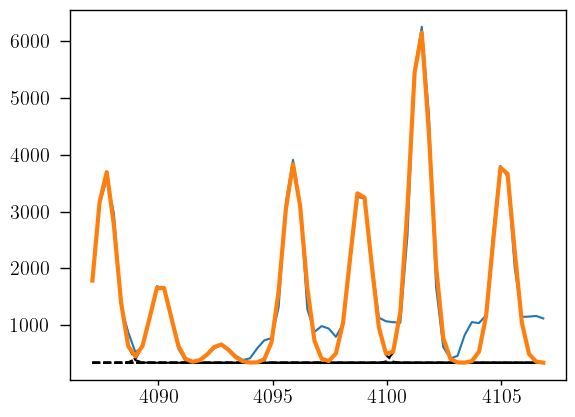

In [166]:
arc1_3729 = out_arc_3729.flatchain.arc1.mean()
arc2_3729 = out_arc_3729.flatchain.arc2.mean()
arc3_3729 = out_arc_3729.flatchain.arc3.mean()
arc4_3729 = out_arc_3729.flatchain.arc4.mean()
arc5_3729 = out_arc_3729.flatchain.arc5.mean()
arc6_3729 = out_arc_3729.flatchain.arc6.mean()
arc7_3729 = out_arc_3729.flatchain.arc7.mean()
sigma_arc_3729 = out_arc_3729.flatchain.sigma.mean()

plt.plot(x_arc_3729, y_arc_3729)

plt.plot(x_arc_3729, 340 + gaussian(x_arc_3729, arc1_3729, 4087.7, 0, sigma_arc_3729), ls='--', color='black')
plt.plot(x_arc_3729, 340 + gaussian(x_arc_3729, arc2_3729, 4090.1, 0, sigma_arc_3729), ls='--', color='black')
plt.plot(x_arc_3729, 340 + gaussian(x_arc_3729, arc3_3729, 4092.7, 0, sigma_arc_3729), ls='--', color='black')
plt.plot(x_arc_3729, 340 + gaussian(x_arc_3729, arc4_3729, 4095.9, 0, sigma_arc_3729), ls='--', color='black')
plt.plot(x_arc_3729, 340 + gaussian(x_arc_3729, arc5_3729, 4098.85, 0, sigma_arc_3729), ls='--', color='black')
plt.plot(x_arc_3729, 340 + gaussian(x_arc_3729, arc6_3729, 4101.45, 0, sigma_arc_3729), ls='--', color='black')
plt.plot(x_arc_3729, 340 + gaussian(x_arc_3729, arc7_3729, 4105.1, 0, sigma_arc_3729), ls='--', color='black')

plt.plot(x_arc_3729, 340 + gaussian(x_arc_3729, arc1_3729, 4087.7, 0, sigma_arc_3729) \
         + gaussian(x_arc_3729, arc2_3729, 4090.1, 0, sigma_arc_3729) \
         + gaussian(x_arc_3729, arc3_3729, 4092.7, 0, sigma_arc_3729) \
         + gaussian(x_arc_3729, arc4_3729, 4095.9, 0, sigma_arc_3729) \
         + gaussian(x_arc_3729, arc5_3729, 4098.85, 0, sigma_arc_3729) \
         + gaussian(x_arc_3729, arc6_3729, 4101.45, 0, sigma_arc_3729) \
         + gaussian(x_arc_3729, arc7_3729, 4105.1, 0, sigma_arc_3729), lw=3
)

### Line fitting

In [167]:
sigma_nar_3729 = upy.sqrt((sigma_nar_intrinsic**2) + (sigma_arc_3729**2))
sigma_brd_3729 = upy.sqrt((sigma_brd_intrinsic**2) + (sigma_arc_3729**2))

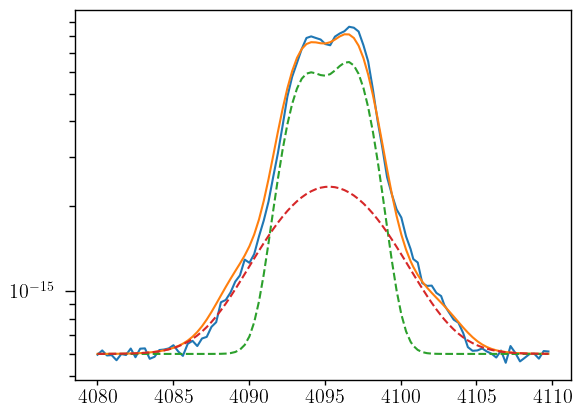

In [168]:
# Search for good initial guess

plt.plot(oii_3727.wavelength, oii_3727.flux)

h13 = gaussian(oii_3727.wavelength, 3e-16, wave_cat['H13'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_3729))

oiic_nar = gaussian(oii_3727.wavelength, 1.8e-14, wave_cat['[OII]3729'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_3729))
oiic_brd = gaussian(oii_3727.wavelength, 0.8e-14, wave_cat['[OII]3729'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_3729))

oiid_nar = gaussian(oii_3727.wavelength, 1.6e-14, wave_cat['[OII]3726'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_3729))
oiid_brd = gaussian(oii_3727.wavelength, 0.8e-14, wave_cat['[OII]3726'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_3729))

h14 = gaussian(oii_3727.wavelength, 0.5e-15, wave_cat['H14'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_3729))

oiic = oiic_nar + oiic_brd
oiid = oiid_nar + oiid_brd

bkg = 6e-16

plt.plot(oii_3727.wavelength, bkg + oiid + oiic + h13 + h14)
plt.plot(oii_3727.wavelength, bkg + oiid_nar + oiic_nar, ls='--')
plt.plot(oii_3727.wavelength, bkg + oiid_brd + oiic_brd, ls='--')

plt.yscale('log')

In [169]:
params_oii_3727 = Parameters()

params_oii_3727.add('z_nar', value=z_nar_oiii_4959, vary=True)
params_oii_3727.add('z_ratio', value=z_ratio, vary=False)
params_oii_3727.add('sigma_3729_nar', value=upy.nominal_values(sigma_nar_3729), vary=False)
params_oii_3727.add('sigma_3729_brd', value=upy.nominal_values(sigma_brd_3729), vary=False)
params_oii_3727.add('sigma_3726_nar', value=upy.nominal_values(sigma_nar_3729), vary=False)
params_oii_3727.add('sigma_3726_brd', value=upy.nominal_values(sigma_brd_3729), vary=False)
params_oii_3727.add('H13', value=3.0e-16, min=0.)
params_oii_3727.add('H14', value=0.5e-15, min=0.)
params_oii_3727.add('Oiic_nar', value=1.8e-14, min=0.)
params_oii_3727.add('Oiic_brd', value=0.8e-14, min=0.)
params_oii_3727.add('Oiid_nar', value=1.6e-14, min=0.)
params_oii_3727.add('Oiid_brd', value=0.8e-14, min=0.)
params_oii_3727.add('bkg', value=6e-16, min=0.)

def residual_oii_3727(params_oii_3727, x, data, uncertainty):
    
    z_nar = params_oii_3727['z_nar']
    z_brd = params_oii_3727['z_nar'] * params_oii_3727['z_ratio']
    sigma_3729_nar = params_oii_3727['sigma_3729_nar']
    sigma_3729_brd = params_oii_3727['sigma_3729_brd']
    sigma_3726_nar = params_oii_3727['sigma_3726_nar']
    sigma_3726_brd = params_oii_3727['sigma_3726_brd']
    
    h13_flux = params_oii_3727['H13']
    oiic_nar_flux = params_oii_3727['Oiic_nar']
    oiic_brd_flux = params_oii_3727['Oiic_brd']
    oiid_nar_flux = params_oii_3727['Oiid_nar']
    oiid_brd_flux = params_oii_3727['Oiid_brd']
    h14_flux = params_oii_3727['H14']
    bkg = params_oii_3727['bkg']
    
    x = oii_3727.wavelength
    model_h13 = gaussian(x, h13_flux, wave_cat['H13'], z_nar, sigma_3729_nar)
    model_h14 = gaussian(x, h14_flux, wave_cat['H14'], z_nar, sigma_3729_nar)
    model_oiic = gaussian(x, oiic_nar_flux, wave_cat['[OII]3729'], z_nar, sigma_3729_nar) + \
                 gaussian(x, oiic_brd_flux, wave_cat['[OII]3729'], z_brd, sigma_3729_brd)
    model_oiid = gaussian(x, oiid_nar_flux, wave_cat['[OII]3726'], z_nar, sigma_3726_nar) + \
                 gaussian(x, oiid_brd_flux, wave_cat['[OII]3726'], z_brd, sigma_3726_brd)
    
    model = model_h13 + model_oiic + model_oiid + model_h14
    return (model + bkg - oii_3727.flux) / oii_3727.noise

In [170]:
np.random.seed(21)
out_oii_3727 = minimize(residual_oii_3727, params_oii_3727, args=(1, 1, 1),
                         method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|███████████████████████████████████████| 2500/2500 [00:29<00:00, 83.36it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 8 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [162.83212486 159.35096162 192.13848892 127.90281904 201.5917724
 164.43343422 190.44561398  74.75437839]


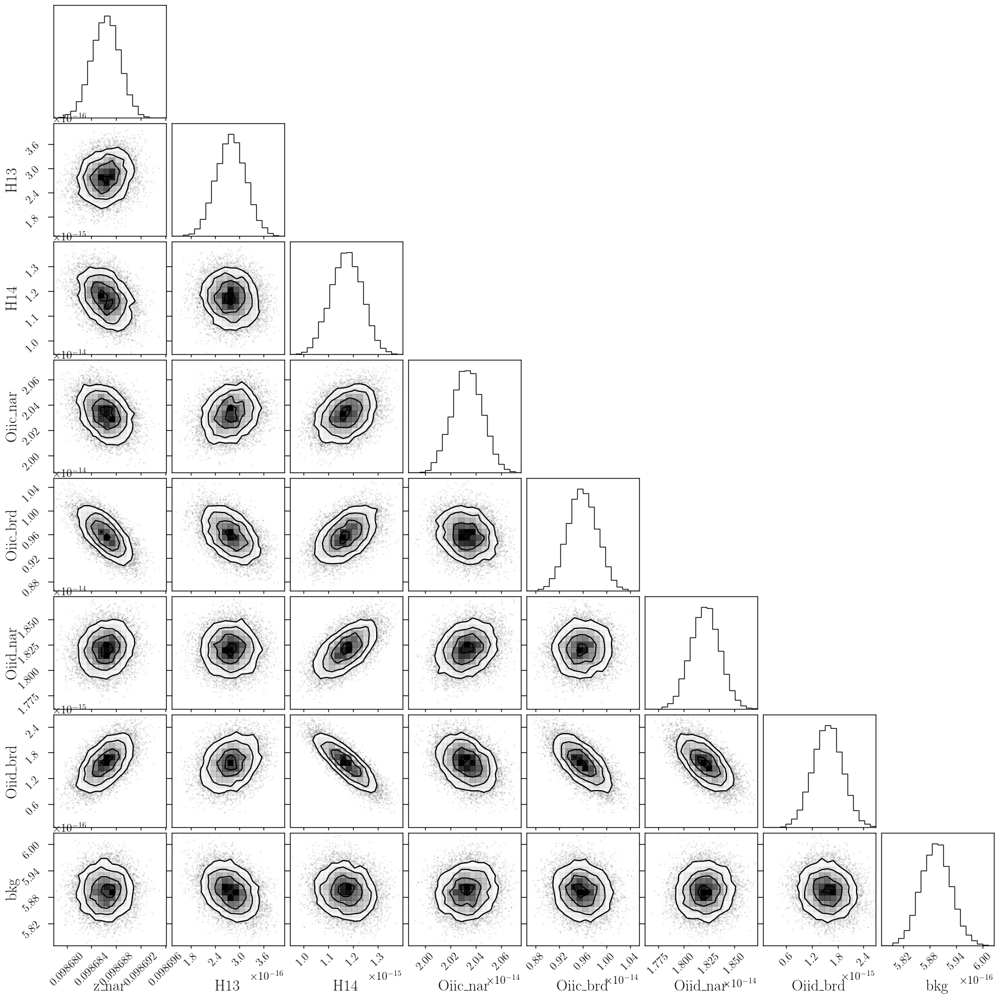

In [171]:
corner.corner(out_oii_3727.flatchain, labels=out_oii_3727.var_names);

In [172]:
out_oii_3727.params

name,value,standard error,relative error,initial value,min,max,vary
z_nar,0.09868628,2.2937e-06,(0.00%),0.09867719705615696,-inf,inf,True
z_ratio,1.00012632,,,1.0001263225003523,-inf,inf,False
sigma_3729_nar,1.30326438,,,1.3032643834735849,-inf,inf,False
sigma_3729_brd,3.27926405,,,3.2792640483571383,-inf,inf,False
sigma_3726_nar,1.30326438,,,1.3032643834735849,-inf,inf,False
sigma_3726_brd,3.27926405,,,3.2792640483571383,-inf,inf,False
H13,2.7880e-16,3.7247e-17,(13.36%),3e-16,0.00000000,inf,True
H14,1.1729e-15,6.4363e-17,(5.49%),5e-16,0.00000000,inf,True
Oiic_nar,2.0328e-14,1.2086e-16,(0.59%),1.8e-14,0.00000000,inf,True
Oiic_brd,9.5871e-15,2.5434e-16,(2.65%),8e-15,0.00000000,inf,True


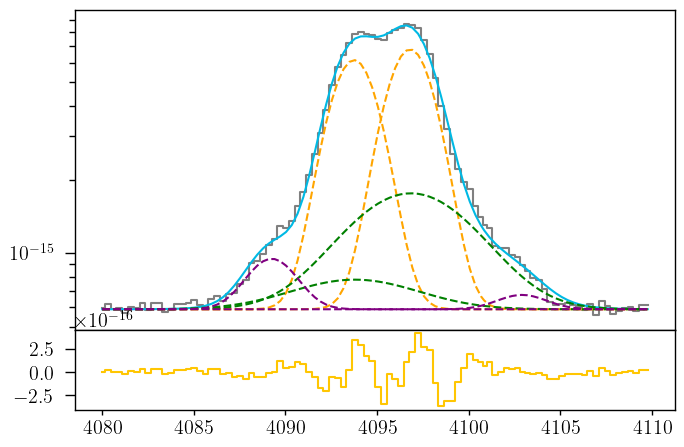

In [173]:
h13_flux = out_oii_3727.flatchain.H13.mean()
h13_std = out_oii_3727.flatchain.H13.std()

oiic_nar_flux = out_oii_3727.flatchain.Oiic_nar.mean()
oiic_nar_std = out_oii_3727.flatchain.Oiic_nar.std()

oiic_brd_flux = out_oii_3727.flatchain.Oiic_brd.mean()
oiic_brd_std = out_oii_3727.flatchain.Oiic_brd.std()

oiid_nar_flux = out_oii_3727.flatchain.Oiid_nar.mean()
oiid_nar_std = out_oii_3727.flatchain.Oiid_nar.std()

oiid_brd_flux = out_oii_3727.flatchain.Oiid_brd.mean()
oiid_brd_std = out_oii_3727.flatchain.Oiid_brd.std()

h14_flux = out_oii_3727.flatchain.H14.mean()
h14_std = out_oii_3727.flatchain.H14.std()

z_oii_3727 = out_oii_3727.flatchain.z_nar.mean()
z_oii_3727_std = out_oii_3727.flatchain.z_nar.std()

bkg_oii_3727 = out_oii_3727.flatchain.bkg.mean()
bkg_oii_3727_std = out_oii_3727.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(oii_3727.wavelength, oii_3727.flux, color='gray', label='Data', where='mid')

h13 = gaussian(oii_3727.wavelength, h13_flux, wave_cat['H13'], z_oii_3727, upy.nominal_values(sigma_nar_3729))

oiic_nar = gaussian(oii_3727.wavelength, oiic_nar_flux, wave_cat['[OII]3729'], z_oii_3727, upy.nominal_values(sigma_nar_3729))
oiic_brd = gaussian(oii_3727.wavelength, oiic_brd_flux, wave_cat['[OII]3729'], z_oii_3727 * z_ratio, upy.nominal_values(sigma_brd_3729))

oiid_nar = gaussian(oii_3727.wavelength, oiid_nar_flux, wave_cat['[OII]3726'], z_oii_3727, upy.nominal_values(sigma_nar_3729))
oiid_brd = gaussian(oii_3727.wavelength, oiid_brd_flux, wave_cat['[OII]3726'], z_oii_3727 * z_ratio, upy.nominal_values(sigma_brd_3729))

h14 = gaussian(oii_3727.wavelength, h14_flux, wave_cat['H14'], z_oii_3727, upy.nominal_values(sigma_nar_3729))

oiic = oiic_nar + oiic_brd
oiid = oiid_nar + oiid_brd

ax.plot(oii_3727.wavelength, bkg_oii_3727 + h13 + oiic + oiid + h14, color=c[0])
ax.plot(oii_3727.wavelength, bkg_oii_3727 + oiic_nar, ls='--', color='orange')
ax.plot(oii_3727.wavelength, bkg_oii_3727 + oiid_nar, ls='--', color='orange')
ax.plot(oii_3727.wavelength, bkg_oii_3727 + oiic_brd, ls='--', color='green')
ax.plot(oii_3727.wavelength, bkg_oii_3727 + oiid_brd, ls='--', color='green')
ax.plot(oii_3727.wavelength, bkg_oii_3727 + h13, ls='--', color='purple')
ax.plot(oii_3727.wavelength, bkg_oii_3727 + h14, ls='--', color='purple')

ax.set_yscale('log')
ax1.step(oii_3727.wavelength, oii_3727.flux - bkg_oii_3727 - oiic - oiid - h13 - h14,
         color=c[3], where='mid')

Text(0.5, 1.0, 'H14 + [OII]$\\lambda$3726 + [OII]$\\lambda$3729 + H13')

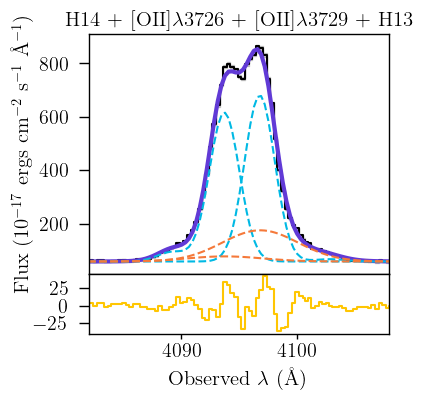

In [174]:
fig = plt.figure(1)
fig.set_size_inches(3, 3)
ax = fig.add_axes((0, .2, 1, .8), sharex=ax1)
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(oii_3727.wavelength, oii_3727.flux / 1e-17, color='black', where='mid')
ax.fill_between(oii_3727.wavelength, (oii_3727.flux - oii_3727.noise) / 1e-17,
                                     (oii_3727.flux + oii_3727.noise) / 1e-17,
                                     color='gray', alpha=0.4, step='mid')

h13 = gaussian(oii_3727.wavelength, h13_flux, wave_cat['H13'], z_oii_3727, upy.nominal_values(sigma_nar_3729))
oiic_nar = gaussian(oii_3727.wavelength, oiic_nar_flux, wave_cat['[OII]3729'], z_oii_3727, upy.nominal_values(sigma_nar_3729))
oiic_brd = gaussian(oii_3727.wavelength, oiic_brd_flux, wave_cat['[OII]3729'], z_oii_3727 * z_ratio, upy.nominal_values(sigma_brd_3729))
oiid_nar = gaussian(oii_3727.wavelength, oiid_nar_flux, wave_cat['[OII]3726'], z_oii_3727, upy.nominal_values(sigma_nar_3729))
oiid_brd = gaussian(oii_3727.wavelength, oiid_brd_flux, wave_cat['[OII]3726'], z_oii_3727 * z_ratio, upy.nominal_values(sigma_brd_3729))
h14 = gaussian(oii_3727.wavelength, h14_flux, wave_cat['H14'], z_oii_3727, upy.nominal_values(sigma_nar_3729))

oiic = oiic_nar + oiic_brd
oiid = oiid_nar + oiid_brd

ax.plot(oii_3727.wavelength, (bkg_oii_3727 + h13 + oiic + oiid + h14) / 1e-17, lw=3, color=c[2])
ax.plot(oii_3727.wavelength, (bkg_oii_3727 + oiic_nar + h13) / 1e-17, ls='--', color=c[0])
ax.plot(oii_3727.wavelength, (bkg_oii_3727 + oiid_nar + h14) / 1e-17, ls='--', color=c[0])
ax.plot(oii_3727.wavelength, (bkg_oii_3727 + oiic_brd) / 1e-17, ls='--', color=cz[0])
ax.plot(oii_3727.wavelength, (bkg_oii_3727 + oiid_brd) / 1e-17, ls='--', color=cz[0])

ax1.step(oii_3727.wavelength, (oii_3727.flux - bkg_oii_3727 - oiic - oiid - h13 - h14) / 1e-17,
         color=c[3], where='mid')

ax.set_ylabel(r'Flux ($10^{-17}$ ergs  cm$^{-2}$ s$^{-1}$ \AA$^{-1}$)', fontsize=15)
ax1.set_xlabel(r'Observed $\lambda$ (\AA)', fontsize=15)
ax.set_xlim(4082, 4108)
ax1.set_xlim(4082, 4108)
ax.set_xticklabels([])
ax.set_title(r'H14 + [OII]$\lambda$3726 + [OII]$\lambda$3729 + H13', fontsize=15)
#fig.savefig('/home/benjamin/Documents/analogs/OII3729_J0021.pdf', bbox_inches='tight')

In [175]:
# EW
EW_OII_3729_nar = ufloat(oiic_nar_flux, oiic_nar_std) / ufloat(bkg_oii_3727, bkg_oii_3727_std)
EW_OII_3729_brd = ufloat(oiic_brd_flux, oiic_brd_std) / ufloat(bkg_oii_3727, bkg_oii_3727_std)
EW_OII_3729 = (ufloat(oiic_nar_flux, oiic_nar_std) + ufloat(oiic_brd_flux, oiic_brd_std)) / ufloat(bkg_oii_3727, bkg_oii_3727_std)

EW_OII_3726_nar = ufloat(oiid_nar_flux, oiid_nar_std) / ufloat(bkg_oii_3727, bkg_oii_3727_std)
EW_OII_3726_brd = ufloat(oiid_brd_flux, oiid_brd_std) / ufloat(bkg_oii_3727, bkg_oii_3727_std)
EW_OII_3726 = (ufloat(oiid_nar_flux, oiid_nar_std) + ufloat(oiid_brd_flux, oiid_brd_std)) / ufloat(bkg_oii_3727, bkg_oii_3727_std)

# [NII]5755

### Arc lines

In [176]:
# Select a region of the arc spectra to have a few arc lines around the wavelength of the fitted lines
wlims_5755 = [wave_cat['[NII]5755']*(1 + z_BN[igal]) - 5, wave_cat['[NII]5755']*(1 + z_BN[igal]) + 20]
mask_arc_5755 = (wcal_red[10].data['wave_soln'][0] >= wlims_5755[0]) & (wcal_red[10].data['wave_soln'][0] < wlims_5755[1])

# Arc spectra around the fitted line
x_arc_5755 = wcal_red[10].data['wave_soln'][0][mask_arc_5755]
y_arc_5755 = wcal_red[21].data[:, 4][mask_arc_5755]

100%|██████████████████████████████████████| 2500/2500 [00:23<00:00, 107.88it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 3 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [87.52536076 57.71430344 40.25134037 45.26160528 65.28724211]


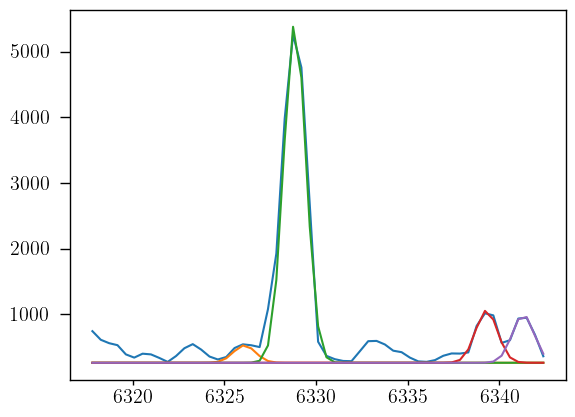

In [177]:
plt.plot(x_arc_5755, y_arc_5755)
plt.plot(x_arc_5755, 260 + gaussian(x_arc_5755, 400, 6326.1, 0, 0.6))
plt.plot(x_arc_5755, 260 + gaussian(x_arc_5755, 7800, 6328.85, 0, 0.6))
plt.plot(x_arc_5755, 260 + gaussian(x_arc_5755, 1200, 6339.3, 0, 0.6))
plt.plot(x_arc_5755, 260 + gaussian(x_arc_5755, 1100, 6341.3, 0, 0.6))

params_arc_5755 = Parameters()
params_arc_5755.add('z', value=0.0, vary=False)
params_arc_5755.add('mu1', value=6326.1, vary=False)
params_arc_5755.add('mu2', value=6328.85, vary=False)
params_arc_5755.add('mu3', value=6339.3, vary=False)
params_arc_5755.add('mu4', value=6341.3, vary=False)
params_arc_5755.add('arc1', value=400, min=0.)
params_arc_5755.add('arc2', value=7800, min=0.)
params_arc_5755.add('arc3', value=1200, min=0.)
params_arc_5755.add('arc4', value=1100, min=0.)
params_arc_5755.add('sigma', value=0.6, min=0.)
params_arc_5755.add('bkg', value=260, vary=False)

def residual_arc_5755(params_arc_5755, x, data, uncertainty):
    
    z = params_arc_5755['z']
    mu1 = params_arc_5755['mu1']
    mu2 = params_arc_5755['mu2']
    mu3 = params_arc_5755['mu3']
    mu4 = params_arc_5755['mu4']
    flux1 = params_arc_5755['arc1']
    flux2 = params_arc_5755['arc2']
    flux3 = params_arc_5755['arc3']
    flux4 = params_arc_5755['arc4']
    sigma = params_arc_5755['sigma']
    bkg = params_arc_5755['bkg']
    
    x = x_arc_5755
    model1 = gaussian(x, flux1, mu1, z, sigma)
    model2 = gaussian(x, flux2, mu2, z, sigma)
    model3 = gaussian(x, flux3, mu3, z, sigma)
    model4 = gaussian(x, flux4, mu4, z, sigma)
    model = bkg + model1 + model2 + model3 + model4
    return (model - y_arc_5755) / 10

np.random.seed(21)
out_arc_5755 = minimize(residual_arc_5755, params_arc_5755, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10)

In [178]:
out_arc_5755.params

name,value,standard error,relative error,initial value,min,max,vary
z,0.00000000,,,0.0,-inf,inf,False
mu1,6326.10000,,,6326.1,-inf,inf,False
mu2,6328.85000,,,6328.85,-inf,inf,False
mu3,6339.30000,,,6339.3,-inf,inf,False
mu4,6341.30000,,,6341.3,-inf,inf,False
arc1,533.884335,10.5510871,(1.98%),400,0.00000000,inf,True
arc2,8457.88168,12.4196985,(0.15%),7800,0.00000000,inf,True
arc3,1204.06970,10.3985637,(0.86%),1200,0.00000000,inf,True
arc4,1073.42681,10.3894249,(0.97%),1100,0.00000000,inf,True
sigma,0.65238597,0.00107532,(0.16%),0.6,0.00000000,inf,True


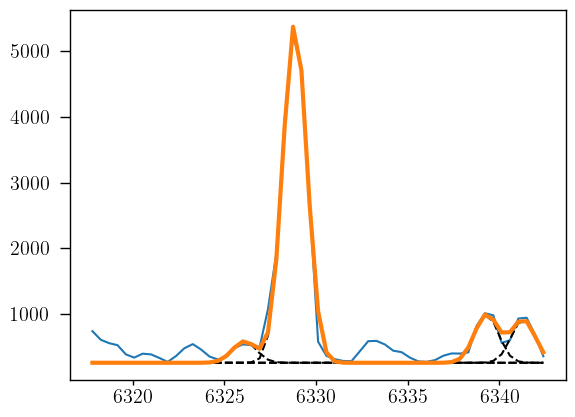

In [179]:
arc1_5755 = out_arc_5755.flatchain.arc1.mean()
arc2_5755 = out_arc_5755.flatchain.arc2.mean()
arc3_5755 = out_arc_5755.flatchain.arc3.mean()
arc4_5755 = out_arc_5755.flatchain.arc4.mean()
sigma_arc_5755 = out_arc_5755.flatchain.sigma.mean()

plt.plot(x_arc_5755, y_arc_5755)

plt.plot(x_arc_5755, 260 + gaussian(x_arc_5755, arc1_5755, 6326.1, 0, sigma_arc_5755), ls='--', color='black')
plt.plot(x_arc_5755, 260 + gaussian(x_arc_5755, arc2_5755, 6328.85, 0, sigma_arc_5755), ls='--', color='black')
plt.plot(x_arc_5755, 260 + gaussian(x_arc_5755, arc3_5755, 6339.3, 0, sigma_arc_5755), ls='--', color='black')
plt.plot(x_arc_5755, 260 + gaussian(x_arc_5755, arc4_5755, 6341.3, 0, sigma_arc_5755), ls='--', color='black')

plt.plot(x_arc_5755, 260 + gaussian(x_arc_5755, arc1_5755, 6326.1, 0, sigma_arc_5755) \
         + gaussian(x_arc_5755, arc2_5755, 6328.85, 0, sigma_arc_5755) \
         + gaussian(x_arc_5755, arc3_5755, 6339.3, 0, sigma_arc_5755) \
         + gaussian(x_arc_5755, arc4_5755, 6341.3, 0, sigma_arc_5755), lw=3
)

### Line fitting

In [180]:
sigma_nar_5755 = upy.sqrt((sigma_nar_intrinsic**2) + (sigma_arc_5755**2))
sigma_brd_5755 = upy.sqrt((sigma_brd_intrinsic**2) + (sigma_arc_5755**2))

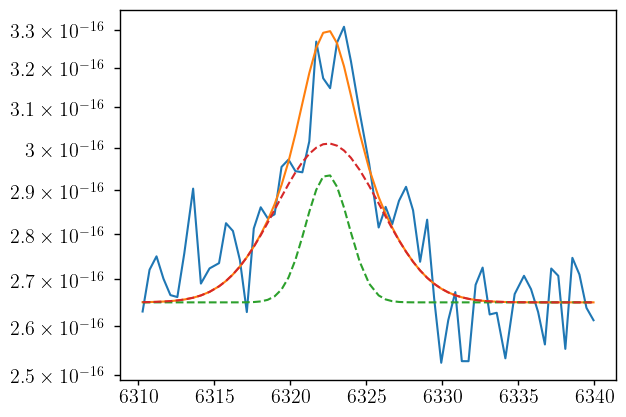

In [181]:
plt.plot(nii_5755.wavelength, nii_5755.flux)
bkg = 2.65e-16

niic_nar = gaussian(nii_5755.wavelength, 1e-16, wave_cat['[NII]5755'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_5755))
niic_brd = gaussian(nii_5755.wavelength, 3e-16, wave_cat['[NII]5755'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_5755))

niic = niic_nar + niic_brd

plt.plot(nii_5755.wavelength, niic + bkg)
plt.plot(nii_5755.wavelength, niic_nar + bkg, ls='--')
plt.plot(nii_5755.wavelength, niic_brd + bkg, ls='--')
plt.yscale('log')

In [182]:
params_nii = Parameters()
params_nii.add('z_nar', value=z_nar_oiii_4959, vary=True)
params_nii.add('z_ratio', value=z_ratio, vary=False)
params_nii.add('sigma_5755_nar', value=upy.nominal_values(sigma_nar_5755), vary=False)
params_nii.add('sigma_5755_brd', value=upy.nominal_values(sigma_brd_5755), vary=False)
params_nii.add('Niic_nar', value=1.0e-16, min=0.)
params_nii.add('Niic_brd', value=3.0e-16, min=0.)
params_nii.add('bkg', value=2.65e-16, min=0.)

def residual_nii(params_nii, x, data, uncertainty):
    
    z_nar = params_nii['z_nar']
    z_brd = params_nii['z_nar'] * params_nii['z_ratio']
    sigma_5755_nar = params_nii['sigma_5755_nar']
    sigma_5755_brd = params_nii['sigma_5755_brd']
    niic_nar_flux = params_nii['Niic_nar']
    niic_brd_flux = params_nii['Niic_brd']
    bkg = params_nii['bkg']
    
    x = nii_5755.wavelength
    model = gaussian(x, niic_nar_flux, wave_cat['[NII]5755'], z_nar, sigma_5755_nar) + \
            gaussian(x, niic_brd_flux, wave_cat['[NII]5755'], z_brd, sigma_5755_brd)
    return (model + bkg - nii_5755.flux) / nii_5755.noise

In [183]:
np.random.seed(21)
out_nii = minimize(residual_nii, params_nii, args=(1, 1, 1),
                   method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|██████████████████████████████████████| 2500/2500 [00:17<00:00, 140.13it/s]


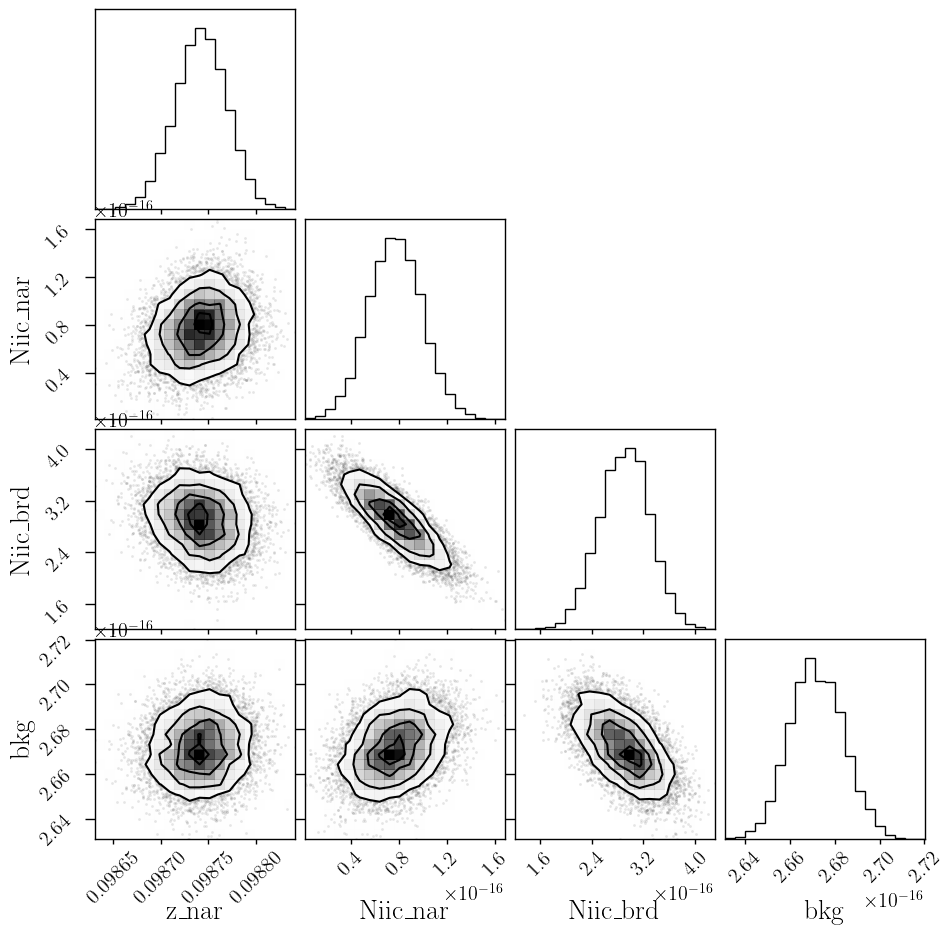

In [184]:
corner.corner(out_nii.flatchain, labels=out_nii.var_names);

In [185]:
out_nii.params

name,value,standard error,relative error,initial value,min,max,vary
z_nar,0.09874221,2.7131e-05,(0.03%),0.09867719705615696,-inf,inf,True
z_ratio,1.00012632,,,1.0001263225003523,-inf,inf,False
sigma_5755_nar,1.38812024,,,1.3881202366369443,-inf,inf,False
sigma_5755_brd,3.31390290,,,3.313902900958004,-inf,inf,False
Niic_nar,7.6795e-17,2.2216e-17,(28.93%),1e-16,0.00000000,inf,True
Niic_brd,2.9098e-16,3.8702e-17,(13.30%),3e-16,0.00000000,inf,True
bkg,2.6714e-16,1.2032e-18,(0.45%),2.65e-16,0.00000000,inf,True


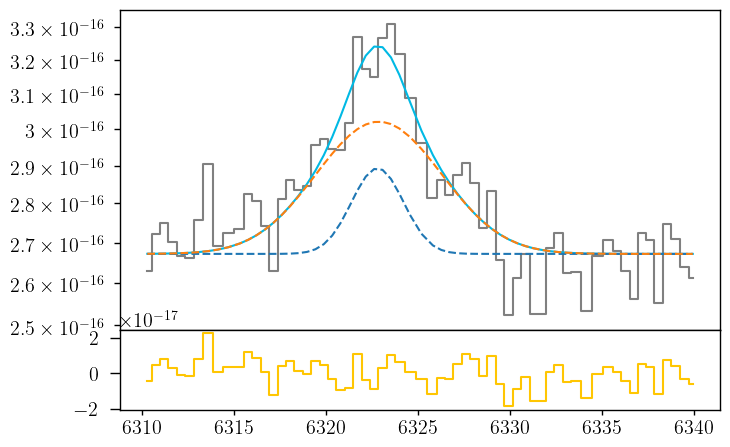

In [186]:
niic_nar_flux = out_nii.flatchain.Niic_nar.mean()
niic_nar_std = out_nii.flatchain.Niic_nar.std()

niic_brd_flux = out_nii.flatchain.Niic_brd.mean()
niic_brd_std = out_nii.flatchain.Niic_brd.std()

z_nii = out_nii.flatchain.z_nar.mean()
z_nii_std = out_nii.flatchain.z_nar.std()

bkg_nii = out_nii.flatchain.bkg.mean()
bkg_nii_std = out_nii.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(nii_5755.wavelength, nii_5755.flux, color='gray', label='Data', where='mid')

niic_nar = gaussian(nii_5755.wavelength, niic_nar_flux, wave_cat['[NII]5755'], z_nii, upy.nominal_values(sigma_nar_5755))
niic_brd = gaussian(nii_5755.wavelength, niic_brd_flux, wave_cat['[NII]5755'], z_nii * z_ratio, upy.nominal_values(sigma_brd_5755))

niic = niic_nar + niic_brd

ax.plot(nii_5755.wavelength, bkg_nii + niic, color=c[0])
ax.plot(nii_5755.wavelength, bkg_nii + niic_nar, ls='--')
ax.plot(nii_5755.wavelength, bkg_nii + niic_brd, ls='--')
ax.set_yscale('log')
ax1.step(nii_5755.wavelength, nii_5755.flux - bkg_nii - niic, color=c[3], where='mid')

In [187]:
# EW
EW_NII_5755_nar = ufloat(niic_nar_flux, niic_nar_std) / ufloat(bkg_nii, bkg_nii_std)
EW_NII_5755_brd = ufloat(niic_brd_flux, niic_brd_std) / ufloat(bkg_nii, bkg_nii_std)
EW_NII_5755 = (ufloat(niic_nar_flux, niic_nar_std) + ufloat(niic_brd_flux, niic_brd_std)) / ufloat(bkg_nii, bkg_nii_std)

# [SIII]9532

### Arc lines

In [188]:
# Select a region of the arc spectra to have a few arc lines around the wavelength of the fitted lines
wlims_9532 = [wave_cat['[SIII]9532']*(1 + z_BN[igal]) - 10, wave_cat['[SIII]9532']*(1 + z_BN[igal]) + 10]
mask_arc_9532 = (wcal_red[18].data['wave_soln'][0] >= wlims_9532[0]) & (wcal_red[18].data['wave_soln'][0] < wlims_9532[1])

# Arc spectra around the fitted line
x_arc_9532 = wcal_red[18].data['wave_soln'][0][mask_arc_9532]
y_arc_9532 = wcal_red[21].data[:, 8][mask_arc_9532]

100%|██████████████████████████████████████| 2500/2500 [00:13<00:00, 179.59it/s]


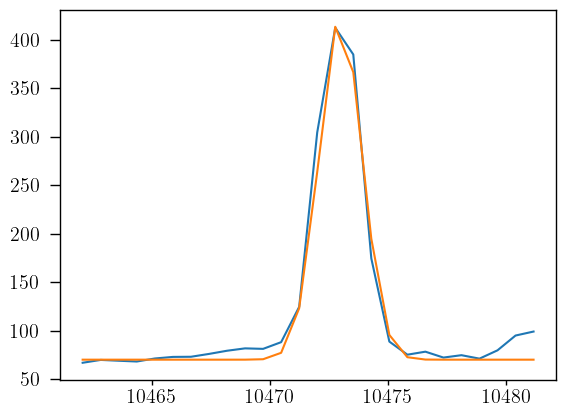

In [189]:
plt.plot(x_arc_9532, y_arc_9532)
plt.plot(x_arc_9532, 70 + gaussian(x_arc_9532, 800, 10473, 0, 0.9))

params_arc_9532 = Parameters()
params_arc_9532.add('z', value=0.0, vary=False)
params_arc_9532.add('mu', value=10473, vary=False)
params_arc_9532.add('arc', value=800, min=0.)
params_arc_9532.add('sigma', value=0.9, min=0.)
params_arc_9532.add('bkg', value=70, vary=False)

def residual_arc_9532(params_arc_9532, x, data, uncertainty):
    
    z = params_arc_9532['z']
    mu = params_arc_9532['mu']
    flux = params_arc_9532['arc']
    sigma = params_arc_9532['sigma']
    bkg = params_arc_9532['bkg']
    
    x = x_arc_9532
    model = bkg + gaussian(x, flux, mu, z, sigma)
    return (model - y_arc_9532) / 10

np.random.seed(21)
out_arc_9532 = minimize(residual_arc_9532, params_arc_9532, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10)

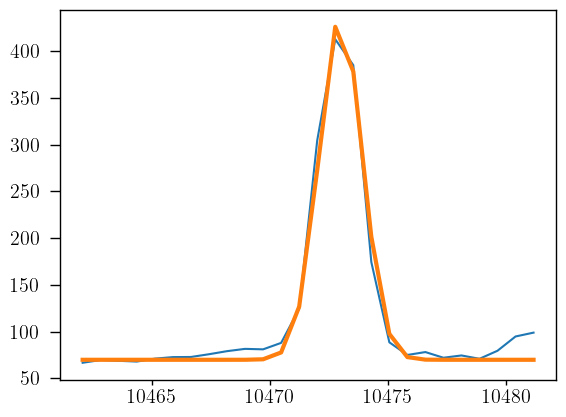

In [190]:
arc_9532 = out_arc_9532.flatchain.arc.mean()
sigma_arc_9532 = out_arc_9532.flatchain.sigma.mean()

plt.plot(x_arc_9532, y_arc_9532)

plt.plot(x_arc_9532, 70 + gaussian(x_arc_9532, arc_9532, 10473, 0, sigma_arc_9532), lw=3
)

### Line fitting

In [191]:
sigma_nar_9532 = upy.sqrt((sigma_nar_intrinsic**2) + (sigma_arc_9532**2))
sigma_brd_9532 = upy.sqrt((sigma_brd_intrinsic**2) + (sigma_arc_9532**2))

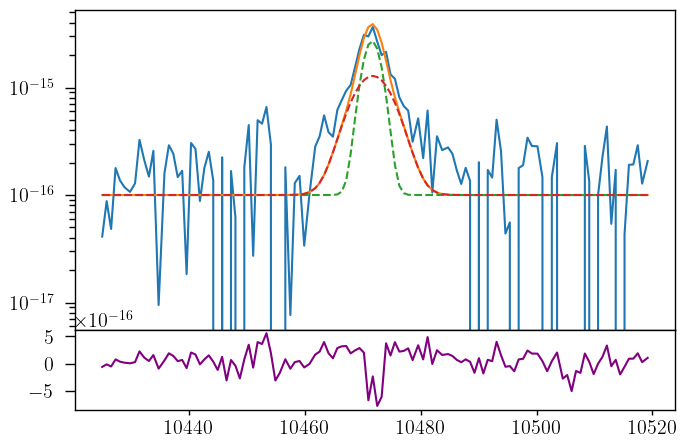

In [192]:
# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.plot(siii_9532.wavelength, siii_9532.flux)
bkg = 1e-16

siiia_nar = gaussian(siii_9532.wavelength, 10e-15, wave_cat['[SIII]9532'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_9532))
siiia_brd = gaussian(siii_9532.wavelength, 10e-15, wave_cat['[SIII]9532'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_9532))

ax.plot(siii_9532.wavelength, bkg + siiia_nar + siiia_brd)
ax.plot(siii_9532.wavelength, bkg + siiia_nar, ls='--')
ax.plot(siii_9532.wavelength, bkg + siiia_brd, ls='--')
ax1.plot(siii_9532.wavelength, siii_9532.flux - bkg - siiia_nar - siiia_brd, color='purple')
ax.set_yscale('log')

In [193]:
params_siiia = Parameters()
params_siiia.add('z_nar', value=z_nar_oiii_4959, vary=True)
params_siiia.add('z_ratio', value=z_ratio, vary=False)
params_siiia.add('sigma_9532_nar', value=upy.nominal_values(sigma_nar_9532), vary=False)
params_siiia.add('sigma_9532_brd', value=upy.nominal_values(sigma_brd_9532), vary=False)
params_siiia.add('Siiia_nar', value=8e-15, min=0.)
params_siiia.add('Siiia_brd', value=10e-15, min=0.)
params_siiia.add('bkg', value=1e-16, min=0.)


def residual_siiia(params_siiia, x, data, uncertainty):
    
    z_nar = params_siiia['z_nar']
    z_brd = params_siiia['z_nar'] * params_siiia['z_ratio']
    sigma_9532_nar = params_siiia['sigma_9532_nar']
    sigma_9532_brd = params_siiia['sigma_9532_brd']
    siiia_nar_flux = params_siiia['Siiia_nar']
    siiia_brd_flux = params_siiia['Siiia_brd']
    bkg = params_siiia['bkg']
    
    x = siii_9532.wavelength
    model = gaussian(x, siiia_nar_flux, wave_cat['[SIII]9532'], z_nar, sigma_9532_nar) + \
            gaussian(x, siiia_brd_flux, wave_cat['[SIII]9532'], z_brd, sigma_9532_brd)
    
    return (model + bkg - siii_9532.flux) / siii_9532.noise

In [194]:
np.random.seed(21)
out_siiia = minimize(residual_siiia, params_siiia, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|██████████████████████████████████████| 2500/2500 [00:18<00:00, 136.75it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [39.58355937 56.39235582 59.18396678 47.98660959]


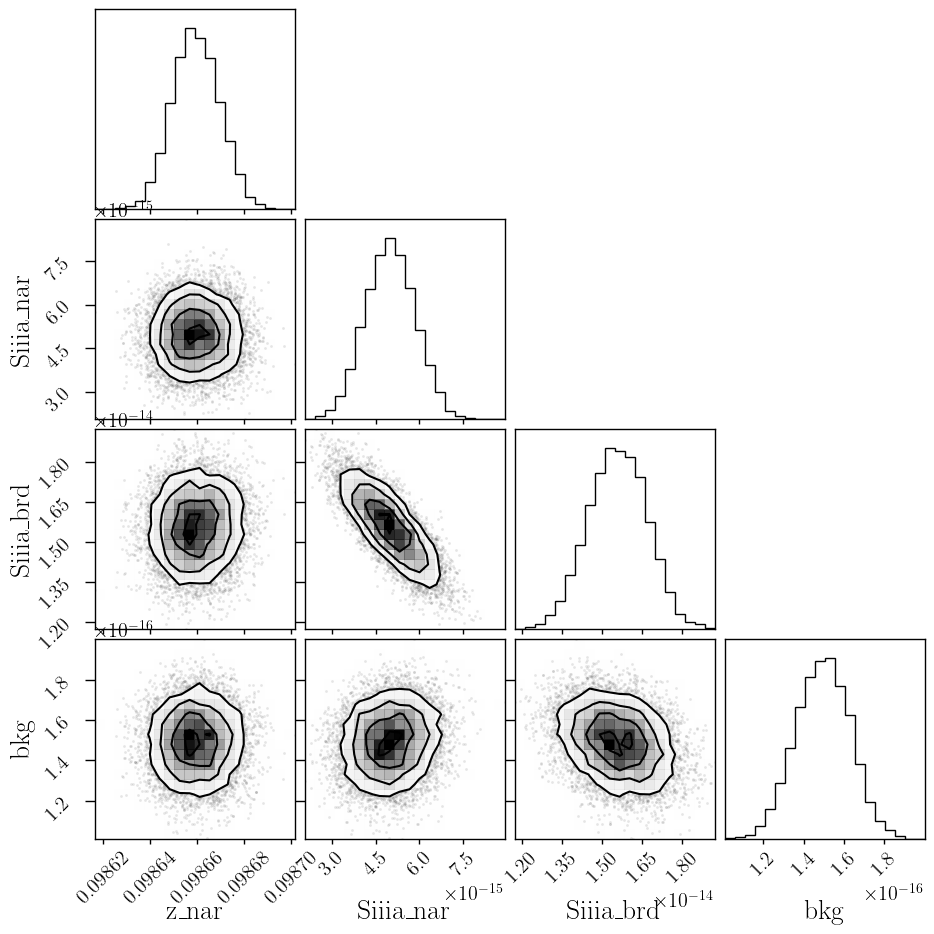

In [195]:
corner.corner(out_siiia.flatchain, labels=out_siiia.var_names);
#plt.savefig(fname='corner_ha.jpg', bbox_inches='tight')

In [196]:
out_siiia.params

name,value,standard error,relative error,initial value,min,max,vary
z_nar,0.09865919,1.0043e-05,(0.01%),0.09867719705615696,-inf,inf,True
z_ratio,1.00012632,,,1.0001263225003523,-inf,inf,False
sigma_9532_nar,1.52494671,,,1.5249467116237088,-inf,inf,False
sigma_9532_brd,3.37350517,,,3.3735051680572283,-inf,inf,False
Siiia_nar,4.9833e-15,8.5926e-16,(17.24%),8e-15,0.00000000,inf,True
Siiia_brd,1.5568e-14,1.0997e-15,(7.06%),1e-14,0.00000000,inf,True
bkg,1.4937e-16,1.3462e-17,(9.01%),1e-16,0.00000000,inf,True


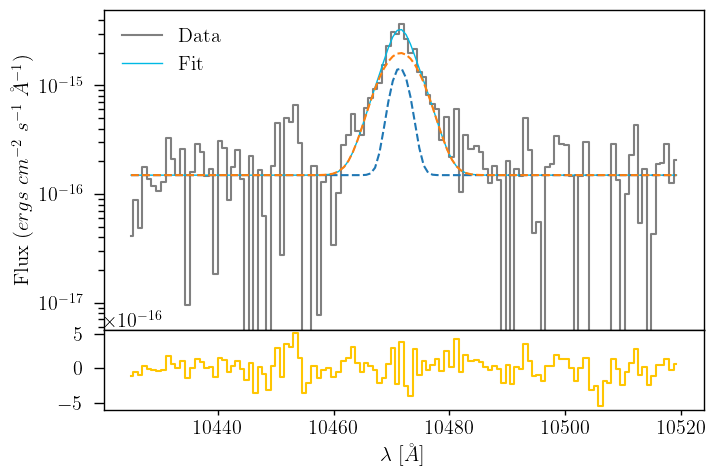

In [197]:
siiia_nar_flux = out_siiia.flatchain.Siiia_nar.mean()
siiia_nar_std = out_siiia.flatchain.Siiia_nar.std()

siiia_brd_flux = out_siiia.flatchain.Siiia_brd.mean()
siiia_brd_std = out_siiia.flatchain.Siiia_brd.std()

z_siiia = out_siiia.flatchain.z_nar.mean()
z_siiia_std = out_siiia.flatchain.z_nar.std()

bkg_siiia = out_siiia.flatchain.bkg.mean()
bkg_siiia_std = out_siiia.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(siii_9532.wavelength, siii_9532.flux,
            color='gray', label='Data', where='mid')

siiia_nar = gaussian(siii_9532.wavelength, siiia_nar_flux, wave_cat['[SIII]9532'], z_siiia, upy.nominal_values(sigma_nar_9532))
siiia_brd = gaussian(siii_9532.wavelength, siiia_brd_flux, wave_cat['[SIII]9532'], z_siiia * z_ratio, upy.nominal_values(sigma_brd_9532))
siiia = siiia_nar + siiia_brd

ax.plot(siii_9532.wavelength, bkg_siiia + siiia, lw=1, color=c[0], label='Fit')
ax.plot(siii_9532.wavelength, bkg_siiia + siiia_nar, ls='--')
ax.plot(siii_9532.wavelength, bkg_siiia + siiia_brd, ls='--')
ax1.step(siii_9532.wavelength, siii_9532.flux - bkg_siiia - siiia, color=c[3], where='mid')
ax.set_ylabel(r'Flux ($ergs\ cm^{-2}\  s^{-1}\ \AA^{-1}$)', fontsize=15)
ax1.set_xlabel(r'$\lambda$ [$\AA$]', fontsize=15)
ax.set_yscale('log')
ax.legend(loc='upper left')

In [198]:
# EW
EW_SIII_9532_nar = (ufloat(siiia_nar_flux, siiia_nar_std) + ufloat(siiia_brd_flux, siiia_brd_std)) / ufloat(bkg_siiia, bkg_siiia_std)
EW_SIII_9532_brd = (ufloat(siiia_nar_flux, siiia_nar_std) + ufloat(siiia_brd_flux, siiia_brd_std)) / ufloat(bkg_siiia, bkg_siiia_std)
EW_SIII_9532 = (ufloat(siiia_nar_flux, siiia_nar_std) + ufloat(siiia_brd_flux, siiia_brd_std)) / ufloat(bkg_siiia, bkg_siiia_std)

# [SIII]9069

### Arc lines

In [199]:
# Select a region of the arc spectra to have a few arc lines around the wavelength of the fitted lines
wlims_9069 = [wave_cat['[SIII]9069']*(1 + z_BN[igal]) + 70, wave_cat['[SIII]9069']*(1 + z_BN[igal]) + 100]
mask_arc_9069 = (wcal_red[18].data['wave_soln'][0] >= wlims_9069[0]) & (wcal_red[18].data['wave_soln'][0] < wlims_9069[1])

# Arc spectra around the fitted line
x_arc_9069 = wcal_red[18].data['wave_soln'][0][mask_arc_9069]
y_arc_9069 = wcal_red[21].data[:, 8][mask_arc_9069]

100%|██████████████████████████████████████| 2500/2500 [00:13<00:00, 183.15it/s]


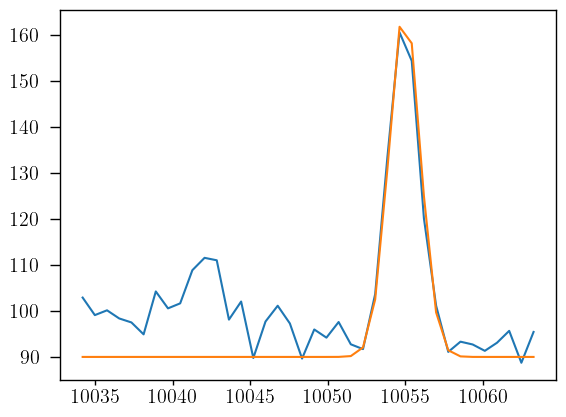

In [200]:
plt.plot(x_arc_9069, y_arc_9069)
plt.plot(x_arc_9069, 90 + gaussian(x_arc_9069, 190, 10054.95, 0, 1.0))

params_arc_9069 = Parameters()
params_arc_9069.add('z', value=0.0, vary=False)
params_arc_9069.add('mu', value=10054.95, vary=False)
params_arc_9069.add('arc', value=190, min=0.)
params_arc_9069.add('sigma', value=1.0, min=0.)
params_arc_9069.add('bkg', value=90, vary=False)

def residual_arc_9069(params_arc_9069, x, data, uncertainty):
    
    z = params_arc_9069['z']
    mu = params_arc_9069['mu']
    flux = params_arc_9069['arc']
    sigma = params_arc_9069['sigma']
    bkg = params_arc_9069['bkg']
    
    x = x_arc_9069
    model = bkg + gaussian(x, flux, mu, z, sigma)
    return (model - y_arc_9069) / 10

np.random.seed(21)
out_arc_9069 = minimize(residual_arc_9069, params_arc_9069, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10)

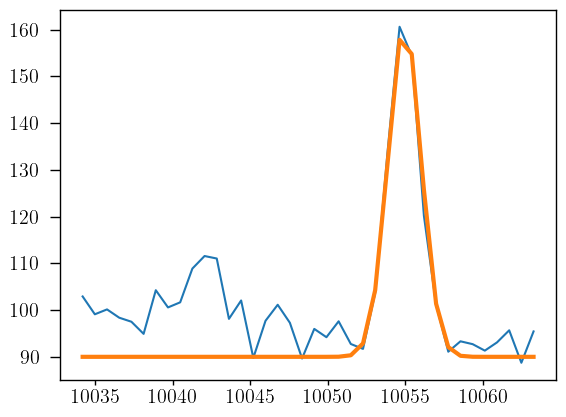

In [201]:
arc_9069 = out_arc_9069.flatchain.arc.mean()
sigma_arc_9069 = out_arc_9069.flatchain.sigma.mean()

plt.plot(x_arc_9069, y_arc_9069)
plt.plot(x_arc_9069, 90 + gaussian(x_arc_9069, arc_9069, 10054.95, 0, sigma_arc_9069), lw=3)

### Line fitting

In [202]:
sigma_nar_9069 = upy.sqrt((sigma_nar_intrinsic**2) + (sigma_arc_9069**2))
sigma_brd_9069 = upy.sqrt((sigma_brd_intrinsic**2) + (sigma_arc_9069**2))

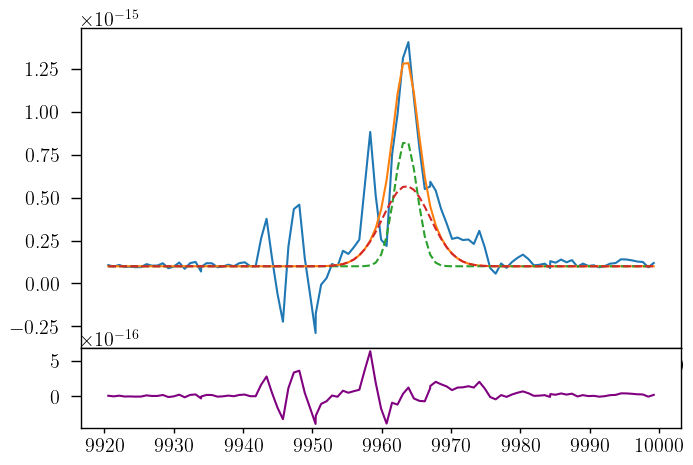

In [203]:
# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.plot(siii_9069.wavelength, siii_9069.flux)
bkg = 1e-16

siiib_nar = gaussian(siii_9069.wavelength, 3e-15, wave_cat['[SIII]9069'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_9069))
siiib_brd = gaussian(siii_9069.wavelength, 4e-15, wave_cat['[SIII]9069'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_9069))

ax.plot(siii_9069.wavelength, bkg + siiib_nar + siiib_brd)
ax.plot(siii_9069.wavelength, bkg + siiib_nar, ls='--')
ax.plot(siii_9069.wavelength, bkg + siiib_brd, ls='--')
ax1.plot(siii_9069.wavelength, siii_9069.flux - bkg - siiib_nar - siiib_brd, color='purple')
#ax.set_yscale('log')

In [204]:
params_siiib = Parameters()
params_siiib.add('z_nar', value=z_nar_oiii_4959, vary=True)
params_siiib.add('z_ratio', value=z_ratio, vary=False)
params_siiib.add('sigma_9069_nar', value=upy.nominal_values(sigma_nar_9069), vary=False)
params_siiib.add('sigma_9069_brd', value=upy.nominal_values(sigma_brd_9069), vary=False)
params_siiib.add('Siiib_nar', value=3e-15, min=0.)
params_siiib.add('Siiib_brd', value=4e-15, min=0.)
params_siiib.add('bkg', value=1e-16, min=0.)


def residual_siiib(params_siiib, x, data, uncertainty):
    
    z_nar = params_siiib['z_nar']
    z_brd = params_siiib['z_nar'] * params_siiib['z_ratio']
    sigma_9069_nar = params_siiib['sigma_9069_nar']
    sigma_9069_brd = params_siiib['sigma_9069_brd']
    siiib_nar_flux = params_siiib['Siiib_nar']
    siiib_brd_flux = params_siiib['Siiib_brd']
    bkg = params_siiib['bkg']
    
    x = siii_9069.wavelength
    model = gaussian(x, siiib_nar_flux, wave_cat['[SIII]9069'], z_nar, sigma_9069_nar) + \
            gaussian(x, siiib_brd_flux, wave_cat['[SIII]9069'], z_brd, sigma_9069_brd)
    
    return (model + bkg - siii_9069.flux) / siii_9069.noise

In [205]:
np.random.seed(21)
out_siiib = minimize(residual_siiib, params_siiib, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|██████████████████████████████████████| 2500/2500 [00:18<00:00, 135.81it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 3 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [36.01394987 76.63371015 81.15288241 76.98093396]


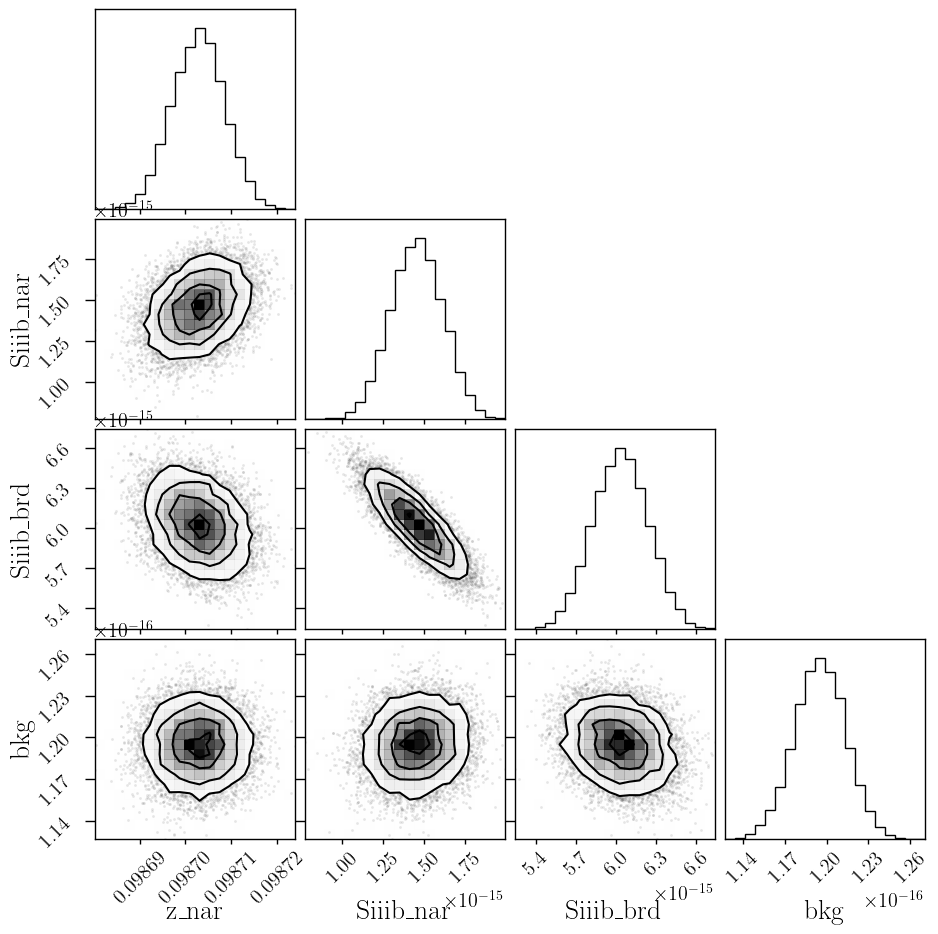

In [206]:
corner.corner(out_siiib.flatchain, labels=out_siiib.var_names);
#plt.savefig(fname='corner_ha.jpg', bbox_inches='tight')

In [207]:
out_siiib.params

name,value,standard error,relative error,initial value,min,max,vary
z_nar,0.09870281,5.7921e-06,(0.01%),0.09867719705615696,-inf,inf,True
z_ratio,1.00012632,,,1.0001263225003523,-inf,inf,False
sigma_9069_nar,1.61947100,,,1.6194709999743677,-inf,inf,False
sigma_9069_brd,3.41727391,,,3.4172739084502495,-inf,inf,False
Siiib_nar,1.4514e-15,1.6180e-16,(11.15%),3e-15,0.00000000,inf,True
Siiib_brd,6.0327e-15,2.1000e-16,(3.48%),4e-15,0.00000000,inf,True
bkg,1.1950e-16,1.8253e-18,(1.53%),1e-16,0.00000000,inf,True


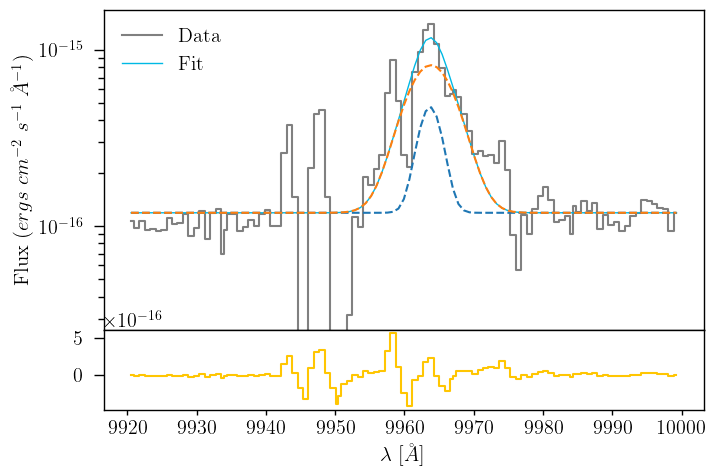

In [208]:
siiib_nar_flux = out_siiib.flatchain.Siiib_nar.mean()
siiib_nar_std = out_siiib.flatchain.Siiib_nar.std()

siiib_brd_flux = out_siiib.flatchain.Siiib_brd.mean()
siiib_brd_std = out_siiib.flatchain.Siiib_brd.std()

z_siiib = out_siiib.flatchain.z_nar.mean()
z_siiib_std = out_siiib.flatchain.z_nar.std()

bkg_siiib = out_siiib.flatchain.bkg.mean()
bkg_siiib_std = out_siiib.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(siii_9069.wavelength, siii_9069.flux,
            color='gray', label='Data', where='mid')

siiib_nar = gaussian(siii_9069.wavelength, siiib_nar_flux, wave_cat['[SIII]9069'], z_siiib, upy.nominal_values(sigma_nar_9069))
siiib_brd = gaussian(siii_9069.wavelength, siiib_brd_flux, wave_cat['[SIII]9069'], z_siiib * z_ratio, upy.nominal_values(sigma_brd_9069))
siiib = siiib_nar + siiib_brd

ax.plot(siii_9069.wavelength, bkg_siiib + siiib, lw=1, color=c[0], label='Fit')
ax.plot(siii_9069.wavelength, bkg_siiib + siiib_nar, ls='--')
ax.plot(siii_9069.wavelength, bkg_siiib + siiib_brd, ls='--')
ax1.step(siii_9069.wavelength, siii_9069.flux - bkg_siiib - siiib, color=c[3], where='mid')
ax.set_ylabel(r'Flux ($ergs\ cm^{-2}\  s^{-1}\ \AA^{-1}$)', fontsize=15)
ax1.set_xlabel(r'$\lambda$ [$\AA$]', fontsize=15)
ax.set_yscale('log')
ax.legend(loc='upper left')

In [209]:
# EW
EW_SIII_9069_nar = ufloat(siiib_nar_flux, siiib_nar_std) / ufloat(bkg_siiib, bkg_siiib_std)
EW_SIII_9069_brd = ufloat(siiib_brd_flux, siiib_brd_std) / ufloat(bkg_siiib, bkg_siiib_std)
EW_SIII_9069 = (ufloat(siiib_nar_flux, siiib_nar_std) + ufloat(siiib_brd_flux, siiib_brd_std)) / ufloat(bkg_siiib, bkg_siiib_std)

# [OI]6300 + [SIII]6312

### Arc lines

In [210]:
# Select a region of the arc spectra to have a few arc lines around the wavelength of the fitted lines
wlims_6312 = [wave_cat['[SIII]6312']*(1 + z_BN[igal]), wave_cat['[SIII]6312']*(1 + z_BN[igal]) + 25]
mask_arc_6312 = (wcal_red[12].data['wave_soln'][0] >= wlims_6312[0]) & (wcal_red[12].data['wave_soln'][0] < wlims_6312[1])

# Arc spectra around the fitted line
x_arc_6312 = wcal_red[12].data['wave_soln'][0][mask_arc_6312]
y_arc_6312 = wcal_red[21].data[:, 5][mask_arc_6312]

100%|██████████████████████████████████████| 2500/2500 [00:20<00:00, 120.67it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 3 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [58.69398607 70.71223921 43.33333218 70.55339608]


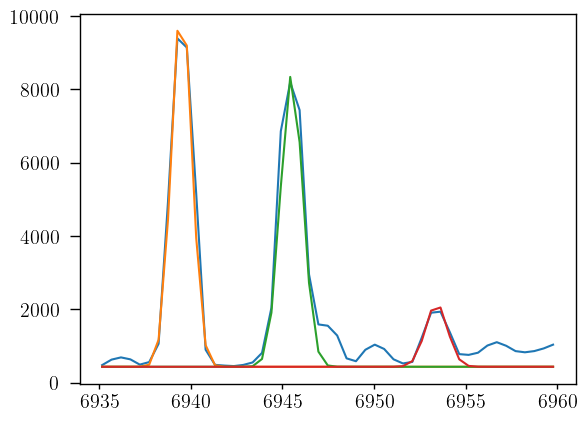

In [211]:
plt.plot(x_arc_6312, y_arc_6312)
plt.plot(x_arc_6312, 430 + gaussian(x_arc_6312, 13800, 6939.5, 0, 0.55))
plt.plot(x_arc_6312, 430 + gaussian(x_arc_6312, 12000, 6945.5, 0, 0.6))
plt.plot(x_arc_6312, 430 + gaussian(x_arc_6312, 2600, 6953.4, 0, 0.6))

params_arc_6312 = Parameters()
params_arc_6312.add('z', value=0.0, vary=False)
params_arc_6312.add('mu1', value=6939.5, vary=False)
params_arc_6312.add('mu2', value=6945.5, vary=False)
params_arc_6312.add('mu3', value=6953.4, vary=False)
params_arc_6312.add('arc1', value=13800, min=0.)
params_arc_6312.add('arc2', value=12000, min=0.)
params_arc_6312.add('arc3', value=2600, min=0.)
params_arc_6312.add('sigma', value=0.57, min=0.)
params_arc_6312.add('bkg', value=430, vary=False)

def residual_arc_6312(params_arc_6312, x, data, uncertainty):
    
    z = params_arc_6312['z']
    mu1 = params_arc_6312['mu1']
    mu2 = params_arc_6312['mu2']
    mu3 = params_arc_6312['mu3']
    flux1 = params_arc_6312['arc1']
    flux2 = params_arc_6312['arc2']
    flux3 = params_arc_6312['arc3']
    sigma = params_arc_6312['sigma']
    bkg = params_arc_6312['bkg']
    
    x = x_arc_6312
    model1 = gaussian(x, flux1, mu1, z, sigma)
    model2 = gaussian(x, flux2, mu2, z, sigma)
    model3 = gaussian(x, flux3, mu3, z, sigma)
    model = bkg + model1 + model2 + model3 
    return (model - y_arc_6312) / 10

np.random.seed(21)
out_arc_6312 = minimize(residual_arc_6312, params_arc_6312, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10)

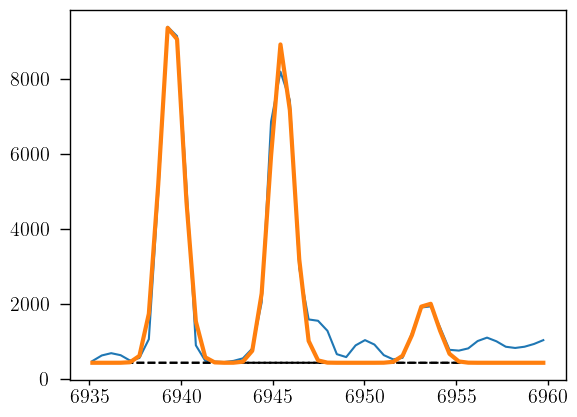

In [212]:
arc1_6312 = out_arc_6312.flatchain.arc1.mean()
arc2_6312 = out_arc_6312.flatchain.arc2.mean()
arc3_6312 = out_arc_6312.flatchain.arc3.mean()
sigma_arc_6312 = out_arc_6312.flatchain.sigma.mean()

plt.plot(x_arc_6312, y_arc_6312)

plt.plot(x_arc_6312, 430 + gaussian(x_arc_6312, arc1_6312, 6939.5, 0, sigma_arc_6312), ls='--', color='black')
plt.plot(x_arc_6312, 430 + gaussian(x_arc_6312, arc2_6312, 6945.5, 0, sigma_arc_6312), ls='--', color='black')
plt.plot(x_arc_6312, 430 + gaussian(x_arc_6312, arc3_6312, 6953.4, 0, sigma_arc_6312), ls='--', color='black')

plt.plot(x_arc_6312, 430 + gaussian(x_arc_6312, arc1_6312, 6939.5, 0, sigma_arc_6312) \
         + gaussian(x_arc_6312, arc2_6312, 6945.5, 0, sigma_arc_6312) \
         + gaussian(x_arc_6312, arc3_6312, 6953.4, 0, sigma_arc_6312), lw=3
)

### Line fitting

In [213]:
sigma_nar_6312 = upy.sqrt((sigma_nar_intrinsic**2) + (sigma_arc_6312**2))
sigma_brd_6312 = upy.sqrt((sigma_brd_intrinsic**2) + (sigma_arc_6312**2))

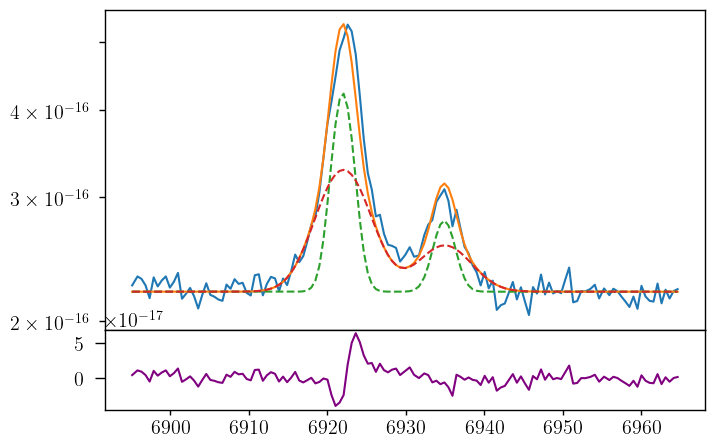

In [214]:
# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.plot(oi_siii.wavelength, oi_siii.flux)
bkg = 2.2e-16

oi_nar = gaussian(oi_siii.wavelength, 7e-16, wave_cat['[OI]6300'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_6312))
oi_brd = gaussian(oi_siii.wavelength, 9e-16, wave_cat['[OI]6300'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_6312))

siiic_nar = gaussian(oi_siii.wavelength, 2e-16, wave_cat['[SIII]6312'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_6312))
siiic_brd = gaussian(oi_siii.wavelength, 3e-16, wave_cat['[SIII]6312'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_6312))

ax.plot(oi_siii.wavelength, bkg + siiic_nar + siiic_brd + oi_nar + oi_brd)
ax.plot(oi_siii.wavelength, bkg + siiic_nar + oi_nar, ls='--')
ax.plot(oi_siii.wavelength, bkg + siiic_brd + oi_brd, ls='--')
ax1.plot(oi_siii.wavelength, oi_siii.flux - bkg - siiic_nar - siiic_brd - oi_nar - oi_brd, color='purple')
ax.set_yscale('log')

In [215]:
params_oi_siii = Parameters()
params_oi_siii.add('z_nar', value=z_nar_oiii_4959, vary=True)
params_oi_siii.add('z_ratio', value=z_ratio, vary=False)
params_oi_siii.add('sigma_6312_nar', value=upy.nominal_values(sigma_nar_6312), vary=False)
params_oi_siii.add('sigma_6312_brd', value=upy.nominal_values(sigma_brd_6312), vary=False)
params_oi_siii.add('sigma_6300_nar', value=upy.nominal_values(sigma_nar_6312), vary=False)
params_oi_siii.add('sigma_6300_brd', value=upy.nominal_values(sigma_brd_6312), vary=False)
params_oi_siii.add('Oi_nar', value=7.0e-16, min=0.)
params_oi_siii.add('Oi_brd', value=9.0e-16, min=0.)
params_oi_siii.add('Siiic_nar', value=2.0e-16, min=0.)
params_oi_siii.add('Siiic_brd', value=3.0e-16, min=0.)
params_oi_siii.add('bkg', value=2.2e-16, min=0.)


def residual_oi_siii(params_oi_siii, x, data, uncertainty):
    
    z_nar = params_oi_siii['z_nar']
    z_brd = params_oi_siii['z_nar'] * params_oi_siii['z_ratio']
    sigma_6312_nar = params_oi_siii['sigma_6312_nar']
    sigma_6312_brd = params_oi_siii['sigma_6312_brd']
    sigma_6300_nar = params_oi_siii['sigma_6300_nar']
    sigma_6300_brd = params_oi_siii['sigma_6300_brd']
    oi_nar = params_oi_siii['Oi_nar']
    oi_brd = params_oi_siii['Oi_brd']
    siiic_nar = params_oi_siii['Siiic_nar']
    siiic_brd = params_oi_siii['Siiic_brd']
    bkg = params_oi_siii['bkg']
    
    x = oi_siii.wavelength
    model_oi = gaussian(x, oi_nar, wave_cat['[OI]6300'], z_nar, sigma_6300_nar) \
             + gaussian(x, oi_brd, wave_cat['[OI]6300'], z_brd, sigma_6300_brd)
    model_siii = gaussian(x, siiic_nar, wave_cat['[SIII]6312'], z_nar, sigma_6312_nar) \
               + gaussian(x, siiic_brd, wave_cat['[SIII]6312'], z_brd, sigma_6312_brd)
    
    return (model_siii + model_oi + bkg - oi_siii.flux) / oi_siii.noise

In [216]:
np.random.seed(21)
out_oi_siii = minimize(residual_oi_siii, params_oi_siii, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|███████████████████████████████████████| 2500/2500 [00:25<00:00, 97.96it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 5 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [43.10343809 78.39870326 88.33633369 74.20130612 58.16373215 55.78160113]


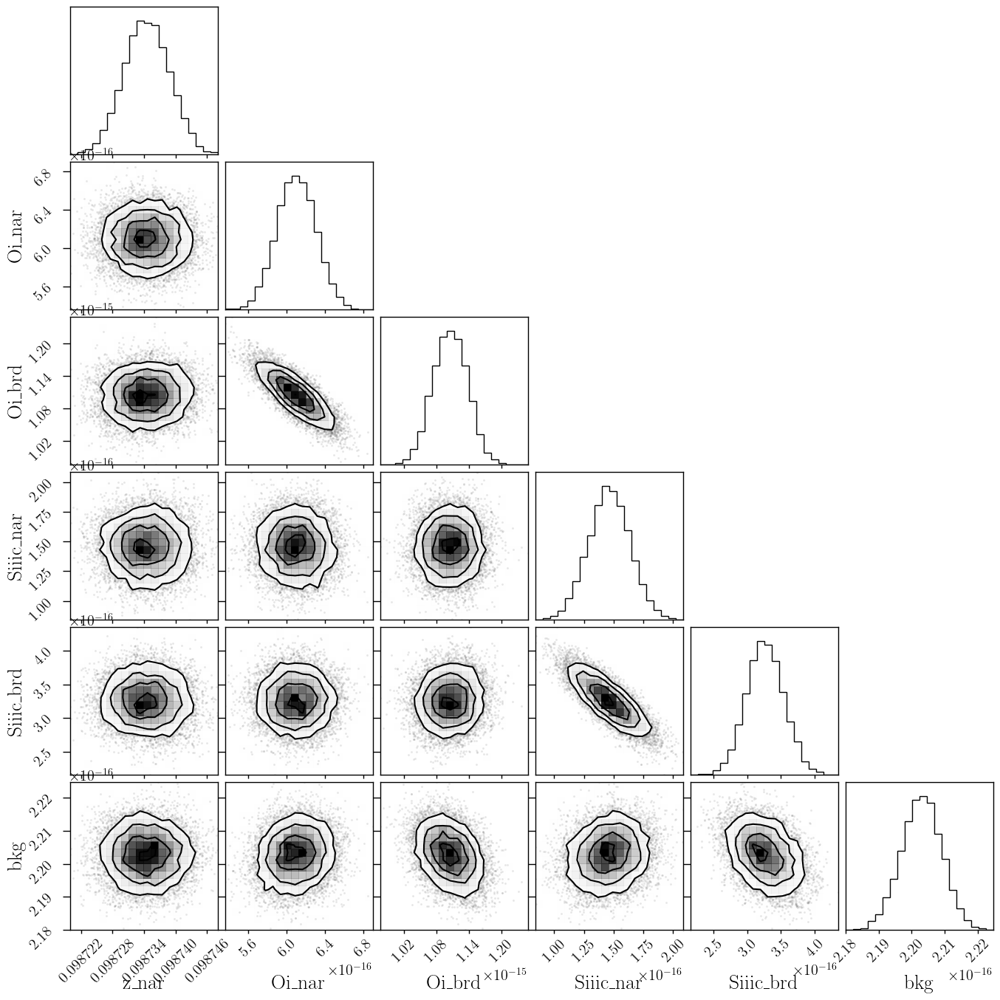

In [217]:
corner.corner(out_oi_siii.flatchain, labels=out_oi_siii.var_names);
#plt.savefig(fname='corner_ha.jpg', bbox_inches='tight')

In [218]:
out_oi_siii.params

name,value,standard error,relative error,initial value,min,max,vary
z_nar,0.09873440,4.3903e-06,(0.00%),0.09867719705615696,-inf,inf,True
z_ratio,1.00012632,,,1.0001263225003523,-inf,inf,False
sigma_6312_nar,1.37764140,,,1.3776413960252,-inf,inf,False
sigma_6312_brd,3.30952723,,,3.3095272263057645,-inf,inf,False
sigma_6300_nar,1.37764140,,,1.3776413960252,-inf,inf,False
sigma_6300_brd,3.30952723,,,3.3095272263057645,-inf,inf,False
Oi_nar,6.0970e-16,2.0576e-17,(3.37%),7e-16,0.00000000,inf,True
Oi_brd,1.1047e-15,3.2355e-17,(2.93%),9e-16,0.00000000,inf,True
Siiic_nar,1.4592e-16,1.7558e-17,(12.03%),2e-16,0.00000000,inf,True
Siiic_brd,3.2542e-16,2.8163e-17,(8.65%),3e-16,0.00000000,inf,True


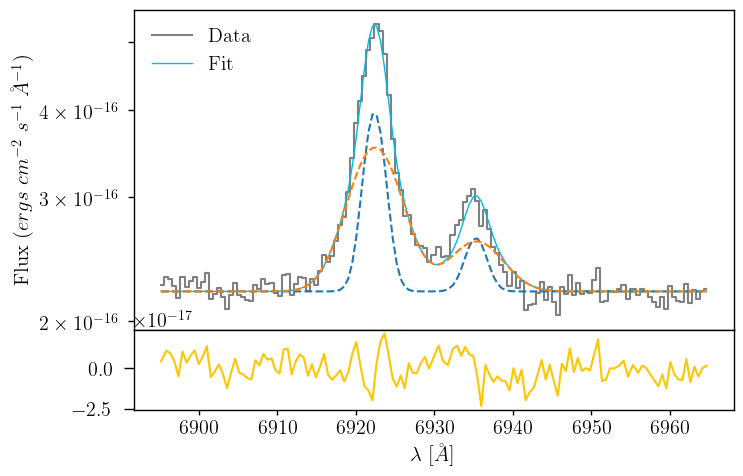

In [219]:
oi_nar_flux = out_oi_siii.flatchain.Oi_nar.mean()
oi_nar_std = out_oi_siii.flatchain.Oi_nar.std()

oi_brd_flux = out_oi_siii.flatchain.Oi_brd.mean()
oi_brd_std = out_oi_siii.flatchain.Oi_brd.std()

siiic_nar_flux = out_oi_siii.flatchain.Siiic_nar.mean()
siiic_nar_std = out_oi_siii.flatchain.Siiic_nar.std()

siiic_brd_flux = out_oi_siii.flatchain.Siiic_brd.mean()
siiic_brd_std = out_oi_siii.flatchain.Siiic_brd.std()

z_oi_siii = out_oi_siii.flatchain.z_nar.mean()
z_oi_siii_std = out_oi_siii.flatchain.z_nar.std()

bkg_oi_siii = out_oi_siii.flatchain.bkg.mean()
bkg_oi_siii_std = out_oi_siii.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(oi_siii.wavelength, oi_siii.flux,
            color='gray', label='Data', where='mid')

oi_nar = gaussian(oi_siii.wavelength, oi_nar_flux, wave_cat['[OI]6300'], z_oi_siii, upy.nominal_values(sigma_nar_6312))
oi_brd = gaussian(oi_siii.wavelength, oi_brd_flux, wave_cat['[OI]6300'], z_oi_siii * z_ratio, upy.nominal_values(sigma_brd_6312))

siiic_nar = gaussian(oi_siii.wavelength, siiic_nar_flux, wave_cat['[SIII]6312'], z_oi_siii, upy.nominal_values(sigma_nar_6312))
siiic_brd = gaussian(oi_siii.wavelength, siiic_brd_flux, wave_cat['[SIII]6312'], z_oi_siii * z_ratio, upy.nominal_values(sigma_brd_6312))

oi = oi_nar + oi_brd
siiic = siiic_nar + siiic_brd

ax.plot(oi_siii.wavelength, bkg_oi_siii + siiic + oi,
        lw=1, color=c[0], label='Fit')
ax.plot(oi_siii.wavelength, bkg_oi_siii + siiic_nar + oi_nar, ls='--')
ax.plot(oi_siii.wavelength, bkg_oi_siii + siiic_brd + oi_brd, ls='--')

ax1.plot(oi_siii.wavelength, oi_siii.flux - bkg_oi_siii - siiic - oi,
         color=c[3])
ax.set_ylabel(r'Flux ($ergs\ cm^{-2}\  s^{-1}\ \AA^{-1}$)', fontsize=15)
ax1.set_xlabel(r'$\lambda$ [$\AA$]', fontsize=15)
ax.set_yscale('log')
ax.legend(loc='upper left')

In [220]:
# EW
EW_OI_6300_nar = ufloat(oi_nar_flux, oi_nar_std) / ufloat(bkg_oi_siii, bkg_oi_siii_std)
EW_OI_6300_brd = ufloat(oi_brd_flux, oi_brd_std) / ufloat(bkg_oi_siii, bkg_oi_siii_std)
EW_OI_6300 = (ufloat(oi_nar_flux, oi_nar_std) + ufloat(oi_brd_flux, oi_brd_std)) / ufloat(bkg_oi_siii, bkg_oi_siii_std)

EW_SIII_6312_nar = ufloat(siiic_nar_flux, siiic_nar_std) / ufloat(bkg_oi_siii, bkg_oi_siii_std)
EW_SIII_6312_brd = ufloat(siiic_brd_flux, siiic_brd_std) / ufloat(bkg_oi_siii, bkg_oi_siii_std)
EW_SIII_6312 = (ufloat(siiic_nar_flux, siiic_nar_std) + ufloat(siiic_brd_flux, siiic_brd_std)) / ufloat(bkg_oi_siii, bkg_oi_siii_std)

# [ArIII]7135

### Arc lines

In [221]:
wave_cat['[ArIII]7135']*(1 + z_BN[igal])

7840.10346

In [222]:
# Select a region of the arc spectra to have a few arc lines around the wavelength of the fitted lines
wlims_7135 = [wave_cat['[ArIII]7135']*(1 + z_BN[igal]) - 10, wave_cat['[ArIII]7135']*(1 + z_BN[igal]) + 20]
mask_arc_7135 = (wcal_red[14].data['wave_soln'][0] >= wlims_7135[0]) & (wcal_red[14].data['wave_soln'][0] < wlims_7135[1])

# Arc spectra around the fitted line
x_arc_7135 = wcal_red[14].data['wave_soln'][0][mask_arc_7135]
y_arc_7135 = wcal_red[21].data[:, 6][mask_arc_7135]

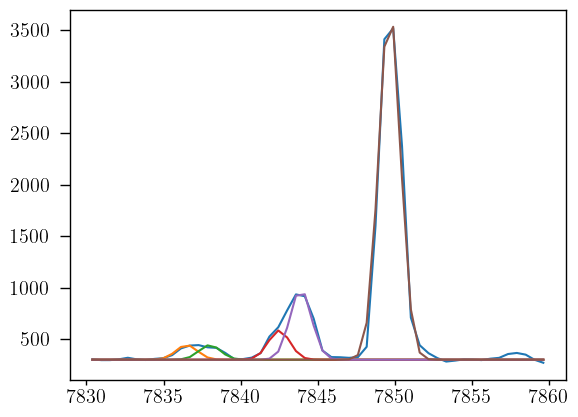

In [223]:
plt.plot(x_arc_7135, y_arc_7135)
plt.plot(x_arc_7135, 300 + gaussian(x_arc_7135,  250,  7836.5, 0, 0.7))
plt.plot(x_arc_7135, 300 + gaussian(x_arc_7135,  250,    7838, 0, 0.7))
plt.plot(x_arc_7135, 300 + gaussian(x_arc_7135,  500,  7842.5, 0, 0.7))
plt.plot(x_arc_7135, 300 + gaussian(x_arc_7135, 1200,  7843.9, 0, 0.7))
plt.plot(x_arc_7135, 300 + gaussian(x_arc_7135, 6000, 7849.67, 0, 0.7))

In [224]:
params_arc_7135 = Parameters()
params_arc_7135.add('z', value=0.0, vary=False)
params_arc_7135.add('mu1', value= 7836.5, vary=False)
params_arc_7135.add('mu2', value=   7838, vary=False)
params_arc_7135.add('mu3', value= 7842.5, vary=False)
params_arc_7135.add('mu4', value= 7843.9, vary=False)
params_arc_7135.add('mu5', value=7849.67, vary=False)
params_arc_7135.add('arc1', value= 250, min=0.)
params_arc_7135.add('arc2', value= 250, min=0.)
params_arc_7135.add('arc3', value= 500, min=0.)
params_arc_7135.add('arc4', value=1200, min=0.)
params_arc_7135.add('arc5', value=6000, min=0.)
params_arc_7135.add('sigma', value=0.7, min=0.)
params_arc_7135.add('bkg', value=300, vary=False)

def residual_arc_7135(params_arc_7135, x, data, uncertainty):
    
    z = params_arc_7135['z']
    mu1 = params_arc_7135['mu1']
    mu2 = params_arc_7135['mu2']
    mu3 = params_arc_7135['mu3']
    mu4 = params_arc_7135['mu4']
    mu5 = params_arc_7135['mu5']
    flux1 = params_arc_7135['arc1']
    flux2 = params_arc_7135['arc2']
    flux3 = params_arc_7135['arc3']
    flux4 = params_arc_7135['arc4']
    flux5 = params_arc_7135['arc5']
    sigma = params_arc_7135['sigma']
    bkg = params_arc_7135['bkg']
    
    x = x_arc_7135
    model1 = gaussian(x, flux1, mu1, z, sigma)
    model2 = gaussian(x, flux2, mu2, z, sigma)
    model3 = gaussian(x, flux3, mu3, z, sigma)
    model4 = gaussian(x, flux4, mu4, z, sigma)
    model5 = gaussian(x, flux5, mu5, z, sigma)
    model = bkg + model1 + model2 + model3 + model4 + model5
    return (model - y_arc_7135) / 10

np.random.seed(21)
out_arc_7135 = minimize(residual_arc_7135, params_arc_7135, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10)

100%|███████████████████████████████████████| 2500/2500 [00:26<00:00, 96.06it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 4 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [53.76944927 64.60633999 53.55961534 48.38484696 58.09936086 47.92801683]


In [225]:
out_arc_7135.params

name,value,standard error,relative error,initial value,min,max,vary
z,0.00000000,,,0.0,-inf,inf,False
mu1,7836.50000,,,7836.5,-inf,inf,False
mu2,7838.00000,,,7838,-inf,inf,False
mu3,7842.50000,,,7842.5,-inf,inf,False
mu4,7843.90000,,,7843.9,-inf,inf,False
mu5,7849.67000,,,7849.67,-inf,inf,False
arc1,210.117781,12.3844484,(5.89%),250,0.00000000,inf,True
arc2,214.981695,12.4040436,(5.77%),250,0.00000000,inf,True
arc3,450.129721,12.8451213,(2.85%),500,0.00000000,inf,True
arc4,1133.04739,12.7480351,(1.13%),1200,0.00000000,inf,True


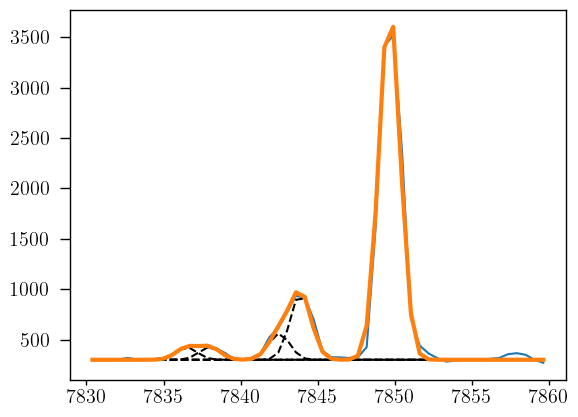

In [226]:
arc1_7135 = out_arc_7135.flatchain.arc1.mean()
arc2_7135 = out_arc_7135.flatchain.arc2.mean()
arc3_7135 = out_arc_7135.flatchain.arc3.mean()
arc4_7135 = out_arc_7135.flatchain.arc4.mean()
arc5_7135 = out_arc_7135.flatchain.arc5.mean()
sigma_arc_7135 = out_arc_7135.flatchain.sigma.mean()

plt.plot(x_arc_7135, y_arc_7135)

plt.plot(x_arc_7135, 300 + gaussian(x_arc_7135, arc1_7135,  7836.5, 0, sigma_arc_7135), ls='--', color='black')
plt.plot(x_arc_7135, 300 + gaussian(x_arc_7135, arc2_7135,    7838, 0, sigma_arc_7135), ls='--', color='black')
plt.plot(x_arc_7135, 300 + gaussian(x_arc_7135, arc3_7135,  7842.5, 0, sigma_arc_7135), ls='--', color='black')
plt.plot(x_arc_7135, 300 + gaussian(x_arc_7135, arc4_7135,  7843.9, 0, sigma_arc_7135), ls='--', color='black')
plt.plot(x_arc_7135, 300 + gaussian(x_arc_7135, arc5_7135, 7849.67, 0, sigma_arc_7135), ls='--', color='black')

plt.plot(x_arc_7135, 300 + gaussian(x_arc_7135, arc1_7135,  7836.5, 0, sigma_arc_7135) \
                         + gaussian(x_arc_7135, arc2_7135,    7838, 0, sigma_arc_7135) \
                         + gaussian(x_arc_7135, arc3_7135,  7842.5, 0, sigma_arc_7135) \
                         + gaussian(x_arc_7135, arc4_7135,  7843.9, 0, sigma_arc_7135) \
                         + gaussian(x_arc_7135, arc5_7135, 7849.67, 0, sigma_arc_7135), lw=3
)

### Line fitting

In [227]:
sigma_nar_7135 = upy.sqrt((sigma_nar_intrinsic**2) + (sigma_arc_7135**2))
sigma_brd_7135 = upy.sqrt((sigma_brd_intrinsic**2) + (sigma_arc_7135**2))

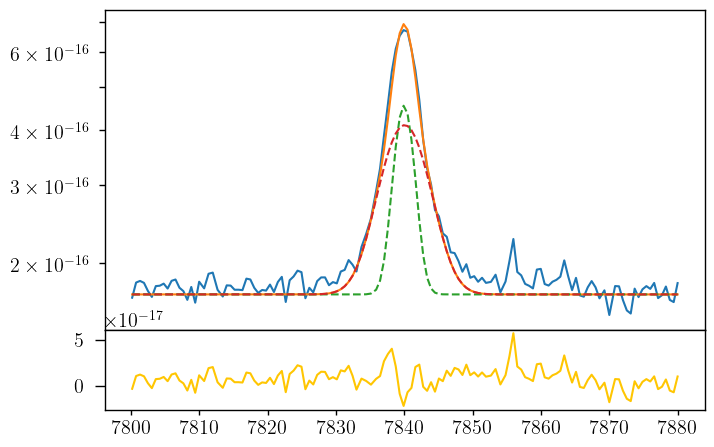

In [228]:
# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.plot(ariii_7135.wavelength, ariii_7135.flux)
bkg = 1.7e-16

ariiia_nar = gaussian(ariii_7135.wavelength, 1e-15, wave_cat['[ArIII]7135'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_7135))
ariiia_brd = gaussian(ariii_7135.wavelength, 2e-15, wave_cat['[ArIII]7135'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_7135))

ax.plot(ariii_7135.wavelength, bkg + ariiia_nar + ariiia_brd)
ax.plot(ariii_7135.wavelength, bkg + ariiia_nar, ls='--')
ax.plot(ariii_7135.wavelength, bkg + ariiia_brd, ls='--')
ax1.plot(ariii_7135.wavelength, ariii_7135.flux - bkg - ariiia_nar - ariiia_brd, color=c[3])
ax.set_yscale('log')

In [229]:
params_ariii = Parameters()
params_ariii.add('z_nar', value=z_nar_oiii_4959, vary=True)
params_ariii.add('z_ratio', value=z_ratio, vary=False)
params_ariii.add('sigma_nar', value=upy.nominal_values(sigma_nar_7135), vary=False)
params_ariii.add('sigma_brd', value=upy.nominal_values(sigma_brd_7135), vary=False)
params_ariii.add('Ariiia_nar', value=1e-15, min=0.)
params_ariii.add('Ariiia_brd', value=2e-15, min=0.)
params_ariii.add('bkg', value=1.7e-16, min=0.)


def residual_ariii(params_ariii, x, data, uncertainty):
    
    z_nar = params_ariii['z_nar']
    z_brd = params_ariii['z_nar'] * params_ariii['z_ratio']
    sigma_nar = params_ariii['sigma_nar']
    sigma_brd = params_ariii['sigma_brd']
    ariiia_nar = params_ariii['Ariiia_nar']
    ariiia_brd = params_ariii['Ariiia_brd']
    bkg = params_ariii['bkg']
    
    x = ariii_7135.wavelength
    model_ariii = gaussian(x, ariiia_nar, wave_cat['[ArIII]7135'], z_nar, sigma_nar) \
                + gaussian(x, ariiia_brd, wave_cat['[ArIII]7135'], z_brd, sigma_brd)
    
    return (model_ariii + bkg - ariii_7135.flux) / ariii_7135.noise

In [230]:
np.random.seed(21)
out_ariii = minimize(residual_ariii, params_ariii, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|██████████████████████████████████████| 2500/2500 [00:18<00:00, 131.75it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [39.59152535 54.9991208  53.64741489 46.3561155 ]


In [231]:
out_ariii.params

name,value,standard error,relative error,initial value,min,max,vary
z_nar,0.09866933,2.9450e-06,(0.00%),0.09867719705615696,-inf,inf,True
z_ratio,1.00012632,,,1.0001263225003523,-inf,inf,False
sigma_nar,1.40498268,,,1.404982678157271,-inf,inf,False
sigma_brd,3.32100150,,,3.321001501285244,-inf,inf,False
Ariiia_nar,9.3231e-16,2.7289e-17,(2.93%),1e-15,0.00000000,inf,True
Ariiia_brd,2.1018e-15,4.0398e-17,(1.92%),2e-15,0.00000000,inf,True
bkg,1.7746e-16,5.9351e-19,(0.33%),1.7e-16,0.00000000,inf,True


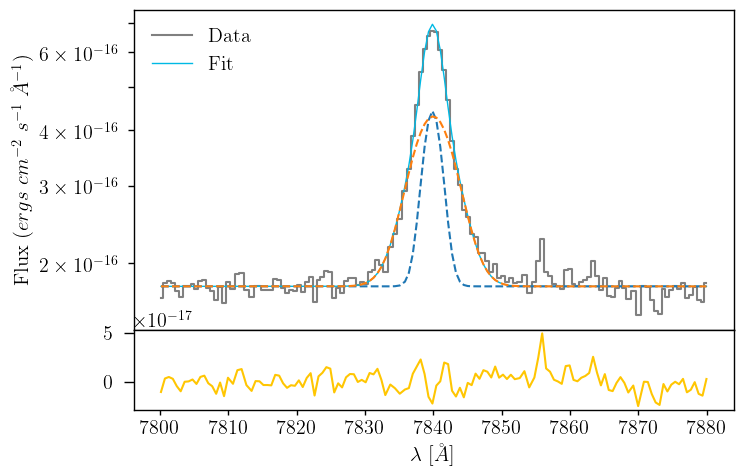

In [232]:
ariiia_nar_flux = out_ariii.flatchain.Ariiia_nar.mean()
ariiia_nar_std = out_ariii.flatchain.Ariiia_nar.std()

ariiia_brd_flux = out_ariii.flatchain.Ariiia_brd.mean()
ariiia_brd_std = out_ariii.flatchain.Ariiia_brd.std()

z_ariii = out_ariii.flatchain.z_nar.mean()
z_ariii_std = out_ariii.flatchain.z_nar.std()

bkg_ariii = out_ariii.flatchain.bkg.mean()
bkg_ariii_std = out_ariii.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(ariii_7135.wavelength, ariii_7135.flux,
            color='gray', label='Data', where='mid')

ariiia_nar = gaussian(ariii_7135.wavelength, ariiia_nar_flux, wave_cat['[ArIII]7135'], z_ariii, upy.nominal_values(sigma_nar_7135))
ariiia_brd = gaussian(ariii_7135.wavelength, ariiia_brd_flux, wave_cat['[ArIII]7135'], z_ariii * z_ratio, upy.nominal_values(sigma_brd_7135))

ariiia = ariiia_nar + ariiia_brd

ax.plot(ariii_7135.wavelength, bkg_ariii + ariiia,
        lw=1, color=c[0], label='Fit')
ax.plot(ariii_7135.wavelength, bkg_ariii + ariiia_nar, ls='--')
ax.plot(ariii_7135.wavelength, bkg_ariii + ariiia_brd, ls='--')

ax1.plot(ariii_7135.wavelength, ariii_7135.flux - bkg_ariii - ariiia,
         color=c[3])
ax.set_ylabel(r'Flux ($ergs\ cm^{-2}\  s^{-1}\ \AA^{-1}$)', fontsize=15)
ax1.set_xlabel(r'$\lambda$ [$\AA$]', fontsize=15)
ax.set_yscale('log')
ax.legend(loc='upper left')

In [233]:
# EW
EW_ArIII_7135_nar = ufloat(ariiia_nar_flux, ariiia_nar_std) / ufloat(bkg_ariii, bkg_ariii_std)
EW_ArIII_7135_brd = ufloat(ariiia_brd_flux, ariiia_brd_std) / ufloat(bkg_ariii, bkg_ariii_std)
EW_ArIII_7135 = (ufloat(ariiia_nar_flux, ariiia_nar_std) + ufloat(ariiia_brd_flux, ariiia_brd_std)) / ufloat(bkg_ariii, bkg_ariii_std)

# [OIII]5007 + HeI 5015

### Arc lines

In [234]:
# Select a region of the arc spectra to have a few arc lines around the wavelength of the fitted lines
wlims_5007 = [wave_cat['[OIII]5007']*(1 + z_BN[igal]) - 10, wave_cat['[OIII]5007']*(1 + z_BN[igal]) + 10]
mask_arc_5007 = (wcal_red[8].data['wave_soln'][0] >= wlims_5007[0]) & (wcal_red[8].data['wave_soln'][0] < wlims_5007[1])

# Arc spectra around the fitted line
x_arc_5007 = wcal_red[8].data['wave_soln'][0][mask_arc_5007]
y_arc_5007 = wcal_red[21].data[:, 3][mask_arc_5007]

100%|██████████████████████████████████████| 2500/2500 [00:23<00:00, 108.16it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 3 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [ 27.88888667  36.4387168   64.19976547 118.21808815  69.51913566]


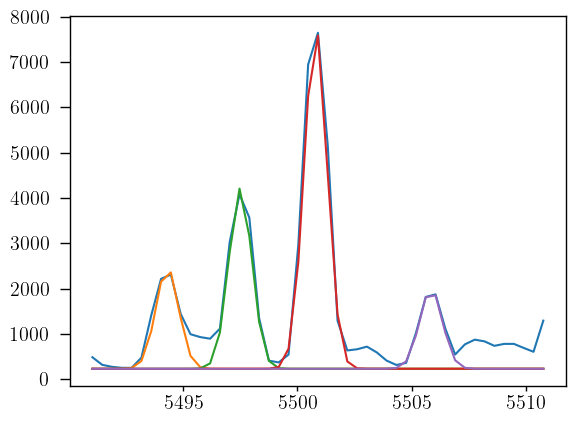

In [235]:
plt.plot(x_arc_5007, y_arc_5007)
plt.plot(x_arc_5007, 230 + gaussian(x_arc_5007, 2800, 5494.3, 0, 0.5))
plt.plot(x_arc_5007, 230 + gaussian(x_arc_5007, 5000, 5497.5, 0, 0.5))
plt.plot(x_arc_5007, 230 + gaussian(x_arc_5007, 9400, 5500.8, 0, 0.5))
plt.plot(x_arc_5007, 230 + gaussian(x_arc_5007, 2200, 5505.85, 0, 0.5))

params_arc_5007 = Parameters()
params_arc_5007.add('z', value=0.0, vary=False)
params_arc_5007.add('mu1', value=5494.3, vary=False)
params_arc_5007.add('mu2', value=5497.5, vary=False)
params_arc_5007.add('mu3', value=5500.8, vary=False)
params_arc_5007.add('mu4', value=5505.85, vary=False)
params_arc_5007.add('arc1', value=2800, min=0.)
params_arc_5007.add('arc2', value=5000, min=0.)
params_arc_5007.add('arc3', value=9400, min=0.)
params_arc_5007.add('arc4', value=2200, min=0.)
params_arc_5007.add('sigma', value=0.5, min=0.)
params_arc_5007.add('bkg', value=230, vary=False)

def residual_arc_5007(params_arc_5007, x, data, uncertainty):
    
    z = params_arc_5007['z']
    mu1 = params_arc_5007['mu1']
    mu2 = params_arc_5007['mu2']
    mu3 = params_arc_5007['mu3']
    mu4 = params_arc_5007['mu4']
    flux1 = params_arc_5007['arc1']
    flux2 = params_arc_5007['arc2']
    flux3 = params_arc_5007['arc3']
    flux4 = params_arc_5007['arc4']
    sigma = params_arc_5007['sigma']
    bkg = params_arc_5007['bkg']
    
    x = x_arc_5007
    model1 = gaussian(x, flux1, mu1, z, sigma)
    model2 = gaussian(x, flux2, mu2, z, sigma)
    model3 = gaussian(x, flux3, mu3, z, sigma)
    model4 = gaussian(x, flux4, mu4, z, sigma)
    model = bkg + model1 + model2 + model3 + model4
    return (model - y_arc_5007) / 10

np.random.seed(21)
out_arc_5007 = minimize(residual_arc_5007, params_arc_5007, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10)

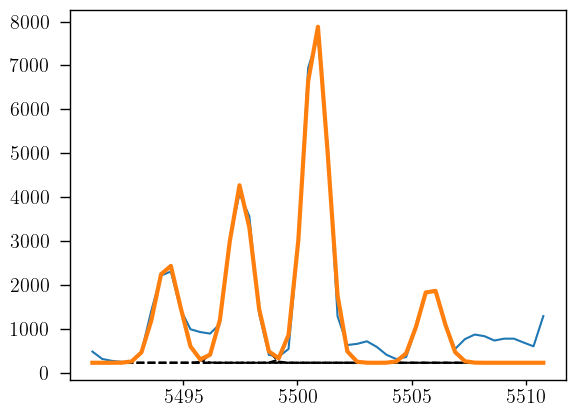

In [236]:
arc1_5007 = out_arc_5007.flatchain.arc1.mean()
arc2_5007 = out_arc_5007.flatchain.arc2.mean()
arc3_5007 = out_arc_5007.flatchain.arc3.mean()
arc4_5007 = out_arc_5007.flatchain.arc4.mean()
sigma_arc_5007 = out_arc_5007.flatchain.sigma.mean()

plt.plot(x_arc_5007, y_arc_5007)

plt.plot(x_arc_5007, 230 + gaussian(x_arc_5007, arc1_5007, 5494.3, 0, sigma_arc_5007), ls='--', color='black')
plt.plot(x_arc_5007, 230 + gaussian(x_arc_5007, arc2_5007, 5497.5, 0, sigma_arc_5007), ls='--', color='black')
plt.plot(x_arc_5007, 230 + gaussian(x_arc_5007, arc3_5007, 5500.8, 0, sigma_arc_5007), ls='--', color='black')
plt.plot(x_arc_5007, 230 + gaussian(x_arc_5007, arc4_5007, 5505.85, 0, sigma_arc_5007), ls='--', color='black')

plt.plot(x_arc_5007, 230 + gaussian(x_arc_5007, arc1_5007, 5494.3, 0, sigma_arc_5007) \
         + gaussian(x_arc_5007, arc2_5007, 5497.5, 0, sigma_arc_5007) \
         + gaussian(x_arc_5007, arc3_5007, 5500.8, 0, sigma_arc_5007) \
         + gaussian(x_arc_5007, arc4_5007, 5505.85, 0, sigma_arc_5007), lw=3
)

### Line fitting

In [237]:
sigma_nar_5007 = upy.sqrt((sigma_nar_intrinsic**2) + (sigma_arc_5007**2))
sigma_brd_5007 = upy.sqrt((sigma_brd_intrinsic**2) + (sigma_arc_5007**2))

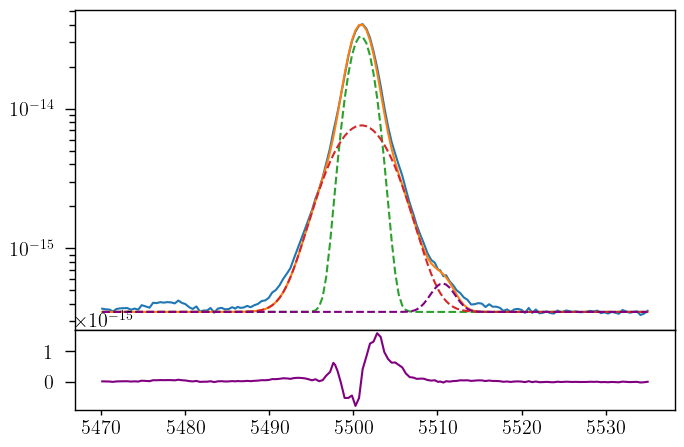

In [238]:
# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.plot(oiii_hei.wavelength, oiii_hei.flux)
bkg = 3.5e-16

oiiia_nar = gaussian(oiii_hei.wavelength, 11e-14, wave_cat['[OIII]5007'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_5007))
oiiia_brd = gaussian(oiii_hei.wavelength, 6e-14, wave_cat['[OIII]5007'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_5007))

hei_5015 = gaussian(oiii_hei.wavelength, 7e-16, wave_cat['HeI5015'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_5007))

ax.plot(oiii_hei.wavelength, bkg + oiiia_nar + oiiia_brd + hei_5015)
ax.plot(oiii_hei.wavelength, bkg + oiiia_nar, ls='--')
ax.plot(oiii_hei.wavelength, bkg + oiiia_brd, ls='--')
ax.plot(oiii_hei.wavelength, bkg + hei_5015, ls='--', color='purple')
ax1.plot(oiii_hei.wavelength, oiii_hei.flux - bkg - oiiia_nar - oiiia_brd - hei_5015, color='purple')
ax.set_yscale('log')

In [239]:
params_oiii_hei = Parameters()
params_oiii_hei.add('z_nar', value=z_nar_oiii_4959, vary=True)
params_oiii_hei.add('z_ratio', value=z_ratio, vary=False)
params_oiii_hei.add('sigma_5007_nar', value=upy.nominal_values(sigma_nar_5007), vary=False)
params_oiii_hei.add('sigma_5007_brd', value=upy.nominal_values(sigma_brd_5007), vary=False)
params_oiii_hei.add('Hei', value=7e-16, min=0.)
params_oiii_hei.add('Oiiia_nar', value=11e-14, min=0.)
params_oiii_hei.add('Oiiia_brd', value=6e-14, min=0.)
params_oiii_hei.add('bkg', value=3.5e-16, min=0.)


def residual_oiii_hei(params_oiii_hei, x, data, uncertainty):
    
    z_nar = params_oiii_hei['z_nar']
    z_brd = params_oiii_hei['z_nar'] * params_oiii_hei['z_ratio']
    sigma_5007_nar = params_oiii_hei['sigma_5007_nar']
    sigma_5007_brd = params_oiii_hei['sigma_5007_brd']
    oiiia_nar = params_oiii_hei['Oiiia_nar']
    oiiia_brd = params_oiii_hei['Oiiia_brd']
    hei = params_oiii_hei['Hei']
    bkg = params_oiii_hei['bkg']
    
    x = oiii_hei.wavelength
    model_oiii = gaussian(x, oiiia_nar, wave_cat['[OIII]5007'], z_nar, sigma_5007_nar) \
               + gaussian(x, oiiia_brd, wave_cat['[OIII]5007'], z_brd, sigma_5007_brd)
    model_hei = gaussian(x, hei, wave_cat['HeI5015'], z_nar, sigma_5007_nar)
    
    return (model_oiii + model_hei + bkg - oiii_hei.flux) / oiii_hei.noise

In [240]:
np.random.seed(21)
out_oiii_hei = minimize(residual_oiii_hei, params_oiii_hei, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|██████████████████████████████████████| 2500/2500 [00:22<00:00, 112.07it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 4 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [27.14699464 53.10783817 56.04711227 74.46743417 62.9777667 ]


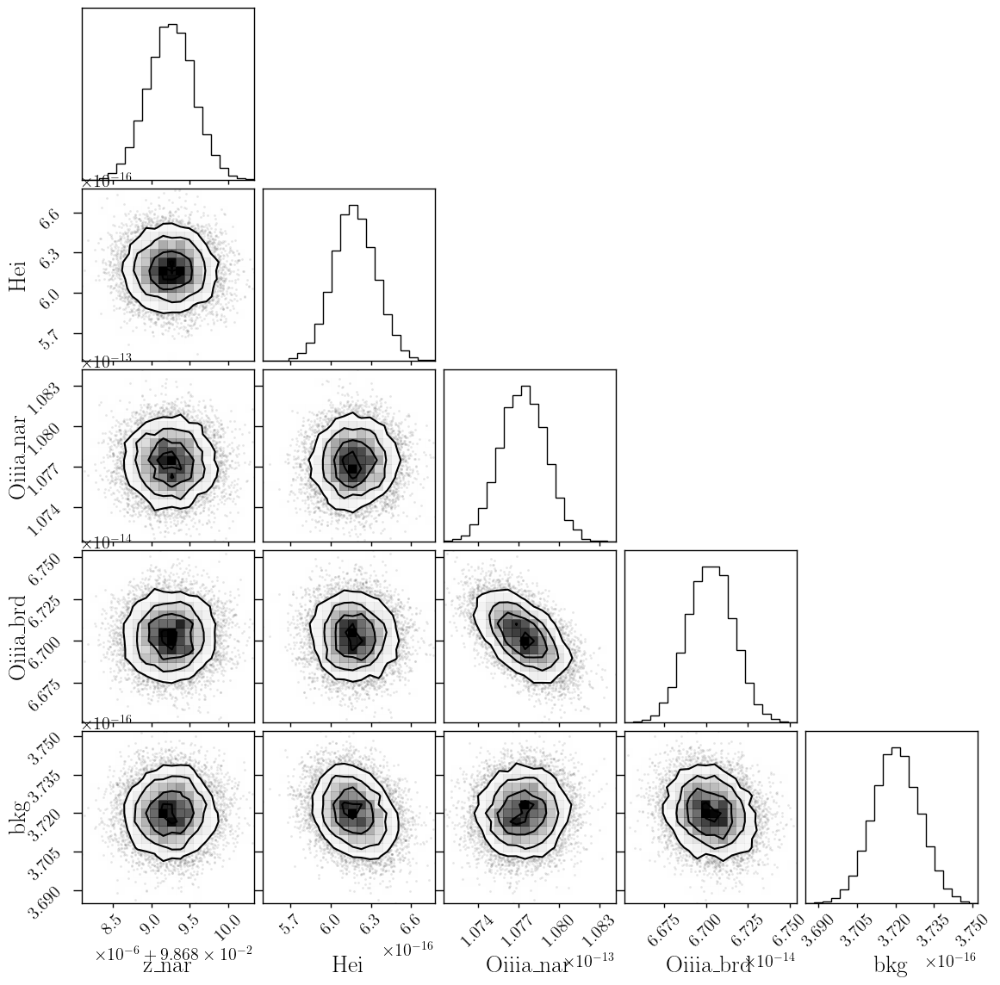

In [241]:
corner.corner(out_oiii_hei.flatchain, labels=out_oiii_hei.var_names);
#plt.savefig(fname='corner_ha.jpg', bbox_inches='tight')

In [242]:
out_oiii_hei.params

name,value,standard error,relative error,initial value,min,max,vary
z_nar,0.09868925,2.9511e-07,(0.00%),0.09867719705615696,-inf,inf,True
z_ratio,1.00012632,,,1.0001263225003523,-inf,inf,False
sigma_5007_nar,1.33546166,,,1.335461662831956,-inf,inf,False
sigma_5007_brd,3.29219266,,,3.2921926581703507,-inf,inf,False
Hei,6.1716e-16,1.5945e-17,(2.58%),7e-16,0.00000000,inf,True
Oiiia_nar,1.0773e-13,1.7074e-16,(0.16%),1.1e-13,0.00000000,inf,True
Oiiia_brd,6.7028e-14,1.3656e-16,(0.20%),6e-14,0.00000000,inf,True
bkg,3.7201e-16,9.2144e-19,(0.25%),3.5e-16,0.00000000,inf,True


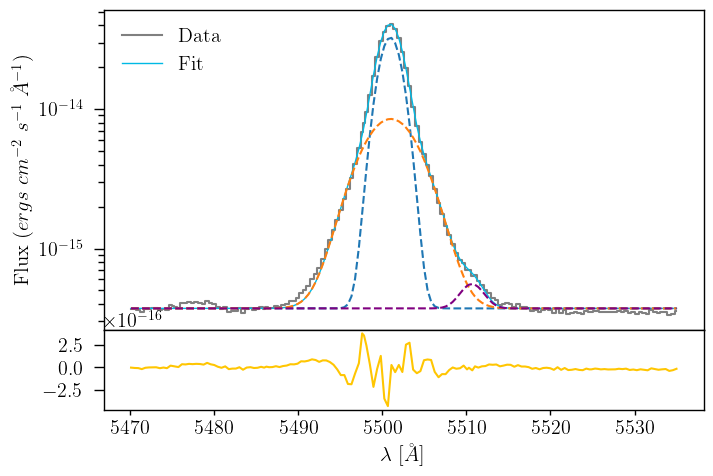

In [243]:
hei_flux = out_oiii_hei.flatchain.Hei.mean()
hei_std = out_oiii_hei.flatchain.Hei.std()

oiiia_nar_flux = out_oiii_hei.flatchain.Oiiia_nar.mean()
oiiia_nar_std = out_oiii_hei.flatchain.Oiiia_nar.std()

oiiia_brd_flux = out_oiii_hei.flatchain.Oiiia_brd.mean()
oiiia_brd_std = out_oiii_hei.flatchain.Oiiia_brd.std()

z_oiii_hei = out_oiii_hei.flatchain.z_nar.mean()
z_oiii_hei_std = out_oiii_hei.flatchain.z_nar.std()

bkg_oiii_hei = out_oiii_hei.flatchain.bkg.mean()
bkg_oiii_hei_std = out_oiii_hei.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(oiii_hei.wavelength, oiii_hei.flux,
            color='gray', label='Data', where='mid')

hei = gaussian(oiii_hei.wavelength, hei_flux, wave_cat['HeI5015'], z_oiii_hei, upy.nominal_values(sigma_nar_5007))

oiiia_nar = gaussian(oiii_hei.wavelength, oiiia_nar_flux, wave_cat['[OIII]5007'], z_oiii_hei, upy.nominal_values(sigma_nar_5007))
oiiia_brd = gaussian(oiii_hei.wavelength, oiiia_brd_flux, wave_cat['[OIII]5007'], z_oiii_hei * z_ratio, upy.nominal_values(sigma_brd_5007))

oiiia = oiiia_nar + oiiia_brd

ax.plot(oiii_hei.wavelength, bkg_oiii_hei + oiiia + hei,
        lw=1, color=c[0], label='Fit')
ax.plot(oiii_hei.wavelength, bkg_oiii_hei + oiiia_nar, ls='--')
ax.plot(oiii_hei.wavelength, bkg_oiii_hei + oiiia_brd, ls='--')
ax.plot(oiii_hei.wavelength, bkg_oiii_hei + hei, ls='--', color='purple')

ax1.plot(oiii_hei.wavelength, oiii_hei.flux - bkg_oiii_hei - oiiia - hei,
         color=c[3])
ax.set_ylabel(r'Flux ($ergs\ cm^{-2}\  s^{-1}\ \AA^{-1}$)', fontsize=15)
ax1.set_xlabel(r'$\lambda$ [$\AA$]', fontsize=15)
ax.set_yscale('log')
ax.legend(loc='upper left')

In [244]:
# EW
EW_OIII_5007_nar = ufloat(oiiia_nar_flux, oiiia_nar_std) / ufloat(bkg_oiii_hei, bkg_oiii_hei_std)
EW_OIII_5007_brd = ufloat(oiiia_brd_flux, oiiia_brd_std) / ufloat(bkg_oiii_hei, bkg_oiii_hei_std)
EW_OIII_5007 = (ufloat(oiiia_nar_flux, oiiia_nar_std) + ufloat(oiiia_brd_flux, oiiia_brd_std)) / ufloat(bkg_oiii_hei, bkg_oiii_hei_std)

# [FeIII]4658

### Arc lines

In [245]:
wave_cat['[FeIII]4658']*(1 + z_BN[igal])

5117.799535

In [246]:
# Select a region of the arc spectra to have a few arc lines around the wavelength of the fitted lines
wlims_4658 = [wave_cat['[FeIII]4658']*(1 + z_BN[igal]) - 10, wave_cat['[FeIII]4658']*(1 + z_BN[igal]) + 10]
mask_arc_4658 = (wcal_red[6].data['wave_soln'][0] >= wlims_4658[0]) & (wcal_red[6].data['wave_soln'][0] < wlims_4658[1])

# Arc spectra around the fitted line
x_arc_4658 = wcal_red[6].data['wave_soln'][0][mask_arc_4658]
y_arc_4658 = wcal_red[21].data[:, 2][mask_arc_4658]

100%|██████████████████████████████████████| 2500/2500 [00:23<00:00, 107.13it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [46.66871902 43.57888171 45.98270948 68.31520227 58.78724121]


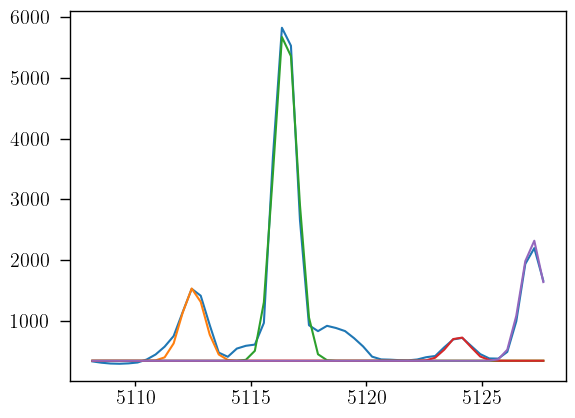

In [247]:
plt.plot(x_arc_4658, y_arc_4658)
plt.plot(x_arc_4658, 350 + gaussian(x_arc_4658, 1500, 5112.5, 0, 0.5))
plt.plot(x_arc_4658, 350 + gaussian(x_arc_4658, 7000, 5116.5, 0, 0.5))
plt.plot(x_arc_4658, 350 + gaussian(x_arc_4658,  500,   5124, 0, 0.5))
plt.plot(x_arc_4658, 350 + gaussian(x_arc_4658, 2500, 5127.2, 0, 0.5))

params_arc_4658 = Parameters()
params_arc_4658.add('z', value=0.0, vary=False)
params_arc_4658.add('mu1', value=5112.5, vary=False)
params_arc_4658.add('mu2', value=5116.5, vary=False)
params_arc_4658.add('mu3', value=  5124, vary=False)
params_arc_4658.add('mu4', value=5127.2, vary=False)
params_arc_4658.add('arc1', value=1500, min=0.)
params_arc_4658.add('arc2', value=7000, min=0.)
params_arc_4658.add('arc3', value= 500, min=0.)
params_arc_4658.add('arc4', value=2500, min=0.)
params_arc_4658.add('sigma', value=0.5, min=0.)
params_arc_4658.add('bkg', value=350, vary=False)

def residual_arc_4658(params_arc_4658, x, data, uncertainty):
    
    z = params_arc_4658['z']
    mu1 = params_arc_4658['mu1']
    mu2 = params_arc_4658['mu2']
    mu3 = params_arc_4658['mu3']
    mu4 = params_arc_4658['mu4']
    flux1 = params_arc_4658['arc1']
    flux2 = params_arc_4658['arc2']
    flux3 = params_arc_4658['arc3']
    flux4 = params_arc_4658['arc4']
    sigma = params_arc_4658['sigma']
    bkg = params_arc_4658['bkg']
    
    x = x_arc_4658
    model1 = gaussian(x, flux1, mu1, z, sigma)
    model2 = gaussian(x, flux2, mu2, z, sigma)
    model3 = gaussian(x, flux3, mu3, z, sigma)
    model4 = gaussian(x, flux4, mu4, z, sigma)
    model = bkg + model1 + model2 + model3 + model4
    return (model - y_arc_4658) / 10

np.random.seed(21)
out_arc_4658 = minimize(residual_arc_4658, params_arc_4658, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10)

In [248]:
out_arc_4658.params

name,value,standard error,relative error,initial value,min,max,vary
z,0.00000000,,,0.0,-inf,inf,False
mu1,5112.50000,,,5112.5,-inf,inf,False
mu2,5116.50000,,,5116.5,-inf,inf,False
mu3,5124.00000,,,5124,-inf,inf,False
mu4,5127.20000,,,5127.2,-inf,inf,False
arc1,1571.91876,8.07229021,(0.51%),1500,0.00000000,inf,True
arc2,7048.88104,9.99380457,(0.14%),7000,0.00000000,inf,True
arc3,508.784969,8.42194677,(1.66%),500,0.00000000,inf,True
arc4,2359.00884,8.55232622,(0.36%),2500,0.00000000,inf,True
sigma,0.48551302,7.7988e-04,(0.16%),0.5,0.00000000,inf,True


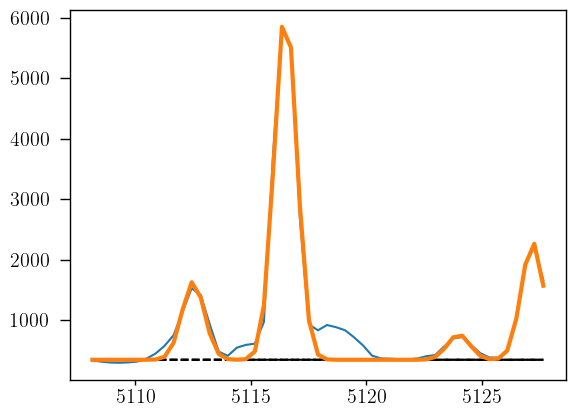

In [249]:
arc1_4658 = out_arc_4658.flatchain.arc1.mean()
arc2_4658 = out_arc_4658.flatchain.arc2.mean()
arc3_4658 = out_arc_4658.flatchain.arc3.mean()
arc4_4658 = out_arc_4658.flatchain.arc4.mean()
sigma_arc_4658 = out_arc_4658.flatchain.sigma.mean()

plt.plot(x_arc_4658, y_arc_4658)

plt.plot(x_arc_4658, 350 + gaussian(x_arc_4658, arc1_4658, 5112.5, 0, sigma_arc_4658), ls='--', color='black')
plt.plot(x_arc_4658, 350 + gaussian(x_arc_4658, arc2_4658, 5116.5, 0, sigma_arc_4658), ls='--', color='black')
plt.plot(x_arc_4658, 350 + gaussian(x_arc_4658, arc3_4658,   5124, 0, sigma_arc_4658), ls='--', color='black')
plt.plot(x_arc_4658, 350 + gaussian(x_arc_4658, arc4_4658, 5127.2, 0, sigma_arc_4658), ls='--', color='black')

plt.plot(x_arc_4658, 350 + gaussian(x_arc_4658, arc1_4658, 5112.5, 0, sigma_arc_4658) \
                         + gaussian(x_arc_4658, arc2_4658, 5116.5, 0, sigma_arc_4658) \
                         + gaussian(x_arc_4658, arc3_4658,   5124, 0, sigma_arc_4658) \
                         + gaussian(x_arc_4658, arc4_4658, 5127.2, 0, sigma_arc_4658), lw=3
)

### Line fitting

In [250]:
sigma_nar_4658 = upy.sqrt((sigma_nar_intrinsic**2) + (sigma_arc_4658**2))
sigma_brd_4658 = upy.sqrt((sigma_brd_intrinsic**2) + (sigma_arc_4658**2))

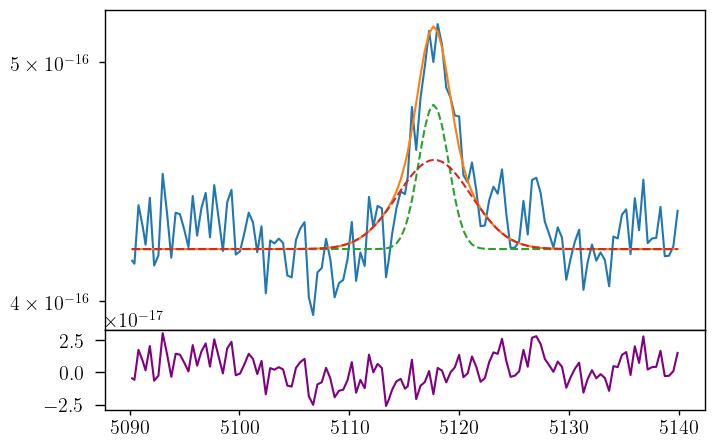

In [251]:
# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.plot(feiii_4658.wavelength, feiii_4658.flux)
bkg = 4.2e-16

feiiia_nar = gaussian(feiii_4658.wavelength, 2e-16, wave_cat['[FeIII]4658'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_4658))
feiiia_brd = gaussian(feiii_4658.wavelength, 3e-16, wave_cat['[FeIII]4658'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_4658))

ax.plot(feiii_4658.wavelength, bkg + feiiia_nar + feiiia_brd)
ax.plot(feiii_4658.wavelength, bkg + feiiia_nar, ls='--')
ax.plot(feiii_4658.wavelength, bkg + feiiia_brd, ls='--')
ax1.plot(feiii_4658.wavelength, feiii_4658.flux - bkg - feiiia_nar - feiiia_brd, color='purple')
ax.set_yscale('log')

In [252]:
params_feiiia = Parameters()

params_feiiia.add('z_nar', value=z_nar_oiii_4959, vary=True)
params_feiiia.add('z_ratio', value=z_ratio, vary=False)
params_feiiia.add('sigma_nar', value=upy.nominal_values(sigma_nar_4658), vary=False)
params_feiiia.add('sigma_brd', value=upy.nominal_values(sigma_brd_4658), vary=False)
params_feiiia.add('Feiiia_nar', value=2e-16, min=0.)
params_feiiia.add('Feiiia_brd', value=3e-16, min=0.)
params_feiiia.add('bkg', value=4.2e-16, min=0.)


def residual_feiiia(params_feiiia, x, data, uncertainty):
    
    z_nar = params_feiiia['z_nar']
    z_brd = params_feiiia['z_nar'] * params_feiiia['z_ratio']
    sigma_nar = params_feiiia['sigma_nar']
    sigma_brd = params_feiiia['sigma_brd']
    feiiia_nar_flux = params_feiiia['Feiiia_nar']
    feiiia_brd_flux = params_feiiia['Feiiia_brd']
    bkg = params_feiiia['bkg']
    
    x = feiii_4658.wavelength
    model = gaussian(x, feiiia_nar_flux, wave_cat['[FeIII]4658'], z_nar, sigma_nar) + \
            gaussian(x, feiiia_brd_flux, wave_cat['[FeIII]4658'], z_brd, sigma_brd)
    
    return (model + bkg - feiii_4658.flux) / feiii_4658.noise

In [253]:
np.random.seed(21)
out_feiiia = minimize(residual_feiiia, params_feiiia, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|██████████████████████████████████████| 2500/2500 [00:18<00:00, 131.91it/s]


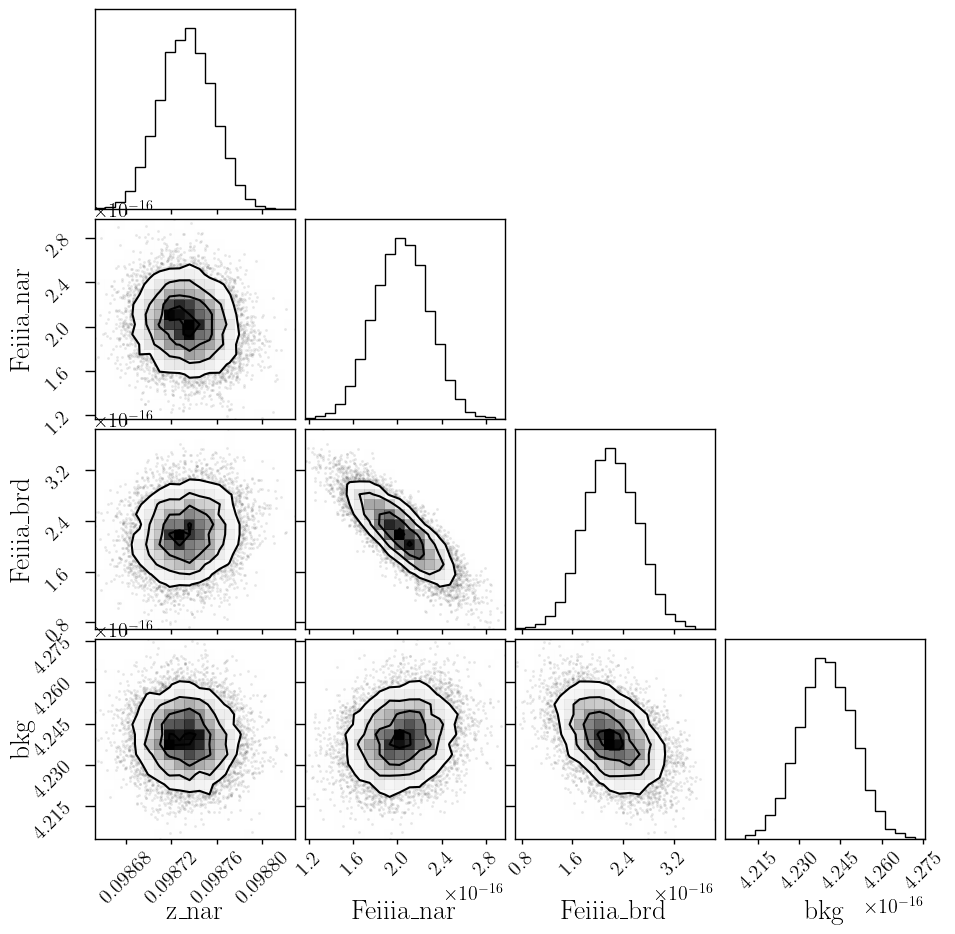

In [254]:
corner.corner(out_feiiia.flatchain, labels=out_feiiia.var_names);
#plt.savefig(fname='corner_ha.jpg', bbox_inches='tight')

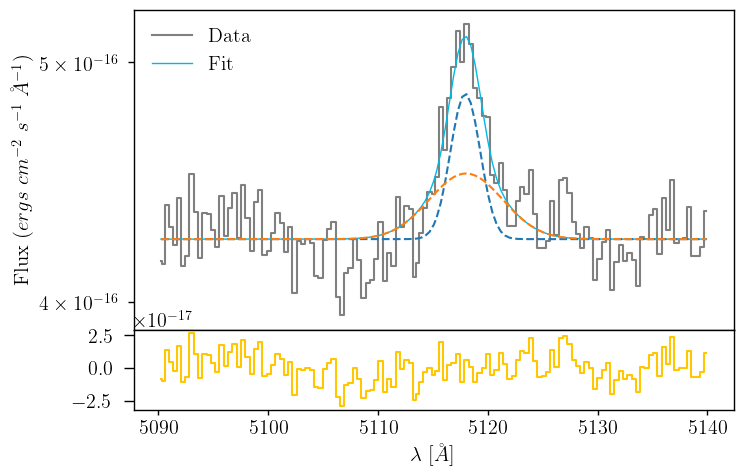

In [255]:
feiiia_nar_flux = out_feiiia.flatchain.Feiiia_nar.mean()
feiiia_nar_std = out_feiiia.flatchain.Feiiia_nar.std()

feiiia_brd_flux = out_feiiia.flatchain.Feiiia_brd.mean()
feiiia_brd_std = out_feiiia.flatchain.Feiiia_brd.std()

z_feiiia = out_feiiia.flatchain.z_nar.mean()
z_feiiia_std = out_feiiia.flatchain.z_nar.std()

bkg_feiiia = out_feiiia.flatchain.bkg.mean()
bkg_feiiia_std = out_feiiia.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(feiii_4658.wavelength, feiii_4658.flux,
            color='gray', label='Data', where='mid')

feiiia_nar = gaussian(feiii_4658.wavelength, feiiia_nar_flux, wave_cat['[FeIII]4658'], z_feiiia, upy.nominal_values(sigma_nar_4658))
feiiia_brd = gaussian(feiii_4658.wavelength, feiiia_brd_flux, wave_cat['[FeIII]4658'], z_feiiia * z_ratio, upy.nominal_values(sigma_brd_4658))
feiiia = feiiia_nar + feiiia_brd

ax.plot(feiii_4658.wavelength, bkg_feiiia + feiiia, lw=1, color=c[0], label='Fit')
ax.plot(feiii_4658.wavelength, bkg_feiiia + feiiia_nar, ls='--')
ax.plot(feiii_4658.wavelength, bkg_feiiia + feiiia_brd, ls='--')
ax1.step(feiii_4658.wavelength, feiii_4658.flux - bkg_feiiia - feiiia, color=c[3], where='mid')
ax.set_ylabel(r'Flux ($ergs\ cm^{-2}\  s^{-1}\ \AA^{-1}$)', fontsize=15)
ax1.set_xlabel(r'$\lambda$ [$\AA$]', fontsize=15)
ax.set_yscale('log')
ax.legend(loc='upper left')

In [256]:
# EW
EW_FeIII_4658_nar = ufloat(feiiia_nar_flux, feiiia_nar_std) / ufloat(bkg_feiiia, bkg_feiiia_std)
EW_FeIII_4658_brd = ufloat(feiiia_brd_flux, feiiia_brd_std) / ufloat(bkg_feiiia, bkg_feiiia_std)
EW_FeIII_4658 = (ufloat(feiiia_nar_flux, feiiia_nar_std) + ufloat(feiiia_brd_flux, feiiia_brd_std)) / ufloat(bkg_feiiia, bkg_feiiia_std)

# [OIII]4363

### Arc lines

In [257]:
# Select a region of the arc spectra to have a few arc lines around the wavelength of the fitted lines
wlims_4363 = [wave_cat['[OIII]4363']*(1 + z_BN[igal]) - 10, wave_cat['[OIII]4363']*(1 + z_BN[igal])]
mask_arc_4363 = (wcal_blue[10].data['wave_soln'][0] >= wlims_4363[0]) & (wcal_blue[10].data['wave_soln'][0] < wlims_4363[1])

# Arc spectra around the fitted line
x_arc_4363 = wcal_blue[10].data['wave_soln'][0][mask_arc_4363]
y_arc_4363 = wcal_blue[27].data[:, 4][mask_arc_4363]

100%|██████████████████████████████████████| 2500/2500 [00:20<00:00, 124.67it/s]


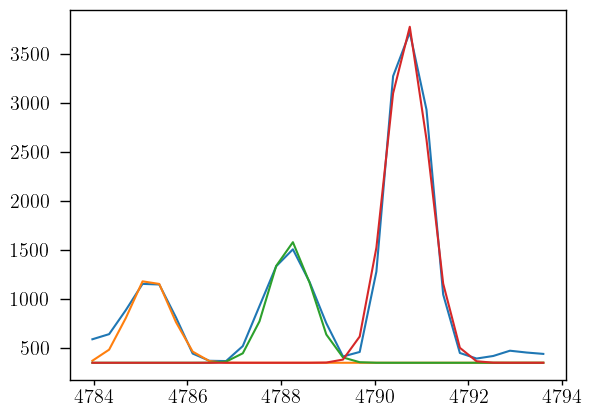

In [258]:
plt.plot(x_arc_4363, y_arc_4363)
plt.plot(x_arc_4363, 350 + gaussian(x_arc_4363, 1000, 4785.2, 0, 0.45))
plt.plot(x_arc_4363, 350 + gaussian(x_arc_4363, 1400, 4788.2, 0, 0.45))
plt.plot(x_arc_4363, 350 + gaussian(x_arc_4363, 3900, 4790.7, 0, 0.45))

params_arc_4363 = Parameters()
params_arc_4363.add('z', value=0.0, vary=False)
params_arc_4363.add('mu1', value=4785.2, vary=False)
params_arc_4363.add('mu2', value=4788.2, vary=False)
params_arc_4363.add('mu3', value=4790.7, vary=False)
params_arc_4363.add('arc1', value=1000, min=0.)
params_arc_4363.add('arc2', value=1400, min=0.)
params_arc_4363.add('arc3', value=3900, min=0.)
params_arc_4363.add('sigma', value=0.45, min=0.)
params_arc_4363.add('bkg', value=350, vary=False)

def residual_arc_4363(params_arc_4363, x, data, uncertainty):
    
    z = params_arc_4363['z']
    mu1 = params_arc_4363['mu1']
    mu2 = params_arc_4363['mu2']
    mu3 = params_arc_4363['mu3']
    flux1 = params_arc_4363['arc1']
    flux2 = params_arc_4363['arc2']
    flux3 = params_arc_4363['arc3']
    sigma = params_arc_4363['sigma']
    bkg = params_arc_4363['bkg']
    
    x = x_arc_4363
    model1 = gaussian(x, flux1, mu1, z, sigma)
    model2 = gaussian(x, flux2, mu2, z, sigma)
    model3 = gaussian(x, flux3, mu3, z, sigma)
    model = bkg + model1 + model2 + model3
    return (model - y_arc_4363) / 10

np.random.seed(21)
out_arc_4363 = minimize(residual_arc_4363, params_arc_4363, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10)

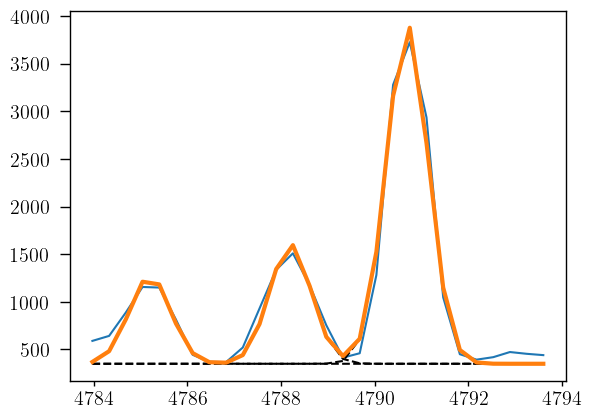

In [259]:
arc1_4363 = out_arc_4363.flatchain.arc1.mean()
arc2_4363 = out_arc_4363.flatchain.arc2.mean()
arc3_4363 = out_arc_4363.flatchain.arc3.mean()
sigma_arc_4363 = out_arc_4363.flatchain.sigma.mean()

plt.plot(x_arc_4363, y_arc_4363)

plt.plot(x_arc_4363, 350 + gaussian(x_arc_4363, arc1_4363, 4785.2, 0, sigma_arc_4363), ls='--', color='black')
plt.plot(x_arc_4363, 350 + gaussian(x_arc_4363, arc2_4363, 4788.2, 0, sigma_arc_4363), ls='--', color='black')
plt.plot(x_arc_4363, 350 + gaussian(x_arc_4363, arc3_4363, 4790.7, 0, sigma_arc_4363), ls='--', color='black')

plt.plot(x_arc_4363, 350 + gaussian(x_arc_4363, arc1_4363, 4785.2, 0, sigma_arc_4363) \
         + gaussian(x_arc_4363, arc2_4363, 4788.2, 0, sigma_arc_4363) \
         + gaussian(x_arc_4363, arc3_4363, 4790.7, 0, sigma_arc_4363), lw=3
)

### Line fitting

In [260]:
sigma_nar_4363 = upy.sqrt((sigma_nar_intrinsic**2) + (sigma_arc_4363**2))
sigma_brd_4363 = upy.sqrt((sigma_brd_intrinsic**2) + (sigma_arc_4363**2))

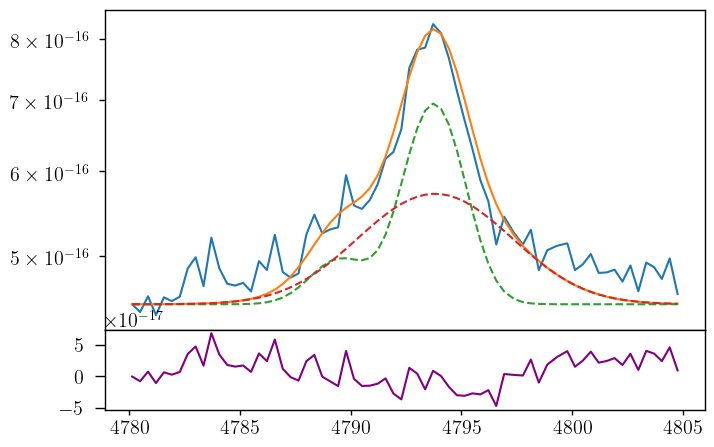

In [261]:
# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.plot(oiii_4363.wavelength, oiii_4363.flux)
bkg = 4.5e-16

feii_4360 = gaussian(oiii_4363.wavelength, 1.5e-16, wave_cat['[FeII]4360'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_4363))
oiiic_nar = gaussian(oiii_4363.wavelength, 8e-16, wave_cat['[OIII]4363'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_4363))
oiiic_brd = gaussian(oiii_4363.wavelength, 10e-16, wave_cat['[OIII]4363'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_4363))

ax.plot(oiii_4363.wavelength, bkg + oiiic_nar + oiiic_brd + feii_4360)
ax.plot(oiii_4363.wavelength, bkg + oiiic_nar + feii_4360, ls='--')
ax.plot(oiii_4363.wavelength, bkg + oiiic_brd, ls='--')
ax1.plot(oiii_4363.wavelength, oiii_4363.flux - bkg - oiiic_nar - oiiic_brd - feii_4360, color='purple')
ax.set_yscale('log')

In [262]:
params_oiiic = Parameters()

params_oiiic.add('z_nar', value=z_nar_oiii_4959, vary=True)
params_oiiic.add('z_ratio', value=z_ratio, vary=False)
params_oiiic.add('sigma_4363_nar', value=upy.nominal_values(sigma_nar_4363), vary=False)
params_oiiic.add('sigma_4363_brd', value=upy.nominal_values(sigma_brd_4363), vary=False)
params_oiiic.add('Feii_4360_nar', value=1.5e-16, min=0.)
params_oiiic.add('Oiiic_nar', value=8e-16, min=0.)
params_oiiic.add('Oiiic_brd', value=1e-15, min=0.)
params_oiiic.add('bkg', value=4.5e-16, min=0.)


def residual_oiiic(params_oiiic, x, data, uncertainty):
    
    z_nar = params_oiiic['z_nar']
    z_brd = params_oiiic['z_nar'] * params_oiiic['z_ratio']
    sigma_4363_nar = params_oiiic['sigma_4363_nar']
    sigma_4363_brd = params_oiiic['sigma_4363_brd']
    feii_4360_flux = params_oiiic['Feii_4360_nar']
    oiiic_nar_flux = params_oiiic['Oiiic_nar']
    oiiic_brd_flux = params_oiiic['Oiiic_brd']
    bkg = params_oiiic['bkg']
    
    x = oiii_4363.wavelength
    model = gaussian(x, feii_4360_flux, wave_cat['[FeII]4360'], z_nar, sigma_4363_nar) + \
            gaussian(x, oiiic_nar_flux, wave_cat['[OIII]4363'], z_nar, sigma_4363_nar) + \
            gaussian(x, oiiic_brd_flux, wave_cat['[OIII]4363'], z_brd, sigma_4363_brd)
    
    return (model + bkg - oiii_4363.flux) / oiii_4363.noise

In [263]:
np.random.seed(21)
out_oiiic = minimize(residual_oiiic, params_oiiic, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|██████████████████████████████████████| 2500/2500 [00:21<00:00, 118.25it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 3 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [44.49476805 48.31637789 51.92836067 63.65595549 71.47746964]


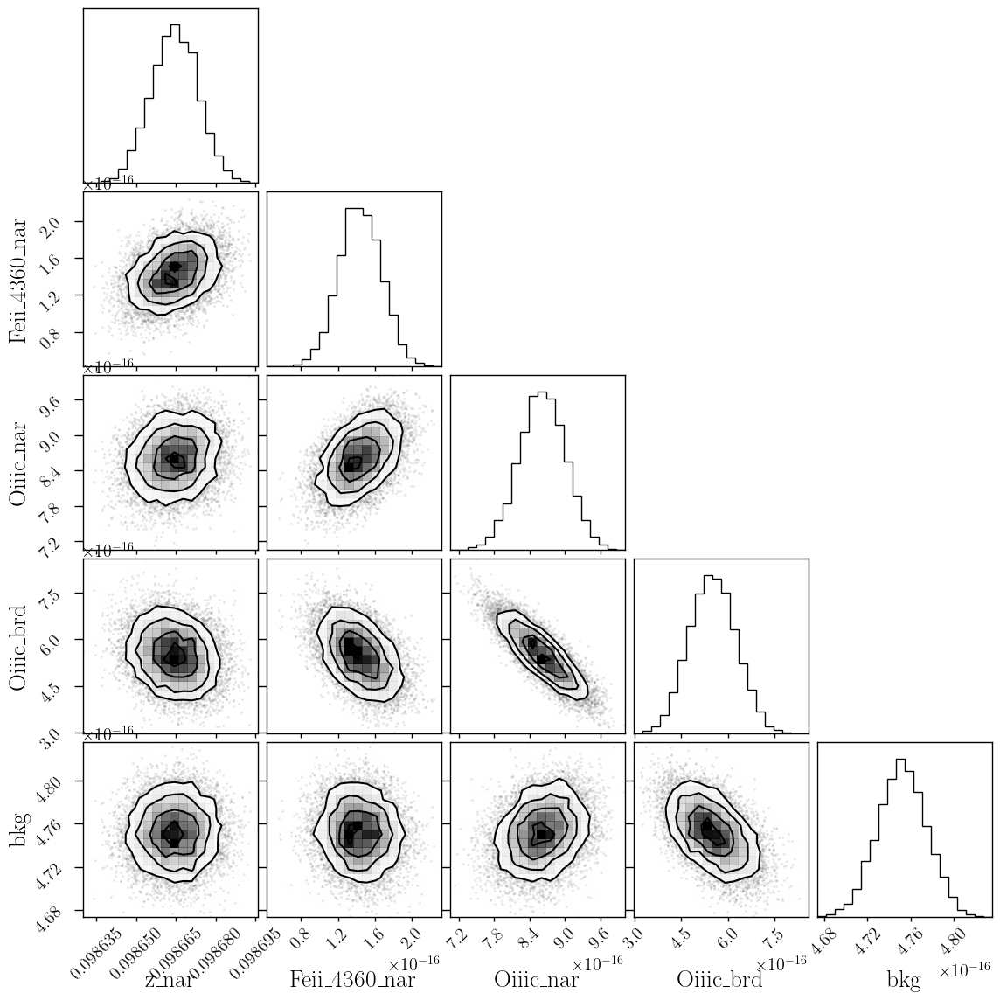

In [264]:
corner.corner(out_oiiic.flatchain, labels=out_oiiic.var_names);
#plt.savefig(fname='corner_ha.jpg', bbox_inches='tight')

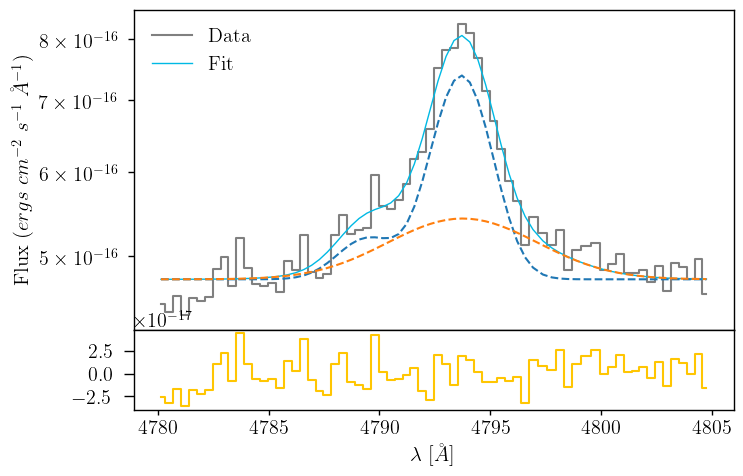

In [265]:
oiiic_nar_flux = out_oiiic.flatchain.Oiiic_nar.mean()
oiiic_nar_std = out_oiiic.flatchain.Oiiic_nar.std()

oiiic_brd_flux = out_oiiic.flatchain.Oiiic_brd.mean()
oiiic_brd_std = out_oiiic.flatchain.Oiiic_brd.std()

feii_4360_flux = out_oiiic.flatchain.Feii_4360_nar.mean()
feii_4360_std = out_oiiic.flatchain.Feii_4360_nar.std()

z_oiii = out_oiiic.flatchain.z_nar.mean()
z_oiii_std = out_oiiic.flatchain.z_nar.std()

bkg_oiiic = out_oiiic.flatchain.bkg.mean()
bkg_oiiic_std = out_oiiic.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(oiii_4363.wavelength, oiii_4363.flux,
            color='gray', label='Data', where='mid')

feii_4360 = gaussian(oiii_4363.wavelength, feii_4360_flux, wave_cat['[FeII]4360'], z_oiii, upy.nominal_values(sigma_nar_4363))
oiiic_nar = gaussian(oiii_4363.wavelength, oiiic_nar_flux, wave_cat['[OIII]4363'], z_oiii, upy.nominal_values(sigma_nar_4363))
oiiic_brd = gaussian(oiii_4363.wavelength, oiiic_brd_flux, wave_cat['[OIII]4363'], z_oiii * z_ratio, upy.nominal_values(sigma_brd_4363))
oiiic = oiiic_nar + oiiic_brd

ax.plot(oiii_4363.wavelength, bkg_oiiic + oiiic + feii_4360, lw=1, color=c[0], label='Fit')
ax.plot(oiii_4363.wavelength, bkg_oiiic + oiiic_nar + feii_4360, ls='--')
ax.plot(oiii_4363.wavelength, bkg_oiiic + oiiic_brd, ls='--')
ax1.step(oiii_4363.wavelength, oiii_4363.flux - bkg_oiiic - oiiic - feii_4360, color=c[3], where='mid')
ax.set_ylabel(r'Flux ($ergs\ cm^{-2}\  s^{-1}\ \AA^{-1}$)', fontsize=15)
ax1.set_xlabel(r'$\lambda$ [$\AA$]', fontsize=15)
ax.set_yscale('log')
ax.legend(loc='upper left')

Text(0.5, 1.0, '[FeII]$\\lambda$4360 + [OIII]$\\lambda$4363')

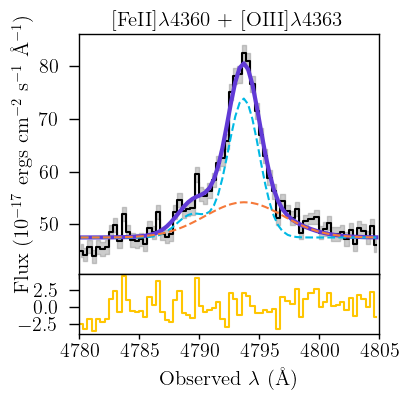

In [266]:
fig = plt.figure(1)
fig.set_size_inches(3, 3)
ax = fig.add_axes((0, .2, 1, .8), sharex=ax1)
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(oiii_4363.wavelength, oiii_4363.flux / 1e-17,
            color='black', where='mid')
ax.fill_between(oiii_4363.wavelength, (oiii_4363.flux - oiii_4363.noise) / 1e-17,
                                      (oiii_4363.flux + oiii_4363.noise) / 1e-17,
                                       color='gray', alpha=0.4, step='mid')

feii_4360 = gaussian(oiii_4363.wavelength, feii_4360_flux, wave_cat['[FeII]4360'], z_oiii, upy.nominal_values(sigma_nar_4363))
oiiic_nar = gaussian(oiii_4363.wavelength, oiiic_nar_flux, wave_cat['[OIII]4363'], z_oiii, upy.nominal_values(sigma_nar_4363))
oiiic_brd = gaussian(oiii_4363.wavelength, oiiic_brd_flux, wave_cat['[OIII]4363'], z_oiii * z_ratio, upy.nominal_values(sigma_brd_4363))
oiiic = oiiic_nar + oiiic_brd

ax.plot(oiii_4363.wavelength, (bkg_oiiic + oiiic + feii_4360) / 1e-17, lw=3, color=c[2], label='Fit')
ax.plot(oiii_4363.wavelength, (bkg_oiiic + oiiic_nar + feii_4360) / 1e-17, ls='--', color=c[0])
ax.plot(oiii_4363.wavelength, (bkg_oiiic + oiiic_brd) / 1e-17, ls='--', color=cz[0])
ax1.step(oiii_4363.wavelength, (oiii_4363.flux - bkg_oiiic - oiiic - feii_4360) / 1e-17,
         color=c[3], where='mid')
ax.set_ylabel(r'Flux ($10^{-17}$ ergs  cm$^{-2}$ s$^{-1}$ \AA$^{-1}$)', fontsize=15)
ax1.set_xlabel(r'Observed $\lambda$ (\AA)', fontsize=15)
ax.set_xlim(4780, 4805)
ax1.set_xlim(4780, 4805)
ax.set_xticklabels([])
ax.set_title(r'[FeII]$\lambda$4360 + [OIII]$\lambda$4363', fontsize=15)
#fig.savefig('/home/benjamin/Documents/analogs/OIII4363_J0021.pdf', bbox_inches='tight')

In [267]:
# EW
EW_OIII_4363_nar = ufloat(oiiic_nar_flux, oiiic_nar_std) / ufloat(bkg_oiiic, bkg_oiiic_std)
EW_OIII_4363_brd = ufloat(oiiic_brd_flux, oiiic_brd_std) / ufloat(bkg_oiiic, bkg_oiiic_std)
EW_OIII_4363 = (ufloat(oiiic_nar_flux, oiiic_nar_std) + ufloat(oiiic_brd_flux, oiiic_brd_std)) / ufloat(bkg_oiiic, bkg_oiiic_std)

# [NeIII]3686

### Arc lines

In [268]:
wave_cat['[NeIII]3868']*(1 + z_BN[igal])

4250.6066120000005

In [269]:
# Select a region of the arc spectra to have a few arc lines around the wavelength of the fitted lines
wlims_3868 = [wave_cat['[NeIII]3868']*(1 + z_BN[igal]) - 5, wave_cat['[NeIII]3868']*(1 + z_BN[igal]) + 5]
mask_arc_3868 = (wcal_blue[8].data['wave_soln'][0] >= wlims_3868[0]) & (wcal_blue[8].data['wave_soln'][0] < wlims_3868[1])

# Arc spectra around the fitted line
x_arc_3868 = wcal_blue[8].data['wave_soln'][0][mask_arc_3868]
y_arc_3868 = wcal_blue[27].data[:, 3][mask_arc_3868]

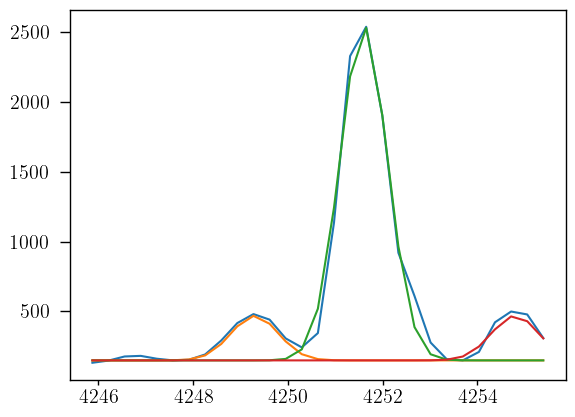

In [270]:
plt.plot(x_arc_3868, y_arc_3868)
plt.plot(x_arc_3868, 150 + gaussian(x_arc_3868,  400, 4249.3, 0, 0.5))
plt.plot(x_arc_3868, 150 + gaussian(x_arc_3868, 3000, 4251.6, 0, 0.5))
plt.plot(x_arc_3868, 150 + gaussian(x_arc_3868,  400, 4254.8, 0, 0.5))

In [271]:
params_arc_3868 = Parameters()
params_arc_3868.add('z', value=0.0, vary=False)
params_arc_3868.add('mu1', value=4249.3, vary=False)
params_arc_3868.add('mu2', value=4251.6, vary=False)
params_arc_3868.add('mu3', value=4254.8, vary=False)
params_arc_3868.add('arc1', value= 400, min=0.)
params_arc_3868.add('arc2', value=3000, min=0.)
params_arc_3868.add('arc3', value= 400, min=0.)
params_arc_3868.add('sigma', value=0.45, min=0.)
params_arc_3868.add('bkg', value=150, vary=False)

def residual_arc_3868(params_arc_3868, x, data, uncertainty):
    
    z = params_arc_3868['z']
    mu1 = params_arc_3868['mu1']
    mu2 = params_arc_3868['mu2']
    mu3 = params_arc_3868['mu3']
    flux1 = params_arc_3868['arc1']
    flux2 = params_arc_3868['arc2']
    flux3 = params_arc_3868['arc3']
    sigma = params_arc_3868['sigma']
    bkg = params_arc_3868['bkg']
    
    x = x_arc_3868
    model1 = gaussian(x, flux1, mu1, z, sigma)
    model2 = gaussian(x, flux2, mu2, z, sigma)
    model3 = gaussian(x, flux3, mu3, z, sigma)
    model = bkg + model1 + model2 + model3
    return (model - y_arc_3868) / 10

np.random.seed(21)
out_arc_3868 = minimize(residual_arc_3868, params_arc_3868, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10)

100%|██████████████████████████████████████| 2500/2500 [00:20<00:00, 120.92it/s]


In [272]:
out_arc_3868.params

name,value,standard error,relative error,initial value,min,max,vary
z,0.00000000,,,0.0,-inf,inf,False
mu1,4249.30000,,,4249.3,-inf,inf,False
mu2,4251.60000,,,4251.6,-inf,inf,False
mu3,4254.80000,,,4254.8,-inf,inf,False
arc1,423.566141,7.60328609,(1.80%),400,0.00000000,inf,True
arc2,2977.40578,9.30936338,(0.31%),3000,0.00000000,inf,True
arc3,440.999839,7.80411815,(1.77%),400,0.00000000,inf,True
sigma,0.48306492,0.00171880,(0.36%),0.45,0.00000000,inf,True
bkg,150.000000,,,150,-inf,inf,False


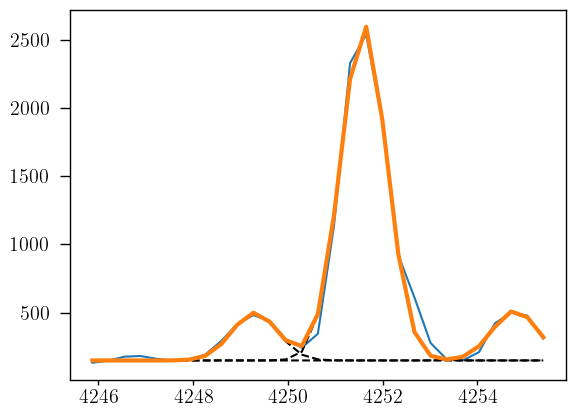

In [273]:
arc1_3868 = out_arc_3868.flatchain.arc1.mean()
arc2_3868 = out_arc_3868.flatchain.arc2.mean()
arc3_3868 = out_arc_3868.flatchain.arc3.mean()
sigma_arc_3868 = out_arc_3868.flatchain.sigma.mean()

plt.plot(x_arc_3868, y_arc_3868)

plt.plot(x_arc_3868, 150 + gaussian(x_arc_3868, arc1_3868, 4249.3, 0, sigma_arc_3868), ls='--', color='black')
plt.plot(x_arc_3868, 150 + gaussian(x_arc_3868, arc2_3868, 4251.6, 0, sigma_arc_3868), ls='--', color='black')
plt.plot(x_arc_3868, 150 + gaussian(x_arc_3868, arc3_3868, 4254.8, 0, sigma_arc_3868), ls='--', color='black')

plt.plot(x_arc_3868, 150 + gaussian(x_arc_3868, arc1_3868, 4249.3, 0, sigma_arc_3868) \
                         + gaussian(x_arc_3868, arc2_3868, 4251.6, 0, sigma_arc_3868) \
                         + gaussian(x_arc_3868, arc3_3868, 4254.8, 0, sigma_arc_3868), lw=3
)

### Line fitting

In [274]:
sigma_nar_3868 = upy.sqrt((sigma_nar_intrinsic**2) + (sigma_arc_3868**2))
sigma_brd_3868 = upy.sqrt((sigma_brd_intrinsic**2) + (sigma_arc_3868**2))

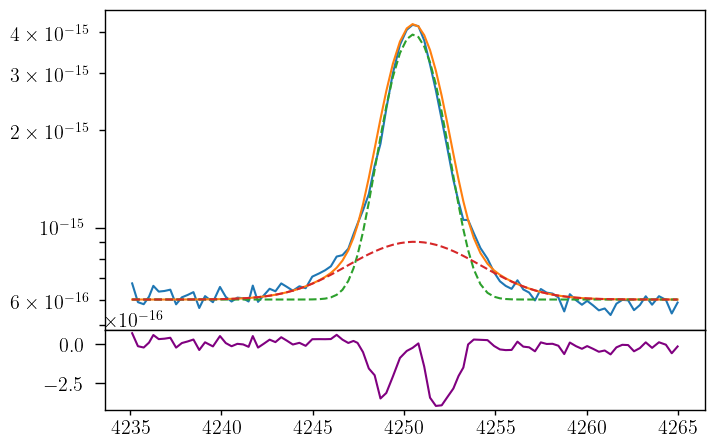

In [275]:
# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.plot(neiii_3868.wavelength, neiii_3868.flux)
bkg = 6e-16

neiiia_nar = gaussian(neiii_3868.wavelength, 1.1e-14, wave_cat['[NeIII]3868'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_3868))
neiiia_brd = gaussian(neiii_3868.wavelength, 2.5e-15, wave_cat['[NeIII]3868'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_3868))

ax.plot(neiii_3868.wavelength, bkg + neiiia_nar + neiiia_brd)
ax.plot(neiii_3868.wavelength, bkg + neiiia_nar, ls='--')
ax.plot(neiii_3868.wavelength, bkg + neiiia_brd, ls='--')
ax1.plot(neiii_3868.wavelength, neiii_3868.flux - bkg - neiiia_nar - neiiia_brd, color='purple')
ax.set_yscale('log')

In [276]:
params_neiii_3868 = Parameters()
params_neiii_3868.add('z_nar', value=z_nar_oiii_4959, vary=True)
params_neiii_3868.add('z_ratio', value=z_ratio, vary=False)
params_neiii_3868.add('sigma_nar', value=upy.nominal_values(sigma_nar_3868), vary=False)
params_neiii_3868.add('sigma_brd', value=upy.nominal_values(sigma_brd_3868), vary=False)
params_neiii_3868.add('Neiiia_nar', value=4e-14, min=0.)
params_neiii_3868.add('Neiiia_brd', value=2e-14, min=0.)
params_neiii_3868.add('bkg', value=3.5e-16, min=0.)


def residual_neiii_3868(params_neiii_3868, x, data, uncertainty):
    
    z_nar = params_neiii_3868['z_nar']
    z_brd = params_neiii_3868['z_nar'] * params_neiii_3868['z_ratio']
    sigma_nar = params_neiii_3868['sigma_nar']
    sigma_brd = params_neiii_3868['sigma_brd']
    neiiia_nar_flux = params_neiii_3868['Neiiia_nar']
    neiiia_brd_flux = params_neiii_3868['Neiiia_brd']
    bkg = params_neiii_3868['bkg']
    
    x = neiii_3868.wavelength
    model = gaussian(x, neiiia_nar_flux, wave_cat['[NeIII]3868'], z_nar, sigma_nar) + \
            gaussian(x, neiiia_brd_flux, wave_cat['[NeIII]3868'], z_brd, sigma_brd)
    
    return (model + bkg - neiii_3868.flux) / neiii_3868.noise

In [277]:
np.random.seed(21)
out_neiii_3868 = minimize(residual_neiii_3868, params_neiii_3868, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|██████████████████████████████████████| 2500/2500 [00:18<00:00, 135.53it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 3 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [ 25.61624892  68.64628443  90.69925105 120.29915377]


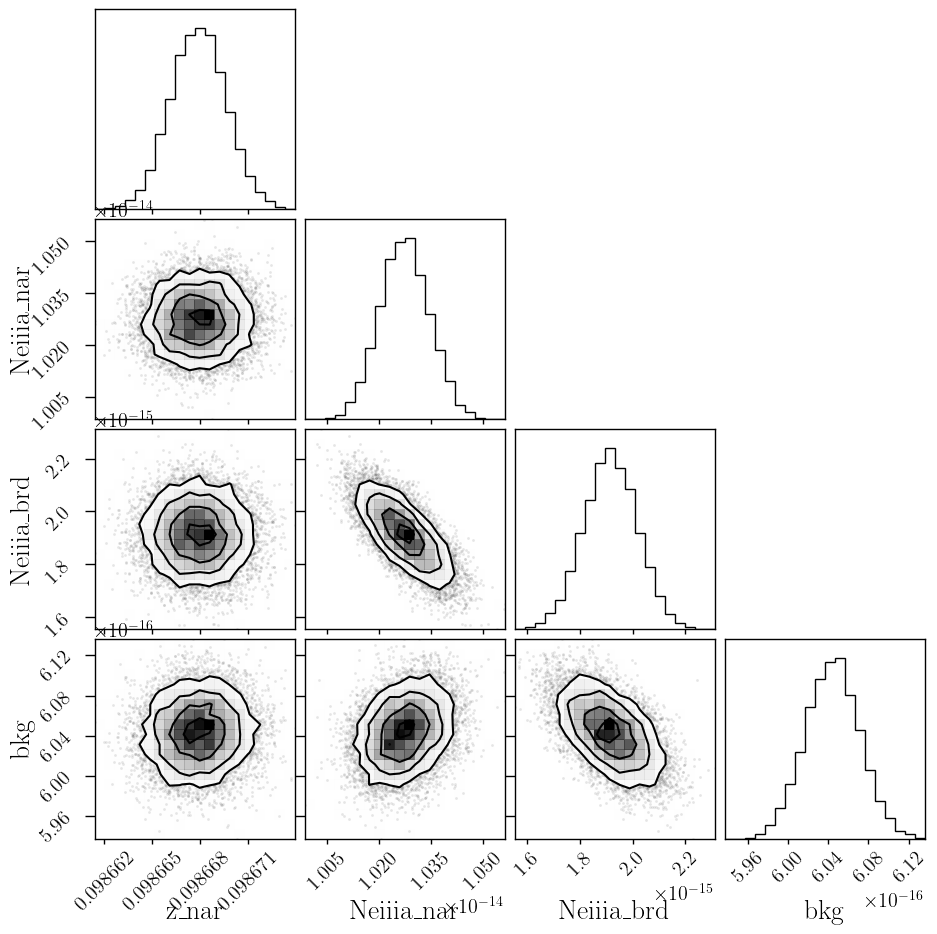

In [278]:
corner.corner(out_neiii_3868.flatchain, labels=out_neiii_3868.var_names);
#plt.savefig(fname='corner_ha.jpg', bbox_inches='tight')

In [279]:
out_neiii_3868.params

name,value,standard error,relative error,initial value,min,max,vary
z_nar,0.09866788,1.7302e-06,(0.00%),0.09867719705615696,-inf,inf,True
z_ratio,1.00012632,,,1.0001263225003523,-inf,inf,False
sigma_nar,1.31705574,,,1.3170557410297965,-inf,inf,False
sigma_brd,3.28476947,,,3.284769469931857,-inf,inf,False
Neiiia_nar,1.0272e-14,7.2332e-17,(0.70%),4e-14,0.00000000,inf,True
Neiiia_brd,1.9142e-15,1.0223e-16,(5.34%),2e-14,0.00000000,inf,True
bkg,6.0440e-16,2.7028e-18,(0.45%),3.5e-16,0.00000000,inf,True


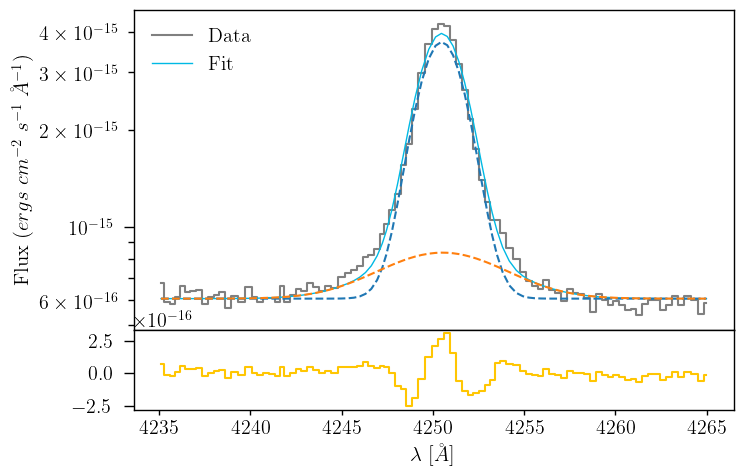

In [280]:
neiiia_nar_flux = out_neiii_3868.flatchain.Neiiia_nar.mean()
neiiia_nar_std = out_neiii_3868.flatchain.Neiiia_nar.std()

neiiia_brd_flux = out_neiii_3868.flatchain.Neiiia_brd.mean()
neiiia_brd_std = out_neiii_3868.flatchain.Neiiia_brd.std()

z_neiii = out_neiii_3868.flatchain.z_nar.mean()
z_neiii_std = out_neiii_3868.flatchain.z_nar.std()

bkg_neiiia = out_neiii_3868.flatchain.bkg.mean()
bkg_neiiia_std = out_neiii_3868.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(neiii_3868.wavelength, neiii_3868.flux,
            color='gray', label='Data', where='mid')

neiiia_nar = gaussian(neiii_3868.wavelength, neiiia_nar_flux, wave_cat['[NeIII]3868'], z_neiii, upy.nominal_values(sigma_nar_3868))
neiiia_brd = gaussian(neiii_3868.wavelength, neiiia_brd_flux, wave_cat['[NeIII]3868'], z_neiii * z_ratio, upy.nominal_values(sigma_brd_3868))
neiiia = neiiia_nar + neiiia_brd

ax.plot(neiii_3868.wavelength, bkg_neiiia + neiiia, lw=1, color=c[0], label='Fit')
ax.plot(neiii_3868.wavelength, bkg_neiiia + neiiia_nar, ls='--')
ax.plot(neiii_3868.wavelength, bkg_neiiia + neiiia_brd, ls='--')
ax1.step(neiii_3868.wavelength, neiii_3868.flux - bkg_neiiia - neiiia, color=c[3], where='mid')
ax.set_ylabel(r'Flux ($ergs\ cm^{-2}\  s^{-1}\ \AA^{-1}$)', fontsize=15)
ax1.set_xlabel(r'$\lambda$ [$\AA$]', fontsize=15)
ax.set_yscale('log')
ax.legend(loc='upper left')

In [281]:
# EW
EW_NeIII_3868_nar = ufloat(neiiia_nar_flux, neiiia_nar_std) / ufloat(bkg_neiiia, bkg_neiiia_std)
EW_NeIII_3868_brd = ufloat(neiiia_brd_flux, neiiia_brd_std) / ufloat(bkg_neiiia, bkg_neiiia_std)
EW_NeIII_3868 = (ufloat(neiiia_nar_flux, neiiia_nar_std) + ufloat(neiiia_brd_flux, neiiia_brd_std)) / ufloat(bkg_neiiia, bkg_neiiia_std)

# Em line plot

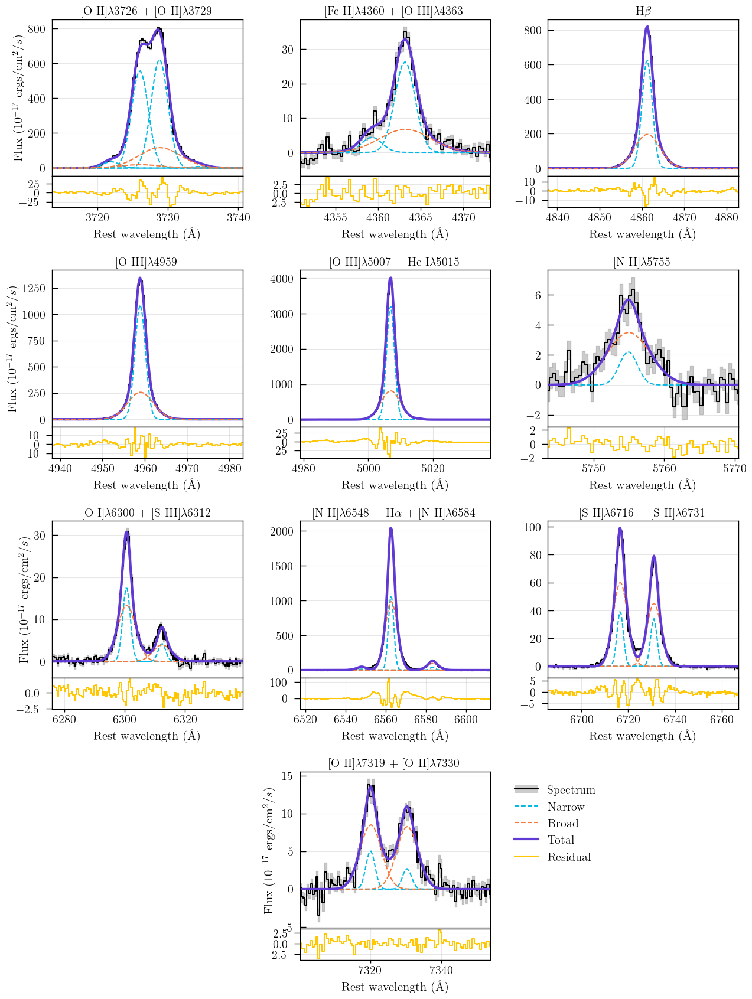

In [283]:
layout = [['1', '2', '3'],
          ['4', '5', '6'],
          ['7', '8', '9'],
          ['.', '10', '.'],
]

fig, axs = plt.subplot_mosaic(layout)
fig.set_size_inches((15, 20))
fig.subplots_adjust(hspace=0.6, wspace=0.3)


for ax in axs:
    axs[ax].tick_params(direction='in', axis='both')

# ==================================================================================================================
# [OII]3727
# ==================================================================================================================

# Plot data, errors, and model
axs['1'].step(oii_3727.wavelength / (1 + z_nar_oiii_4959), (oii_3727.flux - bkg_oii_3727) / 1e-17,
              color='black', where='mid')
axs['1'].fill_between(oii_3727.wavelength / (1 + z_nar_oiii_4959), (oii_3727.flux - bkg_oii_3727 + oii_3727.noise) / 1e-17,
                                                                   (oii_3727.flux - bkg_oii_3727 - oii_3727.noise) / 1e-17,
                     step='mid', color='gray', alpha=0.4)
axs['1'].plot(oii_3727.wavelength / (1 + z_nar_oiii_4959), (h14 + oiid + oiic + h13)/1e-17,
              color=c[2], lw=3)
axs['1'].plot(oii_3727.wavelength / (1 + z_nar_oiii_4959), h14/1e-17, color=c[0], ls='--')
axs['1'].plot(oii_3727.wavelength / (1 + z_nar_oiii_4959), oiid_nar/1e-17, color=c[0], ls='--')
axs['1'].plot(oii_3727.wavelength / (1 + z_nar_oiii_4959), oiic_nar/1e-17, color=c[0], ls='--')
axs['1'].plot(oii_3727.wavelength / (1 + z_nar_oiii_4959), h13/1e-17, color=c[0], ls='--')
axs['1'].plot(oii_3727.wavelength / (1 + z_nar_oiii_4959), oiic_brd/1e-17, color=cz[0], ls='--')
axs['1'].plot(oii_3727.wavelength / (1 + z_nar_oiii_4959), oiid_brd/1e-17, color=cz[0], ls='--')

# Rotulate upper pannel
axs['1'].set_ylabel('Flux ($10^{-17}$ ergs/cm$^{2}/s$)', fontsize=15)
axs['1'].set_title('[O II]$\lambda$3726 + [O II]$\lambda$3729')
axs['1'].set_xlim(np.min(oii_3727.wavelength / (1 + z_nar_oiii_4959)),
                  np.max(oii_3727.wavelength / (1 + z_nar_oiii_4959)))

# Residuals pannel
child1 = axs['1'].inset_axes([0, -0.2, 1, 0.2])
child1.sharex(axs['1'])
child1.step(oii_3727.wavelength / (1 + z_nar_oiii_4959), (oii_3727.flux - h14 - oiid - oiic - h13 - bkg_oii_3727) / 1e-17,
           where='mid', color=c[3])
child1.set_xlabel('Rest wavelength (\AA)', fontsize=15)

# Extra
axs['1'].grid(visible=True, alpha=0.3)
axs['1'].get_xaxis().set_visible(False)
child1.grid(visible=True, alpha=0.3)



# ==================================================================================================================
# [OIII]4363
# ==================================================================================================================

# Plot data, errors, and model
axs['2'].step(oiii_4363.wavelength / (1 + z_nar_oiii_4959), (oiii_4363.flux - bkg_oiiic) / 1e-17,
              color='black', where='mid')
axs['2'].fill_between(oiii_4363.wavelength / (1 + z_nar_oiii_4959), (oiii_4363.flux - bkg_oiiic + oiii_4363.noise) / 1e-17,
                                                                    (oiii_4363.flux - bkg_oiiic - oiii_4363.noise) / 1e-17,
                     step='mid', color='gray', alpha=0.4)
axs['2'].plot(oiii_4363.wavelength / (1 + z_nar_oiii_4959), (oiiic + feii_4360)/1e-17,
              color=c[2], lw=3)
axs['2'].plot(oiii_4363.wavelength / (1 + z_nar_oiii_4959), feii_4360/1e-17, color=c[0], ls='--')
axs['2'].plot(oiii_4363.wavelength / (1 + z_nar_oiii_4959), oiiic_nar/1e-17, color=c[0], ls='--')
axs['2'].plot(oiii_4363.wavelength / (1 + z_nar_oiii_4959), oiiic_brd/1e-17, color=cz[0], ls='--')

# Rotulate upper pannel
#axs['2'].set_ylabel('Flux ($10^{-17}$ ergs/cm$^{2}/s$)', fontsize=15)
axs['2'].set_title('[Fe II]$\lambda$4360 + [O III]$\lambda$4363')
axs['2'].set_xlim(np.min(oiii_4363.wavelength / (1 + z_nar_oiii_4959)),
                  np.max(oiii_4363.wavelength / (1 + z_nar_oiii_4959)))

# Residuals pannel
child2 = axs['2'].inset_axes([0, -0.2, 1, 0.2])
child2.sharex(axs['2'])
child2.step(oiii_4363.wavelength / (1 + z_nar_oiii_4959), (oiii_4363.flux - oiiic - feii_4360 - bkg_oiiic) / 1e-17,
           where='mid', color=c[3])
child2.set_xlabel('Rest wavelength (\AA)', fontsize=15)

# Extra
axs['2'].grid(visible=True, alpha=0.3)
axs['2'].get_xaxis().set_visible(False)
child2.grid(visible=True, alpha=0.3)


# ==================================================================================================================
# Hb
# ==================================================================================================================

# Plot data, errors, and model
axs['3'].step(hbeta.wavelength / (1 + z_nar_oiii_4959), (hbeta.flux - bkg_hb) / 1e-17,
              color='black', where='mid')
axs['3'].fill_between(hbeta.wavelength / (1 + z_nar_oiii_4959), (hbeta.flux - bkg_hb + hbeta.noise) / 1e-17,
                                                             (hbeta.flux - bkg_hb - hbeta.noise) / 1e-17,
                     step='mid', color='gray', alpha=0.4)
axs['3'].plot(hbeta.wavelength / (1 + z_nar_oiii_4959), hb/1e-17,
              color=c[2], lw=3)
axs['3'].plot(hbeta.wavelength / (1 + z_nar_oiii_4959), hb_nar/1e-17, color=c[0], ls='--')
axs['3'].plot(hbeta.wavelength / (1 + z_nar_oiii_4959), hb_brd/1e-17, color=cz[0], ls='--')

# Rotulate upper pannel
#axs['2'].set_ylabel('Flux ($10^{-17}$ ergs/cm$^{2}/s$)', fontsize=15)
axs['3'].set_title(r'H$\beta$')
axs['3'].set_xlim(np.min(hbeta.wavelength / (1 + z_nar_oiii_4959)),
                  np.max(hbeta.wavelength / (1 + z_nar_oiii_4959)))

# Residuals pannel
child3 = axs['3'].inset_axes([0, -0.2, 1, 0.2])
child3.sharex(axs['3'])
child3.step(hbeta.wavelength / (1 + z_nar_oiii_4959), (hbeta.flux - hb - bkg_hb) / 1e-17,
           where='mid', color=c[3])
child3.set_xlabel('Rest wavelength (\AA)', fontsize=15)

# Extra
axs['3'].grid(visible=True, alpha=0.3)
axs['3'].get_xaxis().set_visible(False)
child3.grid(visible=True, alpha=0.3)

# ==================================================================================================================
# [OIII]4959
# ==================================================================================================================

# Plot data, errors, and model
axs['4'].step(oiii_4959.wavelength / (1 + z_nar_oiii_4959), (oiii_4959.flux - bkg_oiii_4959) / 1e-17,
              color='black', where='mid')
axs['4'].fill_between(oiii_4959.wavelength / (1 + z_nar_oiii_4959), (oiii_4959.flux - bkg_oiii_4959 + oiii_4959.noise) / 1e-17,
                                                                    (oiii_4959.flux - bkg_oiii_4959 - oiii_4959.noise) / 1e-17,
                     step='mid', color='gray', alpha=0.4)
axs['4'].plot(oiii_4959.wavelength / (1 + z_nar_oiii_4959), oiiib/1e-17,
              color=c[2], lw=3)
axs['4'].plot(oiii_4959.wavelength / (1 + z_nar_oiii_4959), oiiib_nar/1e-17, color=c[0], ls='--')
axs['4'].plot(oiii_4959.wavelength / (1 + z_nar_oiii_4959), oiiib_brd/1e-17, color=cz[0], ls='--')

# Rotulate upper pannel
axs['4'].set_ylabel('Flux ($10^{-17}$ ergs/cm$^{2}/s$)', fontsize=15)
axs['4'].set_title('[O III]$\lambda$4959')
axs['4'].set_xlim(np.min(oiii_4959.wavelength / (1 + z_nar_oiii_4959)),
                  np.max(oiii_4959.wavelength / (1 + z_nar_oiii_4959)))

# Residuals pannel
child4 = axs['4'].inset_axes([0, -0.2, 1, 0.2])
child4.sharex(axs['4'])
child4.step(oiii_4959.wavelength / (1 + z_nar_oiii_4959), (oiii_4959.flux - oiiib - bkg_oiii_4959) / 1e-17,
            where='mid', color=c[3])
child4.set_xlabel('Rest wavelength (\AA)', fontsize=15)

# Extra
axs['4'].grid(visible=True, alpha=0.3)
axs['4'].get_xaxis().set_visible(False)
child4.grid(visible=True, alpha=0.3)


# ==================================================================================================================
# [OIII]5007 + HeI5015
# ==================================================================================================================

# Plot data, errors, and model
axs['5'].step(oiii_hei.wavelength / (1 + z_nar_oiii_4959), (oiii_hei.flux - bkg_oiii_hei) / 1e-17,
              color='black', where='mid')
axs['5'].fill_between(oiii_hei.wavelength / (1 + z_nar_oiii_4959), (oiii_hei.flux - bkg_oiii_hei + oiii_hei.noise) / 1e-17,
                                                                   (oiii_hei.flux - bkg_oiii_hei - oiii_hei.noise) / 1e-17,
                     step='mid', color='gray', alpha=0.4)
axs['5'].plot(oiii_hei.wavelength / (1 + z_nar_oiii_4959), oiiia_nar/1e-17, color=c[0], ls='--')
axs['5'].plot(oiii_hei.wavelength / (1 + z_nar_oiii_4959), hei_5015/1e-17, color=c[0], ls='--')
axs['5'].plot(oiii_hei.wavelength / (1 + z_nar_oiii_4959), oiiia_brd/1e-17, color=cz[0], ls='--')
axs['5'].plot(oiii_hei.wavelength / (1 + z_nar_oiii_4959), (oiiia + hei_5015)/1e-17,
               color=c[2], lw=3)

# Rotulate upper pannel
#axs['7'].set_ylabel('Flux ($10^{-17}$ ergs/cm$^{2}/s$)', fontsize=15)
axs['5'].set_title('[O III]$\lambda$5007 + He I$\lambda$5015')
axs['5'].set_xlim(np.min(oiii_hei.wavelength / (1 + z_nar_oiii_4959)),
                  np.max(oiii_hei.wavelength / (1 + z_nar_oiii_4959)))

# Residuals pannel
child5 = axs['5'].inset_axes([0, -0.2, 1, 0.2])
child5.sharex(axs['5'])
child5.step(oiii_hei.wavelength / (1 + z_nar_oiii_4959), (oiii_hei.flux - oiiia - hei_5015 - bkg_oiii_hei) / 1e-17,
            where='mid', color=c[3])
child5.set_xlabel('Rest wavelength (\AA)', fontsize=15)

# Extra
axs['5'].grid(visible=True, alpha=0.3)
axs['5'].get_xaxis().set_visible(False)
child5.grid(visible=True, alpha=0.3)



# ==================================================================================================================
# [NII]5755
# ==================================================================================================================

# Plot data, errors, and model
axs['6'].step(nii_5755.wavelength / (1 + z_nar_oiii_4959), (nii_5755.flux - bkg_nii) / 1e-17,
              color='black', where='mid')
axs['6'].fill_between(nii_5755.wavelength / (1 + z_nar_oiii_4959), (nii_5755.flux - bkg_nii + nii_5755.noise) / 1e-17,
                                                                   (nii_5755.flux - bkg_nii - nii_5755.noise) / 1e-17,
                     step='mid', color='gray', alpha=0.4)
axs['6'].plot(nii_5755.wavelength / (1 + z_nar_oiii_4959), niic_nar/1e-17, color=c[0], ls='--')
axs['6'].plot(nii_5755.wavelength / (1 + z_nar_oiii_4959), niic_brd/1e-17, color=cz[0], ls='--')
axs['6'].plot(nii_5755.wavelength / (1 + z_nar_oiii_4959), niic/1e-17,
              color=c[2], lw=3)

# Rotulate upper pannel
#axs['7'].set_ylabel('Flux ($10^{-17}$ ergs/cm$^{2}/s$)', fontsize=15)
axs['6'].set_title('[N II]$\lambda$5755')
axs['6'].set_xlim(np.min(nii_5755.wavelength / (1 + z_nar_oiii_4959)),
                  np.max(nii_5755.wavelength / (1 + z_nar_oiii_4959)))

# Residuals pannel
child6 = axs['6'].inset_axes([0, -0.2, 1, 0.2])
child6.sharex(axs['6'])
child6.step(nii_5755.wavelength / (1 + z_nar_oiii_4959), (nii_5755.flux - niic - bkg_nii) / 1e-17,
           where='mid', color=c[3])
child6.set_xlabel('Rest wavelength (\AA)', fontsize=15)

# Extra
axs['6'].grid(visible=True, alpha=0.3)
axs['6'].get_xaxis().set_visible(False)
child6.grid(visible=True, alpha=0.3)




# ==================================================================================================================
# [OI]6300 + [SIII]6312
# ==================================================================================================================

# Plot data, errors, and model
axs['7'].step(oi_siii.wavelength / (1 + z_nar_oiii_4959), (oi_siii.flux - bkg_oi_siii) / 1e-17,
              color='black', where='mid')
axs['7'].fill_between(oi_siii.wavelength / (1 + z_nar_oiii_4959), (oi_siii.flux - bkg_oi_siii + oi_siii.noise) / 1e-17,
                                                                  (oi_siii.flux - bkg_oi_siii - oi_siii.noise) / 1e-17,
                     step='mid', color='gray', alpha=0.4)
axs['7'].plot(oi_siii.wavelength / (1 + z_nar_oiii_4959), oi_nar/1e-17, color=c[0], ls='--')
axs['7'].plot(oi_siii.wavelength / (1 + z_nar_oiii_4959), siiic_nar/1e-17, color=c[0], ls='--')
axs['7'].plot(oi_siii.wavelength / (1 + z_nar_oiii_4959), oi_brd/1e-17, color=cz[0], ls='--')
axs['7'].plot(oi_siii.wavelength / (1 + z_nar_oiii_4959), siiic_brd/1e-17, color=cz[0], ls='--')
axs['7'].plot(oi_siii.wavelength / (1 + z_nar_oiii_4959), (oi + siiic)/1e-17,
              color=c[2], lw=3)

# Rotulate upper pannel
axs['7'].set_ylabel('Flux ($10^{-17}$ ergs/cm$^{2}/s$)', fontsize=15)
axs['7'].set_title('[O I]$\lambda$6300 + [S III]$\lambda$6312')
axs['7'].set_xlim(np.min(oi_siii.wavelength / (1 + z_nar_oiii_4959)),
                  np.max(oi_siii.wavelength / (1 + z_nar_oiii_4959)))

# Residuals pannel
child7 = axs['7'].inset_axes([0, -0.2, 1, 0.2])
child7.sharex(axs['7'])
child7.step(oi_siii.wavelength / (1 + z_nar_oiii_4959), (oi_siii.flux - oi - siiic - bkg_oi_siii) / 1e-17,
           where='mid', color=c[3])
child7.set_xlabel('Rest wavelength (\AA)', fontsize=15)

# Extra
axs['7'].grid(visible=True, alpha=0.3)
axs['7'].get_xaxis().set_visible(False)
child7.grid(visible=True, alpha=0.3)


# ==================================================================================================================
# Ha
# ==================================================================================================================

# Plot data, errors, and model
p1 = axs['8'].step(ha_nii.wavelength / (1 + z_nar_oiii_4959), (ha_nii.flux - bkg_ha_nii) / 1e-17,
                   color='black', where='mid')
axs['8'].fill_between(ha_nii.wavelength / (1 + z_nar_oiii_4959), (ha_nii.flux - bkg_ha_nii + ha_nii.noise) / 1e-17,
                                                                 (ha_nii.flux - bkg_ha_nii - ha_nii.noise) / 1e-17,
                     step='mid', color='gray', alpha=0.4)
axs['8'].plot(ha_nii.wavelength / (1 + z_nar_oiii_4959), ha_nar/1e-17, color=c[0], ls='--')
axs['8'].plot(ha_nii.wavelength / (1 + z_nar_oiii_4959), niia_nar/1e-17, color=c[0], ls='--')
axs['8'].plot(ha_nii.wavelength / (1 + z_nar_oiii_4959), niib_nar/1e-17, color=c[0], ls='--')
axs['8'].plot(ha_nii.wavelength / (1 + z_nar_oiii_4959), ha_brd/1e-17, color=cz[0], ls='--')
axs['8'].plot(ha_nii.wavelength / (1 + z_nar_oiii_4959), niia_brd/1e-17, color=cz[0], ls='--')
axs['8'].plot(ha_nii.wavelength / (1 + z_nar_oiii_4959), niib_brd/1e-17, color=cz[0], ls='--')
axs['8'].plot(ha_nii.wavelength / (1 + z_nar_oiii_4959), (niib + ha + niia)/1e-17,
              color=c[2], lw=3)

# Rotulate upper pannel
#axs['2'].set_ylabel('Flux ($10^{-17}$ ergs/cm$^{2}/s$)', fontsize=15)
axs['8'].set_title(r'[N II]$\lambda$6548 + H$\alpha$ + [N II]$\lambda$6584')
axs['8'].set_xlim(np.min(ha_nii.wavelength / (1 + z_nar_oiii_4959)),
                  np.max(ha_nii.wavelength / (1 + z_nar_oiii_4959)))

# Residuals pannel
child8 = axs['8'].inset_axes([0, -0.2, 1, 0.2])
child8.sharex(axs['8'])
child8.step(ha_nii.wavelength / (1 + z_nar_oiii_4959), (ha_nii.flux - ha - niib - niia - bkg_ha_nii) / 1e-17,
           where='mid', color=c[3])
child8.set_xlabel('Rest wavelength (\AA)', fontsize=15)

# Extra
axs['8'].grid(visible=True, alpha=0.3)
axs['8'].get_xaxis().set_visible(False)
child8.grid(visible=True, alpha=0.3)


p2 = axs['10'].fill(np.NaN, np.NaN, 'gray', alpha=0.4)
axs['8'].legend([(p2[0], p1[0])], ['Spectrum'], loc=(1.1, -0.78))

# ==================================================================================================================
# [SII]7330
# ==================================================================================================================

# Plot data, errors, and model
axs['9'].step(sii.wavelength / (1 + z_nar_oiii_4959), (sii.flux - bkg_sii) / 1e-17,
              color='black', where='mid')
axs['9'].fill_between(sii.wavelength / (1 + z_nar_oiii_4959), (sii.flux - bkg_sii + sii.noise) / 1e-17,
                                                              (sii.flux - bkg_sii - sii.noise) / 1e-17,
                     step='mid', color='gray', alpha=0.4)
axs['9'].plot(sii.wavelength / (1 + z_nar_oiii_4959), siia_nar/1e-17, color=c[0], ls='--')
axs['9'].plot(sii.wavelength / (1 + z_nar_oiii_4959), siib_nar/1e-17, color=c[0], ls='--')
axs['9'].plot(sii.wavelength / (1 + z_nar_oiii_4959), siia_brd/1e-17, color=cz[0], ls='--')
axs['9'].plot(sii.wavelength / (1 + z_nar_oiii_4959), siib_brd/1e-17, color=cz[0], ls='--')
axs['9'].plot(sii.wavelength / (1 + z_nar_oiii_4959), (siia + siib)/1e-17,
              color=c[2], lw=3)

# Rotulate upper pannel
#axs['9'].set_ylabel('Flux ($10^{-17}$ ergs/cm$^{2}/s$)', fontsize=15)
axs['9'].set_title('[S II]$\lambda$6716 + [S II]$\lambda$6731')
axs['9'].set_xlim(np.min(sii.wavelength / (1 + z_nar_oiii_4959)),
                  np.max(sii.wavelength / (1 + z_nar_oiii_4959)))

# Residuals pannel
child9 = axs['9'].inset_axes([0, -0.2, 1, 0.2])
child9.sharex(axs['9'])
child9.step(sii.wavelength / (1 + z_nar_oiii_4959), (sii.flux - siib - siia - bkg_sii) / 1e-17,
           where='mid', color=c[3])
child9.set_xlabel('Rest wavelength (\AA)', fontsize=15)

# Extra
axs['9'].grid(visible=True, alpha=0.3)
axs['9'].get_xaxis().set_visible(False)
child9.grid(visible=True, alpha=0.3)


# ==================================================================================================================
# [OII]7330
# ==================================================================================================================

# Plot data, errors, and model
axs['10'].step(oii_7320.wavelength / (1 + z_nar_oiii_4959), (oii_7320.flux - bkg_oii_7320) / 1e-17,
              color='black', where='mid')
axs['10'].fill_between(oii_7320.wavelength / (1 + z_nar_oiii_4959), (oii_7320.flux - bkg_oii_7320 + oii_7320.noise) / 1e-17,
                                                                    (oii_7320.flux - bkg_oii_7320 - oii_7320.noise) / 1e-17,
                     step='mid', color='gray', alpha=0.4)


axs['10'].plot(oii_7320.wavelength / (1 + z_nar_oiii_4959), oiib_nar/1e-17, color=c[0], ls='--')
axs['10'].plot(oii_7320.wavelength / (1 + z_nar_oiii_4959), oiia_nar/1e-17, color=c[0], ls='--', label='Narrow')
axs['10'].plot(oii_7320.wavelength / (1 + z_nar_oiii_4959), oiib_brd/1e-17, color=cz[0], ls='--', label='Broad')
axs['10'].plot(oii_7320.wavelength / (1 + z_nar_oiii_4959), oiia_brd/1e-17, color=cz[0], ls='--')
axs['10'].plot(oii_7320.wavelength / (1 + z_nar_oiii_4959), (oiib + oiia)/1e-17,
              color=c[2], lw=3, label='Total')

# Rotulate upper pannel
axs['10'].set_ylabel('Flux ($10^{-17}$ ergs/cm$^{2}/s$)', fontsize=15)
axs['10'].set_title('[O II]$\lambda$7319 + [O II]$\lambda$7330')
axs['10'].set_xlim(np.min(oii_7320.wavelength / (1 + z_nar_oiii_4959)),
                  np.max(oii_7320.wavelength / (1 + z_nar_oiii_4959)))

# Residuals pannel
child10 = axs['10'].inset_axes([0, -0.2, 1, 0.2])
child10.sharex(axs['10'])
child10.step(oii_7320.wavelength / (1 + z_nar_oiii_4959), (oii_7320.flux - oiib - oiia - bkg_oii_7320) / 1e-17,
           where='mid', color=c[3], label='Residual')
child10.set_xlabel('Rest wavelength (\AA)', fontsize=15)

# Extra
axs['10'].grid(visible=True, alpha=0.3)
axs['10'].get_xaxis().set_visible(False)
child10.grid(visible=True, alpha=0.3)
child10.legend(loc=(1.1, 2.95))
axs['10'].legend(loc=(1.1, 0.5))

#fig.savefig('/home/benjamin/Documents/analogs/imges/line_fit_example.pdf', bbox_inches='tight')

# Cecilia plot

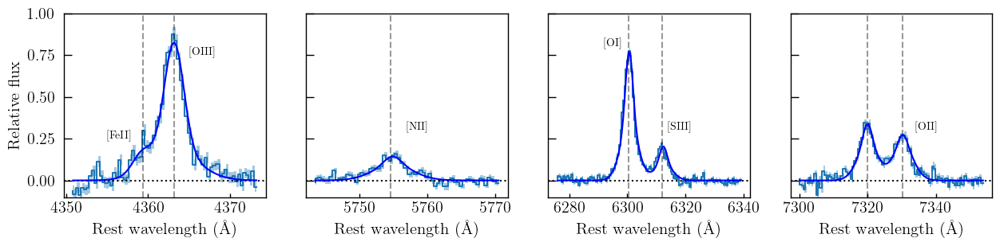

In [284]:
fig, axs = plt.subplots(1, 4, sharey=True)
fig.set_size_inches(15, 3)

# [OIII]4363
axs[0].step(oiii_4363.wavelength / (1 + z_nar_oiii_4959), (oiii_4363.flux - bkg_oiiic) / 4e-16)
axs[0].fill_between(oiii_4363.wavelength / (1 + z_nar_oiii_4959), (oiii_4363.flux - bkg_oiiic + oiii_4363.noise) / 4e-16,
                                                                  (oiii_4363.flux - bkg_oiiic - oiii_4363.noise) / 4e-16,
                   step='mid', alpha=0.4)
axs[0].axvline(wave_cat['[OIII]4363'], alpha=0.4, ls='--')
axs[0].axvline(wave_cat['[FeII]4360'], alpha=0.4, ls='--')
axs[0].axhline(0, ls=':')
axs[0].plot(oiii_4363.wavelength / (1 + z_nar_oiii_4959), (oiiic + feii_4360) / 4e-16, color='blue')
axs[0].set_xlabel('Rest wavelength (\AA)', fontsize=15)
axs[0].set_ylabel('Relative flux', fontsize=15)
axs[0].text(4355, 0.25, s='[FeII]')
axs[0].text(4365, 0.75, s='[OIII]')


# [NII]5755
axs[1].step(nii_5755.wavelength / (1 + z_nar_oiii_4959), (nii_5755.flux - bkg_nii) / 4e-16)
axs[1].fill_between(nii_5755.wavelength / (1 + z_nar_oiii_4959), (nii_5755.flux - bkg_nii + nii_5755.noise) / 4e-16,
                                                                 (nii_5755.flux - bkg_nii - nii_5755.noise) / 4e-16,
                   step='mid', alpha=0.4)
axs[1].axvline(wave_cat['[NII]5755'], alpha=0.4, ls='--')
axs[1].axhline(0, ls=':')
axs[1].plot(nii_5755.wavelength / (1 + z_nar_oiii_4959), (niic) / 4e-16, color='blue')
axs[1].set_xlabel('Rest wavelength (\AA)', fontsize=15)
axs[1].text(5757, 0.3, s='[NII]')

# [OI] + [SIII]
axs[2].step(oi_siii.wavelength / (1 + z_nar_oiii_4959), (oi_siii.flux - bkg_oi_siii) / 4e-16)
axs[2].fill_between(oi_siii.wavelength / (1 + z_nar_oiii_4959), (oi_siii.flux - bkg_oi_siii + oi_siii.noise) / 4e-16,
                                                                (oi_siii.flux - bkg_oi_siii - oi_siii.noise) / 4e-16,
                   step='mid', alpha=0.4)
axs[2].axvline(wave_cat['[OI]6300'], alpha=0.4, ls='--')
axs[2].axvline(wave_cat['[SIII]6312'], alpha=0.4, ls='--')
axs[2].axhline(0, ls=':')
axs[2].plot(oi_siii.wavelength / (1 + z_nar_oiii_4959), (siiic + oi) / 4e-16, color='blue')
axs[2].set_xlabel('Rest wavelength (\AA)', fontsize=15)
axs[2].text(6292, 0.8, s='[OI]')
axs[2].text(6314, 0.3, s='[SIII]')

# [OII]73XX
axs[3].step(oii_7320.wavelength / (1 + z_brd_oiii_4959), (oii_7320.flux - bkg_oii_7320) / 4e-16)
axs[3].fill_between(oii_7320.wavelength / (1 + z_brd_oiii_4959), (oii_7320.flux - bkg_oii_7320 + oii_7320.noise) / 4e-16,
                                                                 (oii_7320.flux - bkg_oii_7320 - oii_7320.noise) / 4e-16,
                   step='mid', alpha=0.4)
axs[3].axvline(wave_cat['[OII]7319'], alpha=0.4, ls='--')
axs[3].axvline(wave_cat['[OII]7330'], alpha=0.4, ls='--')
axs[3].axhline(0, ls=':')
axs[3].plot(oii_7320.wavelength / (1 + z_brd_oiii_4959), (oiia + oiib) / 4e-16, color='blue')
axs[3].set_xlabel('Rest wavelength (\AA)', fontsize=15)
axs[3].text(7334, 0.3, s='[OII]')

#plt.ylim(-1e-16, 4e-16)
plt.ylim(-0.1, 1.0)
axs[0].tick_params(direction='in', axis='both')
axs[1].tick_params(direction='in', axis='both')
axs[2].tick_params(direction='in', axis='both')
axs[3].tick_params(direction='in', axis='both')

#fig.savefig('/home/benjamin/Desktop/cecilia+o3.pdf', bbox_inches='tight')

# Saving arc data

In [285]:
wave_cat

{'[SIII]9532': 9531.1,
 '[SIII]9069': 9068.6,
 'P11': 8862.89,
 'P12': 8750.46,
 'P13': 8665.02,
 'P14': 8598.39,
 'P15': 8545.38,
 'P16': 8502.49,
 'P17': 8467.26,
 '[OI]8446': 8446.36,
 'P18': 8437.95,
 'P19': 8413.32,
 '[ArIII]7751': 7751.06,
 '[OII]7330': 7330.19,
 '[OII]7319': 7319.92,
 'HeI7281': 7281.349,
 '[ArIII]7135': 7135.8,
 'HeI7065': 7065.19,
 '[SII]6730': 6730.815,
 '[SII]6716': 6716.44,
 'HeI6678': 6678.151,
 '[NII]6584': 6583.45,
 'Ha': 6562.79,
 '[NII]6548': 6548.05,
 '[OI]6363': 6363.776,
 '[SIII]6312': 6312.06,
 '[OI]6300': 6300.304,
 'HeI5875': 5875.621,
 '[NII]5755': 5754.59,
 'HeI5015': 5015.6783,
 '[OIII]5007': 5006.843,
 '[FeIII]4985': 4985.86,
 '[OIII]4959': 4958.911,
 '4921': 4921.8,
 'Hb': 4861.35,
 '[ArIV]4740': 4740.2,
 '[ArIV]4711': 4711.35,
 'HeII4685': 4685.71,
 '[FeIII]4658': 4658.05,
 'HeI4471': 4471.4802,
 'HeI4388': 4387.9296,
 '[OIII]4363': 4363.209,
 '[FeII]4360': 4359.332,
 'Hg': 4340.472,
 'Hd': 4101.710277,
 '[SII]4076': 4076.349,
 '[SII]4068':

In [286]:
sigma_arc = np.array([sigma_arc_3729,
                      sigma_arc_3868,
                      sigma_arc_hd,
                      sigma_arc_hg,
                      sigma_arc_4363,
                      sigma_arc_4471,
                      sigma_arc_4658,
                      sigma_arc_4685,
                      sigma_arc_hb,
                      sigma_arc_4959,
                      sigma_arc_5007,
                      sigma_arc_5755,
                      sigma_arc_5875,
                      sigma_arc_6312,
                      sigma_arc_ha,
                      sigma_arc_6678,
                      sigma_arc_6730,
                      sigma_arc_7065,
                      sigma_arc_7135,
                      sigma_arc_7330,
                      sigma_arc_9069,
                      sigma_arc_9532])

x_arc = np.array([np.median(x_arc_3729),
                  np.median(x_arc_3868),
                  np.median(x_arc_hd),
                  np.median(x_arc_hg),
                  np.median(x_arc_4363),
                  np.median(x_arc_4471),
                  np.median(x_arc_4658),
                  np.median(x_arc_4685),
                  np.median(x_arc_hb),
                  np.median(x_arc_4959),
                  np.median(x_arc_5007),
                  np.median(x_arc_5755),
                  np.median(x_arc_5875),
                  np.median(x_arc_6312),
                  np.median(x_arc_ha),
                  np.median(x_arc_6678),
                  np.median(x_arc_6730),
                  np.median(x_arc_7065),
                  np.median(x_arc_7135),
                  np.median(x_arc_7330),
                  np.median(x_arc_9069),
                  np.median(x_arc_9532)])

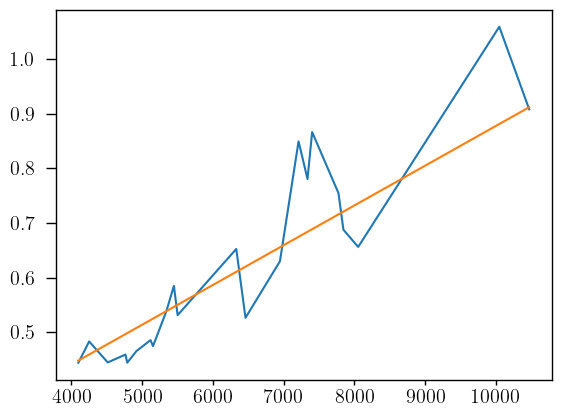

In [287]:
plt.plot(x_arc, sigma_arc)
plt.plot(x_arc, (((sigma_arc[-1] - sigma_arc[0])/(x_arc[-1] - x_arc[0])) * x_arc) + 0.15)

In [288]:
params_sigma_arc = Parameters()
params_sigma_arc.add('m', value=(sigma_arc[-1] - sigma_arc[0])/(x_arc[-1] - x_arc[0]))
params_sigma_arc.add('n', value=0.15)

def residual_sigma_arc(params_sigma_arc, x, data, uncertainty):
    
    m = params_sigma_arc['m']
    n = params_sigma_arc['n']
    
    x = x_arc
    model = (m * x_arc) + n
    return (model - sigma_arc) / 0.05

np.random.seed(136)
out_sigma_arc = minimize(residual_sigma_arc, params_sigma_arc, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10)

100%|██████████████████████████████████████| 2500/2500 [00:10<00:00, 245.65it/s]


In [289]:
lmfit.report_fit(out_sigma_arc.params)

[[Variables]]
    m:  9.1260e-05 +/- 6.2198e-06 (6.82%) (init = 7.274864e-05)
    n:  0.04415798 +/- 0.04068564 (92.14%) (init = 0.15)
[[Correlations]] (unreported correlations are < 0.100)
    C(m, n) = -0.9660


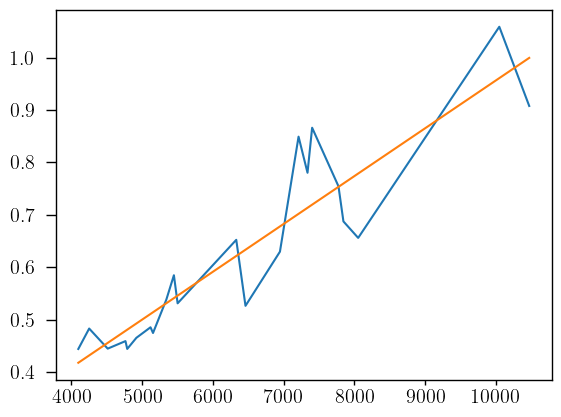

In [290]:
m = out_sigma_arc.flatchain.m.mean()
n = out_sigma_arc.flatchain.n.mean()

plt.plot(x_arc, sigma_arc)
plt.plot(x_arc, (m * x_arc) + n)

# Balmer decrements

In [291]:
from magE.functions import *
from magE.functions import calzetti2000 as k_cal

flux_ha_bal = ufloat(out_ha_nii.flatchain.Ha_nar.mean(), out_ha_nii.flatchain.Ha_nar.std()) \
            + ufloat(out_ha_nii.flatchain.Ha_brd.mean(), out_ha_nii.flatchain.Ha_brd.std())
flux_hb_bal = ufloat(out_hb.flatchain.Hb_nar.mean(), out_hb.flatchain.Hb_nar.std()) \
            + ufloat(out_hb.flatchain.Hb_brd.mean(), out_hb.flatchain.Hb_brd.std())
flux_hg_bal = ufloat(out_hg.flatchain.Hg_nar.mean(), out_hg.flatchain.Hg_nar.std()) \
            + ufloat(out_hg.flatchain.Hg_brd.mean(), out_hg.flatchain.Hg_brd.std())
flux_hd_bal = ufloat(out_hd.flatchain.Hd_nar.mean(), out_hd.flatchain.Hd_nar.std()) \
            + ufloat(out_hd.flatchain.Hd_brd.mean(), out_hd.flatchain.Hd_brd.std())

y_balmer = upy.log10([(flux_ha_bal / flux_hb_bal) / 2.86, 
                    (flux_hb_bal / flux_hb_bal) / 1.0,
                    (flux_hg_bal / flux_hb_bal) / 0.464,
                    (flux_hd_bal / flux_hb_bal) / 0.256])

x_balmer = np.array([k_cal(wave_cat['Ha']) - k_cal(wave_cat['Hb']),
                     k_cal(wave_cat['Hb']) - k_cal(wave_cat['Hb']),
                     k_cal(wave_cat['Hg']) - k_cal(wave_cat['Hb']),
                     k_cal(wave_cat['Hd']) - k_cal(wave_cat['Hb'])])

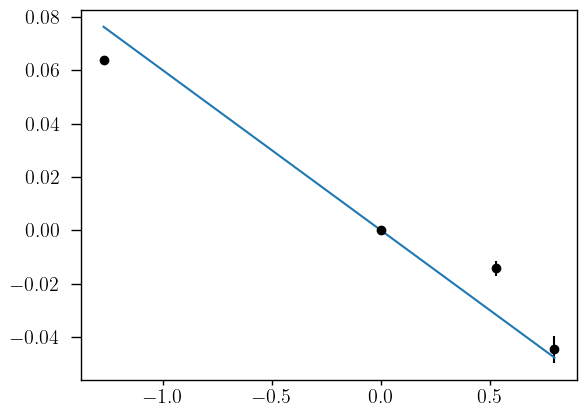

In [292]:
plt.errorbar(x_balmer, upy.nominal_values(y_balmer), upy.std_devs(y_balmer),
            ls='', color='black', marker='o')
plt.plot(x_balmer, x_balmer * (-0.4 * 0.15))

In [293]:
params_balmer = Parameters()
params_balmer.add('slope', value=0.4 * 0.15)

def residuals_balmer(params_balmer, x, data, uncertainty):
    
    slope = params_balmer['slope']
    x = x_balmer
    
    model = x * (-slope)
    return (model - upy.nominal_values(y_balmer)) / 0.05

np.random.seed(21)
out_balmer = minimize(residuals_balmer, params_balmer, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10)

100%|██████████████████████████████████████| 2500/2500 [00:10<00:00, 229.92it/s]


Text(0.5, 1.0, '$E(B-V) = $ 0.122 $\\pm$ 0.079')

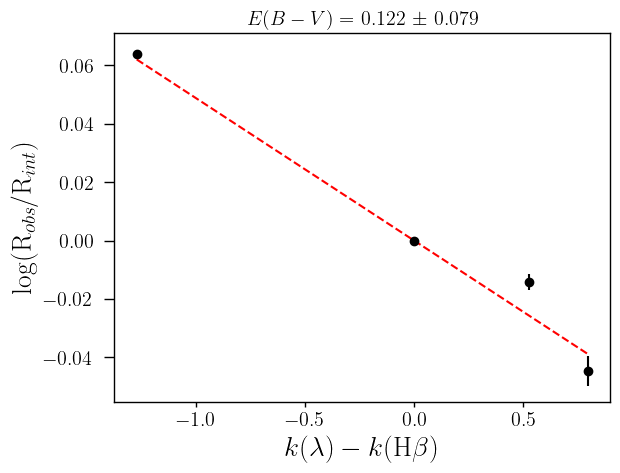

In [294]:
color_excess = ufloat(out_balmer.flatchain.slope.mean(), out_balmer.flatchain.slope.std()) / 0.4
E_BV = out_balmer.flatchain.slope.mean() / 0.4

texPlot('on')
plt.errorbar(x_balmer, upy.nominal_values(y_balmer), upy.std_devs(y_balmer),
            ls='', color='black', marker='o')
plt.plot(x_balmer, - E_BV * 0.4 * x_balmer, ls='--', color='red')
plt.ylabel(r'log(R$_{obs}$/R$_{int}$)')
plt.xlabel(r'$k(\lambda) - k($H$\beta)$')
plt.title(r'$E(B-V) = $ '+str(round(color_excess.nominal_value, 3))+' $\pm$ '+str(round(color_excess.std_dev, 3)))
#plt.savefig('/home/benjamin/Documents/analogs/results/balmer_decrements/bal_dec_J0021.pdf', bbox_inches='tight')

In [295]:
decrement_dict = {'galname': galname,
                 'Ha/Hb': (flux_ha_bal / flux_hb_bal).nominal_value,
                 'Ha/Hb_err': (flux_ha_bal / flux_hb_bal).std_dev,
                 'Hg/Hb': (flux_hg_bal / flux_hb_bal).nominal_value,
                 'Hg/Hb_err': (flux_hg_bal / flux_hb_bal).std_dev,
                 'Hd/Hb': (flux_hd_bal / flux_hb_bal).nominal_value,
                 'Hd/Hb_err': (flux_hd_bal / flux_hb_bal).std_dev,
                 'E_BV': out_balmer.flatchain.slope.mean() / 0.4,
                 'E_BV_err': out_balmer.flatchain.slope.std() / 0.4
                 }
decrement_dict_pd = pd.DataFrame(data=decrement_dict, index=[0])
save_catalog(galname, decrement_dict_pd, magePath + '/results/bal_decrements.csv')

Existent catalog (.csv) file.
Existent data for J0021, overwriting...
Done.


# Temperatures

In [296]:
heiia_nar_chain = out_heii4685.flatchain.Heii4685_nar * 10**(0.4 * E_BV * k_cal(wave_cat['HeII4685']))
heiia_brd_chain = out_heii4685.flatchain.Heii4685_brd * 10**(0.4 * E_BV * k_cal(wave_cat['HeII4685']))
heiia_tot_chain = heiia_nar_chain + heiia_brd_chain

heia_nar_chain = out_hei7065.flatchain.Hei7065_nar * 10**(0.4 * E_BV * k_cal(wave_cat['HeI7065']))
heia_brd_chain = out_hei7065.flatchain.Hei7065_brd * 10**(0.4 * E_BV * k_cal(wave_cat['HeI7065']))
heia_tot_chain = heia_nar_chain + heia_brd_chain

heib_nar_chain = out_hei6678.flatchain.Hei6678_nar * 10**(0.4 * E_BV * k_cal(wave_cat['HeI6678']))
heib_brd_chain = out_hei6678.flatchain.Hei6678_brd * 10**(0.4 * E_BV * k_cal(wave_cat['HeI6678']))
heib_tot_chain = heib_nar_chain + heib_brd_chain

heic_nar_chain = out_hei5875.flatchain.Hei5875_nar * 10**(0.4 * E_BV * k_cal(wave_cat['HeI5875']))
heic_brd_chain = out_hei5875.flatchain.Hei5875_brd * 10**(0.4 * E_BV * k_cal(wave_cat['HeI5875']))
heic_tot_chain = heic_nar_chain + heic_brd_chain

heid_nar_chain = out_hei4471.flatchain.Hei4471_nar * 10**(0.4 * E_BV * k_cal(wave_cat['HeI4471']))
heid_brd_chain = out_hei4471.flatchain.Hei4471_brd * 10**(0.4 * E_BV * k_cal(wave_cat['HeI4471']))
heid_tot_chain = heid_nar_chain + heid_brd_chain

feiiia_nar_chain = out_feiiia.flatchain.Feiiia_nar * 10**(0.4 * E_BV * k_cal(wave_cat['[FeIII]4658']))
feiiia_brd_chain = out_feiiia.flatchain.Feiiia_brd * 10**(0.4 * E_BV * k_cal(wave_cat['[FeIII]4658']))
feiiia_tot_chain = feiiia_nar_chain + feiiia_brd_chain

neiiia_nar_chain = out_neiii_3868.flatchain.Neiiia_nar * 10**(0.4 * E_BV * k_cal(wave_cat['[NeIII]3868']))
neiiia_brd_chain = out_neiii_3868.flatchain.Neiiia_brd * 10**(0.4 * E_BV * k_cal(wave_cat['[NeIII]3868']))
neiiia_tot_chain = neiiia_nar_chain + neiiia_brd_chain

ariiia_nar_chain = out_ariii.flatchain.Ariiia_nar * 10**(0.4 * E_BV * k_cal(wave_cat['[ArIII]7135']))
ariiia_brd_chain = out_ariii.flatchain.Ariiia_brd * 10**(0.4 * E_BV * k_cal(wave_cat['[ArIII]7135']))
ariiia_tot_chain = ariiia_nar_chain + ariiia_brd_chain

oiiia_nar_chain = out_oiii_hei.flatchain.Oiiia_nar * 10**(0.4 * E_BV * k_cal(wave_cat['[OIII]5007']))
oiiia_brd_chain = out_oiii_hei.flatchain.Oiiia_brd * 10**(0.4 * E_BV * k_cal(wave_cat['[OIII]5007']))
oiiia_tot_chain = oiiia_nar_chain + oiiia_brd_chain

oiiib_nar_chain = out_oiii_4959.flatchain.Oiiib_nar * 10**(0.4 * E_BV * k_cal(wave_cat['[OIII]4959']))
oiiib_brd_chain = out_oiii_4959.flatchain.Oiiib_brd * 10**(0.4 * E_BV * k_cal(wave_cat['[OIII]4959']))
oiiib_tot_chain = oiiib_nar_chain + oiiib_brd_chain

oiiic_nar_chain = out_oiiic.flatchain.Oiiic_nar * 10**(0.4 * E_BV * k_cal(wave_cat['[OIII]4363']))
oiiic_brd_chain = out_oiiic.flatchain.Oiiic_brd * 10**(0.4 * E_BV * k_cal(wave_cat['[OIII]4363']))
oiiic_tot_chain = oiiic_nar_chain + oiiic_brd_chain

siia_nar_chain = out_sii.flatchain.Siia_nar * 10**(0.4 * E_BV * k_cal(wave_cat['[SII]6730']))
siia_brd_chain = out_sii.flatchain.Siia_brd * 10**(0.4 * E_BV * k_cal(wave_cat['[SII]6730']))
siia_tot_chain = siia_nar_chain + siia_brd_chain

siib_nar_chain = out_sii.flatchain.Siib_nar * 10**(0.4 * E_BV * k_cal(wave_cat['[SII]6716']))
siib_brd_chain = out_sii.flatchain.Siib_brd * 10**(0.4 * E_BV * k_cal(wave_cat['[SII]6716']))
siib_tot_chain = siib_nar_chain + siib_brd_chain

oiia_nar_chain = out_oii_7320.flatchain.Oiia_nar * 10**(0.4 * E_BV * k_cal(wave_cat['[OII]7330']))
oiia_brd_chain = out_oii_7320.flatchain.Oiia_brd * 10**(0.4 * E_BV * k_cal(wave_cat['[OII]7330']))
oiia_tot_chain = oiia_nar_chain + oiia_brd_chain

oiib_nar_chain = out_oii_7320.flatchain.Oiib_nar * 10**(0.4 * E_BV * k_cal(wave_cat['[OII]7319']))
oiib_brd_chain = out_oii_7320.flatchain.Oiib_brd * 10**(0.4 * E_BV * k_cal(wave_cat['[OII]7319']))
oiib_tot_chain = oiib_nar_chain + oiib_brd_chain

oiic_nar_chain = out_oii_3727.flatchain.Oiic_nar * 10**(0.4 * E_BV * k_cal(wave_cat['[OII]3729']))
oiic_brd_chain = out_oii_3727.flatchain.Oiic_brd * 10**(0.4 * E_BV * k_cal(wave_cat['[OII]3729']))
oiic_tot_chain = oiic_nar_chain + oiic_brd_chain

oiid_nar_chain = out_oii_3727.flatchain.Oiid_nar * 10**(0.4 * E_BV * k_cal(wave_cat['[OII]3726']))
oiid_brd_chain = out_oii_3727.flatchain.Oiid_brd * 10**(0.4 * E_BV * k_cal(wave_cat['[OII]3726']))
oiid_tot_chain = oiid_nar_chain + oiid_brd_chain

siiia_nar_chain = out_siiia.flatchain.Siiia_nar * 10**(0.4 * E_BV * k_cal(wave_cat['[SIII]9532']))
siiia_brd_chain = out_siiia.flatchain.Siiia_brd * 10**(0.4 * E_BV * k_cal(wave_cat['[SIII]9532']))
siiia_tot_chain = siiia_nar_chain + siiia_brd_chain

siiib_nar_chain = out_siiib.flatchain.Siiib_nar * 10**(0.4 * E_BV * k_cal(wave_cat['[SIII]9069']))
siiib_brd_chain = out_siiib.flatchain.Siiib_brd * 10**(0.4 * E_BV * k_cal(wave_cat['[SIII]9069']))
siiib_tot_chain = siiib_nar_chain + siiib_brd_chain

siiic_nar_chain = out_oi_siii.flatchain.Siiic_nar * 10**(0.4 * E_BV * k_cal(wave_cat['[SIII]6312']))
siiic_brd_chain = out_oi_siii.flatchain.Siiic_brd * 10**(0.4 * E_BV * k_cal(wave_cat['[SIII]6312']))
siiic_tot_chain = siiic_nar_chain + siiic_brd_chain

niia_nar_chain = out_ha_nii.flatchain.Niia_nar * 10**(0.4 * E_BV * k_cal(wave_cat['[NII]6584']))
niia_brd_chain = out_ha_nii.flatchain.Niia_brd * 10**(0.4 * E_BV * k_cal(wave_cat['[NII]6584']))
niia_tot_chain = niia_nar_chain + niia_brd_chain

niib_nar_chain = out_ha_nii.flatchain.Niia_nar * out_ha_nii.flatchain.Niib_to_niia * 10**(0.4 * E_BV * k_cal(wave_cat['[NII]6548']))
niib_brd_chain = out_ha_nii.flatchain.Niia_brd * out_ha_nii.flatchain.Niib_to_niia * 10**(0.4 * E_BV * k_cal(wave_cat['[NII]6548']))
niib_tot_chain = niib_nar_chain + niib_brd_chain

niic_nar_chain = out_nii.flatchain.Niic_nar * 10**(0.4 * E_BV * k_cal(wave_cat['[NII]5755']))
niic_brd_chain = out_nii.flatchain.Niic_brd * 10**(0.4 * E_BV * k_cal(wave_cat['[NII]5755']))
niic_tot_chain = niic_nar_chain + niic_brd_chain

hd_nar_chain = out_hd.flatchain.Hd_nar * 10**(0.4 * E_BV * k_cal(wave_cat['Hd']))
hd_brd_chain = out_hd.flatchain.Hd_brd * 10**(0.4 * E_BV * k_cal(wave_cat['Hd']))
hd_tot_chain = hd_nar_chain + hd_brd_chain

hg_nar_chain = out_hg.flatchain.Hg_nar * 10**(0.4 * E_BV * k_cal(wave_cat['Hg']))
hg_brd_chain = out_hg.flatchain.Hg_brd * 10**(0.4 * E_BV * k_cal(wave_cat['Hg']))
hg_tot_chain = hg_nar_chain + hg_brd_chain

hb_nar_chain = out_hb.flatchain.Hb_nar * 10**(0.4 * E_BV * k_cal(wave_cat['Hb']))
hb_brd_chain = out_hb.flatchain.Hb_brd * 10**(0.4 * E_BV * k_cal(wave_cat['Hb']))
hb_tot_chain = hb_nar_chain + hb_brd_chain

ha_nar_chain = out_ha_nii.flatchain.Ha_nar * 10**(0.4 * E_BV * k_cal(wave_cat['Ha']))
ha_brd_chain = out_ha_nii.flatchain.Ha_brd * 10**(0.4 * E_BV * k_cal(wave_cat['Ha']))
ha_tot_chain = ha_nar_chain + ha_brd_chain

In [297]:
chains_dict = {'[OII]3726_nar': oiid_nar_chain.to_numpy(),
               '[OII]3726_brd': oiid_brd_chain.to_numpy(),
               '[OII]3726': oiid_tot_chain.to_numpy(),
               
               '[OII]3729_nar': oiic_nar_chain.to_numpy(),
               '[OII]3729_brd': oiic_brd_chain.to_numpy(),
               '[OII]3729': oiic_tot_chain.to_numpy(),
               
               '[NeIII]3868_nar': neiiia_nar_chain.to_numpy(),
               '[NeIII]3868_brd': neiiia_brd_chain.to_numpy(),
               '[NeIII]3868': neiiia_tot_chain.to_numpy(),
               
               'Hd_nar': hd_nar_chain.to_numpy(),
               'Hd_brd': hd_brd_chain.to_numpy(),
               'Hd': hd_tot_chain.to_numpy(),
               
               'Hg_nar': hg_nar_chain.to_numpy(),
               'Hg_brd': hg_brd_chain.to_numpy(),
               'Hg': hg_tot_chain.to_numpy(),
               
               '[OIII]4363_nar': oiiic_nar_chain.to_numpy(),
               '[OIII]4363_brd': oiiic_brd_chain.to_numpy(),
               '[OIII]4363': oiiic_tot_chain.to_numpy(),
               
               'HeI4471_nar': heid_nar_chain.to_numpy(),
               'HeI4471_brd': heid_brd_chain.to_numpy(),
               'HeI4471': heid_tot_chain.to_numpy(),
               
               '[FeIII]4658_nar': feiiia_nar_chain.to_numpy(),
               '[FeIII]4658_brd': feiiia_brd_chain.to_numpy(),
               '[FeIII]4658': feiiia_tot_chain.to_numpy(),
               
               'HeII4686_nar': heiia_nar_chain.to_numpy(),
               'HeII4686_brd': heiia_brd_chain.to_numpy(),
               'HeII4686': heiia_tot_chain.to_numpy(),
               
               'Hb_nar': hb_nar_chain.to_numpy(),
               'Hb_brd': hb_brd_chain.to_numpy(),
               'Hb': hb_tot_chain.to_numpy(),
               
               '[OIII]4959_nar': oiiib_nar_chain.to_numpy(),
               '[OIII]4959_brd': oiiib_brd_chain.to_numpy(),
               '[OIII]4959': oiiib_tot_chain.to_numpy(),
               
               '[OIII]5007_nar': oiiia_nar_chain.to_numpy(),
               '[OIII]5007_brd': oiiia_brd_chain.to_numpy(),
               '[OIII]5007': oiiia_tot_chain.to_numpy(),
               
               '[NII]5755_nar': niic_nar_chain.to_numpy(),
               '[NII]5755_brd': niic_brd_chain.to_numpy(),
               '[NII]5755': niic_tot_chain.to_numpy(),
               
               'HeI5875_nar': heic_nar_chain.to_numpy(),
               'HeI5875_brd': heic_brd_chain.to_numpy(),
               'HeI5875': heic_tot_chain.to_numpy(),
               
               '[SIII]6312_nar': siiic_nar_chain.to_numpy(),
               '[SIII]6312_brd': siiic_brd_chain.to_numpy(),
               '[SIII]6312': siiic_tot_chain.to_numpy(),
               
               '[NII]6548_nar': niib_nar_chain.to_numpy(),
               '[NII]6548_brd': niib_brd_chain.to_numpy(),
               '[NII]6548': niib_tot_chain.to_numpy(),
               
               'Ha_nar': ha_nar_chain.to_numpy(),
               'Ha_brd': ha_brd_chain.to_numpy(),
               'Ha': ha_tot_chain.to_numpy(),
               
               '[NII]6584_nar': niia_nar_chain.to_numpy(),
               '[NII]6584_brd': niia_brd_chain.to_numpy(),
               '[NII]6584': niia_tot_chain.to_numpy(),
               
               'HeI6678_nar': heib_nar_chain.to_numpy(),
               'HeI6678_brd': heib_brd_chain.to_numpy(),
               'HeI6678': heib_tot_chain.to_numpy(),
               
               '[SII]6716_nar': siib_nar_chain.to_numpy(),
               '[SII]6716_brd': siib_brd_chain.to_numpy(),
               '[SII]6716': siib_tot_chain.to_numpy(),
               
               '[SII]6730_nar': siia_nar_chain.to_numpy(),
               '[SII]6730_brd': siia_brd_chain.to_numpy(),
               '[SII]6730': siia_tot_chain.to_numpy(),
               
               'HeI7065_nar': heia_nar_chain.to_numpy(),
               'HeI7065_brd': heia_brd_chain.to_numpy(),
               'HeI7065': heia_tot_chain.to_numpy(),
               
               '[ArIII]7135_nar': ariiia_nar_chain.to_numpy(),
               '[ArIII]7135_brd': ariiia_brd_chain.to_numpy(),
               '[ArIII]7135': ariiia_tot_chain.to_numpy(),
               
               '[OII]7319_nar': oiib_nar_chain.to_numpy(),
               '[OII]7319_brd': oiib_brd_chain.to_numpy(),
               '[OII]7319': oiib_tot_chain.to_numpy(),
               
               '[OII]7330_nar': oiia_nar_chain.to_numpy(),
               '[OII]7330_brd': oiia_brd_chain.to_numpy(),
               '[OII]7330': oiia_tot_chain.to_numpy(),
               
               '[SIII]9069_nar': siiib_nar_chain.to_numpy(),
               '[SIII]9069_brd': siiib_brd_chain.to_numpy(),
               '[SIII]9069': siiib_tot_chain.to_numpy(),
               
               '[SIII]9532_nar': siiia_nar_chain.to_numpy(),
               '[SIII]9532_brd': siiia_brd_chain.to_numpy(),
               '[SIII]9532': siiia_tot_chain.to_numpy()
}
chains_dict_pd = pd.DataFrame(data=chains_dict, index=None)
chains_dict_pd.to_csv('/home/benjamin/Documents/chains/chains_J0021.csv')
#save_catalog(galname, chains_dict_pd, '/home/benjamin/Documents/chains/chains_J0021.csv')

In [298]:
lines_dict = {'galname': galname,
              '[OII]3726': oiid_tot_chain.mean(),
              '[OII]3726_err': oiid_tot_chain.std(),
              '[OII]3729': oiic_tot_chain.mean(),
              '[OII]3729_err': oiic_tot_chain.std(),
              '[NeIII]3868': neiiia_tot_chain.mean(),
              '[NeIII]3868_err': neiiia_tot_chain.std(),
              'Hd': hd_tot_chain.mean(),
              'Hd_err': hd_tot_chain.std(),
              'Hg': hg_tot_chain.mean(),
              'Hg_err': hg_tot_chain.std(),
              '[OIII]4363': oiiic_tot_chain.mean(),
              '[OIII]4363_err': oiiic_tot_chain.std(),
              'HeI4471': heid_tot_chain.mean(),
              'HeI4471_err': heid_tot_chain.std(),
              '[FeIII]4658': feiiia_tot_chain.mean(),
              '[FeIII]4658_err': feiiia_tot_chain.std(),
              'HeII4686': heiia_tot_chain.mean(),
              'HeII4686_err': heiia_tot_chain.std(),
              'Hb': hb_tot_chain.mean(),
              'Hb_err': hb_tot_chain.std(),
              '[OIII]4959': oiiib_tot_chain.mean(),
              '[OIII]4959_err': oiiib_tot_chain.std(),
              '[OIII]5007': oiiia_tot_chain.mean(),
              '[OIII]5007_err': oiiia_tot_chain.std(),
              '[NII]5755': niic_tot_chain.mean(),
              '[NII]5755_err': niic_tot_chain.std(),
              'HeI5875': heic_tot_chain.mean(),
              'HeI5875_err': heic_tot_chain.std(),
              '[SIII]6312': siiic_tot_chain.mean(),
              '[SIII]6312_err': siiic_tot_chain.std(),
              '[NII]6548': niib_tot_chain.mean(),
              '[NII]6548_err': niib_tot_chain.std(),
              'Ha': ha_tot_chain.mean(),
              'Ha_err': ha_tot_chain.std(),
              '[NII]6584': niia_tot_chain.mean(),
              '[NII]6584_err': niia_tot_chain.std(),
              'HeI6678': heib_tot_chain.mean(),
              'HeI6678_err': heib_tot_chain.std(),
              '[SII]6716': siib_tot_chain.mean(),
              '[SII]6716_err': siib_tot_chain.std(),
              '[SII]6730': siia_tot_chain.mean(),
              '[SII]6730_err': siia_tot_chain.std(),
              'HeI7065': heia_tot_chain.mean(),
              'HeI7065_err': heia_tot_chain.std(),
              '[ArIII]7135': ariiia_tot_chain.mean(),
              '[ArIII]7135_err': ariiia_tot_chain.std(),
              '[OII]7319': oiib_tot_chain.mean(),
              '[OII]7319_err': oiib_tot_chain.std(),
              '[OII]7330': oiia_tot_chain.mean(),
              '[OII]7330_err': oiia_tot_chain.std(),
              '[SIII]9069': siiib_tot_chain.mean(),
              '[SIII]9069_err': siiib_tot_chain.std(),
              '[SIII]9532': siiia_tot_chain.mean(),
              '[SIII]9532_err': siiia_tot_chain.std()
}
lines_dict_pd = pd.DataFrame(data=lines_dict, index=[0])
save_catalog(galname, lines_dict_pd, magePath + '/results/em_lines_final.csv')

Existent catalog (.csv) file.
Existent data for J0021, overwriting...
Done.


# Start here

In [1]:
# Reading decrements info

import os
import sys
magePath = '/home/benjamin/Documents/analogs/'
os.sys.path.append(magePath)

import pandas as pd
from magE.constutils import *
from magE.functions import *
from magE.plotutils import *
from magE.functions import calzetti2000 as k_cal
import pyneb as pn

galname = 'J0021'

# Extinction
ext_cat = pd.read_csv(magePath+'results/bal_decrements.csv')
index = np.argmax(ext_cat['galname'] == galname)
E_BV = ext_cat['E_BV'][index]

if E_BV < 0:
    E_BV = 0

In [2]:
# Reading the chains
chains = pd.read_csv('/home/benjamin/Documents/chains/chains_J0021.csv')

In [3]:
t_OIII_nar = TO3(chains['[OIII]5007_nar'].to_numpy(), chains['[OIII]4959_nar'].to_numpy(), chains['[OIII]4363_nar'].to_numpy())
t_OIII_brd = TO3(chains['[OIII]5007_brd'].to_numpy(), chains['[OIII]4959_brd'].to_numpy(), chains['[OIII]4363_brd'].to_numpy())
t_OIII_tot = TO3(chains['[OIII]5007'].to_numpy()    , chains['[OIII]4959'].to_numpy()    , chains['[OIII]4363'].to_numpy())

O2_H_nar = 10**(double_log_OH(chains['[OIII]5007_nar'].to_numpy(), chains['[OIII]4959_nar'].to_numpy(), chains['Hb_nar'].to_numpy(), t_OIII_nar) - 12)
O2_H_brd = 10**(double_log_OH(chains['[OIII]5007_brd'].to_numpy(), chains['[OIII]4959_brd'].to_numpy(), chains['Hb_brd'].to_numpy(), t_OIII_brd) - 12)
O2_H_tot = 10**(double_log_OH(chains['[OIII]5007'].to_numpy()    , chains['[OIII]4959'].to_numpy()    , chains['Hb'].to_numpy()    , t_OIII_tot) - 12)

IO2_R_nar = 9.36 * (t_OIII_nar**0.44) * O2_H_nar * chains['Hb_nar'].to_numpy()
IO2_R_brd = 9.36 * (t_OIII_brd**0.44) * O2_H_brd * chains['Hb_brd'].to_numpy()
IO2_R_tot = 9.36 * (t_OIII_tot**0.44) * O2_H_tot * chains['Hb'].to_numpy()    

den_nar = ne(chains['[SII]6730_nar'].to_numpy(), chains['[SII]6716_nar'].to_numpy(), t_OIII_nar)
den_brd = ne(chains['[SII]6730_brd'].to_numpy(), chains['[SII]6716_brd'].to_numpy(), t_OIII_brd)
den_tot = ne(chains['[SII]6730'].to_numpy()    , chains['[SII]6716'].to_numpy()    , t_OIII_tot)

t_OII_nar = TO2(chains['[OII]7330_nar'].to_numpy(), chains['[OII]7319_nar'].to_numpy(), chains['[OII]3729_nar'].to_numpy(), chains['[OII]3726_nar'].to_numpy(), den_nar, IO2_R_nar)
t_OII_brd = TO2(chains['[OII]7330_brd'].to_numpy(), chains['[OII]7319_brd'].to_numpy(), chains['[OII]3729_brd'].to_numpy(), chains['[OII]3726_brd'].to_numpy(), den_brd, IO2_R_brd)
t_OII_tot = TO2(chains['[OII]7330'].to_numpy()    , chains['[OII]7319'].to_numpy()    , chains['[OII]3729'].to_numpy()    , chains['[OII]3726'].to_numpy()    , den_tot, IO2_R_tot)

# Garnett
t_OII_tot_garnett = ((0.7 * (t_OIII_tot * 10)) + 0.3) / 10

# PM17 DENSITY DEPENDENT
#t_OII_tot_PM = (1.2 + (0.002 * 300) + (4.2 / 300)) / ((t_OIII_tot**-1) + 0.08 + (0.003 * 300) + (2.5 / 300))

# Linear
t_OII_tot_lin = (slope_o3o2 * t_OIII_tot) + intercept_o3o2

# Non-linear
#t_OII_tot_nlin = (2.4 / ((t_OIII_tot**-1) + 1.5))

# Polynomial
#t_OII_tot_poly = (-6.6 * t_OIII_tot) + (15.1 * (t_OIII_tot**2)) + (-8.3 * (t_OIII_tot**3)) + (0.69 * (t_OIII_tot**5))

# Square root
#t_OII_tot_sqrt = 0.3 + (0.66 * np.sqrt(t_OIII_tot))

#N_H_nar = 10**(log_NH_12(chains['[NII]6584_nar'].to_numpy(), chains['[NII]6548_nar'].to_numpy(), chains['Hb_nar'].to_numpy(), t_OII_nar) - 12)
#N_H_brd = 10**(log_NH_12(chains['[NII]6584_brd'].to_numpy(), chains['[NII]6548_brd'].to_numpy(), chains['Hb_brd'].to_numpy(), t_OII_brd) - 12)
#N_H_tot = 10**(log_NH_12(chains['[NII]6584'].to_numpy()    , chains['[NII]6548'].to_numpy()    , chains['Hb'].to_numpy()    , t_OII_tot) - 12)
#
#IN2_R_nar = 3.19 * ((t_OII_nar)**0.30) * N_H_nar * chains['Hb_nar'].to_numpy()
#IN2_R_brd = 3.19 * ((t_OII_brd)**0.30) * N_H_brd * chains['Hb_brd'].to_numpy()
#IN2_R_tot = 3.19 * ((t_OII_tot)**0.30) * N_H_tot * chains['Hb'].to_numpy()    

t_SIII_nar = TS3(chains['[SIII]9532_nar'].to_numpy(), chains['[SIII]9069_nar'].to_numpy(), chains['[SIII]6312_nar'].to_numpy())
t_SIII_brd = TS3(chains['[SIII]9532_brd'].to_numpy(), chains['[SIII]9069_brd'].to_numpy(), chains['[SIII]6312_brd'].to_numpy())
t_SIII_tot = TS3(chains['[SIII]9532'].to_numpy()    , chains['[SIII]9069'].to_numpy()    , chains['[SIII]6312'].to_numpy()    )

# PyNeb 
N2 = pn.Atom('N', 2)

t_NII_nar = N2.getTemDen(((chains['[NII]6548_nar'] + chains['[NII]6584_nar']) / chains['[NII]5755_nar']).to_numpy(),
                         den=den_tot, to_eval = "(L(6584) + L(6548)) / L(5755)") / 10000
t_NII_brd = N2.getTemDen(((chains['[NII]6548_brd'] + chains['[NII]6584_brd']) / chains['[NII]5755_brd']).to_numpy(),
                         den=den_tot, to_eval = "(L(6584) + L(6548)) / L(5755)") / 10000
t_NII_tot = N2.getTemDen(((chains['[NII]6548'] + chains['[NII]6584']) / chains['[NII]5755']).to_numpy(),
                         den=den_tot, to_eval = "(L(6584) + L(6548)) / L(5755)") / 10000

Text(0.5, 0, 'T[NII]$_{tot}$ (10$^{4}$ K)')

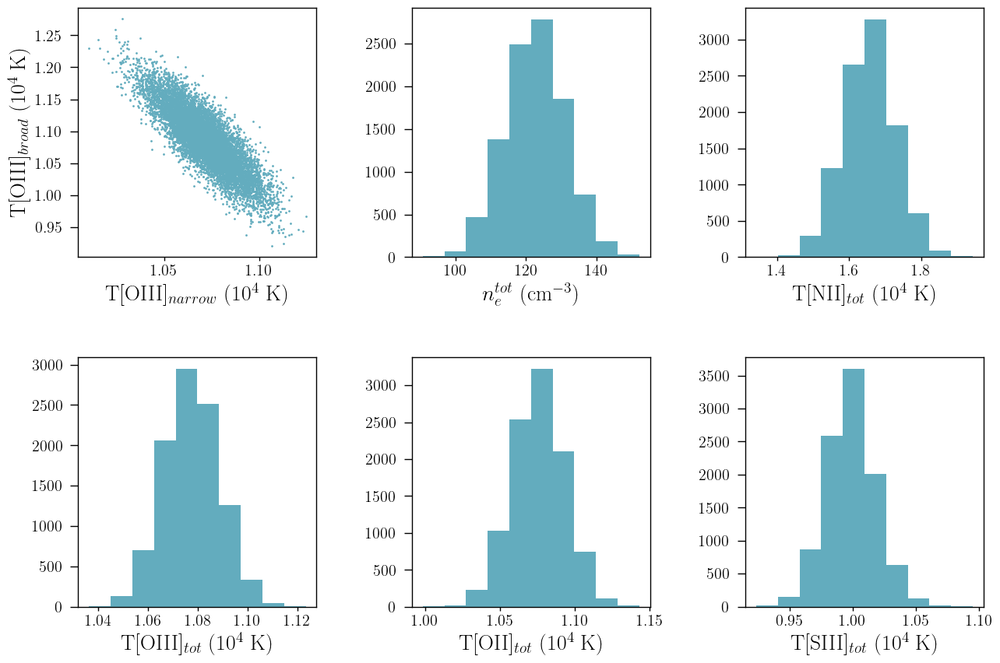

In [4]:
texPlot('on')
fig, axs = plt.subplots(2, 3)
fig.set_size_inches((15, 10))
fig.subplots_adjust(wspace=0.4, hspace=0.4)

axs[0, 0].scatter(t_OIII_nar, t_OIII_brd, s=1, color=cr[2])
axs[0, 0].set_xlabel(r'T[OIII]$_{narrow}$ (10$^{4}$ K)')
axs[0, 0].set_ylabel(r'T[OIII]$_{broad}$ (10$^{4}$ K)')

axs[1, 0].hist(t_OIII_tot, color=cr[2])
axs[1, 0].set_xlabel(r'T[OIII]$_{tot}$ (10$^{4}$ K)')

axs[0, 1].hist(den_tot, color=cr[2])
axs[0, 1].set_xlabel(r'$n_{e}^{tot}$ (cm$^{-3}$)')

axs[1, 1].hist(t_OII_tot, color=cr[2])
axs[1, 1].set_xlabel(r'T[OII]$_{tot}$ (10$^{4}$ K)')

axs[1, 2].hist(t_SIII_tot, color=cr[2])
axs[1, 2].set_xlabel(r'T[SIII]$_{tot}$ (10$^{4}$ K)')

axs[0, 2].hist(t_NII_tot, color=cr[2])
axs[0, 2].set_xlabel(r'T[NII]$_{tot}$ (10$^{4}$ K)')

In [5]:
t_OIII_nar_mean = np.nanpercentile(t_OIII_nar, 50)
t_OIII_nar_16 = np.nanpercentile(t_OIII_nar, 16)
t_OIII_nar_84 = np.nanpercentile(t_OIII_nar, 84)

t_OIII_brd_mean = np.nanpercentile(t_OIII_brd, 50)
t_OIII_brd_16 = np.nanpercentile(t_OIII_brd, 16)
t_OIII_brd_84 = np.nanpercentile(t_OIII_brd, 84)

t_OIII_tot_mean = np.nanpercentile(t_OIII_tot, 50)
t_OIII_tot_16 = np.nanpercentile(t_OIII_tot, 16)
t_OIII_tot_84 = np.nanpercentile(t_OIII_tot, 84)

# Measured by me
t_OII = np.nanpercentile(t_OII_tot, 50)
t_OII_16 = np.nanpercentile(t_OII_tot, 16)
t_OII_84 = np.nanpercentile(t_OII_tot, 84)

# Photoionization models
t_OII_garnett = ((0.7 * (t_OIII_tot_mean * 10)) + 0.3) / 10
t_OII_garnett_16 = ((0.7 * (t_OIII_tot_16 * 10)) + 0.3) / 10
t_OII_garnett_84 = ((0.7 * (t_OIII_tot_84 * 10)) + 0.3) / 10

# Using PM
#t_OII_PM = (1.2 + (0.002 * 300) + (4.2 / 300)) / ((t_OIII_tot_mean**-1) + 0.08 + (0.003 * 300) + (2.5 / 300))
#t_OII_PM_16 = (1.2 + (0.002 * 300) + (4.2 / 300)) / ((t_OIII_tot_16**-1) + 0.08 + (0.003 * 300) + (2.5 / 300))
#t_OII_PM_84 = (1.2 + (0.002 * 300) + (4.2 / 300)) / ((t_OIII_tot_84**-1) + 0.08 + (0.003 * 300) + (2.5 / 300))

# Linear
t_OII_lin = (slope_o3o2 * t_OIII_tot_mean) + intercept_o3o2
t_OII_lin_16 = (slope_o3o2 * t_OIII_tot_16) + intercept_o3o2
t_OII_lin_84 = (slope_o3o2 * t_OIII_tot_84) + intercept_o3o2

# Non-linear
#t_OII_nlin = (2.4 / ((t_OIII_tot_mean**-1) + 1.5))
#t_OII_nlin_16 = (2.4 / ((t_OIII_tot_16**-1) + 1.5))
#t_OII_nlin_84 = (2.4 / ((t_OIII_tot_84**-1) + 1.5))

# Polynomial
#t_OII_poly = (-6.6 * t_OIII_tot_mean) + (15.1 * (t_OIII_tot_mean**2)) + (-8.3 * (t_OIII_tot_mean**3)) + (0.69 * (t_OIII_tot_mean**5))
#t_OII_poly_16 = (-6.6 * t_OIII_tot_16) + (15.1 * (t_OIII_tot_16**2)) + (-8.3 * (t_OIII_tot_16**3)) + (0.69 * (t_OIII_tot_16**5))
#t_OII_poly_84 = (-6.6 * t_OIII_tot_84) + (15.1 * (t_OIII_tot_84**2)) + (-8.3 * (t_OIII_tot_84**3)) + (0.69 * (t_OIII_tot_84**5))

# Square-root
#t_OII_sqrt = 0.3 + (0.66 * np.sqrt(t_OIII_tot_mean))
#t_OII_sqrt_16 = 0.3 + (0.66 * np.sqrt(t_OIII_tot_16))
#t_OII_sqrt_84 = 0.3 + (0.66 * np.sqrt(t_OIII_tot_84))

density = np.nanpercentile(den_tot, 50)
density_16 = np.nanpercentile(den_tot, 16)
density_84 = np.nanpercentile(den_tot, 84)

t_NII = np.nanpercentile(t_NII_tot, 50)
t_NII_16 = np.nanpercentile(t_NII_tot, 16)
t_NII_84 = np.nanpercentile(t_NII_tot, 84)

t_SIII = np.nanpercentile(t_SIII_tot, 50)
t_SIII_16 = np.nanpercentile(t_SIII_tot, 16)
t_SIII_84 = np.nanpercentile(t_SIII_tot, 84)

In [6]:
temden_dict = {'galname': galname,
               'tOIII_nar': t_OIII_nar_mean,
               'tOIII_nar_16': t_OIII_nar_16,
               'tOIII_nar_84': t_OIII_nar_84,
               'tOIII_brd': t_OIII_brd_mean,
               'tOIII_brd_16': t_OIII_brd_16,
               'tOIII_brd_84': t_OIII_brd_84,
               'tOIII_tot': t_OIII_tot_mean,
               'tOIII_tot_16': t_OIII_tot_16,
               'tOIII_tot_84': t_OIII_tot_84,
               'tOII': t_OII,
               'tOII_16': t_OII_16,
               'tOII_84': t_OII_84,
               'tOII_G92': t_OII_garnett,
               'tOII_G92_16': t_OII_garnett_16,
               'tOII_G92_84': t_OII_garnett_84,
               #'tOII_PM': t_OII_PM,
               #'tOII_PM_16': t_OII_PM_16,
               #'tOII_PM_84': t_OII_PM_84,
               #'tOII_lin': t_OII_lin,
               #'tOII_lin_16': t_OII_lin_16,
               #'tOII_lin_84': t_OII_lin_84,
               #'tOII_nlin': t_OII_nlin,
               #'tOII_nlin_16': t_OII_nlin_16,
               #'tOII_nlin_84': t_OII_nlin_84,
               #'tOII_poly': t_OII_poly,
               #'tOII_poly_16': t_OII_poly_16,
               #'tOII_poly_84': t_OII_poly_84,
               #'tOII_sqrt': t_OII_sqrt,
               #'tOII_sqrt_16': t_OII_sqrt_16,
               #'tOII_sqrt_84': t_OII_sqrt_84,
               'ne': density,
               'ne_16': density_16,
               'ne_84': density_84,
               'tNII': t_NII,
               'tNII_16': t_NII_16,
               'tNII_84': t_NII_84,
               'tSIII': t_SIII,
               'tSIII_16': t_SIII_16,
               'tSIII_84': t_SIII_84,
}
temden_dict_pd = pd.DataFrame(data=temden_dict, index=[0])
save_catalog(galname, temden_dict_pd, magePath + '/results/metals/temden_measured.csv')

Existent catalog (.csv) file.
Existent data for J0021, overwriting...
Done.


In [7]:
temden_dict = {'galname': galname,
               'tOIII_tot': t_OIII_tot_mean,
               'tOIII_tot_16': t_OIII_tot_16,
               'tOIII_tot_84': t_OIII_tot_84,
               'tOII': t_OII,
               'tOII_16': t_OII_16,
               'tOII_84': t_OII_84,
               'tOII_G92': t_OII_garnett,
               'tOII_G92_16': t_OII_garnett_16,
               'tOII_G92_84': t_OII_garnett_84,
               'tOII_lin': t_OII_lin,
               'tOII_lin_16': t_OII_lin_16,
               'tOII_lin_84': t_OII_lin_84
}
temden_dict_pd = pd.DataFrame(data=temden_dict, index=[0])
save_catalog(galname, temden_dict_pd, magePath + '/results/metals/temden_estimated.csv')

Existent catalog (.csv) file.
Existent data for J0021, overwriting...
Done.


# Abundances

In [8]:
# HELIUM

tau_4471 = 0.921 * E_BV * k_cal(wave_cat['HeI4471'])
tau_5875 = 0.921 * E_BV * k_cal(wave_cat['HeI5875'])
tau_6678 = 0.921 * E_BV * k_cal(wave_cat['HeI6678'])
tau_7065 = 0.921 * E_BV * k_cal(wave_cat['HeI7065'])

f_4471 = optical_depth_function(t_OIII_tot, den_tot, tau_4471, line='4471')
f_5875 = optical_depth_function(t_OIII_tot, den_tot, tau_5875, line='5875')
f_6678 = optical_depth_function(t_OIII_tot, den_tot, tau_6678, line='6678')
f_7065 = optical_depth_function(t_OIII_tot, den_tot, tau_7065, line='7065')

F4471, F5875, F6678, F7065 = emissivities(t_OIII_tot, den_tot)

y_plus_F4471 = yplus(chains['HeI4471'].to_numpy(), chains['Hb'].to_numpy(), F4471, f_4471)
y_plus_F5875 = yplus(chains['HeI5875'].to_numpy(), chains['Hb'].to_numpy(), F5875, f_5875)
y_plus_F6678 = yplus(chains['HeI6678'].to_numpy(), chains['Hb'].to_numpy(), F6678, f_6678)
y_plus_F7065 = yplus(chains['HeI7065'].to_numpy(), chains['Hb'].to_numpy(), F7065, f_7065)

y_plus = np.nanmean(np.array([y_plus_F4471,
                              y_plus_F5875,
                              y_plus_F6678,
                              y_plus_F7065]), axis=0)

y2_plus = y2plus(chains['HeII4686'].to_numpy(), chains['Hb'].to_numpy(), t_OIII_tot)
y = y_plus + y2_plus

In [9]:
# OXYGEN MEASURED

log_O2plus_H_tot = double_log_OH(chains['[OIII]5007'].to_numpy(), chains['[OIII]4959'].to_numpy(), chains['Hb'].to_numpy(), t_OIII_tot)
log_Oplus_H_tot = single_log_OH(chains['[OII]3729'].to_numpy(), chains['[OII]3726'].to_numpy(), chains['Hb'].to_numpy(), t_OII_tot, den_tot)

O2plus_H_tot = 10**(double_log_OH(chains['[OIII]5007'].to_numpy(), chains['[OIII]4959'].to_numpy(), chains['Hb'].to_numpy(), t_OIII_tot) - 12)
Oplus_H_tot = 10**(single_log_OH(chains['[OII]3729'].to_numpy(), chains['[OII]3726'].to_numpy(), chains['Hb'].to_numpy(), t_OII_tot, den_tot) - 12)

ICF_Oxygen = 1 + (y2_plus / y_plus)

O_H_tot = (O2plus_H_tot + Oplus_H_tot) * ICF_Oxygen
log_OH_tot = np.log10(O_H_tot) + 12

In [10]:
# OXYGEN GARNETT

log_O2plus_H_G92 = double_log_OH(chains['[OIII]5007'].to_numpy(), chains['[OIII]4959'].to_numpy(), chains['Hb'].to_numpy(), t_OIII_tot)
log_Oplus_H_G92 = single_log_OH(chains['[OII]3729'].to_numpy(), chains['[OII]3726'].to_numpy(), chains['Hb'].to_numpy(), t_OII_tot_garnett, den_tot)

O2plus_H_G92 = 10**(double_log_OH(chains['[OIII]5007'].to_numpy(), chains['[OIII]4959'].to_numpy(), chains['Hb'].to_numpy(), t_OIII_tot) - 12)
Oplus_H_G92 = 10**(single_log_OH(chains['[OII]3729'].to_numpy(), chains['[OII]3726'].to_numpy(), chains['Hb'].to_numpy(), t_OII_tot_garnett, den_tot) - 12)

ICF_Oxygen = 1 + (y2_plus / y_plus)

O_H_G92 = (O2plus_H_G92 + Oplus_H_G92) * ICF_Oxygen
log_OH_G92 = np.log10(O_H_G92) + 12

In [11]:
# OXYGEN lin

log_O2plus_H_lin = double_log_OH(chains['[OIII]5007'].to_numpy(), chains['[OIII]4959'].to_numpy(), chains['Hb'].to_numpy(), t_OIII_tot)
log_Oplus_H_lin = single_log_OH(chains['[OII]3729'].to_numpy(), chains['[OII]3726'].to_numpy(), chains['Hb'].to_numpy(), t_OII_tot_lin, den_tot)

O2plus_H_lin = 10**(double_log_OH(chains['[OIII]5007'].to_numpy(), chains['[OIII]4959'].to_numpy(), chains['Hb'].to_numpy(), t_OIII_tot) - 12)
Oplus_H_lin = 10**(single_log_OH(chains['[OII]3729'].to_numpy(), chains['[OII]3726'].to_numpy(), chains['Hb'].to_numpy(), t_OII_tot_lin, den_tot) - 12)

ICF_Oxygen = 1 + (y2_plus / y_plus)

O_H_lin = (O2plus_H_lin + Oplus_H_lin) * ICF_Oxygen
log_OH_lin = np.log10(O_H_lin) + 12

In [12]:
# OXYGEN PM

#log_O2plus_H_PM = double_log_OH(chains['[OIII]5007'].to_numpy(), chains['[OIII]4959'].to_numpy(), chains['Hb'].to_numpy(), t_OIII_tot)
#log_Oplus_H_PM = single_log_OH(chains['[OII]3729'].to_numpy(), chains['[OII]3726'].to_numpy(), chains['Hb'].to_numpy(), t_OII_tot_PM, den_tot)
#
#O2plus_H_PM = 10**(double_log_OH(chains['[OIII]5007'].to_numpy(), chains['[OIII]4959'].to_numpy(), chains['Hb'].to_numpy(), t_OIII_tot) - 12)
#Oplus_H_PM = 10**(single_log_OH(chains['[OII]3729'].to_numpy(), chains['[OII]3726'].to_numpy(), chains['Hb'].to_numpy(), t_OII_tot_PM, den_tot) - 12)
#
#ICF_Oxygen = 1 + (y2_plus / y_plus)
#
#O_H_PM = (O2plus_H_PM + Oplus_H_PM) * ICF_Oxygen
#log_OH_PM = np.log10(O_H_PM) + 12

In [13]:
# OXYGEN nlin

#log_O2plus_H_nlin = double_log_OH(chains['[OIII]5007'].to_numpy(), chains['[OIII]4959'].to_numpy(), chains['Hb'].to_numpy(), t_OIII_tot)
#log_Oplus_H_nlin = single_log_OH(chains['[OII]3729'].to_numpy(), chains['[OII]3726'].to_numpy(), chains['Hb'].to_numpy(), t_OII_tot_nlin, den_tot)
#
#O2plus_H_nlin = 10**(double_log_OH(chains['[OIII]5007'].to_numpy(), chains['[OIII]4959'].to_numpy(), chains['Hb'].to_numpy(), t_OIII_tot) - 12)
#Oplus_H_nlin = 10**(single_log_OH(chains['[OII]3729'].to_numpy(), chains['[OII]3726'].to_numpy(), chains['Hb'].to_numpy(), t_OII_tot_nlin, den_tot) - 12)
#
#ICF_Oxygen = 1 + (y2_plus / y_plus)
#
#O_H_nlin = (O2plus_H_nlin + Oplus_H_nlin) * ICF_Oxygen
#log_OH_nlin = np.log10(O_H_nlin) + 12

In [14]:
# OXYGEN poly

#log_O2plus_H_poly = double_log_OH(chains['[OIII]5007'].to_numpy(), chains['[OIII]4959'].to_numpy(), chains['Hb'].to_numpy(), t_OIII_tot)
#log_Oplus_H_poly = single_log_OH(chains['[OII]3729'].to_numpy(), chains['[OII]3726'].to_numpy(), chains['Hb'].to_numpy(), t_OII_tot_poly, den_tot)
#
#O2plus_H_poly = 10**(double_log_OH(chains['[OIII]5007'].to_numpy(), chains['[OIII]4959'].to_numpy(), chains['Hb'].to_numpy(), t_OIII_tot) - 12)
#Oplus_H_poly = 10**(single_log_OH(chains['[OII]3729'].to_numpy(), chains['[OII]3726'].to_numpy(), chains['Hb'].to_numpy(), t_OII_tot_poly, den_tot) - 12)
#
#ICF_Oxygen = 1 + (y2_plus / y_plus)
#
#O_H_poly = (O2plus_H_poly + Oplus_H_poly) * ICF_Oxygen
#log_OH_poly = np.log10(O_H_poly) + 12

In [15]:
# OXYGEN sqrt

#log_O2plus_H_sqrt = double_log_OH(chains['[OIII]5007'].to_numpy(), chains['[OIII]4959'].to_numpy(), chains['Hb'].to_numpy(), t_OIII_tot)
#log_Oplus_H_sqrt = single_log_OH(chains['[OII]3729'].to_numpy(), chains['[OII]3726'].to_numpy(), chains['Hb'].to_numpy(), t_OII_tot_sqrt, den_tot)
#
#O2plus_H_sqrt = 10**(double_log_OH(chains['[OIII]5007'].to_numpy(), chains['[OIII]4959'].to_numpy(), chains['Hb'].to_numpy(), t_OIII_tot) - 12)
#Oplus_H_sqrt = 10**(single_log_OH(chains['[OII]3729'].to_numpy(), chains['[OII]3726'].to_numpy(), chains['Hb'].to_numpy(), t_OII_tot_sqrt, den_tot) - 12)
#
#ICF_Oxygen = 1 + (y2_plus / y_plus)
#
#O_H_sqrt = (O2plus_H_sqrt + Oplus_H_sqrt) * ICF_Oxygen
#log_OH_sqrt = np.log10(O_H_sqrt) + 12

In [16]:
# SULFUR

log_S2plus_H_tot = double_log_S(chains['[SIII]9532'].to_numpy(), chains['[SIII]9069'].to_numpy(), chains['Hb'].to_numpy(), t_SIII_tot)
log_Splus_H_tot = single_log_S(chains['[SII]6730'].to_numpy(), chains['[SII]6716'].to_numpy(), chains['Hb'].to_numpy(), t_OII_tot)

S2plus_H_tot = 10**(double_log_S(chains['[SIII]9532'].to_numpy(), chains['[SIII]9069'].to_numpy(), chains['Hb'].to_numpy(), t_SIII_tot) - 12)
Splus_H_tot = 10**(single_log_S(chains['[SII]6730'].to_numpy(), chains['[SII]6716'].to_numpy(), chains['Hb'].to_numpy(), t_OII_tot) - 12)

ICF_Sulfur = ICF_S(O2plus_H_tot, Oplus_H_tot, alpha=3.27)

S_H_tot = (S2plus_H_tot + Splus_H_tot) * ICF_Sulfur
log_SH_tot = np.log10(S_H_tot) + 12

In [17]:
# NITROGEN

log_Nplus_H_tot = log_NH_12(chains['[NII]6584'].to_numpy(), chains['[NII]6548'].to_numpy(), chains['Hb'].to_numpy(), t_OII_tot)

Nplus_H_tot = 10**(log_Nplus_H_tot - 12)

ICF_Nitrogen = O_H_tot / Oplus_H_tot 

N_H_tot = Nplus_H_tot * ICF_Nitrogen
log_NH_tot = np.log10(N_H_tot) + 12

In [18]:
# Nitrogen-to-Oxygen ratio
log_NO_tot = log_NO(chains['[NII]6584'].to_numpy(), chains['[OII]3729'].to_numpy(), chains['[OII]3726'].to_numpy(), t_OII_tot)

In [19]:
# NEON

log_Ne2plus_H_tot = log_Ne_12(chains['[NeIII]3868'].to_numpy(), chains['Hb'].to_numpy(), t_OIII_tot)

Ne2plus_H_tot = 10**(log_Ne2plus_H_tot - 12)

ICF_Neon = ICF_Ne(O2plus_H_tot, Oplus_H_tot)

Ne_H_tot = Ne2plus_H_tot * ICF_Neon
log_NeH_tot = np.log10(Ne_H_tot) + 12

In [20]:
# ARGON

log_Ar2plus_H_tot = double_log_Ar(chains['[ArIII]7135'].to_numpy(), chains['Hb'].to_numpy(), t_SIII_tot)

Ar2plus_H_tot = 10**(log_Ar2plus_H_tot - 12)

ICF_Argon = ICF_double_Ar(O2plus_H_tot, Oplus_H_tot)

Ar_H_tot = Ar2plus_H_tot * ICF_Argon
log_ArH_tot = np.log10(Ar_H_tot) + 12

In [21]:
# IRON

log_Fe2plus_H_tot = log_Fe_12(chains['[FeIII]4658'].to_numpy(), chains['Hb'].to_numpy(), t_OIII_tot)

Fe2plus_H_tot = 10**(log_Fe2plus_H_tot - 12)

ICF_Iron = ICF_Fe(O2plus_H_tot, Oplus_H_tot)

Fe_H_tot = Fe2plus_H_tot * ICF_Iron
log_FeH_tot = np.log10(Fe_H_tot) + 12

Text(0.5, 0, '12 + log(Fe/H)')

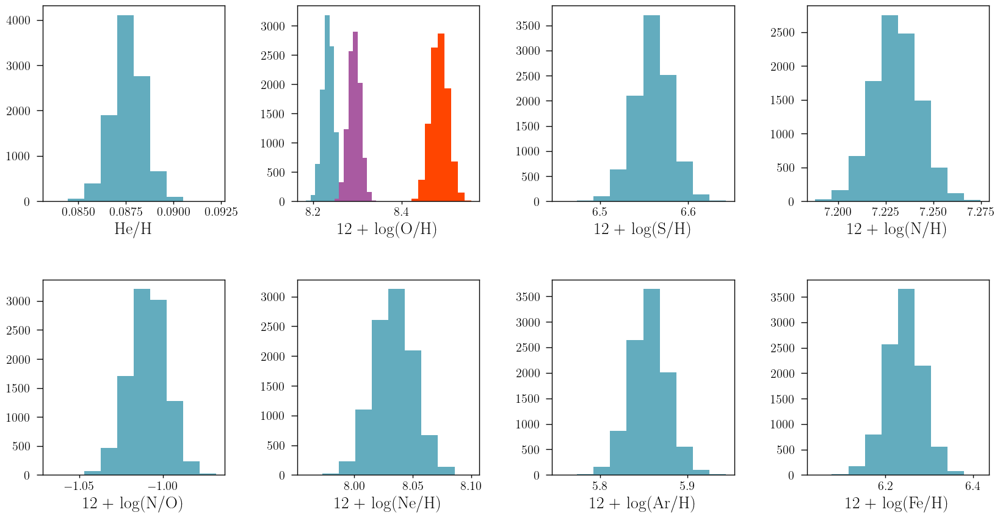

In [22]:
texPlot('on')
fig, axs = plt.subplots(2, 4)
fig.set_size_inches((20, 10))
fig.subplots_adjust(wspace=0.4, hspace=0.4)

axs[0, 0].hist(y, color=cr[2])
axs[0, 0].set_xlabel(r'He/H')

axs[0, 1].hist(log_OH_tot, color=cr[2])
axs[0, 1].hist(log_OH_G92, color='Orangered')
#axs[0, 1].hist(log_OH_PM, color='Pink')
axs[0, 1].hist(log_OH_lin, color=cz[1])
#axs[0, 1].hist(log_OH_nlin, color='Green')
#axs[0, 1].hist(log_OH_poly, color='Blue')
#axs[0, 1].hist(log_OH_sqrt, color='Gray')

axs[0, 1].set_xlabel(r'12 + log(O/H)')

axs[0, 2].hist(log_SH_tot, color=cr[2])
axs[0, 2].set_xlabel(r'12 + log(S/H)')

axs[0, 3].hist(log_NH_tot, color=cr[2])
axs[0, 3].set_xlabel(r'12 + log(N/H)')

axs[1, 0].hist(log_NO_tot, color=cr[2])
axs[1, 0].set_xlabel(r'12 + log(N/O)')

axs[1, 1].hist(log_NeH_tot, color=cr[2])
axs[1, 1].set_xlabel(r'12 + log(Ne/H)')

axs[1, 2].hist(log_ArH_tot, color=cr[2])
axs[1, 2].set_xlabel(r'12 + log(Ar/H)')

axs[1, 3].hist(log_FeH_tot, color=cr[2])
axs[1, 3].set_xlabel(r'12 + log(Fe/H)')

In [23]:
He_tot_mean = np.nanpercentile(y, 50)
He_tot_16 = np.nanpercentile(y, 16)
He_tot_84 = np.nanpercentile(y, 84)

log_OH_tot_mean = np.nanpercentile(log_OH_tot, 50)
log_OH_tot_16 = np.nanpercentile(log_OH_tot, 16)
log_OH_tot_84 = np.nanpercentile(log_OH_tot, 84)

log_OH_G92_mean = np.nanpercentile(log_OH_G92, 50)
log_OH_G92_16 = np.nanpercentile(log_OH_G92, 16)
log_OH_G92_84 = np.nanpercentile(log_OH_G92, 84)

#log_OH_PM_mean = np.nanpercentile(log_OH_PM, 50)
#log_OH_PM_16 = np.nanpercentile(log_OH_PM, 16)
#log_OH_PM_84 = np.nanpercentile(log_OH_PM, 84)

log_OH_lin_mean = np.nanpercentile(log_OH_lin, 50)
log_OH_lin_16 = np.nanpercentile(log_OH_lin, 16)
log_OH_lin_84 = np.nanpercentile(log_OH_lin, 84)

#log_OH_nlin_mean = np.nanpercentile(log_OH_nlin, 50)
#log_OH_nlin_16 = np.nanpercentile(log_OH_nlin, 16)
#log_OH_nlin_84 = np.nanpercentile(log_OH_nlin, 84)

#log_OH_poly_mean = np.nanpercentile(log_OH_poly, 50)
#log_OH_poly_16 = np.nanpercentile(log_OH_poly, 16)
#log_OH_poly_84 = np.nanpercentile(log_OH_poly, 84)

#log_OH_sqrt_mean = np.nanpercentile(log_OH_sqrt, 50)
#log_OH_sqrt_16 = np.nanpercentile(log_OH_sqrt, 16)
#log_OH_sqrt_84 = np.nanpercentile(log_OH_sqrt, 84)

log_SH_tot_mean = np.nanpercentile(log_SH_tot, 50)
log_SH_tot_16 = np.nanpercentile(log_SH_tot, 16)
log_SH_tot_84 = np.nanpercentile(log_SH_tot, 84)

log_NH_tot_mean = np.nanpercentile(log_NH_tot, 50)
log_NH_tot_16 = np.nanpercentile(log_NH_tot, 16)
log_NH_tot_84 = np.nanpercentile(log_NH_tot, 84)

log_NO_tot_mean = np.nanpercentile(log_NO_tot, 50)
log_NO_tot_16 = np.nanpercentile(log_NO_tot, 16)
log_NO_tot_84 = np.nanpercentile(log_NO_tot, 84)

log_NeH_tot_mean = np.nanpercentile(log_NeH_tot, 50)
log_NeH_tot_16 = np.nanpercentile(log_NeH_tot, 16)
log_NeH_tot_84 = np.nanpercentile(log_NeH_tot, 84)

log_ArH_tot_mean = np.nanpercentile(log_ArH_tot, 50)
log_ArH_tot_16 = np.nanpercentile(log_ArH_tot, 16)
log_ArH_tot_84 = np.nanpercentile(log_ArH_tot, 84)

log_FeH_tot_mean = np.nanpercentile(log_FeH_tot, 50)
log_FeH_tot_16 = np.nanpercentile(log_FeH_tot, 16)
log_FeH_tot_84 = np.nanpercentile(log_FeH_tot, 84)

In [24]:
abundance_dict = {'galname': galname,
               'He/H': He_tot_mean,
               'He/H_16': He_tot_16,
               'He/H_84': He_tot_84,
               'log_OH': log_OH_tot_mean,
               'log_OH_16': log_OH_tot_16,
               'log_OH_84': log_OH_tot_84,
               'log_OH_G92': log_OH_G92_mean,
               'log_OH_G92_16': log_OH_G92_16,
               'log_OH_G92_84': log_OH_G92_84,
               #'log_OH_PM': log_OH_PM_mean,
               #'log_OH_PM_16': log_OH_PM_16,
               #'log_OH_PM_84': log_OH_PM_84,
               #'log_OH_lin': log_OH_lin_mean,
               #'log_OH_lin_16': log_OH_lin_16,
               #'log_OH_lin_84': log_OH_lin_84,
               #'log_OH_nlin': log_OH_nlin_mean,
               #'log_OH_nlin_16': log_OH_nlin_16,
               #'log_OH_nlin_84': log_OH_nlin_84,
               #'log_OH_poly': log_OH_poly_mean,
               #'log_OH_poly_16': log_OH_poly_16,
               #'log_OH_poly_84': log_OH_poly_84,
               #'log_OH_sqrt': log_OH_sqrt_mean,
               #'log_OH_sqrt_16': log_OH_sqrt_16,
               #'log_OH_sqrt_84': log_OH_sqrt_84,
               'log_SH': log_SH_tot_mean,
               'log_SH_16': log_SH_tot_16,
               'log_SH_84': log_SH_tot_84,
               'log_NH': log_NH_tot_mean,
               'log_NH_16': log_NH_tot_16,
               'log_NH_84': log_NH_tot_84,
               'log_NO': log_NO_tot_mean,
               'log_NO_16': log_NO_tot_16,
               'log_NO_84': log_NO_tot_84,
               'log_NeH': log_NeH_tot_mean,
               'log_NeH_16': log_NeH_tot_16,
               'log_NeH_84': log_NeH_tot_84,
               'log_ArH': log_ArH_tot_mean,
               'log_ArH_16': log_ArH_tot_16,
               'log_ArH_84': log_ArH_tot_84,
               'log_FeH': log_FeH_tot_mean,
               'log_FeH_16': log_FeH_tot_16,
               'log_FeH_84': log_FeH_tot_84,
}
abundance_dict_pd = pd.DataFrame(data=abundance_dict, index=[0])
save_catalog(galname, abundance_dict_pd, magePath + '/results/metals/abundance_measured_final.csv')

File does not exist, creating new catalog...
Done.


In [25]:
abundance_dict = {'galname': galname,
               'log_OH': log_OH_tot_mean,
               'log_OH_16': log_OH_tot_16,
               'log_OH_84': log_OH_tot_84,
               'log_OH_G92': log_OH_G92_mean,
               'log_OH_G92_16': log_OH_G92_16,
               'log_OH_G92_84': log_OH_G92_84,
               'log_OH_lin': log_OH_lin_mean,
               'log_OH_lin_16': log_OH_lin_16,
               'log_OH_lin_84': log_OH_lin_84,
}
abundance_dict_pd = pd.DataFrame(data=abundance_dict, index=[0])
save_catalog(galname, abundance_dict_pd, magePath + '/results/metals/abundance_estimated.csv')

Existent catalog (.csv) file.
Existent data for J0021, overwriting...
Done.


# Test for Starlight

(3200.0, 10000.0)

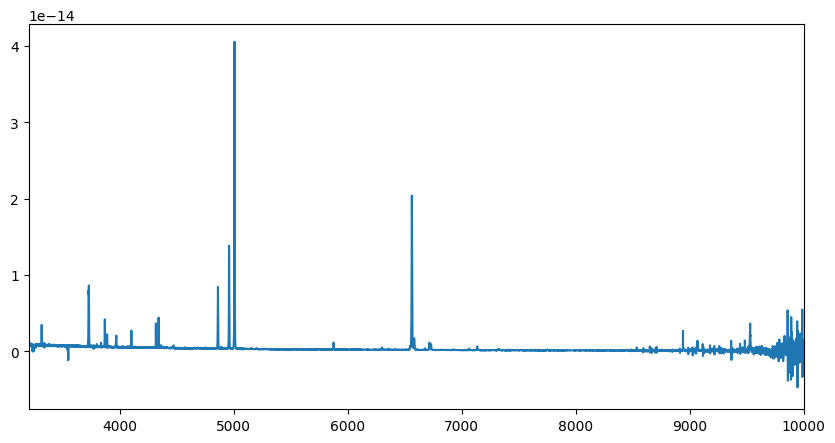

In [19]:
rf_wave = wave / (1 + z_nar_oiii_4959)
mask_spec = (rf_wave > 3300) & (rf_wave < 10000)
plt.figure(figsize=(10, 5))
plt.plot(rf_wave, flux)
plt.xlim(3200, 10000)

In [20]:
import spectres

rf_new_wave = np.arange(3300, 10000, 1)
new_flux, new_err = spectres.spectres(rf_new_wave, rf_wave, flux, err)

mask_flux = (new_flux > 0)

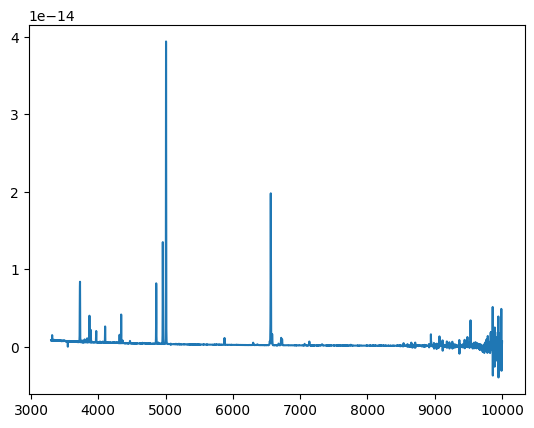

In [21]:
plt.plot(rf_new_wave, new_flux)

In [23]:
mask = False
mask_count = 0
mask_list = []
for line in wave_cat:
    if (wave_cat[line] > 3300) & (wave_cat[line] < 10000):
        sigma_line = (8.7710e-05 * (wave_cat[line] * (1 + z_nar_oiii_4959))) + 0.07086441
        sigma3 = 3 * np.sqrt(((upy.nominal_values(sigma_brd_intrinsic)**2) + (sigma_line**2)))
        lim_sup = wave_cat[line] + sigma3
        lim_inf = wave_cat[line] - sigma3
        mask_list.append([round(lim_inf), round(lim_sup)])
        mask_count += 1
        mask += (rf_new_wave > lim_inf) & (rf_new_wave < lim_sup)

In [28]:
with open('J0021_mask.cxt', 'a', newline='\n') as f:
    f.write(str(mask_count)+'\n')
    for masks in mask_list:
        f.write(str(masks[0])+' '+str(masks[1])+' '+'0\n')

In [25]:
from scipy.signal import medfilt
gpixs = np.where(abs(new_flux[~mask]-medfilt(new_flux[~mask],31))<0.7e-16)[0]

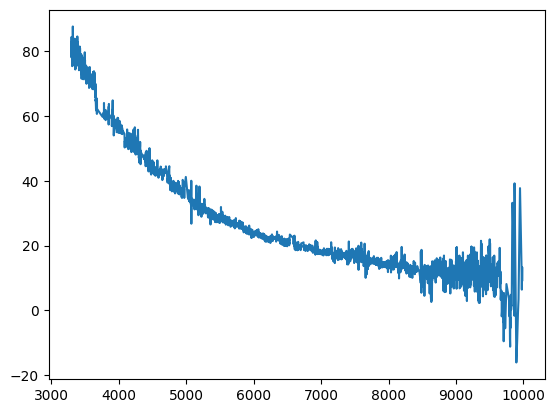

In [26]:
plt.plot(rf_new_wave[~mask][gpixs], new_flux[~mask][gpixs]/1e-17)
#plt.xlim(6500, 7000)
#plt.ylim(1e-16, 3e-16)

In [29]:
from astropy.io import ascii
for i in range(len(rf_new_wave)):
    if i in gpixs:
        flag = 0
    else:
        flag = 99
    spec_str = str(rf_new_wave[i])+' '+str(new_flux[i]/1e-17)+' '+str(new_err[i]/1e-17)+' '+str(flag)+'\n'
    with open('J0021.cxt', 'a', newline='\n') as f:
        f.write(spec_str)

# After fitting

In [26]:
with open('/home/benjamin/Documents/STARLIGHTv04/J0021/J0021.cxt.sc4.C99.im.CAL.BS', 'r') as bf:
    # limits of lines to read
    line_lims = [531, 7231]
    # To store lines
    lines = []
    norm_f = 0
    for i, line in enumerate(bf):
        # read lines inside limits
        if (i >= line_lims[0]) & (i <= line_lims[1]):
            lines.append(line.strip())
        elif i > 7231:
            # don't read after line 7 to save time
            break
#print(lines[0])

In [25]:
wl = []
input_flux = []
best_model = []
for element in lines:
    wl.append(float(element.split()[0]))
    input_flux.append(float(element.split()[1]))
    best_model.append(float(element.split()[2]))

(0.0, 5.0)

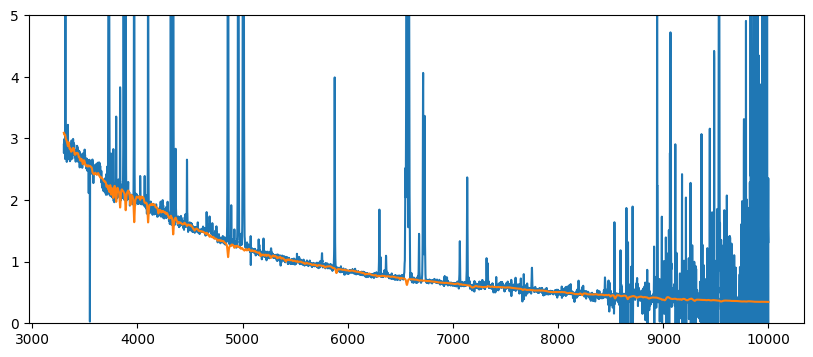

In [21]:
plt.figure(figsize=(10, 4))
plt.plot(wl, input_flux)
plt.plot(wl, best_model)
#plt.xlim(4500, 5000)
plt.ylim(0, 5)

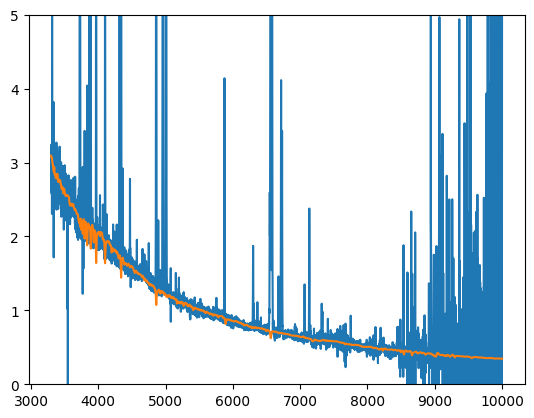

In [45]:
mask_spec = (rf_wave > 3300) & (rf_wave < 10000)
plt.plot(rf_wave[mask_spec], flux[mask_spec] / 2.828721E+01 / 1e-17)
plt.ylim(0, 5)
res_model = spectres.spectres(rf_wave[mask_spec], np.array(wl), np.array(best_model))
plt.plot(rf_wave[mask_spec], res_model)

(4800.0, 4900.0)

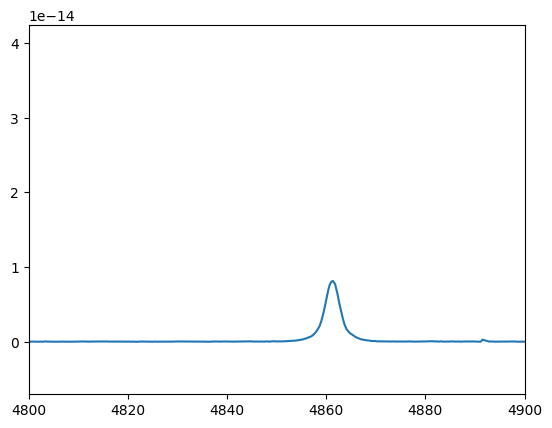

In [48]:
plt.plot(rf_wave[mask_spec], ((flux[mask_spec] / 2.828721E+01 / 1e-17) - res_model) * 2.828721E+01 * 1e-17)
plt.xlim(4800, 4900)

In [23]:
np.log10(9.12682E+04 * 1e-17 * (1/3.826e33) * 4 * np.pi * ((1.410154655e+27)**2))

9.775317874492087

In [19]:
z_nar_oiii_4959

0.09867719705615696

In [21]:
FWHM(sigma_nar_oiii_4959, wave_cat['[OIII]4959'])

193.2136322343019